In [1]:
import re
from collections import Counter
import pandas as pd
import numpy as np
import ast
import sys

import seaborn as sns
import matplotlib.pyplot as plt
import sys

In [2]:
sys.setrecursionlimit(10**6)

# Функция предобработки данных

In [3]:
def checkExtraSpaces(snippet):
    number_of_spaces_to_remove = re.search('\S', snippet.split('\n')[0]).start(0)
    return number_of_spaces_to_remove > 0


def removeExtraSpaces(snippet):
    number_of_spaces_to_remove = re.search('\S', snippet.split('\n')[0]).start(0)
    return '\n'.join([snippet_line[number_of_spaces_to_remove:] 
                      for snippet_line in snippet.split('\n')])

# Загрузка данных о корректном коде

In [3]:
path_to_data = '/home/kks/zephyr_data/stable_code/'
source_code_data = pd.read_pickle(path_to_data + 'all_stable_code_.pickle')

Число сниппетов корректного кода в датасете:

In [3]:
source_code_data.shape[0]

5521685

In [4]:
source_code_data['actual_function_name'] = source_code_data['function_name'].apply(lambda x: x.split('.')[-1] if isinstance(x, str) else np.nan)
source_code_data['class_name'] = source_code_data['function_name'].apply(lambda x: x.split('.')[0] if isinstance(x, str) and (len(x.split('.')) == 2) else np.nan)

# Распределение сниппетов по функциям и методам

Количество методов:

In [5]:
source_code_data['class_name'].notna().sum()

4064858

Таким образом, основную долю сниппетов с корректным кодом составляют методы.

Теперь количество функций:

In [6]:
source_code_data['class_name'].isna().sum()

1456827

Количество private-методов:

In [7]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]
methods_data['actual_function_name'].apply(lambda x: x.startswith('__') and (not x.endswith('__'))).sum()

32053

Количество protected-методов:

In [8]:
methods_data['actual_function_name'].apply(lambda x: (len(x) > 1) and (x[0] == '_') and (x[1] != '_')).sum()

546175

Число методов с именем из одного символа.

In [9]:
methods_data['actual_function_name'].apply(lambda x: len(x) == 1).sum()

4852

Число декорированных методов:

In [ ]:
#methods_data['before_merge'].apply(lambda x: x.startswith('@')).sum()

Число свойств (атрибутов), getters:

In [ ]:
#methods_data['before_merge'].apply(lambda x: x.startswith('@property')).sum()

Число сеттеров:

In [ ]:
#methods_data['before_merge'].apply(lambda x: x.startswith('@') and x.split()[0].endswith('.setter')).sum()

Число классовых методов:

In [ ]:
#methods_data['before_merge'].apply(lambda x: x.startswith('@classmethod')).sum()

Число статических методов:

In [ ]:
#methods_data['before_merge'].apply(lambda x: x.startswith('@staticmethod')).sum()

Число специальных методов `__funcname__`:

In [10]:
methods_data['actual_function_name'].apply(lambda x: x.startswith('__') and x.endswith('__')).sum()

727576

Число конструкторов:

In [11]:
methods_data['actual_function_name'].apply(lambda x: x == '__init__').sum()

514296

Какие бывают еще специальные функции в датасете с учетом частоты:

In [12]:
special_methods_data = methods_data.loc[methods_data['actual_function_name'].apply(lambda x:  x.startswith('__') and 
                                                                                               x.endswith('__') and 
                                                                                               x != '__init__'), 
                                        'actual_function_name']
df = special_methods_data.value_counts()

for func_name, func_count in zip(df.index, df):
    print(func_name, func_count)

__repr__ 31456
__str__ 29084
__call__ 24193
__eq__ 13986
__getitem__ 11790
__iter__ 8204
__len__ 6337
__getattr__ 5190
__new__ 5047
__setitem__ 4586
__hash__ 4332
__exit__ 4080
__contains__ 3985
__enter__ 3310
__ne__ 3292
__del__ 2570
__unicode__ 2549
__add__ 2356
__delitem__ 2168
__lt__ 2154
__getstate__ 2098
__setattr__ 1983
__setstate__ 1967
__get__ 1438
__next__ 1400
__mul__ 1363
__sub__ 1217
__bool__ 1132
__gt__ 1126
__copy__ 960
__le__ 918
__reduce__ 889
__ge__ 879
__deepcopy__ 863
__set__ 816
__radd__ 688
__post_init__ 670
__iadd__ 653
__or__ 624
__neg__ 603
__truediv__ 579
__and__ 524
__rmul__ 520
__nonzero__ 519
__aenter__ 495
__getattribute__ 492
__dir__ 468
__pow__ 463
__cmp__ 432
__rsub__ 431
__delattr__ 367
__invert__ 363
__bytes__ 355
__aexit__ 355
__div__ 346
__int__ 326
__imul__ 296
__isub__ 294
__classcall_private__ 294
__mod__ 282
__missing__ 275
__attrs_post_init__ 269
__abs__ 269
__rtruediv__ 256
__reversed__ 250
__xor__ 236
__floordiv__ 228
__float__ 202
__array__ 

__default_ambig__ 1
__get_skill__ 1
__grab_data__ 1
__discriminator__ 1
__check_manifest__ 1
__gerrit_ssh__ 1
__get_file_index_objects__ 1
__public_login__ 1
__pack__ 1
__batch_pending_events__ 1
__YELLOW_LED__ 1
__mermaid_str__ 1
__createImages__ 1
__flow__ 1
__check_migrations__ 1
__1D_with_error__ 1
__compound__ 1
__getcmsinfo__ 1
__args__ 1
__defineSetter__ 1
__mudimen__ 1
__infer_channel_exclusive_batch_shape__ 1
__as_temporarily_immutable__ 1
__execute_block__ 1
__get_name__ 1
__writeMPS__ 1
__check_consecutive__ 1
__fetch_release__ 1
__apply_system_defaults__ 1
__DOG_LEFT_EAR_FILTER__ 1
__open_part_file__ 1
__check_input_parameter__ 1
__get_keep_cards__ 1
__preparable_set__ 1
__remove__ 1
__getNearestNeighbors__ 1
__output_xml_section__ 1
__IOT_TOPIC__ 1
__jsontype__ 1
__clean_on_fork__ 1
__change_units__ 1
__subgraph__ 1
__rc__ 1
__do_comp__ 1
__getval__ 1
__hashbytearray__ 1
__get_scores__ 1
__var__ 1
__destroy_parse_datasets__ 1
__is_compute_scores__ 1
__repn__ 1
__mb_usage_w

__then__ 1
__phil_path_and_value__ 1
__classsourcerepr__ 1
__serialize__ 1
__merge_nested__ 1
__filterCfgGadgetsProgress__ 1
__mb_name__ 1
__to_myia__ 1
__convolve_block__ 1
__launch__ 1
__metadata__ 1
__objcFilePicker__ 1
__get_public_state_history__ 1
__terminal_ci__ 1
__pdoc__ 1
__update_standard_attributes__ 1
__ogm__ 1
__del__hoge__ 1
__nearest_rtree__ 1
__solveEdgeCost__ 1
__getQualityString__ 1
__IOT_CLIENT_ID_REQUESTER__ 1
__QUEUE_URL__ 1
__log__ 1
__evaluateMoment__ 1
__discretize_gh__ 1
__permute_data__ 1
__get_price__ 1
__primaryvalue__ 1
__total_quantity__ 1
__construct_direct__ 1
__info_eq__ 1
__is_present_proto__ 1
__detitem__ 1
__nw_init_info_structure__ 1
__get_number__ 1
__get_action_requester_id__ 1
__append_element__ 1
__route__ 1
__check_variable_array__ 1
__getmutable__ 1
__GetDefaultNumpyType__ 1
__class_getitem_hook__ 1
__get_playerid_action_history__ 1
__status_changes__ 1
__setStreamHandler__ 1
__matchkey__ 1
__internal_new__ 1
__remove_element__ 1
__geo_transf

Наиболее часто встречающиеся специальные функции, неконструкторы - это `__repr__`, `__str__` и `__call__`.

Количество непубличных функций:

In [13]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]
functions_data['actual_function_name'].apply(lambda x: ((not isinstance(x, float)) and (len(x) > 1) and (x.startswith('_')))).sum()

195431

Количество декорированных функций:

In [ ]:
#functions_data['before_merge'].apply(lambda x: x.startswith('@')).sum()

Количество специальных функций:

In [14]:
functions_data['actual_function_name'].apply(lambda x: (not isinstance(x, float)) and x.startswith('__') and x.endswith('__')).sum()

15460

Количество функций `__init__`:

In [15]:
functions_data['actual_function_name'].apply(lambda x: x == '__init__').sum()

8813

Таким образом, функции `__init__` и конструкторы очень часто встречаются среди специальных функций.

Количество асинхронных функций и методов:

In [16]:
source_code_data['before_merge'].apply(lambda x: 'async def' in x.split('\n')[0] if len(x.split('\n')) == 1 else
                                       ('async def' in x.split('\n')[0]) or ('async def' in x.split('\n')[1])).sum()

113679

# Общая длина кода в символах

In [28]:
source_code_data['code_length_before'] = source_code_data['before_merge'].apply(lambda x: len(x))

Подсчитаем статистики по коду:

In [18]:
print(f'Среднее значение длины сниппетов равно {source_code_data["code_length_before"].mean()}.')
print(f'Медиана длины сниппетов равна {source_code_data["code_length_before"].median()}.')
print(f'С.к.о длины сниппетов равно {source_code_data["code_length_before"].std()}.')
print(f'25-й персентиль длины сниппетов равен {source_code_data["code_length_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины сниппетов равен {source_code_data["code_length_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины сниппетов равен {source_code_data["code_length_before"].quantile(q=0.90)}.')
print(f'Минимум длины сниппетов равен {source_code_data["code_length_before"].min()}.')
print(f'Максимум длины сниппетов равен {source_code_data["code_length_before"].max()}.')

Среднее значение длины сниппетов равно 704.8677889086393.
Медиана длины сниппетов равна 322.0.
С.к.о длины сниппетов равно 4089.2725627555706.
25-й персентиль длины сниппетов равен 151.0.
75-й персентиль длины сниппетов равен 734.0.
90-й персентиль длины сниппетов равен 1596.0.
Минимум длины сниппетов равен 13.
Максимум длины сниппетов равен 6804973.


Теперь отдельно по методам:

In [19]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]

In [20]:
print(f'Среднее значение длины сниппетов равно {methods_data["code_length_before"].mean()}.')
print(f'Медиана длины сниппетов равна {methods_data["code_length_before"].median()}.')
print(f'С.к.о длины сниппетов равно {methods_data["code_length_before"].std()}.')
print(f'25-й персентиль длины сниппетов равен {methods_data["code_length_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины сниппетов равен {methods_data["code_length_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины сниппетов равен {methods_data["code_length_before"].quantile(q=0.90)}.')
print(f'Минимум длины сниппетов равен {methods_data["code_length_before"].min()}.')
print(f'Максимум длины сниппетов равен {methods_data["code_length_before"].max()}.')

Среднее значение длины сниппетов равно 628.2764805068222.
Медиана длины сниппетов равна 291.0.
С.к.о длины сниппетов равно 2397.6674998193707.
25-й персентиль длины сниппетов равен 137.0.
75-й персентиль длины сниппетов равен 653.0.
90-й персентиль длины сниппетов равен 1440.0.
Минимум длины сниппетов равен 13.
Максимум длины сниппетов равен 2918901.


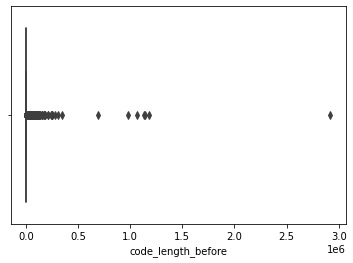

In [21]:
sns.boxplot(x='code_length_before',
            data=methods_data);

Теперь удалим выбросы:

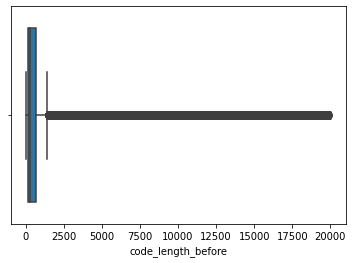

In [22]:
sns.boxplot(x='code_length_before',
            data=methods_data.loc[methods_data['code_length_before'] < 20000]);

Теперь по функциям:

In [23]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]

In [24]:
print(f'Среднее значение длины сниппетов равно {functions_data["code_length_before"].mean()}.')
print(f'Медиана длины сниппетов равна {functions_data["code_length_before"].median()}.')
print(f'С.к.о длины сниппетов равно {functions_data["code_length_before"].std()}.')
print(f'25-й персентиль длины сниппетов равен {functions_data["code_length_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины сниппетов равен {functions_data["code_length_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины сниппетов равен {functions_data["code_length_before"].quantile(q=0.90)}.')
print(f'Минимум длины сниппетов равен {functions_data["code_length_before"].min()}.')
print(f'Максимум длины сниппетов равен {functions_data["code_length_before"].max()}.')

Среднее значение длины сниппетов равно 918.5738725325656.
Медиана длины сниппетов равна 434.0.
С.к.о длины сниппетов равно 6875.90700873853.
25-й персентиль длины сниппетов равен 205.0.
75-й персентиль длины сниппетов равен 963.0.
90-й персентиль длины сниппетов равен 1957.0.
Минимум длины сниппетов равен 14.
Максимум длины сниппетов равен 6804973.


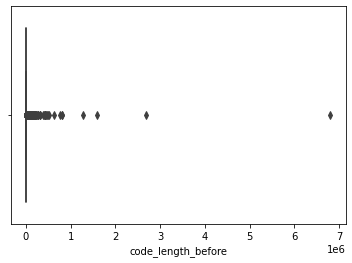

In [25]:
sns.boxplot(x='code_length_before',
            data=functions_data);

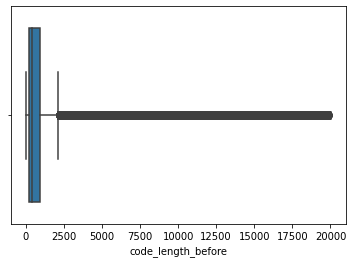

In [26]:
sns.boxplot(x='code_length_before',
            data=functions_data.loc[functions_data['code_length_before'] < 20000]);

Для функций получается, что их длина несколько больше, чем для методов.

# Длина кода без докстрингов и комментариев в символах

In [27]:
source_code_data['code_length_wd_before'] = source_code_data['before_merge_without_docstrings'].apply(lambda x: len(x))

Подсчитаем статистики по коду:

In [28]:
print(f'Среднее значение длины сниппетов равно {source_code_data["code_length_wd_before"].mean()}.')
print(f'Медиана длины сниппетов равна {source_code_data["code_length_wd_before"].median()}.')
print(f'С.к.о длины сниппетов равно {source_code_data["code_length_wd_before"].std()}.')
print(f'25-й персентиль длины сниппетов равен {source_code_data["code_length_wd_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины сниппетов равен {source_code_data["code_length_wd_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины сниппетов равен {source_code_data["code_length_wd_before"].quantile(q=0.90)}.')
print(f'Минимум длины сниппетов равен {source_code_data["code_length_wd_before"].min()}.')
print(f'Максимум длины сниппетов равен {source_code_data["code_length_wd_before"].max()}.')

Среднее значение длины сниппетов равно 545.3450030199115.
Медиана длины сниппетов равна 243.0.
С.к.о длины сниппетов равно 4006.751128553404.
25-й персентиль длины сниппетов равен 112.0.
75-й персентиль длины сниппетов равен 558.0.
90-й персентиль длины сниппетов равен 1220.0.
Минимум длины сниппетов равен 12.
Максимум длины сниппетов равен 6804973.


Теперь отдельно по методам:

In [29]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]

In [30]:
print(f'Среднее значение длины сниппетов равно {methods_data["code_length_wd_before"].mean()}.')
print(f'Медиана длины сниппетов равна {methods_data["code_length_wd_before"].median()}.')
print(f'С.к.о длины сниппетов равно {methods_data["code_length_wd_before"].std()}.')
print(f'25-й персентиль длины сниппетов равен {methods_data["code_length_wd_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины сниппетов равен {methods_data["code_length_wd_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины сниппетов равен {methods_data["code_length_wd_before"].quantile(q=0.90)}.')
print(f'Минимум длины сниппетов равен {methods_data["code_length_wd_before"].min()}.')
print(f'Максимум длины сниппетов равен {methods_data["code_length_wd_before"].max()}.')

Среднее значение длины сниппетов равно 484.427595010699.
Медиана длины сниппетов равна 216.0.
С.к.о длины сниппетов равно 2298.5289431095116.
25-й персентиль длины сниппетов равен 99.0.
75-й персентиль длины сниппетов равен 500.0.
90-й персентиль длины сниппетов равен 1112.0.
Минимум длины сниппетов равен 12.
Максимум длины сниппетов равен 2918901.


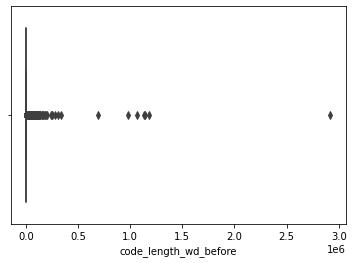

In [31]:
sns.boxplot(x='code_length_wd_before',
            data=methods_data);

Теперь удалим выбросы:

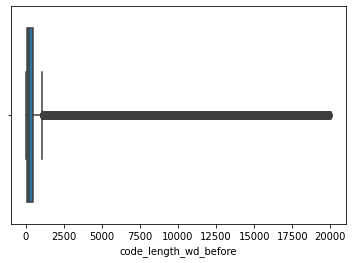

In [32]:
sns.boxplot(x='code_length_wd_before',
            data=methods_data.loc[methods_data['code_length_wd_before'] < 20000]);

Теперь по функциям:

In [33]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]

In [34]:
print(f'Среднее значение длины сниппетов равно {functions_data["code_length_wd_before"].mean()}.')
print(f'Медиана длины сниппетов равна {functions_data["code_length_wd_before"].median()}.')
print(f'С.к.о длины сниппетов равно {functions_data["code_length_wd_before"].std()}.')
print(f'25-й персентиль длины сниппетов равен {functions_data["code_length_wd_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины сниппетов равен {functions_data["code_length_wd_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины сниппетов равен {functions_data["code_length_wd_before"].quantile(q=0.90)}.')
print(f'Минимум длины сниппетов равен {functions_data["code_length_wd_before"].min()}.')
print(f'Максимум длины сниппетов равен {functions_data["code_length_wd_before"].max()}.')

Среднее значение длины сниппетов равно 715.3175620715432.
Медиана длины сниппетов равна 325.0.
С.к.о длины сниппетов равно 6787.320282948276.
25-й персентиль длины сниппетов равен 161.0.
75-й персентиль длины сниппетов равен 718.0.
90-й персентиль длины сниппетов равен 1482.0.
Минимум длины сниппетов равен 14.
Максимум длины сниппетов равен 6804973.


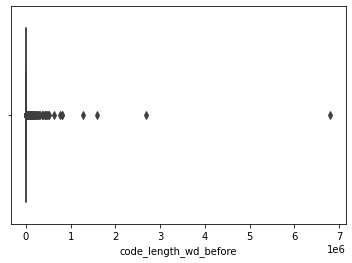

In [35]:
sns.boxplot(x='code_length_wd_before',
            data=functions_data);

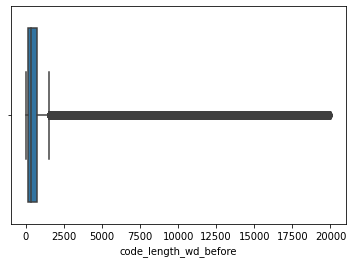

In [36]:
sns.boxplot(x='code_length_wd_before',
            data=functions_data.loc[functions_data['code_length_wd_before'] < 20000]);

Для функций получается, что их длина несколько больше, чем для методов.

# Распределение по числу аргументов функций и методов



In [14]:
from radon.visitors import ComplexityVisitor


def refineSnippet(snippet):
    try:
        ComplexityVisitor.from_code(snippet)
        return snippet
    except:
        try:
            snippet_with_removed_extra_spaces = removeExtraSpaces(snippet)
            ComplexityVisitor.from_code(snippet_with_removed_extra_spaces)
            return snippet_with_removed_extra_spaces
        except:
            return np.nan

In [15]:
def getArgumentsCount(snippet):
    try:
        for node in ast.parse(snippet).body:
            if isinstance(node, tuple({ast.FunctionDef:'Function',
                                       ast.AsyncFunctionDef:'AsyncFunction'})):
                return len(node.args.args)
    except SyntaxError:
        return np.nan

In [16]:
source_code_data = source_code_data.loc[source_code_data['before_merge'].notna()]

In [17]:
source_code_data['number_of_arguments_before'] = source_code_data['before_merge'].apply(getArgumentsCount)

Подсчитаем статистики по коду:

In [43]:
print(f'Среднее значение числа аргументов равно {source_code_data["number_of_arguments_before"].mean()}.')
print(f'Медиана числа аргументов равна {source_code_data["number_of_arguments_before"].median()}.')
print(f'Мода числа аргументов равна {source_code_data["number_of_arguments_before"].mode()[0]} с частотой {source_code_data["number_of_arguments_before"].value_counts()[0]}.')
print(f'С.к.о числа аргументов равно {source_code_data["number_of_arguments_before"].std()}.')
print(f'25-й персентиль числа аргументов равен {source_code_data["number_of_arguments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа аргументов равен {source_code_data["number_of_arguments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа аргументов равен {source_code_data["number_of_arguments_before"].quantile(q=0.90)}.')
print(f'Минимум числа аргументов равен {source_code_data["number_of_arguments_before"].min()}.')
print(f'Максимум числа аргументов равен {source_code_data["number_of_arguments_before"].max()}.')

Среднее значение числа аргументов равно 2.191473336899624.
Медиана числа аргументов равна 2.0.
Мода числа аргументов равна 1.0 с частотой 245503.
С.к.о числа аргументов равно 1.999490343739252.
25-й персентиль числа аргументов равен 1.0.
75-й персентиль числа аргументов равен 3.0.
90-й персентиль числа аргументов равен 4.0.
Минимум числа аргументов равен 0.0.
Максимум числа аргументов равен 193.0.


Наиболее частое число аргументов равно 1.

Теперь отдельно по методам:

In [44]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]

In [45]:
print(f'Среднее значение числа аргументов равно {methods_data["number_of_arguments_before"].mean()}.')
print(f'Медиана числа аргументов равна {methods_data["number_of_arguments_before"].median()}.')
print(f'Мода числа аргументов равна {methods_data["number_of_arguments_before"].mode()[0]} с частотой {methods_data["number_of_arguments_before"].value_counts()[0]}.')
print(f'С.к.о числа аргументов равно {methods_data["number_of_arguments_before"].std()}.')
print(f'25-й персентиль числа аргументов равен {methods_data["number_of_arguments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа аргументов равен {methods_data["number_of_arguments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа аргументов равен {methods_data["number_of_arguments_before"].quantile(q=0.90)}.')
print(f'Минимум числа аргументов равен {methods_data["number_of_arguments_before"].min()}.')
print(f'Максимум числа аргументов равен {methods_data["number_of_arguments_before"].max()}.')

Среднее значение числа аргументов равно 2.2537619690610913.
Медиана числа аргументов равна 2.0.
Мода числа аргументов равна 1.0 с частотой 31672.
С.к.о числа аргументов равно 1.922549273142498.
25-й персентиль числа аргументов равен 1.0.
75-й персентиль числа аргументов равен 3.0.
90-й персентиль числа аргументов равен 4.0.
Минимум числа аргументов равен 0.0.
Максимум числа аргументов равен 193.0.


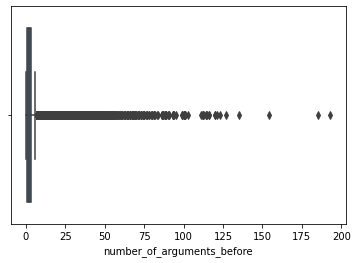

In [46]:
sns.boxplot(x='number_of_arguments_before',
            data=methods_data);

Теперь удалим выбросы:

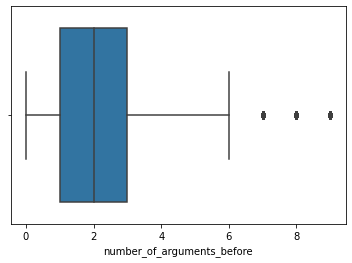

In [47]:
sns.boxplot(x='number_of_arguments_before',
            data=methods_data.loc[methods_data['number_of_arguments_before'] < 10]);

Теперь по функциям:

In [48]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]

In [49]:
print(f'Среднее значение числа аргументов равно {functions_data["number_of_arguments_before"].mean()}.')
print(f'Медиана числа аргументов равна {functions_data["number_of_arguments_before"].median()}.')
print(f'Мода числа аргументов равна {functions_data["number_of_arguments_before"].mode()[0]} с частотой {functions_data["number_of_arguments_before"].value_counts()[0]}.')
print(f'С.к.о числа аргументов равно {functions_data["number_of_arguments_before"].std()}.')
print(f'25-й персентиль числа аргументов равен {functions_data["number_of_arguments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа аргументов равен {functions_data["number_of_arguments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа аргументов равен {functions_data["number_of_arguments_before"].quantile(q=0.90)}.')
print(f'Минимум числа аргументов равен {functions_data["number_of_arguments_before"].min()}.')
print(f'Максимум числа аргументов равен {functions_data["number_of_arguments_before"].max()}.')

Среднее значение числа аргументов равно 2.018011814267197.
Медиана числа аргументов равна 1.0.
Мода числа аргументов равна 1.0 с частотой 213831.
С.к.о числа аргументов равно 2.1903035340536956.
25-й персентиль числа аргументов равен 1.0.
75-й персентиль числа аргументов равен 3.0.
90-й персентиль числа аргументов равен 4.0.
Минимум числа аргументов равен 0.0.
Максимум числа аргументов равен 136.0.


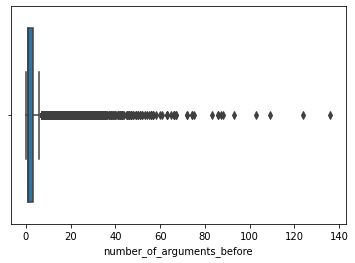

In [50]:
sns.boxplot(x='number_of_arguments_before',
            data=functions_data);

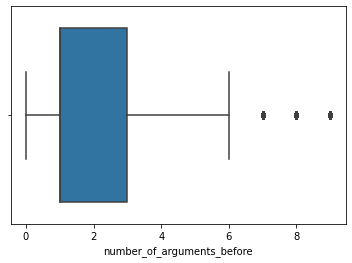

In [51]:
sns.boxplot(x='number_of_arguments_before',
            data=functions_data.loc[functions_data['number_of_arguments_before'] < 10]);

Для функций получается, что число аргументов немного меньше, чем для методов.

# Распределение по числу присвоений в реализации функций и методов

В коде встречаются три типа операций присвоения значений переменной: 

- простое присвоение a=b, (a, b) = f(x)
- присвоение значения атрибуту a.x=5 или a.b.c.d = 7
- присвоение значение индексированному элементу a.b[x].c=7

Ниже анализируются признаки, соответствующие числу присвоений первого и второго типа.

Функции, вычисляют левую часть выражения присвоения первого и второго типа.

In [18]:
def checkOnSimpleAssignment(node):
    names = set()
    for item in node.targets:
        if isinstance(item, ast.Tuple):
            for subitem in item.elts:
                if isinstance(subitem, ast.Name):
                    names.add(subitem.id)
        elif isinstance(item, ast.Name):
            names.add(item.id)
    return names

In [19]:
def checkOnSimpleAttributeAssignment(node):
    names = set()
    for item in node.targets:
        if isinstance(item, ast.Tuple):
            for subitem in item.elts:
                if isinstance(subitem, ast.Attribute):
                    term = ''
                    while isinstance(subitem, ast.Attribute):
                        term = subitem.attr + '.' + term
                        subitem = subitem.value
                    if isinstance(subitem, ast.Name):
                        term = subitem.id + '.' + term.strip('.')
                        names.add(term)
        elif isinstance(item, ast.Attribute):
            term = ''
            while isinstance(item, ast.Attribute):
                term = item.attr + '.' + term
                item = item.value
            if isinstance(item, ast.Name):
                term = item.id + '.' + term.strip('.')
                names.add(term)
    return names

Описывается visitor-класс, который позволяет обходит AST-дерево и ищет все узлы, отвечающие операции присвоения.

In [20]:
class VisitSimpleAssigments(ast.NodeVisitor):
    def __init__(self):
        self.simple_assignments = set()
        self.number_of_simple_assignments = 0
        super().__init__()
        
    def generic_visit(self, node):
        if isinstance(node, ast.Assign):
            self.simple_assignments |= checkOnSimpleAssignment(node)
            self.number_of_simple_assignments = len(self.simple_assignments)
        ast.NodeVisitor.generic_visit(self, node)

In [21]:
class VisitAttributeAssigments(ast.NodeVisitor):
    def __init__(self):
        self.attribute_assignments = set()
        self.number_of_attribute_assignments = 0
        super().__init__()
        
    def generic_visit(self, node):
        try:
            if isinstance(node, ast.Assign):
                self.attribute_assignments |= checkOnSimpleAttributeAssignment(node)
                self.number_of_attribute_assignments = len(self.attribute_assignments)
            ast.NodeVisitor.generic_visit(self, node)
        except RecursionError:
            pass

Функции вычисления количества присвоений первого и второго типа.

In [22]:
def getSimpleAssignmentsCount(snippet):
    visit_simple_assignments = VisitSimpleAssigments()
    try:
        visit_simple_assignments.visit(ast.parse(snippet))
        return visit_simple_assignments.number_of_simple_assignments
    except SyntaxError:
        return np.nan

In [23]:
def getSimpleAttributeAssignmentsCount(snippet):
    visit_attribute_assignments = VisitAttributeAssigments()
    try:
        visit_attribute_assignments.visit(ast.parse(snippet))
        return visit_attribute_assignments.number_of_attribute_assignments
    except SyntaxError:
        return np.nan

Подсчитаем значения признаков для кода:

In [50]:
source_code_data['number_of_distinct_simple_assignments_before'] = source_code_data['before_merge'].apply(getSimpleAssignmentsCount)

In [51]:
source_code_data['number_of_distinct_attribute_assignments_before'] = source_code_data['before_merge'].apply(getSimpleAttributeAssignmentsCount)

## Распределение по числу простых присвоений

Подсчитаем статистики по числу присвоений первого типа по коду:

In [71]:
print(f'Среднее значение числа простых присвоений равно {source_code_data["number_of_distinct_simple_assignments_before"].mean()}.')
print(f'Медиана числа простых присвоений равна {source_code_data["number_of_distinct_simple_assignments_before"].median()}.')
print(f'Мода числа простых присвоений равна {source_code_data["number_of_distinct_simple_assignments_before"].mode()[0]} с частотой {source_code_data["number_of_distinct_simple_assignments_before"].value_counts()[0]}.')
print(f'С.к.о числа простых присвоений равно {source_code_data["number_of_distinct_simple_assignments_before"].std()}.')
print(f'25-й персентиль числа простых присвоений равен {source_code_data["number_of_distinct_simple_assignments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа простых присвоений равен {source_code_data["number_of_distinct_simple_assignments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа простых присвоений равен {source_code_data["number_of_distinct_simple_assignments_before"].quantile(q=0.90)}.')
print(f'Минимум числа простых присвоений равен {source_code_data["number_of_distinct_simple_assignments_before"].min()}.')
print(f'Максимум числа простых присвоений равен {source_code_data["number_of_distinct_simple_assignments_before"].max()}.')

Среднее значение числа простых присвоений равно 2.0684635256100834.
Медиана числа простых присвоений равна 1.0.
Мода числа простых присвоений равна 0.0 с частотой 2693236.
С.к.о числа простых присвоений равно 4.690322736255181.
25-й персентиль числа простых присвоений равен 0.0.
75-й персентиль числа простых присвоений равен 2.0.
90-й персентиль числа простых присвоений равен 6.0.
Минимум числа простых присвоений равен 0.0.
Максимум числа простых присвоений равен 2468.0.


Теперь по методам:

In [72]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]

In [75]:
print(f'Среднее значение числа простых присвоений равно {methods_data["number_of_distinct_simple_assignments_before"].mean()}.')
print(f'Медиана числа простых присвоений равна {methods_data["number_of_distinct_simple_assignments_before"].median()}.')
print(f'Мода числа простых присвоений равна {methods_data["number_of_distinct_simple_assignments_before"].mode()[0]} с частотой {methods_data["number_of_distinct_simple_assignments_before"].value_counts()[0]}.')
print(f'С.к.о числа простых присвоений равно {methods_data["number_of_distinct_simple_assignments_before"].std()}.')
print(f'25-й персентиль числа простых присвоений равен {methods_data["number_of_distinct_simple_assignments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа простых присвоений равен {methods_data["number_of_distinct_simple_assignments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа простых присвоений равен {methods_data["number_of_distinct_simple_assignments_before"].quantile(q=0.90)}.')
print(f'Минимум числа простых присвоений равен {methods_data["number_of_distinct_simple_assignments_before"].min()}.')
print(f'Максимум числа простых присвоений равен {methods_data["number_of_distinct_simple_assignments_before"].max()}.')

Среднее значение числа простых присвоений равно 1.7042121085640283.
Медиана числа простых присвоений равна 0.0.
Мода числа простых присвоений равна 0.0 с частотой 2227083.
С.к.о числа простых присвоений равно 3.6245029510172295.
25-й персентиль числа простых присвоений равен 0.0.
75-й персентиль числа простых присвоений равен 2.0.
90-й персентиль числа простых присвоений равен 5.0.
Минимум числа простых присвоений равен 0.0.
Максимум числа простых присвоений равен 455.0.


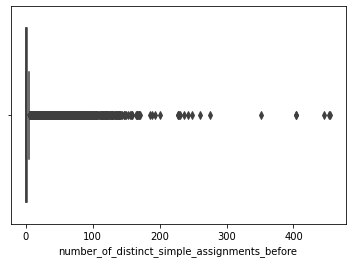

In [76]:
sns.boxplot(x='number_of_distinct_simple_assignments_before',
            data=methods_data);

Удалим выбросы:

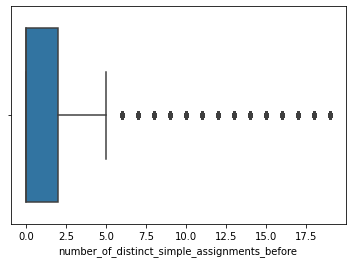

In [77]:
sns.boxplot(x='number_of_distinct_simple_assignments_before',
            data=methods_data.loc[methods_data['number_of_distinct_simple_assignments_before'] < 20]);

Теперь по функциям:

In [78]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]

In [79]:
print(f'Среднее значение числа простых присвоений равно {functions_data["number_of_distinct_simple_assignments_before"].mean()}.')
print(f'Медиана числа простых присвоений равна {functions_data["number_of_distinct_simple_assignments_before"].median()}.')
print(f'Мода числа простых присвоений равна {functions_data["number_of_distinct_simple_assignments_before"].mode()[0]} с частотой {functions_data["number_of_distinct_simple_assignments_before"].value_counts()[0]}.')
print(f'С.к.о числа простых присвоений равно {functions_data["number_of_distinct_simple_assignments_before"].std()}.')
print(f'25-й персентиль числа простых присвоений равен {functions_data["number_of_distinct_simple_assignments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа простых присвоений равен {functions_data["number_of_distinct_simple_assignments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа простых присвоений равен {functions_data["number_of_distinct_simple_assignments_before"].quantile(q=0.90)}.')
print(f'Минимум числа простых присвоений равен {functions_data["number_of_distinct_simple_assignments_before"].min()}.')
print(f'Максимум числа простых присвоений равен {functions_data["number_of_distinct_simple_assignments_before"].max()}.')

Среднее значение числа простых присвоений равно 3.082831689258958.
Медиана числа простых присвоений равна 1.0.
Мода числа простых присвоений равна 0.0 с частотой 466153.
С.к.о числа простых присвоений равно 6.72903681676282.
25-й персентиль числа простых присвоений равен 0.0.
75-й персентиль числа простых присвоений равен 4.0.
90-й персентиль числа простых присвоений равен 8.0.
Минимум числа простых присвоений равен 0.0.
Максимум числа простых присвоений равен 2468.0.


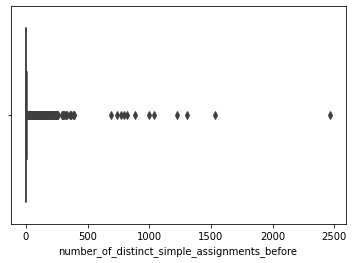

In [80]:
sns.boxplot(x='number_of_distinct_simple_assignments_before',
            data=functions_data);

Удалим выбросы:

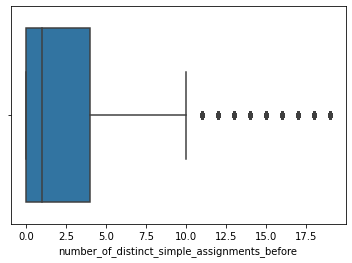

In [81]:
sns.boxplot(x='number_of_distinct_simple_assignments_before',
            data=functions_data.loc[functions_data['number_of_distinct_simple_assignments_before'] < 20]);

В функциях количество простых присвоений переменным чуть больше.

## Распределение по числу простых присвоений атрибутам

Подсчитаем статистики по числу присвоений атрибутам по коду:

In [14]:
print(f'Среднее значение числа присвоений атрибутам равно {source_code_data["number_of_distinct_attribute_assignments_before"].mean()}.')
print(f'Медиана числа присвоений атрибутам равна {source_code_data["number_of_distinct_attribute_assignments_before"].median()}.')
print(f'Мода числа присвоений атрибутам равна {source_code_data["number_of_distinct_attribute_assignments_before"].mode()[0]} с частотой {source_code_data["number_of_distinct_attribute_assignments_before"].value_counts()[0]}.')
print(f'С.к.о числа присвоений атрибутам равно {source_code_data["number_of_distinct_attribute_assignments_before"].std()}.')
print(f'25-й персентиль числа присвоений атрибутам равен {source_code_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа присвоений атрибутам равен {source_code_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа присвоений атрибутам равен {source_code_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.90)}.')
print(f'Минимум числа присвоений атрибутам равен {source_code_data["number_of_distinct_attribute_assignments_before"].min()}.')
print(f'Максимум числа присвоений атрибутам равен {source_code_data["number_of_distinct_attribute_assignments_before"].max()}.')

Среднее значение числа присвоений атрибутам равно 0.664935401346447.
Медиана числа присвоений атрибутам равна 0.0.
Мода числа присвоений атрибутам равна 0.0 с частотой 4373133.
С.к.о числа присвоений атрибутам равно 2.7376097426917956.
25-й персентиль числа присвоений атрибутам равен 0.0.
75-й персентиль числа присвоений атрибутам равен 0.0.
90-й персентиль числа присвоений атрибутам равен 2.0.
Минимум числа присвоений атрибутам равен 0.0.
Максимум числа присвоений атрибутам равен 687.0.


Теперь по методам:

In [17]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]

In [18]:
print(f'Среднее значение числа присвоений атрибутам равно {methods_data["number_of_distinct_attribute_assignments_before"].mean()}.')
print(f'Медиана числа присвоений атрибутам равна {methods_data["number_of_distinct_attribute_assignments_before"].median()}.')
print(f'Мода числа присвоений атрибутам равна {methods_data["number_of_distinct_attribute_assignments_before"].mode()[0]} с частотой {methods_data["number_of_distinct_attribute_assignments_before"].value_counts()[0]}.')
print(f'С.к.о числа присвоений атрибутам равно {methods_data["number_of_distinct_attribute_assignments_before"].std()}.')
print(f'25-й персентиль числа присвоений атрибутам равен {methods_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа присвоений атрибутам равен {methods_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа присвоений атрибутам равен {methods_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.90)}.')
print(f'Минимум числа присвоений атрибутам равен {methods_data["number_of_distinct_attribute_assignments_before"].min()}.')
print(f'Максимум числа присвоений атрибутам равен {methods_data["number_of_distinct_attribute_assignments_before"].max()}.')

Среднее значение числа присвоений атрибутам равно 0.8245633152514911.
Медиана числа присвоений атрибутам равна 0.0.
Мода числа присвоений атрибутам равна 0.0 с частотой 3039247.
С.к.о числа присвоений атрибутам равно 3.0091065095756604.
25-й персентиль числа присвоений атрибутам равен 0.0.
75-й персентиль числа присвоений атрибутам равен 1.0.
90-й персентиль числа присвоений атрибутам равен 2.0.
Минимум числа присвоений атрибутам равен 0.0.
Максимум числа присвоений атрибутам равен 541.0.


У 75% методов нет присвоений атрибутам.

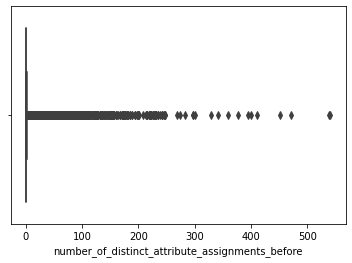

In [22]:
sns.boxplot(x='number_of_distinct_attribute_assignments_before',
            data=methods_data);

Удалим выбросы:

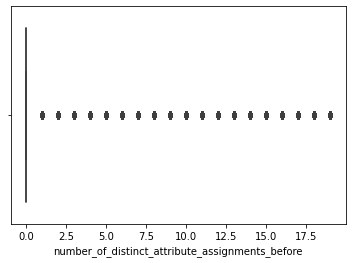

In [23]:
sns.boxplot(x='number_of_distinct_attribute_assignments_before',
            data=methods_data.loc[methods_data['number_of_distinct_attribute_assignments_before'] < 20]);

Теперь по функциям:

In [24]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]

In [25]:
print(f'Среднее значение числа присвоений атрибутам равно {functions_data["number_of_distinct_attribute_assignments_before"].mean()}.')
print(f'Медиана числа присвоений атрибутам равна {functions_data["number_of_distinct_attribute_assignments_before"].median()}.')
print(f'Мода числа присвоений атрибутам равна {functions_data["number_of_distinct_attribute_assignments_before"].mode()[0]} с частотой {functions_data["number_of_distinct_attribute_assignments_before"].value_counts()[0]}.')
print(f'С.к.о числа присвоений атрибутам равно {functions_data["number_of_distinct_attribute_assignments_before"].std()}.')
print(f'25-й персентиль числа присвоений атрибутам равен {functions_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа присвоений атрибутам равен {functions_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа присвоений атрибутам равен {functions_data["number_of_distinct_attribute_assignments_before"].quantile(q=0.90)}.')
print(f'Минимум числа присвоений атрибутам равен {functions_data["number_of_distinct_attribute_assignments_before"].min()}.')
print(f'Максимум числа присвоений атрибутам равен {functions_data["number_of_distinct_attribute_assignments_before"].max()}.')

Среднее значение числа присвоений атрибутам равно 0.22040322846409033.
Медиана числа присвоений атрибутам равна 0.0.
Мода числа присвоений атрибутам равна 0.0 с частотой 1333886.
С.к.о числа присвоений атрибутам равно 1.6973660917845463.
25-й персентиль числа присвоений атрибутам равен 0.0.
75-й персентиль числа присвоений атрибутам равен 0.0.
90-й персентиль числа присвоений атрибутам равен 0.0.
Минимум числа присвоений атрибутам равен 0.0.
Максимум числа присвоений атрибутам равен 687.0.


В функциях также мало присвоений атрибутам. Их даже еще меньше, чем у методов.

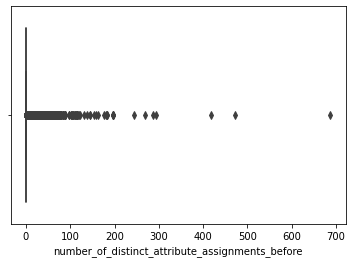

In [26]:
sns.boxplot(x='number_of_distinct_attribute_assignments_before',
            data=functions_data);

Удалим выбросы:

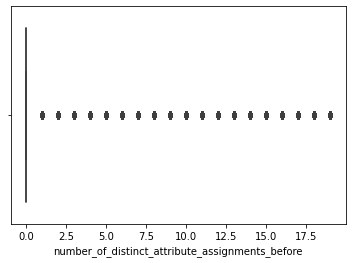

In [27]:
sns.boxplot(x='number_of_distinct_attribute_assignments_before',
            data=functions_data.loc[functions_data['number_of_distinct_attribute_assignments_before'] < 20]);

В функциях количество присвоений атрибутам меньше, поскольку отсутствуют присвоения типа `self.a=x`.

# Распределение по числу вызовов функций



In [75]:
def checkOnFunctionCall(node):
    names = []
    if isinstance(node.func, ast.Name):
        names.append(node.func.id)
    elif isinstance(node.func, ast.Attribute) or isinstance(node.func, ast.Subscript):
        term = ''
        item = node.func
        while isinstance(item, ast.Attribute) or isinstance(item, ast.Subscript):
            if isinstance(item, ast.Attribute):
                term = item.attr + '.' + term
                item = item.value
            elif isinstance(item, ast.Subscript):
                item = item.value
        if isinstance(item, ast.Name):
            term = item.id + '.' + term
        names.append(term.strip('.'))
    return names

Описывается visitor-класс, который позволяет обходит AST-дерево и ищет все узлы, отвечающие операции вызова функции.

In [74]:
class VisitFunctionCalls(ast.NodeVisitor):
    def __init__(self):
        self.function_calls = []
        self.number_function_calls = 0
        super().__init__()
        
    def generic_visit(self, node):
        if isinstance(node, ast.Call):
            self.function_calls += checkOnFunctionCall(node)
            self.number_function_calls = len(self.function_calls)
        ast.NodeVisitor.generic_visit(self, node)

In [72]:
def getFunctionCallCount(snippet):
    visit_function_calls = VisitFunctionCalls()
    try:
        visit_function_calls.visit(ast.parse(snippet))
        return visit_function_calls.number_function_calls
    except SyntaxError:
        return np.nan

Подсчитаем количество вызовов функций:

In [76]:
source_code_data['number_of_function_calls_before'] = source_code_data['before_merge'].apply(getFunctionCallCount)

Подсчитаем статистики по числу вызовов функций в коде:

In [32]:
print(f'Среднее значение числа вызовов функций равно {source_code_data["number_of_function_calls_before"].mean()}.')
print(f'Медиана числа вызовов функций равна {source_code_data["number_of_function_calls_before"].median()}.')
print(f'Мода числа вызовов функций равна {source_code_data["number_of_function_calls_before"].mode()[0]} с частотой {source_code_data["number_of_function_calls_before"].value_counts()[0]}.')
print(f'С.к.о числа вызовов функций равно {source_code_data["number_of_function_calls_before"].std()}.')
print(f'25-й персентиль числа вызовов функций равен {source_code_data["number_of_function_calls_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа вызовов функций равен {source_code_data["number_of_function_calls_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа вызовов функций равен {source_code_data["number_of_function_calls_before"].quantile(q=0.90)}.')
print(f'Минимум числа вызовов функций равен {source_code_data["number_of_function_calls_before"].min()}.')
print(f'Максимум числа вызовов функций равен {source_code_data["number_of_function_calls_before"].max()}.')

Среднее значение числа вызовов функций равно 6.0568184807130985.
Медиана числа вызовов функций равна 3.0.
Мода числа вызовов функций равна 1.0 с частотой 789138.
С.к.о числа вызовов функций равно 61.60171481348434.
25-й персентиль числа вызовов функций равен 1.0.
75-й персентиль числа вызовов функций равен 7.0.
90-й персентиль числа вызовов функций равен 14.0.
Минимум числа вызовов функций равен 0.0.
Максимум числа вызовов функций равен 118072.0.


Теперь по методам:

In [33]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]

In [34]:
print(f'Среднее значение числа вызовов функций равно {methods_data["number_of_function_calls_before"].mean()}.')
print(f'Медиана числа вызовов функций равна {methods_data["number_of_function_calls_before"].median()}.')
print(f'Мода числа вызовов функций равна {methods_data["number_of_function_calls_before"].mode()[0]} с частотой {methods_data["number_of_function_calls_before"].value_counts()[0]}.')
print(f'С.к.о числа вызовов функций равно {methods_data["number_of_function_calls_before"].std()}.')
print(f'25-й персентиль числа вызовов функций равен {methods_data["number_of_function_calls_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа вызовов функций равен {methods_data["number_of_function_calls_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа вызовов функций равен {methods_data["number_of_function_calls_before"].quantile(q=0.90)}.')
print(f'Минимум числа вызовов функций равен {methods_data["number_of_function_calls_before"].min()}.')
print(f'Максимум числа вызовов функций равен {methods_data["number_of_function_calls_before"].max()}.')

Среднее значение числа вызовов функций равно 5.201518569040332.
Медиана числа вызовов функций равна 2.0.
Мода числа вызовов функций равна 1.0 с частотой 700993.
С.к.о числа вызовов функций равно 20.129874217858518.
25-й персентиль числа вызовов функций равен 1.0.
75-й персентиль числа вызовов функций равен 6.0.
90-й персентиль числа вызовов функций равен 13.0.
Минимум числа вызовов функций равен 0.0.
Максимум числа вызовов функций равен 27510.0.


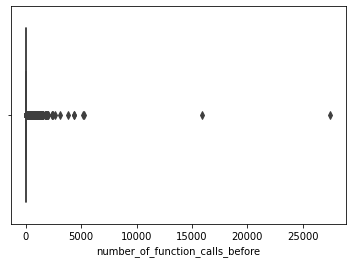

In [35]:
sns.boxplot(x='number_of_function_calls_before',
            data=methods_data);

Удалим выбросы:

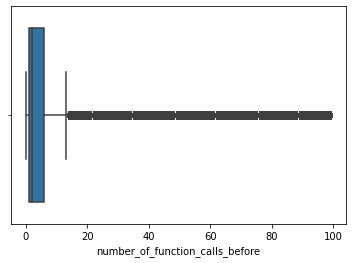

In [36]:
sns.boxplot(x='number_of_function_calls_before',
            data=methods_data.loc[methods_data['number_of_function_calls_before'] < 100]);

Теперь по функциям:

In [37]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]

In [38]:
print(f'Среднее значение числа вызовов функций равно {functions_data["number_of_function_calls_before"].mean()}.')
print(f'Медиана числа вызовов функций равна {functions_data["number_of_function_calls_before"].median()}.')
print(f'Мода числа вызовов функций равна {functions_data["number_of_function_calls_before"].mode()[0]} с частотой {functions_data["number_of_function_calls_before"].value_counts()[0]}.')
print(f'С.к.о числа вызовов функций равно {functions_data["number_of_function_calls_before"].std()}.')
print(f'25-й персентиль числа вызовов функций равен {functions_data["number_of_function_calls_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа вызовов функций равен {functions_data["number_of_function_calls_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа вызовов функций равен {functions_data["number_of_function_calls_before"].quantile(q=0.90)}.')
print(f'Минимум числа вызовов функций равен {functions_data["number_of_function_calls_before"].min()}.')
print(f'Максимум числа вызовов функций равен {functions_data["number_of_function_calls_before"].max()}.')

Среднее значение числа вызовов функций равно 8.438659594217546.
Медиана числа вызовов функций равна 4.0.
Мода числа вызовов функций равна 1.0 с частотой 88145.
С.к.о числа вызовов функций равно 115.00574063423741.
25-й персентиль числа вызовов функций равен 2.0.
75-й персентиль числа вызовов функций равен 9.0.
90-й персентиль числа вызовов функций равен 18.0.
Минимум числа вызовов функций равен 0.0.
Максимум числа вызовов функций равен 118072.0.


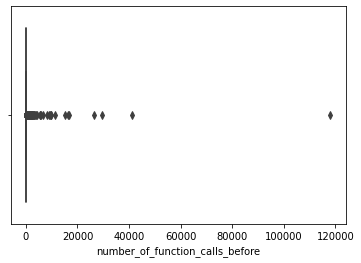

In [39]:
sns.boxplot(x='number_of_function_calls_before',
            data=functions_data);

Удалим выбросы:

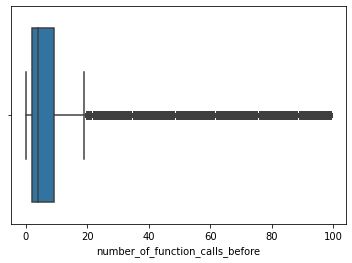

In [40]:
sns.boxplot(x='number_of_function_calls_before',
            data=functions_data.loc[functions_data['number_of_function_calls_before'] < 100]);

В функциях количество вызовов функций больше, чем в методах.

# Распределение по длине и количеству докстрингов

Подсчитаем суммарную длину докстрингов и количество докстрингов. Несколько докстрингов может быть, если внутри тела функции объявлена другая функция, класс.

In [49]:
source_code_data['total_length_of_docstrings_before'] = source_code_data['before_merge_docstrings'].apply(lambda x: sum([len(docstring) for docstring in x]) if not isinstance(x, float) else np.nan)
source_code_data['total_count_of_docstrings_before'] = source_code_data['before_merge_docstrings'].apply(lambda x: len(x) if not isinstance(x, float) else np.nan)

Подсчитаем статистики по длине докстрингов по всему коду:

In [46]:
print(f'Среднее значение длины докстрингов равно {source_code_data["total_length_of_docstrings_before"].mean()}.')
print(f'Медиана длины докстрингов равна {source_code_data["total_length_of_docstrings_before"].median()}.')
print(f'Мода длины докстрингов равна {source_code_data["total_length_of_docstrings_before"].mode()[0]} с частотой {source_code_data["total_length_of_docstrings_before"].value_counts()[0]}.')
print(f'С.к.о длины докстрингов равно {source_code_data["total_length_of_docstrings_before"].std()}.')
print(f'25-й персентиль длины докстрингов равен {source_code_data["total_length_of_docstrings_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины докстрингов равен {source_code_data["total_length_of_docstrings_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины докстрингов равен {source_code_data["total_length_of_docstrings_before"].quantile(q=0.90)}.')
print(f'Минимум длины докстрингов равен {source_code_data["total_length_of_docstrings_before"].min()}.')
print(f'Максимум длины докстрингов равен {source_code_data["total_length_of_docstrings_before"].max()}.')

Среднее значение длины докстрингов равно 103.72013490228346.
Медиана длины докстрингов равна 0.0.
Мода длины докстрингов равна 0.0 с частотой 3347759.
С.к.о длины докстрингов равно 338.81807681892104.
25-й персентиль длины докстрингов равен 0.0.
75-й персентиль длины докстрингов равен 69.0.
90-й персентиль длины докстрингов равен 278.0.
Минимум длины докстрингов равен 0.0.
Максимум длины докстрингов равен 41892.0.


Таким образом, в большинстве сниппетов кода нет докстрингов.

Подсчитаем статистики по числу докстрингов в коде:

In [47]:
print(f'Среднее значение числа докстрингов равно {source_code_data["total_count_of_docstrings_before"].mean()}.')
print(f'Медиана числа докстрингов равна {source_code_data["total_count_of_docstrings_before"].median()}.')
print(f'Мода числа докстрингов равна {source_code_data["total_count_of_docstrings_before"].mode()[0]} с частотой {source_code_data["total_count_of_docstrings_before"].value_counts()[0]}.')
print(f'С.к.о числа докстрингов равно {source_code_data["total_count_of_docstrings_before"].std()}.')
print(f'25-й персентиль числа докстрингов равен {source_code_data["total_count_of_docstrings_before"].quantile(q=0.25)}.')
print(f'75-й персентиль числа докстрингов равен {source_code_data["total_count_of_docstrings_before"].quantile(q=0.75)}.')
print(f'90-й персентиль числа докстрингов равен {source_code_data["total_count_of_docstrings_before"].quantile(q=0.90)}.')
print(f'Минимум числа докстрингов равен {source_code_data["total_count_of_docstrings_before"].min()}.')
print(f'Максимум числа докстрингов равен {source_code_data["total_count_of_docstrings_before"].max()}.')

Среднее значение числа докстрингов равно 0.3967661400492787.
Медиана числа докстрингов равна 0.0.
Мода числа докстрингов равна 0.0 с частотой 3347759.
С.к.о числа докстрингов равно 0.5162900977367099.
25-й персентиль числа докстрингов равен 0.0.
75-й персентиль числа докстрингов равен 1.0.
90-й персентиль числа докстрингов равен 1.0.
Минимум числа докстрингов равен 0.0.
Максимум числа докстрингов равен 126.0.


Теперь по методам:

In [15]:
methods_data = source_code_data.loc[source_code_data['class_name'].notna()]

In [49]:
print(f'Среднее значение длины докстрингов равно {methods_data["total_length_of_docstrings_before"].mean()}.')
print(f'Медиана длины докстрингов равна {methods_data["total_length_of_docstrings_before"].median()}.')
print(f'Мода длины докстрингов равна {methods_data["total_length_of_docstrings_before"].mode()[0]} с частотой {methods_data["total_length_of_docstrings_before"].value_counts()[0]}.')
print(f'С.к.о длины докстрингов равно {methods_data["total_length_of_docstrings_before"].std()}.')
print(f'25-й персентиль длины докстрингов равен {methods_data["total_length_of_docstrings_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины докстрингов равен {methods_data["total_length_of_docstrings_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины докстрингов равен {methods_data["total_length_of_docstrings_before"].quantile(q=0.90)}.')
print(f'Минимум длины докстрингов равен {methods_data["total_length_of_docstrings_before"].min()}.')
print(f'Максимум длины докстрингов равен {methods_data["total_length_of_docstrings_before"].max()}.')

Среднее значение длины докстрингов равно 95.45978797328624.
Медиана длины докстрингов равна 0.0.
Мода длины докстрингов равна 0.0 с частотой 2518695.
С.к.о длины докстрингов равно 312.792425615506.
25-й персентиль длины докстрингов равен 0.0.
75-й персентиль длины докстрингов равен 64.0.
90-й персентиль длины докстрингов равен 257.0.
Минимум длины докстрингов равен 0.0.
Максимум длины докстрингов равен 35368.0.


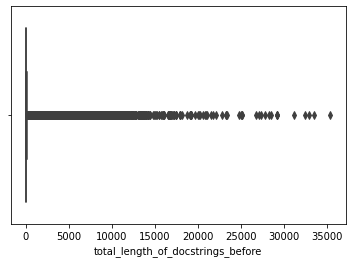

In [50]:
sns.boxplot(x='total_length_of_docstrings_before',
            data=methods_data);

По крайней мере больше половины методов в датасете не имеют докстрингов. Те из них, что имеют докстринги, имеют их относительно небольшой длины.

Теперь по функциям:

In [16]:
functions_data = source_code_data.loc[source_code_data['class_name'].isna()]

In [55]:
print(f'Среднее значение длины докстрингов равно {functions_data["total_length_of_docstrings_before"].mean()}.')
print(f'Медиана длины докстрингов равна {functions_data["total_length_of_docstrings_before"].median()}.')
print(f'Мода длины докстрингов равна {functions_data["total_length_of_docstrings_before"].mode()[0]} с частотой {functions_data["total_length_of_docstrings_before"].value_counts()[0]}.')
print(f'С.к.о длины докстрингов равно {functions_data["total_length_of_docstrings_before"].std()}.')
print(f'25-й персентиль длины докстрингов равен {functions_data["total_length_of_docstrings_before"].quantile(q=0.25)}.')
print(f'75-й персентиль длины докстрингов равен {functions_data["total_length_of_docstrings_before"].quantile(q=0.75)}.')
print(f'90-й персентиль длины докстрингов равен {functions_data["total_length_of_docstrings_before"].quantile(q=0.90)}.')
print(f'Минимум длины докстрингов равен {functions_data["total_length_of_docstrings_before"].min()}.')
print(f'Максимум длины докстрингов равен {functions_data["total_length_of_docstrings_before"].max()}.')

Среднее значение длины докстрингов равно 126.72356756816134.
Медиана длины докстрингов равна 0.0.
Мода длины докстрингов равна 0.0 с частотой 829064.
С.к.о длины докстрингов равно 401.62784639257.
25-й персентиль длины докстрингов равен 0.0.
75-й персентиль длины докстрингов равен 87.0.
90-й персентиль длины докстрингов равен 340.0.
Минимум длины докстрингов равен 0.0.
Максимум длины докстрингов равен 41892.0.


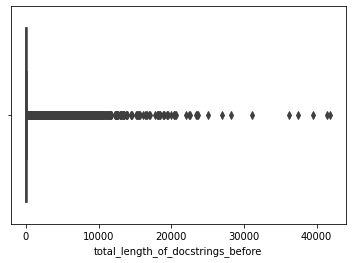

In [56]:
sns.boxplot(x='total_length_of_docstrings_before',
            data=functions_data);

Удалим выбросы:

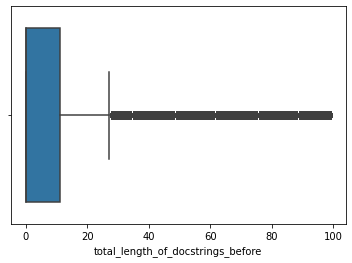

In [57]:
sns.boxplot(x='total_length_of_docstrings_before',
            data=functions_data.loc[functions_data['total_length_of_docstrings_before'] < 100]);

В функциях имеются докстринги, хотя в основном не очень большой длины. У функций длина докстрингов в среднем больше.

# Распределение названий функций

Посмотрим какие токены часто встречаются в названиях функций/методов. Если имя функции или метода составное на основе соглашений snake_case или camelCase, то это имя разбивается на отдельные токенв snake и case, либо camel и case.

In [5]:
def camelToSnake(name):
    return re.sub('([a-z0-9])([A-Z])', r'\1_\2', 
                  re.sub('(.)([A-Z][a-z]+)', r'\1_\2', name)).lower()


def removeEmptyItems(tokens_list):
    return [token for token in tokens_list if token]

In [6]:
source_code_data = source_code_data.loc[source_code_data['function_name'].notna()]

Ввиду большой трудоемкости, будем работать со случайной выборкой сниппетов.

In [7]:
source_code_data_sample = source_code_data.sample(frac=0.005)

In [9]:
source_code_data_sample['function_name_tokens'] = source_code_data_sample['function_name'].apply(lambda x: x.split('.')[-1]).apply(camelToSnake).apply(lambda x: x.split('_')).apply(removeEmptyItems)

In [10]:
function_name_tokens = Counter(source_code_data_sample['function_name_tokens'].agg('sum'))

Число уникальных токенов:

In [11]:
len(function_name_tokens)

8880

Выделим наиболее часто встречающиеся токены в названиях методов/функций (больше 400)

In [12]:
frequently_occured_function_name_tokens = {k: v for k, v in function_name_tokens.items() if v > 400}

In [13]:
frequently_occured_function_name_tokens

{'get': 3115,
 'is': 401,
 'to': 599,
 'create': 620,
 'from': 445,
 'init': 2751,
 'set': 776,
 'add': 469,
 'on': 403,
 'update': 495}

In [17]:
source_code_data['function_name'].apply(lambda x: '__init__' in x).sum(), methods_data['function_name'].apply(lambda x: '__init__' == x.split('.')[-1]).sum()

(528035, 514296)

Из 528035 сниппетов, имя которых содержит `__init__` 514296 сниппетов - это методы-конструкторы.

In [18]:
less_frequently_occured_function_name_tokens = {k: v for k, v in function_name_tokens.items() if (v > 200) and (v <= 400)}

In [19]:
less_frequently_occured_function_name_tokens

{'list': 378,
 'parse': 275,
 'file': 279,
 'run': 311,
 'main': 209,
 'read': 202,
 'delete': 215,
 'call': 202,
 'str': 208,
 'id': 246,
 'check': 302,
 'name': 300,
 'load': 236,
 'data': 367,
 'for': 203}

Наиболее часто встречающиеся токены - это init и get. Посмотрим в названиях каких функций они встречаются c учетом частоты

In [21]:
def getFuncNamesWithToken(data,
                          func_name_tokens_column,
                          func_name_column,
                          token):
    return data.loc[data[func_name_tokens_column].apply(lambda x: token in x), 
                    func_name_column].apply(lambda x: x.split('.')[-1]).value_counts()

df = getFuncNamesWithToken(source_code_data_sample,
                           'function_name_tokens',
                           'function_name',
                           'get')

j = 0
for index, count in zip(df.index, df):
    print(index, count)

get 153
get_queryset 24
get_context_data 22
get_data 16
get_config 12
get_name 11
get_version 10
_get 9
get_user 9
get_object 8
__get__ 8
get_value 8
get_parser 7
get_model 6
get_long_running_output 6
get_absolute_url 6
get_context 5
get_success_url 5
get_description 5
GET 5
get_state 5
get_urls 5
get_initial 5
get_type 4
get_message 4
_get_state 4
_get_name 4
get_next 4
get_by 4
get_connection 4
get_all 4
get_versions 4
get_outputs 4
get_filename 4
getValue 4
get_result 4
on_get 4
get_items 3
get_results 3
get_url 3
get_title 3
get_xml 3
get_path 3
_get_config 3
get_cache 3
get_default 3
get_fields 3
get_client 3
get_current_user 3
get_resource 3
get_parent 3
get_label 3
get_code 3
get_args 3
get_help 3
get_status 3
GetResources 3
get_action 2
get_collection 2
getInputSpecification 2
get_permissions 2
get_item_id 2
get_dev_examples 2
getNext 2
get_brightness 2
get_default_config_help 2
_get_streams 2
get_hash 2
get_targets 2
get_board_name 2
get_completions 2
get_loss 2
_get_files 2
g

bytes__get 1
getWhisperBg 1
get_update_request 1
get_spark_context 1
get_address 1
_get_predictions 1
getTaskbarPos 1
get_logging_options 1
getModifierList 1
get_video_name 1
get_delete_session_endpoint_widget 1
get_helpers 1
get_tab_text 1
get_ffmpeg_version 1
get_instance_process_dump_slot 1
get_git_revision_hash 1
get_exe 1
get_citation_from_gramps_id 1
get_DiskSn 1
get_transaction 1
get_UploadExtraInfo 1
_get_obs 1
get_from_amazon 1
get_randomizeDuration 1
get_corpmembership_type_choices 1
getComponentFromName 1
get_full_completion 1
get_class_by_file 1
get_products_size 1
getRange 1
getNumRegions 1
get_email 1
get_existing_date_time_values 1
validate_commit_msg_get_tag 1
get_scale_min 1
get_vmat 1
get_sources 1
get_transition_bulk_url_name 1
get_to_data 1
getDefaultValue 1
get_site_detector_response 1
get_control_constants 1
get_fitness_median 1
_get_abs_pos 1
get_training_or_validation_split 1
get_file_prefix 1
_get_exports_list 1
_get_path 1
get_innate_stat_title 1
getSubRegion 

get_segid 1
get_site_diagnostic_category_slot 1
get_network_type 1
_get_poly 1
_get_class_attribute 1
get_using_xml_id 1
_get_area_properties 1
get_theme_paths 1
get_cameras_signal_strength 1
get_random_gc_policy 1
get_class_values 1
get_panels 1
_get_certs_by_name 1
get_emoji_sequence_type 1
get_next_notification 1
getMeasure 1
getEditor 1
get_stories 1
get_from_clause 1
get_audit_logs 1
get_id_group_dims 1
get_express_config 1
get_persistent_ref_from_iter 1
coro_get_contract_code 1
get_complete_ph_dos 1
get_speed_travel_z 1
get_proposal_getter_kwargs 1
get_origin_line 1
ble_rsp_connection_get_status 1
get_cpanel_games 1
get_major_version_number 1
get_boundary_bases 1
get_p2p_server 1
_get_module_info 1
eigen_images_get 1
get_peering_stats 1
_get_smooth_plotting_data_from_model 1
get_resource_linkage 1
_get_hello_interval 1
get_e_repr 1
_get_inherited_dist_git_branch 1
get_cert_data 1
get_block_record_from_db 1
_getControllerModulenames 1
get_comments 1
get_at_management_group 1
_get_

_get_total_coloring_fname 1
_get_initial_flow_state 1
get_dataset 1
get_add_button_rect 1
get_obj_data_raw 1
_get_courier_addresses 1
get_TemplateInstanceId 1
get_deployment 1
get_spubinfo 1
get_all_roots 1
get_meas_list 1
get_optional_params 1
tinymce_get_files 1
GetBoolValue 1
get_image_path_sync 1
get_file_system_state 1
_get_color_token_style 1
get_chrome_bookmark_urls_helper 1
get_distance_function 1
get_boxing_day 1
_get_by_id 1
get_word 1
getPluginFiles 1
get_field_info 1
get_collective_group_size 1
get_segments 1
_get_type_data 1
_get_columns_schema 1
get_natural_profile 1
get_custodia_instance 1
get_repository 1
getMaintenanceTypes 1
GetQueryParamsNames 1
get_volume_backup 1
get_basebackup_directory 1
getBodyTexture 1
get_domain_typedef 1
GetHandSize 1
_get_connect_params 1
_get_flagged_field_names 1
get_enabling_research_id 1
_get_cpu_info_from_sysinfo 1
get_hidden_values 1
get_contract_center 1
get_token_paylod 1
get_Code_Snippets 1
_get_seedlist 1
get_router_policy 1
get_co

getMultiLaneGui 1
get_ooid 1
_get_has_invoices 1
get_default_options 1
ipmi_get_sel_list 1
get_methods 1
_get_multiple_text_items 1
get_available_name 1
_get_fault_type_hanging_wall 1
get_percentile 1
get_source_ingests 1
get_working_repo 1
get_context_options 1
begin_get_vpnclient_connection_health 1
get_cpld_version_ 1
get_module_vals 1
get_api_definitions 1
get_rev_reg 1
getMailFrom 1
_get_a_server 1
get_certificate_versions 1
_get_connection_string 1
get_physical_values_attribute_map 1
get_content_metadata_exporter 1
get_product_group_view 1
GetVmStatusCode 1
_get_rep 1
_getOutputMicThumbnail 1
get_touch_data 1
get_bottomleft 1
get_IpVersion 1
getComponentArea 1
get_jobs 1
_get_tag_not_duplicate 1
getOffsetY 1
_get_service_account_project 1
get_meta_description 1
get_field 1
_get_variables_to_restore 1
get_ranges 1
_get_subject_code 1
get_sample_id 1
get_commit_timestamp 1
GetResource 1
_get_win_id 1
get_header_size 1
get_repository_root 1
get_data_from_template 1
get_cluster_manif

In [22]:
df = getFuncNamesWithToken(source_code_data_sample,
                           'function_name_tokens',
                           'function_name',
                           'init')
for index, count in zip(df.index, df):
    print(index, count)

__init__ 2595
init 32
sv_init 4
__post_init__ 4
init_app 3
_init_from_empty 3
__init 3
_init 3
init_range 2
post_init 2
__attrs_post_init__ 2
plugin_init 1
init_artists 1
_init_model_with_state_dict 1
init_bigquery 1
init_bare 1
_init_library 1
ffmpeg_init_packet 1
get_init_value 1
get_scaffold_init_fn 1
init_filters 1
init_highlight_package 1
init_terms 1
_init_class 1
InitCluster 1
_init_conn 1
_initNamespaces 1
get_transform_init_args_names 1
bas_config_init 1
_init_glyphs 1
language_init 1
init_last_events 1
init_neighbors_sets 1
_init_titles 1
_init_gradients 1
init_default_key_value_store 1
_init_dist_mpi 1
init_net 1
init_tree 1
_init_widgets 1
hashivault_generate_root_init 1
send_init_commands 1
init_inference 1
initWithOptions_ 1
_init_kwargs 1
init_data 1
_init_meta 1
converter_init 1
init_network 1
gdb_init 1
init_layout 1
__should_init_handshake 1
init_fn 1
init_command_file_logging 1
_init_from_text 1
_init_fakeid 1
init_with_handler 1
init_gf 1
init_from_request 1
_init_u

Теперь наиболее часто встречающиеся пары токенов в названиях функций (биграммы).

In [23]:
import nltk

In [24]:
source_code_data_sample['function_name_bigrams'] = source_code_data_sample['function_name_tokens'].apply(nltk.bigrams)

In [25]:
function_name_bigrams = Counter(source_code_data_sample['function_name_bigrams'].apply(list).agg('sum'))
frequently_occured_function_name_bigrams = {k: v for k, v in function_name_bigrams.items() if v > 20}

In [26]:
frequently_occured_function_name_bigrams

{('is', 'valid'): 31,
 ('get', 'queryset'): 24,
 ('get', 'default'): 21,
 ('delete', 'initial'): 24,
 ('create', 'or'): 59,
 ('or', 'update'): 57,
 ('update', 'initial'): 26,
 ('get', 'all'): 43,
 ('get', 'data'): 29,
 ('to', 'dict'): 33,
 ('get', 'context'): 29,
 ('context', 'data'): 23,
 ('get', 'user'): 25,
 ('list', 'by'): 22}

Таким образом, наиболее часто встречающиеся биграммы, это биграммы, содержащие токен get.

# Распределение сниппетов по репозиториям

Покажем распределение сниппетов по репозиториям:

In [29]:
df = source_code_data['repo_name'].value_counts()

for index, count in zip(df.index, df):
    print(index, count) 

Azure/azure-sdk-for-python 88170
oracle/oci-python-sdk 42232
sagemath/sage 40023
cloudera/hue 38958
tytusdb/tytus 35469
aliyun/aliyun-openapi-python-sdk 29199
home-assistant/core 28861
cctbx/cctbx_project 26873
tencentyun/scf-demo-repo 25953
Azure/azure-cli-extensions 25913
sympy/sympy 25241
dimagi/commcare-hq 21418
kovidgoyal/calibre 20383
docusign/docusign-python-client 19448
saltstack/salt 18958
leo-editor/leo-editor 18735
tribe29/checkmk 18453
XX-net/XX-Net 17905
Toontown-Open-Source-Initiative/Toontown-School-House 16696
AppScale/gts 16151
anhstudios/swganh 15709
SteveDoyle2/pyNastran 15240
dnanexus/parliament2 14771
openhatch/oh-mainline 14092
plotly/plotly.py 14043
wxWidgets/Phoenix 13965
morpheus65535/bazarr 13917
cryoem/eman2 13915
demisto/content 13746
SickChill/SickChill 13669
napalm-automation/napalm-yang 13149
galaxyproject/galaxy 12703
gramps-project/gramps 11575
openstack/cinder 11201
VOLTTRON/volttron 9972
ActiveState/code 9946
Jenyay/outwiker 9859
edx/edx-platform 9817

netzob/netzob 1410
CumulusNetworks/ifupdown2 1410
GiveMeAllYourCats/cats-blender-plugin 1409
feeluown/FeelUOwn 1407
PyPlanet/PyPlanet 1404
codalab/codalab-worksheets 1403
holgern/beem 1403
meraki/dashboard-api-python 1402
rwightman/pytorch-image-models 1400
allenai/allennlp 1399
ansible-collections/google.cloud 1398
colour-science/colour 1396
python-openxml/python-docx 1394
olivierkes/manuskript 1394
ladybug-tools/honeybee 1394
BEEmod/BEE2.4 1393
ostroproject/ostro-os 1389
getting-things-gnome/gtg 1386
sunpy/sunpy 1386
intel/auto-pts 1385
brian-team/brian2 1385
nicolas-chaulet/torch-points3d 1383
OpenTreeMap/otm-core 1383
LmeSzinc/AzurLaneAutoScript 1381
PyHDI/Pyverilog 1380
microsoft/MMdnn 1379
angr/claripy 1377
rlworkgroup/garage 1377
angr/angr-management 1376
googlefonts/nototools 1375
poodarchu/Det3D 1373
nylas/sync-engine 1371
mozilla/fjord 1370
scikit-image/scikit-image 1369
quic/aimet 1368
TotallyNotRobots/CloudBot 1367
nsacyber/WALKOFF 1365
GeotrekCE/Geotrek-admin 1365
Hypothes

JulianEberius/SublimePythonIDE 932
richardkiss/pycoin 932
powerline/powerline 931
OpenGeoVis/PVGeo 931
census-instrumentation/opencensus-python 929
RUCAIBox/RecBole 929
alerta/alerta 928
PacificBiosciences/pbcore 927
cuihantao/andes 926
florianfesti/boxes 925
taxigps/xbmc-addons-chinese 925
scikit-hep/awkward-0.x 924
irmen/Pyro4 924
apprenticeharper/DeDRM_tools 924
etingof/pysnmp 923
sublimelsp/LSP 922
ialbert/biostar-central 922
stanfordnlp/cocoa 921
Quasars/orange-spectroscopy 920
PaddlePaddle/X2Paddle 919
joke2k/faker 919
moloch--/RootTheBox 917
SatelliteQE/robottelo 916
getslash/slash 916
sissaschool/xmlschema 914
qtumproject/qtum-electrum 913
dexy/dexy 912
open-mmlab/mmdetection3d 912
projectatomic/atomic 911
google/ci_edit 910
frePPLe/frepple 909
sandy1709/catuserbot 909
JDAI-CV/fast-reid 908
blawar/nut 908
cubewise-code/tm1py 907
microsoft/onefuzz 907
intelligent-agent/redeem 906
SimonShi1994/Princess-connection-farm 906
openstenoproject/plover 905
DeepLabCut/DeepLabCut 904
dit/

yoshida-lab/XenonPy 571
autotest/tp-qemu 570
masmu/pulseaudio-dlna 570
neubig/nn4nlp-code 570
pygae/galgebra 569
jleclanche/fireplace 569
devsnd/cherrymusic 568
Dash-Industry-Forum/dash-live-source-simulator 568
openatx/uiautomator2 568
hpe-storage/python-hpedockerplugin 568
BasioMeusPuga/Lector 567
Juniper/py-junos-eznc 567
yorikvanhavre/BIM_Workbench 567
atomistic-machine-learning/schnetpack 567
intake/filesystem_spec 566
funilrys/PyFunceble 566
denisenkom/pytds 566
lukelbd/proplot 566
microsoft/NeuronBlocks 566
MiracleYoung/You-are-Pythonista 565
rocky/python-uncompyle6 564
metabrainz/picard-plugins 564
tenable/pyTenable 564
pulp/pulpcore 564
airbnb/knowledge-repo 563
Allen7D/mini-shop-server 563
obriencj/python-javatools 563
airctic/icevision 563
marcosfede/algorithms 563
werwolfby/monitorrent 563
NoneGG/aredis 563
pvlib/pvlib-python 562
tschellenbach/Django-facebook 562
python-cmd2/cmd2 562
davidhalter/jedi 562
Neurosim-lab/netpyne 561
stepjam/PyRep 560
mozilla/moztrap 560
singnet

awslabs/aws-instance-scheduler 396
wh1te909/tacticalrmm 395
pyxnat/pyxnat 395
algorithm002/algorithm 395
fedora-infra/anitya 395
ellmetha/django-machina 395
motom001/DoorPi 395
jessevdk/cldoc 395
python-streamz/streamz 395
skoczen/will 394
microsoft/seismic-deeplearning 394
cpnota/autonomous-learning-library 394
nose-devs/nose2 393
thu-ml/tianshou 393
mlbvn/d2l-vn 393
shirtsgroup/InterMol 393
sk2/autonetkit 392
pebble/cloudpebble 392
marcusva/py-sdl2 392
pibooth/pibooth 392
actionless/pikaur 392
mozilla/normandy 392
KscSDK/ksc-sdk-python 392
aim-uofa/AdelaiDet 392
python-control/python-control 391
mrworf/photoframe 391
bytedance/byteps 390
LoRexxar/Kunlun-M 390
CERT-Polska/mwdb-core 390
spacether/pycalculix 390
kodsnack/advent_of_code_2016 390
NordicSemiconductor/pc-ble-driver-py 390
alexal1/Insomniac 389
ExCiteS/geokey 389
thingsboard/thingsboard-gateway 389
nipy/nitime 388
Kolifanes/plugin.video.youtube 388
henry232323/RPGBot 388
GRAAL-Research/poutyne 388
glitchassassin/lackey 388
a

eandersson/amqpstorm 308
mongodb/motor 308
sensepost/objection 308
NVIDIA-AI-IOT/torch2trt 308
jpype-project/jpype 308
google/seq2seq 308
UKPLab/sentence-transformers 308
USArmyResearchLab/Dshell 308
pypiserver/pypiserver 308
ethereum/evmlab 307
mosra/m.css 307
lanpa/tensorboardX 307
Ehco1996/django-sspanel 307
linkedin/naarad 307
pystruct/pystruct 307
tweecode/twine 307
ReFirmLabs/binwalk 307
infobloxopen/infoblox-client 307
ospalh/anki-addons 307
zopefoundation/z3c.rml 307
zopefoundation/zope.interface 307
aboSamoor/polyglot 307
edibledinos/pwnypack 307
EDCD/EDMarketConnector 307
depthsecurity/armory 306
mrf345/FQM 306
HydraChain/hydrachain 306
uber/causalml 306
deeptools/HiCExplorer 306
NYUCCL/psiTurk 306
open2c/cooler 306
maxpumperla/betago 306
national-voter-file/national-voter-file 305
healthsites/healthsites 305
fedora-infra/fas 305
sooftware/KoSpeech 305
catkin/catkin_tools 305
avanzosc/odoo-addons 304
deis/controller 304
jdb78/pytorch-forecasting 304
capitalone/giraffez 304
cl

jamiemcg/Remarkable 228
brechtm/citeproc-py 228
neulab/compare-mt 228
batiste/django-page-cms 228
jazzband/django-silk 228
Veil-Framework/Veil 228
gregmalcolm/python_koans 227
talkiq/gcloud-aio 227
messagebird/python-rest-api 227
att-comdev/armada 227
sdementen/piecash 227
project-generator/project_generator 227
ambianic/ambianic-edge 227
Py-Contributors/AlgorithmsAndDataStructure 226
iodide-project/pyodide 226
danimaribeiro/PyTrustNFe 226
DimaKudosh/pydfs-lineup-optimizer 226
kernelci/kernelci-core 226
oemof/oemof-solph 226
aws/aws-lambda-builders 226
sixty-north/cosmic-ray 226
blaze/datashape 226
minerva-ml/open-solution-home-credit 226
algolia/algoliasearch-client-python 226
Azure/azure-kusto-python 226
worstcase/blockade 226
jasonrbriggs/stomp.py 225
pybliometrics-dev/pybliometrics 225
itamarst/eliot 225
git-multimail/git-multimail 225
geopython/pycsw 225
gitless-vcs/gitless 225
lingthio/Flask-User 225
pylast/pylast 225
splunk/security-content 225
GDQuest/blender-power-sequencer 22

seveas/python-hpilo 194
marcospereirampj/python-keycloak 194
cloudant/bigcouch 194
openstates/people 193
dbcli/litecli 193
Eloston/ungoogled-chromium 193
d-Rickyy-b/pastepwn 193
ankicommunity/anki-sync-server 193
aws-quickstart/quickstart-redhat-openshift 193
trustedsec/social-engineer-toolkit 193
flasgger/flasgger 193
pypa/packaging 193
Crypto-Expert/stratum-mining 193
balanced/billy 192
robotools/robofab 192
atc-project/atomic-threat-coverage 192
lardbit/nefarious 192
playframework/play1 192
smarkets/marge-bot 192
julython/julython.org 192
mgaitan/preciosa 192
sailoog/openplotter 192
NagiosEnterprises/ncpa 192
yihong0618/running_page 192
dbcli/mycli 192
containernet/containernet 192
datactive/bigbang 192
KDD-OpenSource/DeepADoTS 192
scikit-learn-contrib/imbalanced-learn 192
Shoobx/xmldiff 192
Jarsa/transport-management-system 192
tlsfuzzer/python-ecdsa 192
locationlabs/mockredis 191
nineties/py-videocore 191
FOSSEE/eSim 191
nonebot/nonebot 191
MLBazaar/BTB 191
Parsely/streamparse 191

thtrieu/darkflow 154
mozilla/moztrap-tests 154
amperser/proselint 154
OmniSharp/omnisharp-sublime 154
nephila/python-taiga 154
joerick/cibuildwheel 154
vincentbernat/snimpy 154
gabrielfalcao/lettuce 154
chrisspen/django-chroniker 154
DMTF/Redfishtool 154
adobe/brackets-shell 154
insanum/sncli 154
achillean/shodan-python 154
matthewwithanm/django-imagekit 154
weaveworks/grafanalib 154
tgalal/wazapp 154
martomo/SublimeTextXdebug 154
python-kasa/python-kasa 153
Manuel83/craftbeerpi3 153
RediSearch/redisearch-py 153
gaining/Resetter 153
reddit/rollingpin 153
openremote/or-objectdetection 153
pyeve/cerberus 153
p4lang/ptf 153
jazzband/django-analytical 153
encode/databases 153
rsheftel/pandas_market_calendars 153
huggingface/neuralcoref 153
mithi/hexapod-robot-simulator 153
komuw/sewer 153
PaddlePaddle/RLSchool 153
LeeKamentsky/python-javabridge 153
nchammas/flintrock 153
ReproNim/neurodocker 153
janten/dpt-rp1-py 153
adamewing/bamsurgeon 153
JonathanSalwan/ROPgadget 152
python-trio/trio-as

r9y9/pysptk 115
frankie567/fastapi-users 115
caronc/apprise 115
graphql-python/gql 115
django-nonrel/djangotoolbox 115
marcwebbie/passpie 115
retentioneering/retentioneering-tools 115
sebleier/django-redis-cache 114
kisom/pypcapfile 114
ensime/ensime-sublime 114
awslabs/amazon-kinesis-client-python 114
Azure-Samples/cognitive-services-python-sdk-samples 114
automl/ConfigSpace 114
bigchaindb/bigchaindb-driver 114
Vonage/vonage-python-sdk 114
frictionlessdata/datapackage-py 114
purcell/airspeed 114
Skyscanner/cfripper 114
raphaelvallat/pingouin 114
adrienverge/PhotoCollage 114
matrix-profile-foundation/matrixprofile 114
NeuroVault/NeuroVault 114
mosquito/aiormq 114
django-oscar/django-oscar-paypal 114
roger-/pyrtlsdr 114
labd/wagtailstreamforms 114
HASecuritySolutions/VulnWhisperer 114
quantopian/empyrical 114
tinyerp/erppeek 113
scopely-devops/skew 113
facebookarchive/gnlpy 113
hatching/sflock 113
mwclient/mwclient 113
wpilibsuite/frc-characterization 113
fizyr/keras-maskrcnn 113
nttcsl

BradnerLab/pipeline 94
gawel/panoramisk 94
FortyNorthSecurity/EyeWitness 94
daducci/AMICO 94
fmilthaler/FinQuant 94
cloudmatrix/esky 94
rapidsai/dask-cudf 94
LEW21/pydbus 94
Srinivas11789/PcapXray 94
Phylliade/ikpy 94
idealo/imagededup 94
jplana/python-etcd 94
d11wtq/dockerpty 94
UniversalDependencies/tools 94
vilcans/screenplain 94
lincolnloop/python-qrcode 94
intel/bmap-tools 94
AxeldeRomblay/MLBox 93
kuba/simp_le 93
Cornices/cornice 93
helionmusic/rhinobot_heroku 93
sumerc/yappi 93
SmileyChris/django-countries 93
takluyver/pynsist 93
theelous3/asks 93
AstunTechnology/Loader 93
davidteather/TikTok-Api 93
poldracklab/fitlins 93
alaingilbert/pyogame 93
attwad/python-osc 93
wagnerrp/pytmdb3 93
fxxkrlab/iCopy 93
python-hyper/wsproto 93
jupyterhub/jupyter-server-proxy 93
AndreiDrang/python3-anticaptcha 93
serverdensity/sd-agent 93
code42/crashplan_api_examples 93
panagiks/RSPET 92
dataabc/weiboSpider 92
nackjicholson/aiosql 92
rougeth/bottery 92
sopel-irc/sopel-extras 92
pallets/flask-sql

lambdalisue/django-permission 69
justinabrahms/imhotep 69
ucd-cws/arcpy_metadata 69
TokenMarketNet/smart-contracts 69
revolunet/sublimetext-markdown-preview 69
django-auth-ldap/django-auth-ldap 69
JaDogg/pydoro 69
sphinx-contrib/openapi 69
kivy-garden/garden.matplotlib 69
OCA/commission 69
alexander-akhmetov/python-telegram 69
ianare/exif-py 69
pimoroni/inky 68
ranaroussi/yfinance 68
aeroxis/sultan 68
derek73/python-nameparser 68
spulec/freezegun 68
jmcarp/betfair.py 68
kodi-svtplay/xbmc-svtplay 68
ros2/sros2 68
OTA-Insight/djangosaml2idp 68
boyan-soubachov/tastyworks_api 68
coderholic/django-cities 68
pypa/linehaul 68
dbr/tvnamer 68
mattupstate/flask-social 68
bear/parsedatetime 68
drgarcia1986/simple-settings 68
secrary/SSMA 68
randsleadershipslack/destalinator 68
ntt-sic/masakari 68
ResidentMario/geoplot 68
willthames/ansible-review 68
progrmoiz/python-snippets 68
jakeret/tf_unet 68
LucasPilla/Sorting-Algorithms-Visualizer 68
MLBazaar/MLBlocks 68
minimaxir/gpt-2-simple 68
mozilla/ht

IBM/watson-online-store 52
freedomofpress/securethenews 52
omnilib/aiomultiprocess 52
spulec/PyQS 52
GSA/https 52
nbedos/termtosvg 52
mrooney/mintapi 52
darxtrix/ptop 52
FutureSharks/rpi-security 52
micahflee/semiphemeral 52
bareos/bareos-contrib 52
myusuf3/delorean 52
pytorn/hackr 52
nescode/djangodm 52
aio-libs/janus 52
graphql-python/graphql-server 52
micahflee/torbrowser-launcher 52
puiterwijk/flask-oidc 52
bitlabstudio/django-calendarium 52
stefanfoulis/django-sendsms 52
jeremymaya/google-it-automation-with-python 52
jupyter/jupyter_core 52
pyusb/pyusb 52
mariostoev/finviz 52
basak/glacier-cli 52
ladybug-tools/honeybee-legacy 52
python-social-auth/social-app-django 52
nre-learning/nrelabs-curriculum 52
vals/umis 52
brack3t/django-braces 52
Kirpal/Keyboard-Layout-Editor-for-Blender 52
bitly/asyncmongo 52
openai/gym-http-api 51
jarondl/pygtfs 51
napalm-automation/napalm-ios 51
roxma/nvim-completion-manager 51
appnexus/pyrobuf 51
timvideos/streaming-system 51
akalongman/sublimetext-s

Unidata/netcdf4-python 34
ericsomdahl/python-bittrex 34
pydanny/django-uni-form 34
imagr/imagr 34
devartis/passbook 34
conda-forge/staged-recipes 34
drvinceknight/Nashpy 34
relekang/django-nopassword 34
GoogleCloudPlatform/fourkeys 34
pesos/browser-history 34
brack3t/Djrill 34
vikstrous/pirate-get 34
dropbox/mypy-protobuf 34
rveachkc/pymsteams 34
tokland/youtube-upload 34
cocos2d/cocos2d-x-samples 34
codingo/Reconnoitre 34
sourcelair/ceryx 34
aio-libs/aiomcache 34
s-ol/themer 34
rust-lang/highfive 34
jazzband/django-sortedm2m 34
fusionbox/django-authtools 34
colinta/SublimeFileDiffs 34
sivy/pystatsd 34
lepture/flask-wtf 34
hjacobs/kube-janitor 34
etsy/skyline 34
scikit-learn-contrib/sklearn-pandas 34
kubespray/kubespray-cli 34
10se1ucgo/DisableWinTracking 34
ga4gh/data-repository-service-schemas 34
opentimestamps/opentimestamps-client 34
dpallot/simple-websocket-server 34
codingo/Interlace 34
ggordan/GutterColor 34
wagtail/wagtail-bakery 34
dzhibas/SublimePrettyJson 34
jblakeman/apt-se

praekelt/django-object-tools 23
authlib/example-oauth2-server 23
HoverHell/RedditImageGrab 23
jupyterhub/zero-to-jupyterhub-k8s 23
aio-libs/aiohttp-jinja2 23
applegrew/django-select2 23
cockroachdb/sqlalchemy-cockroachdb 23
k4m4/kickthemout 23
hanneshapke/pyzillow 23
ivandokov/phockup 23
chezou/tabula-py 23
jupyter-server/jupyter-resource-usage 23
custom-components/custom_updater 22
phracker/HopperScripts 22
bashu/django-tracking 22
mhe/pynrrd 22
s0md3v/Striker 22
blavejr/OrganiseDesktop 22
django-cms/djangocms-video 22
tableau/server-install-script-samples 22
scikit-learn/enhancement_proposals 22
rhiever/TwitterFollowBot 22
fxsjy/jieba 22
sendgrid/smtpapi-python 22
EmersonElectricCo/fsf 22
kevthehermit/VolUtility 22
python-cn/slack_bot 22
anexia-it/django-rest-passwordreset 22
giovannipizzi/seekpath 22
bkabrda/flask-whooshee 22
pwaller/pyprof2calltree 22
mikemaccana/python-docx 22
mrjoes/sockjs-tornado 22
chubin/pyphoon 22
hunkim/word-rnn-tensorflow 22
brettcannon/caniusepython3 22
rk

nginxinc/nginx-ldap-auth 13
mitodl/edx2bigquery 13
bincrafters/conan-qt 13
joel-g/animal-facts-bot 13
vbabiy/djangorestframework-camel-case 13
mattlisiv/newsapi-python 13
corydolphin/flask-cors 13
ctf-wiki/ctf-wiki 13
fcaviggia/classification-banner 13
martinthomson/i-d-template 13
rasbt/watermark 13
IBM/MAX-Audio-Classifier 13
poblabs/weewx-belchertown 13
pytries/datrie 13
swcarpentry/make-novice 13
boramalper/himawaripy 13
sebastianruder/NLP-progress 13
saghul/aiodns 13
xaralis/django-static-sitemaps 13
Brown-University-Library/django-shibboleth-remoteuser 13
lincolnloop/django-dynamic-raw-id 13
jsocol/django-ratelimit 13
runmyrobot/runmyrobot 13
codecov/codecov-python 13
bugcrowd/vulnerability-rating-taxonomy 13
networktocode/ntc-templates 12
leancloud/python-getting-started 12
instantbox/instantbox 12
graalvm/mx 12
mozilla/django-session-csrf 12
uber/Python-Sample-Application 12
sat-utils/sat-search 12
Pylons/venusian 12
scikit-hep/root_pandas 12
licenses/lice 12
teamclairvoyant/ai

helmuthdu/conky_colors 2
yaml/pyyaml 2
FISCO-BCOS/FISCO-BCOS-DOC 2
ymoch/apyori 2
omab/python-social-auth 2
nir0s/distro 2
alexa-pi/AlexaPiDEPRECATED 2
FoldingAtHome/coronavirus 2
lk-geimfari/expynent 2
MISP/misp-objects 2
jackzhenguo/python-small-examples 2
jswhit/pygrib 2
Yelp/Testify 2
SublimeLinter/SublimeLinter-rubocop 2
autocracy/python-ipy 2
awsdocs/aws-java-developer-guide-v2 2
numpy/numpy-stubs 2
projectdiscovery/nuclei-templates 2
pypa/packaging.python.org 2
mitre-attack/car 2
thadeusb/flask-cache 2
gregzaal/Auto-Voice-Channels 2
Delta-Icons/android 2
collective/buildout.python 2
jacobian/dj-database-url 2
jsocol/jingo-minify 2
nschloe/awesome-scientific-computing 2
ArduPilot/pymavlink 2
containers/podman-compose 2
fabiocaccamo/django-colorfield 2
vaab/gitchangelog 2
OpenNebula/docs 2
wsvincent/restapiswithdjango 2
JamezQ/Palaver 2
100DaysOfCloud/100DaysOfCloudIdeas 2
mnooner256/pyqrcode 2
sobolevn/django-split-settings 2
JeremyCCHsu/Python-Wrapper-for-World-Vocoder 2
vinta/a

Два самых популярных репозитория для сниппетов - это saltstack/salt и ansible/ansible

# Распределение токенов в путях файлов

Посмотрим на распределение имен файлов:

In [30]:
source_code_data['actual_filename'] = source_code_data['filename'].apply(lambda x: x.split('/')[-1][:-3])

In [31]:
df = source_code_data['actual_filename'].value_counts()

for index, count in zip(df.index, df):
    print(index, count) 

__init__ 171316
models 79542
utils 68982
base 60799
views 40926
core 28559
client 23395
util 23060
config 21088
api 20981
main 18935
model 16147
common 14729
_models 14224
_models_py3 13548
forms 12880
server 10511
parser 10441
plugin 9433
fields 9262
actions 8998
setup 8898
helpers 8794
cli 8732
app 8330
manager 8304
types 8279
admin 7702
data 7601
connection 7562
tasks 7381
exceptions 7171
service 7153
cache 6227
user 6145
objects 6102
serializers 6044
package 5918
query 5909
message 5874
settings 5793
auth 5731
basic 5698
graph 5545
decorators 5526
events 5442
storage 5407
network 5391
filters 5351
session 5343
node 5303
database 5147
misc 5137
db 5119
commands 5080
interface 4805
engine 4787
resources 4599
text 4589
backend 4588
dataset 4538
custom 4536
metrics 4488
widgets 4464
search 4380
functions 4365
conanfile 4364
team_log 4326
sensor 4299
tools 4270
image 4214
context 4200
log 4193
schema 4183
xsd_models 4156
managers 4144
view 4138
table 4101
_web_apps_operations 4018
inter

alias 403
retry 402
GUI 402
param 402
Image 402
analyze 402
regexp 402
serve 402
wee_slack 401
crawler 401
viz 401
arm 400
language 400
representation 400
chat 400
django 400
alerts 400
vsphere 400
zeroconf 400
special 399
clustering 399
locks 398
room 398
Manager 398
mnist 398
route 398
trigger 398
campaignmanagement_example_helper 398
gcp 398
integration 397
sp_morphology 397
predicates 396
axes 396
gitlab 396
telnet 396
rss 396
activation 396
ticker 396
kml 395
css 395
topologyobjects 395
stix_common 395
vpc_client 395
rpcapi 394
hive 394
binomial_products 394
benchmarks 393
firmware 393
filtering 393
_color 392
normalization 391
virt 391
_application_security_groups_operations 391
people 391
assistant_v1 390
framemanager 389
res_partner 389
beam 389
univ 388
Code 388
alarm_control_panel 388
timezone 388
model_utils 387
wcs 386
aggregation 386
recipe 386
_phyloxml 386
wheel 386
elastic 385
port 385
pathlib 385
top 385
api_client 385
sampling 384
py_utils 384
certificate 384
formats 

pond 257
_disks_operations 257
solution 257
spatial 257
moderation 256
sidebar 256
encryption 256
ajax 256
rpc_pb2_grpc 256
iterators 256
graficaAST 256
MeshTools 256
rulesets 255
gdrive 255
social 255
func 255
msvs 255
cms_plugins 255
crv_types 255
variants 254
encode 254
datamodel_pb 254
iterable 254
wire 254
find 254
future 254
legend 253
tarfile 253
shuffle 253
Bindings 253
decode 252
inet6 252
todo 252
btp 252
new 252
dbapi 252
references 252
spin 252
semver 252
factor 252
ddpg 252
vacuum 252
branch 252
http_session_object 251
gradient 251
relations 251
route53 251
jlink 251
autopep8 251
postgresql 251
witness 251
base_client 251
interpolate 251
cinder 251
edge 250
alchemy 250
rds 250
autolevparser 250
ga 250
tabular 250
_blob_containers_operations 250
boolean 250
contour 249
_network_profiles_operations 249
grpc_asyncio 249
backend_wx 249
btrfs 249
latexparser 248
convolution 248
provisioning 248
xmlutil 247
darwin 247
chunk 247
miniedit 247
tunnel 247
report_in_product_run_respo

opengl 165
vis 165
querysets 165
pipelinecontroller 165
config_util 165
mhmain 165
nlcache 165
dsa 165
embed 165
composer 164
f_model 164
hatch 164
compress 164
views_docs 164
_apisite 164
ttp 164
fileutil 164
OSC 164
osgobject 164
pynvml 164
abstract_model 164
automaton_cli 164
ctc 164
pyutil 164
hdfs 164
loganalytics_cli 164
role_maker 164
trackers 164
kerberos 164
hrm 164
_load_balancer_backend_address_pools_operations 164
nlpacket 164
_bootstrap_external 164
blobstore_service_pb 163
configobj 163
discrete_model 163
faces 163
emacs 163
waveform 163
replaygain 163
showoci_service 163
compilers 163
icon 163
wsdl 163
gramaticaDESC 163
ce 163
revisions 163
data_flow 163
data_models 163
relationship 163
threshold 163
sphinx 163
feds_sql 163
datacatalog_cli 163
sign_here 163
tab_group 163
musicbrainz 163
conll 162
screenshots 162
u12 162
ciq_identity_3_0 162
ratelimit 162
cards 162
padding 162
woql_query 162
op_mapping 162
lilyObjects 162
asp 162
kms 162
leoVim 162
argparser 162
mapreduce

stock_move 137
plane 137
_ast_util 137
spellchecker 137
diskfile 137
kodigui 137
apk 137
batch_client 137
flatpak-node-generator 137
pronsole 137
_transformers 137
_tree 137
yum 137
structured_data 137
rating 137
swagger 137
transfers 137
braille 137
xbmcgui 137
std_nodes 137
emform 137
quantumcircuit 137
streamer 137
mem 137
StandardShapes 137
hybrid 137
discourse 137
korean 137
ordering_service 137
GChart 137
pagerduty 137
drt 136
osd 136
russian 136
screen_options 136
learn 136
log_analyzer 136
bugzilla 136
libraries 136
rq 136
ring 136
connection_manager 136
filemanager 136
train_utils 136
dbnc 136
m21ToXml 136
dataobject 136
_pluginreg 136
warrior 136
HashMode 136
projections 136
enrich 136
_layers 136
handshake 136
configurations 136
asyncpg 136
pyngcgui 135
mediafile 135
describe 135
dynamodb 135
nx_match 135
connectivity 135
ssl_tls_crypto 135
poolmotor 135
vapp 135
synchronizer 135
wiring 135
ChromeNsp 135
auth_client 135
contracts 135
nslbvserver 135
wallet_db 135
StatsWidget

viewprotocols 121
bn 121
leoConfig 121
define 121
sp_reconstruction 121
_brain 121
egg_info 121
noded 121
Block 121
reactors 121
sas 121
emimage3dsym 121
cgutils 121
transaction_dialog 121
state_domain 121
coreprops 121
computers 121
mstats_basic 121
subject 121
_discrete_distns 121
viewrendered3 121
ssdp 121
DescribeScheduledTasksRequest 121
trade 121
Sandbox 121
cos 121
temperature 121
msat 121
GWAS 121
shotgun 121
proposal 121
currency 121
datarepo 121
numeric_expr 121
sso 121
Connection 121
faster_rcnn 121
_estimator 121
svg_reader 121
orbital 120
trans_real 120
polyline 120
decoding 120
mp 120
auditor 120
gpt2 120
emovie 120
modules_service_pb 120
apply 120
checkconfig 120
tic_tac_toe 120
qemu 120
df 120
db_system_summary 120
ContactList 120
QADataStruct 120
Polygon 120
node_provider 120
cdn 120
cone 120
dialogue 120
masks 120
dh 120
wolfgame 120
schedv2 120
fileservice 120
avl_tree 120
evidence 120
memoize 120
_providers_operations 120
apache 120
resolution 120
multitasks 120
rum

asg 110
paginate 110
gremlin_proxy 110
tinytag 110
templates_api 110
measurement 110
phase_psf 110
quantizers 110
tst_ext 110
ovs_neutron_agent 110
graphviz 110
decompositions 109
perceptron 109
jwe 109
logfile 109
date_detection 109
logclient 109
__funcs__ 109
roi_model 109
postgres_ext 109
ConfigList 109
reloader 109
elementwise 109
indexed 109
colorpicker 109
ThugAPI 109
_domain 109
box_list 109
create_incident_request 109
qomui_gui 109
mlemodel 109
boto_iam 109
piv 109
sage_input 109
ipythontasks 109
_OpenGLPlotCanvas 109
HTTPResponse 109
paging 109
uds 109
listingcontroller 109
QuTech_ControlBoxdriver 109
nftables 109
httpapi 109
trash 109
index_lib 109
import_logs 109
miscellaneous_integration 109
Simulation 109
rigid 109
candidates 109
docker_image_ 109
genbank 109
cubecolourdialog 109
tktextext 109
gerber_statements 109
tokenclass 109
ar_model 109
dbops 109
ed25519 109
maltego 109
Pipeline 109
axe_msg 109
pulga_physics_modular_core 109
s3c 109
curl 109
utorrent 109
harvester 10

jwa 99
lsm 99
parse_xsd2 99
utils6 99
ififuncs 99
quality 99
win32k_core 99
tapi_photonic_media_controller 99
user_service_pb 99
permutations 99
relaymanager 99
rst2man 99
command_runners 99
itemmodels 99
peewee_async 99
commonh5 99
unified_jobs 99
_stream 99
gnu 99
sqlhtml 99
base_layer_v1 99
qube_manager 99
QRadar_v2 99
Workflow 99
throttling 99
fanchart 99
fw_zone 99
hpat_pandas_series_functions 99
multisig 99
rdp 99
SubsurfaceTransportCoefficients 99
_curses 99
tab_metadata 99
_generator 99
sets_cat 99
support_types 99
blame 99
a2c 99
fileclient 99
opvi 99
pycode 99
doxygen 98
imp 98
bdf_tables 98
modelchain 98
vmdk 98
cartan_type 98
BackendMatplotlib 98
PostProcessingTools 98
virtualbench 98
capital 98
_misc 98
estimators 98
api_server 98
psycopg2 98
TablaSimbolos 98
_proximity_placement_groups_operations 98
aci-show-interface 98
ilastikShell 98
modulegraph 98
RangeSet 98
_tools 98
bounding_box 98
six 98
BoundaryConditions 98
selinux 98
des 98
checkrunner 98
pf 98
Exceptions 98
po

launch_plan 86
tlsrecordlayer 86
sp_gui 86
neighbor 86
hmf 86
openshift 86
logistic 86
artmanager 86
eyetracker 86
io_util 86
as_string 86
handles 86
apidoc 86
allmaps 86
ipautil 86
comments_editor 86
mentions 86
_os 86
bpath 86
tapi_connectivity_getconnectivityservicelist_output_service 86
engine_ail 86
pickup 86
term_monoid 86
nn_model 86
aimsun 86
tapi_connectivity_getconnectivityservicedetails_output_service 86
ConsAggShockModel 86
pt 86
flowline 86
_width 85
wato 85
superelements 85
dropout 85
PullRequest 85
base64 85
_fastobo 85
input_reader 85
sintactico copy 85
mycroft_skill 85
modeling_tf_mobilebert 85
Input 85
checkpointing 85
datacube 85
ida_api 85
oneview_client 85
Mali 85
mission 85
composit 85
timedelta 85
cppunparse 85
DistributedBossCog 85
finetuning 85
orbit 85
_log_analytics_operations 85
pkmn_cog 85
zypper 85
aggs 85
weyl_characters 85
NodeSet 85
ResNet 85
Transformer 85
parquet 85
_output 85
libcython 85
elementseq 85
tee 85
kube 85
dnd 85
SaveApRadioSsidConfigReque

storing 76
pmml 76
qnap 76
supercell 76
fmbtwindows_agent 76
sourceform 76
tst_flex 76
dataframeeditor 76
experimental 76
user_related 76
configdefaults 76
pagure 76
sequitur 76
add_device_wizard 76
TypeSlots 76
invites 76
inbox 76
Schema 76
psbt 76
modeling_albert 76
stabilization_gcode 76
netutils 76
_components_operations 76
walk 76
sr 76
seismic 76
mail_service_pb 76
FileManager 76
_dedicated_hosts_operations 76
Events 76
immoptibox_ports 76
imageview 76
AutoTimerEditor 76
zen_core 76
kicad_netlist_reader 76
tf_widget 76
httpauth 76
vecm 76
analyzer_impls 76
supertooltip 76
batchrendering 76
Catalogs 76
stmt_visitor 76
contract_line 76
asymptotic_ring 76
ioctl 76
base_job 76
simplexDialog 76
cfg_base 76
rxv 76
quiz 76
morestats 76
objectstore 76
whitelist 76
DistributedCogdoInterior 76
endpoint_pb2_grpc 76
vimode 76
special_actions 76
formulaLoader 76
general_name 76
scientific_spinbox 76
Tag 76
nuclideBases 76
setparser 76
_familysrc 76
moment_tensor 76
classdiff 76
counts 76
npyd

_flagvalues 67
easygopigo3 67
keywordsearch 67
accession_analysis 67
stix_core 67
dists 67
Tenable_sc 67
vengine_cpy 67
rdataset 67
coordination_geometries 67
learning 67
RFProtocol 67
recipe-578138 67
orchestration 67
bzcleaner 67
repair 67
base_input_generator 67
py7zr 67
woff2 67
tsp 67
numvalue 67
stdparser 67
minimization 67
DistributedTugOfWarGame 67
CreateAutoProvisioningGroupRequest 67
ci_manager 67
pos 67
utf8 67
cccc 67
extraeditors 67
xasgui 67
quality_runner 67
Analyser_Merge 67
sp_pipe 67
smbmap 67
modeling_auto 67
linear_code 67
DistributedPatternGame 67
fuzz 67
occam2d 67
btor 67
nested 67
suites 67
MongoDB 67
fingerprinting 67
watermark 67
salary_slip 67
path_registry 67
fitting_models 67
dotdict 67
rights 67
user_service 67
flask_app 67
_file_shares_operations 67
v4_blocks 67
identitydag 67
curl_httpclient 67
door 67
awslambda 67
mayavi_viewer 67
adventureEngine 67
_module_view 67
backend_gtk3 67
physics 67
auth_chain 67
ibstore 67
pascal 67
_box 67
dbutils 67
bigip_po

glpk_interface 62
filereading 62
sweeps 62
psychchart 62
icebox 62
DistributedPartyTrampolineActivity 62
resourcemanager 62
tracklets 62
vnbinance 62
poisson 62
three_qubit_gates 62
brush 62
pre_reactor_config 62
backup_summary 62
invalidation 62
valueset 62
synchronizing 62
fitness 62
drum1D 62
libtiff_ctypes 62
cplex_interface 62
fitpack2 62
sparql 62
process_pool 62
sqlite_udf 62
_table_operations 62
TestPlugin 62
source_utils 62
Encrypter 62
xas_dialogs 62
_snippets 62
keepalived 62
_dedicated_host_groups_operations 62
cocos_project 62
_load_balancer_network_interfaces_operations 62
GLPlotCurve 62
mysql_flows 62
action_editor 62
opml 62
_uirevision 62
cd_plug_lib 62
exd_core 62
square 62
lisp 62
rest_server 62
web_control 62
numpy_vjps 62
processing_job 62
DistributedLawbotBossAI 62
nspbr 62
TableWidget 62
tensor_ops 62
analogclock 62
particle_fields 62
BackendOpenGL 62
logbook 62
decisions 62
arpack 62
output_actions 62
blog_post 62
account_bank_statement 62
cloud_storage_transfer

apigateway_client 59
ModelBase 59
memnn 59
jsobject 59
dks_liquid 59
multistatesampler 59
auth_data 59
elasticSearchFunctions 59
builds 59
raid_cog 59
QgsVideo 59
AvatarChooser 59
openupgrade 59
survival_svm 59
system_upgrade 59
preferenceswindow 59
twilio 59
main_menu 59
oauth2_validators 59
fermi 59
mesos_tools 59
btpclient 59
service_registry 59
repeaters 59
referencing 59
editform 59
skew_partition 59
seekdialog 59
euler 59
tachyon 59
opencage 59
IOTools 59
ananicy 59
smbconnection 59
deqatn 59
volume_manager 59
framewindow 59
resultserver 59
forcefields 59
tagged 59
Motion 59
symbol_table 59
werks 59
gce_network 59
Component 59
atlasdriver 59
belongs_to_many 59
journal_editor 59
advanced_elements 59
distribution_point 59
cftree 59
generalized_linear_model 59
trends 59
x12context 59
serialisation 59
search_command 59
_numba_backend_impl 59
gamewidget 59
apprelease 59
webauth 59
win_system_object 59
XRD2Dviewer 59
gramaticaoptimizar 59
conform 59
qa_utils 59
metricsWindow 59
logstas

DistributedBoardingParty 55
port_forwarding 55
robinhood 55
v1_payment 55
jax_bdf_solver 55
gamedata 55
isi_data_insights_daemon 55
_z 55
setup_wizard 55
subsampling 55
owner 55
tool_table 55
chroma 55
normal_form_game 55
lLyrics_rb3compat 55
MonitorCenter 54
lcmUtils 54
geostats 54
monitorunittools 54
macro_checker_file 54
instance_setup 54
purchase_invoice 54
contrib 54
featureTableWidget 54
profile_plotter 54
bettingresources 54
CogdoFlyingGame 54
EMAN2jsondb 54
search_boxes 54
xclient 54
turbine 54
Metar 54
phase_plane_interactive 54
panair_grid 54
demjson 54
arrows 54
numbering_span 54
_classifier 54
tablepopulators 54
crypto_util 54
text_classification 54
characterEditor 54
snaplist 54
OutputBuffer 54
coordinate_frames 54
platform_posix 54
obs_transformers 54
FunctionXs 54
resumable 54
rtip 54
auto_ml 54
film 54
tvshows 54
bbob2010 54
operator_creator 54
TCompactProtocol 54
java_collections 54
static_routes 54
inno_setup 54
fast_scnn 54
mp2 54
blockchainobject 54
block_store 54
m

clsregistry 52
eternus_dx_common 52
backend_vsa 52
parallel_map 52
BasicChromosome 52
parsemodis 52
qttools 52
trainer_desc 52
modelinstance 52
experiment_server 52
persist_data 52
transcoder 52
hid 52
metric_text_explainer 52
systemtray 52
leoShadow 52
spiral 52
data_plots 52
uiautomatorhelper 52
hr_employee 52
spherical 52
document_permission 52
subspace 52
request_helpers 52
readmdict 52
tween 52
form_fields 52
detail_screen 52
CreateWrapper 52
buildhelpers 52
cubes 52
0_modeling_background 52
pipeline_base 52
log_models 52
bigip_vlan 52
reftimeseries 52
export_tools 52
catkin 52
sampleaws 52
cloner 52
program_translator 52
_policy_states_operations 52
opVoxelSegmentation 52
mirrorlist_server 52
blocksparsetensor 52
msgfmt 52
v1stacks_api 52
exprtools 52
listwidget 52
repository_tool 52
bosh 52
Location 52
clienting 52
correlatednoise 52
Python 52
invocation 52
sas_gen 52
data_stream 52
web_space 52
attributeDisplayGraph 52
activitypub 52
gfx 52
electrodes 52
visualstudio 52
htmlsan

unitquantity 50
control_logic 50
say 50
_token_providers 50
jsonstor 50
quadpotential 50
ovs 50
outbin 50
kalman 50
Cisco-umbrella-investigate 50
proxyfs 50
Geozero 50
gdbmi_parser 50
es_graphs 50
base_tensors 50
qtlathe_handler 50
jssobject 50
investigate 50
midi_hub 50
oauth2_client 50
wea 50
ring_series 50
machoinfo 50
Article 50
FreshDesk 50
accounts_receivable 50
antiflood 50
splitting 50
_policies_operations 50
_ticktext 50
moga 50
opencl 50
toasterbox 50
cnn_dailymail 50
logical 50
botplugin 50
anneal 50
carbonblack_connector 49
edittags 49
dnsmasq 49
templatekey 49
process_tree 49
ModifyCenRouteMapRequest 49
m_system_vars_deprecated 49
base_shell 49
dash_manifest 49
choose_library 49
warp 49
binaryfile 49
PixivHelper 49
_geometry 49
expression_seqs 49
controlsystem 49
mxnet_parser 49
polish 49
func1d 49
v1_ephemeral_container 49
schema1 49
refguide_check 49
QgsFmvUtils 49
docline 49
splines 49
discretize 49
edl 49
tce_demo 49
dec 49
dashboard_cards 49
sequenceViewer 49
publicat

modeling_tf_distilbert 48
kernelapi 48
nssslaction 48
borrow 48
_data_box_edge_management_client 48
RSSScreens 48
AbstractFitEngine 48
_IntegerGMP 48
addurls 48
folder_summary 48
asyncresult 48
tenants 48
FortiGate 48
iname 48
solr_client 48
qlogtable 48
sr850 48
caps 48
word_parse 48
remote_control_cozmo 48
compartment_reader 48
param_util 48
threadutil 48
araby 48
StepSequencerComponent2 48
smartstrip 48
plot3d 48
mcmc_fitter 48
acd_fuse 48
query_render 48
trace_additions 48
input_utils 48
sqlalchemy_athena 48
pyAutoDockCommands 48
rand 48
_showtickprefix 48
configreader 48
owdiscretize 48
djangocache 48
explore 48
swa 48
_book 48
set_partition_ordered 48
stylizer 48
win_event_log_object 48
queue_processors 48
specfilewrapper 48
algolia_models 48
ImageCms 48
formulae 48
StorageWrapper 48
buildroot 48
trainer_pass 48
issuer 48
starsavn 48
_dispatch_ndfilters 48
GTF 48
move_scheme 48
exe_res 48
tpn 48
_metasrc 48
xmp 48
syslog_monitor 48
ce_aaa_server 48
stateful_tractogram 48
asttyped

lax_reference 45
prompts 45
db_dashboard 45
Entorno 45
McMaps 45
cart3d 45
owrocanalysis 45
xonfig 45
storable_functions 45
clojure 45
dsp 45
Queue 45
retries 45
train_util 45
pyRomFS 45
CSAPI 45
autoupdate 45
bi_lib 45
_bashcomplete 45
XiaEdf 45
baseclient 45
mail_message 45
_datastore_api 45
role_related 45
mergers 45
mprisobject 45
nmt 45
Header 45
analyze_model 45
weatherstation 45
SpecParser 45
requests_client 45
pathutil 45
bwa 45
abstract_space 45
tg51 45
management_enforcer 45
qualification 45
imagenet_utils 45
_object 45
View 45
pyspecific 45
flat 45
reconstructor 45
mutes 45
CloudFront 45
color_array 45
SpecfitFunctions 45
viewerclient 45
tinymce 45
volume_attachment 45
roommember 45
soc_target 45
DublinCore 45
acceleration 45
authorization_code 45
TextBox 45
measureimagequality 45
fcm 45
owscatterplot 45
webpages 45
star 45
translation_server 45
ddapi 45
dnp3_master 45
texttable 45
mail_channel 45
codeanalyze 45
l3_hamode_db 45
dept 45
convolutional_sccs 45
scantron_api_clie

generic_data_makers 43
bkz_stats 43
twisted_serve_ssh 43
vnc_client 43
upsert_log_analytics_parser_details 43
mibretriever 43
account_password_rules 43
smooth_basis 43
dbstate 43
csvfeed 43
log_analytics_field_summary 43
mpi_runner 43
reverse_related 43
named_entity 43
_borderwidth 43
homspace 43
package_cache_data 43
layer_builder 43
championmastery 43
modint 43
nao 43
iotjobs 43
json_renderer 43
savegame 43
active_path 43
emotiv 43
PetGoal 43
commonconfig 43
dragdrop_tree 43
Helper 43
engine_tags 43
web_g2c 43
htmlfill 43
forcesched 43
click_config 43
create_db_system_details 43
superpartition 43
astrometry 43
leapbackend 43
action_menu 43
OptionsDialog 43
axisymmetric 43
cointegration 43
admin_actions 43
DistributedPondBingoManager 43
barrier 43
ServiceNow 43
pollers 43
bpmn_graph 43
dbus_service 43
log_analytics_metric 43
QgsFmvLayers 43
zeekctl 43
jinja2filters 43
s_tui 43
orient 43
node_widgets 43
_record_sets_operations 43
bill 43
bot_manager 43
ArgusManagedDefence 43
internalsh

selector_win 41
policy_v1beta1_api 41
aireos_device 41
multi_qubit_oql 41
paramiko_ssh 41
dki 41
_cli_subcommands 41
Units 41
json_api_client 41
uploadhandler 41
qfunction_table 41
queueservice 41
valueProviders 41
coherence 41
fuzzable_request 41
channel_service_pb 41
openstack_kubespray 41
commentator 41
feed_indicator 41
RelateDbForHBaseHaRequest 41
pydevd_file_utils 41
zynthian_gui_layer_options 41
java_type 41
musicmanager 41
robotviewbehaviors 41
stats_impl 41
data_plus_darks_and_flats 41
text_featurizers 41
spectrometer 41
DistCogdoGameAI 41
hierlist 41
DistributedGolfKart 41
logger_connector 41
content_types 41
tableau_datasource 41
casediff 41
lisa 41
project_issue 41
messagebased 41
listgenmodule 41
api_common 41
shufflenet 41
LandGrab 41
stationxml 41
direct_links 41
boto_s3_bucket 41
engineNest 41
a2023a 41
FindImagesRequest 41
tool_utils 41
fwa 41
log_analytics_entity 41
decl_base 41
rundb 41
signalvisitor 41
PlotterBase 41
logserver 41
utils_koji 41
AssignNodes 41
histori

invoke 38
flux_variability_based 38
funcionesEDD 38
linksys 38
expr_visitor 38
_applicationmanagement 38
fastai 38
cbuild_config 38
pomodoro 38
workqueue 38
v2listener 38
replacer 38
installerwindow 38
uvc_backend 38
casaia 38
notification_area 38
bigip_snmp_trap 38
streaming_client 38
collection_services 38
strokemap 38
htpasswd 38
db_shared 38
UserWallet 38
vocabcompiler 38
ingredient 38
gcview 38
bagged_ensemble_model 38
filesystem_storage 38
detailed_msg_box 38
dataSelectionGui 38
flask_principal 38
topic_services 38
date_range_selector 38
DHRobot 38
recordingextractor 38
svt 38
acs5000_common 38
event_loop 38
stackdriver_handlers 38
ce_vrrp 38
feedback_services 38
augmentation3d 38
CogdoMazeSuits 38
_share_client 38
metrics_tracking 38
ceos 38
zcal 38
base_estimator 38
poisonivy_23x 38
vectorfield_module 38
account_invoice_import 38
proatomdb 38
hyperloglog 38
connection_entity 38
gui_helper 38
sortbin 38
qt_page 38
junkdrawer 38
hypergraph 38
devenv 38
sgejob 38
pl_perform 38
Sof

ELL1_model 37
Issue 37
floodfill 37
_hovertemplatesrc 37
dock_pane 37
log_analytics_source_label_condition 37
autoimport 37
cityscapesViewer 37
taskflows 37
electrum 37
lxml 37
auto_repeat 37
subnet_lease 37
rfc4512 37
srpauth 37
neural_gpu 37
blockdevice_manager 37
unlock 37
export_helpers 37
inputtransformer2 37
data_entity_from_file_entity_details 37
mesos_file 37
hyperbolic_isometry 37
acquisition_module 37
datastore_pbs 37
update_connection_details 37
cula 37
ExpanderPi 37
003_static_blit_vector2 37
grains 37
response_builder 37
refinement 37
moduleview 37
device_components 37
sp_isac2 37
smart_sensor 37
competition_views 37
coco_evaluator 37
repodata 37
alias_inspector 37
ipc356 37
computemanagement_cli 37
project_health 37
advanced_redirect 37
queryengine 37
elffile 37
leap 37
longname 37
table_module 37
bayesian_optimization 37
Endace 37
numpy_pickle 37
Uploader 37
drt_glue_demo 37
res_config_settings 37
spectra 37
python_input 37
data_entity_summary_from_file 37
s3grouped 37
_

gatewayapp 36
Sequences 36
applescript 36
proxy_session 36
svtplay 36
lazy_loader 36
mac_keychain 36
layerViewerGui 36
DropBox 36
optdefs 36
includes 36
link_helpers 36
archivebot 36
baseapi 36
sparkpost 36
field_vector 36
recipe-577702 36
utils_settings 36
review_widget 36
base_driver 36
space_ops 36
regularization 36
with_numpy 36
courseware_index 36
mailpile-admin 36
ui_main 36
provider_base 36
MosaicEditor 36
mac_tray 36
rivescript 36
dl 36
shlex 36
node2vec 36
parinfo 36
GmailSingleUser 36
iae 36
kuhf 36
iou_loss 36
data_analyzer 36
guibackend 36
url_hint 36
bandits 36
stackdriver_descriptors 36
hebrewprober 36
BlatIO 36
remote_client 36
time_frequency 36
download_station 36
learner2D 36
distortions_corrector 36
libvirtobject 36
config_domains 36
cybersource 36
plugin_cpu 36
VerifyContactFieldRequest 36
findfunc 36
TZlibTransport 36
curve_group 36
function_actions 36
Paste 36
vm_emit 36
SimpleFitModule 36
base_subprocess 36
pdbtools 36
miscwidgets 36
voxelgrid 36
littelmann_path 3

eswrap 35
_organization_operations 35
rmsprop 35
_download_async 35
recon-pipeline 35
dxl_unit_conv 35
StackBase 35
gallerytab 35
database_engine 35
MetronomeMark 35
_iff 35
base_detector 35
udp6 35
dbus_manager 35
gw_utils 35
banks 35
pksbroker 35
WebServer 35
action_space 35
stattools 35
causal_estimator 35
sqldatabase 35
default_comparator 35
update_management_saved_search_details 35
minikube 35
aligned_mapping 35
productcatalog 35
gopigo3 35
callbarcodes 35
dds_files 35
variability 35
reaction_calculator 35
oscilloscope 35
baseconfig 35
spark_dataset_converter 35
_server_security_alert_policies_operations 35
wordpiece 35
Monitoring 35
systemconfig 35
FireEyeNX 35
external_database_base 35
bokeh_event_viewer 35
old_polynomialring 35
sparse_tools 35
conv_nd_kernel 35
rigged_configurations 35
rax 35
bbox_utils 35
message_accumulator 35
bianchi_modular_form 35
metric_reporter 35
OrthoPolynomials 35
_ClipboardAlgo 35
projects_service 35
speech_to_text 35
strformat 35
seek_control 35
bui

production_plan 34
containerclip 34
blockwiseFileset 34
sharable 34
pointclouds 34
google_service 34
bsn 34
scoreboard 34
httping 34
wikilinks 34
current_user 34
tcpros_base 34
gameMan 34
ComplexImageView 34
VOF3P 34
demo_indexing 34
staticdata 34
custom_cell_properties 34
_filter_panel_controller 34
mount_manager 34
substkw 34
kill_ring 34
nisar 34
CParser 34
pyopencl 34
ok_fpga_pulser 34
old_style 34
mutables 34
slam_agents 34
FileOperations 34
argument_parser 34
_cmblikes 34
livefeed 34
whoosh_backend 34
dflow 34
fixation_detector 34
paramiko_machine 34
_extension 34
code_editor 34
sniff 34
zen_actions 34
AddressState 34
gdriveutils 34
coKriging 34
decl_printer 34
_reports_operations 34
vggtransformer 34
InitGui 34
create_folder_details 34
wormhole 34
IRAF 34
DatasetManager 34
run_script 34
proc_lp 34
display_manager 34
modeling_ibert 34
book_area 34
degree_seq 34
server_manager 34
featureservice 34
backup_restore 34
campaign_experiment_service_pb2_grpc 34
medicationknowledge 34
Exe

diagnosis 33
model_fns 33
Expresion 33
xspress3 33
rune 33
serversconfig 33
log_factory 33
tabbar 33
package_service 33
monthcal 33
students 33
protocol_socket 33
feature_transforms 33
Keyboard 33
DNDHelper 33
go_funcs_M 33
postman 33
ipinfo 33
gtr 33
game_stats_service 33
user_groups 33
calltip 33
generic_mem_ap 33
api_job 33
miscdata 33
common_builder 33
varnish 33
bvh 33
e2moviealigner 33
text_rst 33
api_base_pb 33
parse_lib 33
data_instream_dummy 33
NCBI 33
gene 33
datacache 33
scope_linker 33
shyaml 33
middlebar 33
libcloud_compute 33
baseCodeEditor 33
security_list 33
dbncXplore 33
tfprocess 33
newport 33
array_sequence 33
engine-openvas 33
WMConfigCache 33
show_ospf3 33
gcp_container_node_pool 33
Gist 33
botbase 33
skeinforge_craft 33
euler_math 33
qrcodewidget 33
ch07_listing_source 33
_auth_client 33
load_internal_reporting_database 33
XYRobot 33
autonomous_container_database_dataguard_association 33
ModelVersReport 33
text_in_mk2 33
fmrisim 33
hotword_factory 33
xform_seriali

url_helper 32
loki 32
build_roll_calendars 32
_node_types_operations 32
cem 32
saved_model_lib 32
asciimaps 32
github_agile_dashboard 32
Download 32
attribution_joiner 32
NetworkedPrinterOutputDevice 32
dbscan 32
host_scheduler 32
OpTestHMC 32
arp_cache_object 32
passed_previous_period 32
hg_dav_provider 32
custom_projection 32
apidef 32
squeeze 32
api_tvdb 32
DistributedLawbotBossSuit 32
Waffle 32
import_ctx 32
crazyflie 32
ecmavisitor 32
base_announcement 32
Hash 32
cssselectpatch 32
TAXIIServer 32
check_http_json 32
kinterbasdb 32
lvappconnection 32
multipart_streamer 32
PicnicBasket 32
layer_database 32
timeline_storage 32
actioncontroller 32
abbrevCommands 32
op2_results 32
sqlcompleter 32
amt_services 32
async_io 32
history_browser 32
simplex_solver 32
ggmixture 32
enqueue_service 32
m2gen 32
geometry_minimization 32
finitely_presented 32
bPoint 32
pickleutil 32
search_query 32
parentadmin 32
send_queue 32
cmsis_pack 32
scrolling 32
slogging 32
nintendonotification 32
fill_symbol

zephyr 31
azure_rm_storageblob 31
businessassetgroup 31
uno_data 31
webroot 31
structreader 31
yt_specials 31
moteState 31
callback_hook_validator 31
cloud_foundry_api 31
timevectorlayer 31
diff_with_pyomo 31
ema_examples 31
aiml_parser 31
dataframes 31
printerConnectionBase 31
waterworld_base 31
x2coco 31
uris 31
numa_allocator 31
unary 31
converttopython 31
iconic_font 31
measureobjectintensitydistribution 31
grpc_server 31
fontcrunch 31
file_record_stream 31
_differentialevolution 31
backend_pyglet 31
rpc_utils 31
consoleapp 31
geographic_coordinates 31
model_loader 31
quiet_syntax_and_themes 31
sddc_summary 31
mimikatz 31
PyDbLite 31
ajaxSpider 31
gtp_cmd_handlers 31
CompressedGraphicsModule 31
ensemble_export 31
retinaface 31
toctree 31
task_events_mgr 31
lightmap 31
fabioutils 31
Attitude 31
oandastore 31
product_state 31
_caches_operations 31
TrayIcon 31
transformer_lm 31
Auth 31
main_cli 31
BPlusServer 31
catalogue 31
iq 31
laue_group 31
create_groups_accumulated_score 31
sql_g

taxon_filter 30
dropblock 30
ziputils 30
genpareto 30
slurm_commands 30
warpgate 30
webtrader 30
plot_view 30
cities 30
line_symbol_layer 30
_iot_hub_client 30
ris 30
shiftreduce 30
template_repeater 30
rbenv 30
analytics_client 30
quantum_engine_service_grpc_transport 30
wsaddr 30
process_stats 30
reliability_calibration 30
project_new 30
Polypeptide 30
builtin_predicate 30
backend_cuda 30
awk 30
agilis 30
sa_extra 30
answer_mapping 30
demo_server 30
eyeLinkCoreGraphicsIOHubPsychopy 30
vintage_motions 30
IniFile 30
hatc_nodes 30
incoming 30
nlp_client 30
sc2_env 30
datasync 30
cbetadev 30
venv_update 30
flow_runner 30
quotient_ring_element 30
polynomial_regression 30
boatimu 30
stats_jobs_one_off 30
ec2_cloud_ops 30
supergraph 30
amberformat 30
_setting 30
catalog_item 30
Mobile_Base_Page 30
adapt 30
terms_elastic 30
skypeforbusiness_connector 30
PixTable 30
vgg16 30
SpiderImagePlugin 30
audience 30
correlations 30
inplace_upgrade 30
epytext 30
lambda 30
poolers 30
jsonb 30
wieldable 

monero 29
sentinelhub_batch 29
class1_neural_network 29
command_domain 29
dashboards_service 29
arimport 29
nv-driver-locator 29
groups_groupedby_relatedstudent_and_assignments 29
service_connector 29
rotate_iou 29
oplog_manager 29
PrintInformation 29
evtmgr 29
taxbenefitsystems 29
tldr 29
autonomous_database_backup 29
shaft_element 29
identity_provider_client 29
OrderedDict 29
ldiftree 29
dfu_transport_serial 29
boto_util 29
openpgp_message 29
exotic_dpps 29
singlefile 29
geometry_generator 29
Scoring 29
NumpyAxesSelector 29
CSVTools 29
boots 29
metadatactrl 29
markdownTokenizer 29
grain 29
custom_afdx 29
TestUtils 29
PGroups 29
spectral_index 29
_dataset_operations 29
clear 29
_auth_utils 29
lstm_ssd_meta_arch 29
speech_cls_model 29
sru 29
repository_metadata_manager 29
sim_cloud_ops 29
polder 29
oci_common_utils 29
outputhandler 29
sokoban_env_variations 29
water 29
ncbiquery 29
serversession 29
opensndctrl 29
Interactive 29
_pandas_helpers 29
image_collection 29
g2p 29
unit_costing

pykms_Aes 28
coco_orig_metrics 28
matrix_distributions 28
classical_cplex 28
letsencrypt-aws 28
workchain 28
mavlink_connection 28
thbidentity 28
ropchainx86_64 28
ckafka_client 28
config_sql 28
rtbf 28
listing_request_dto 28
tapi_connectivity_connection_end_point 28
modelfactory 28
golem_async 28
Gan 28
decoder_helpers 28
social_share 28
uagf2 28
connection_monitors_operations 28
step_kw33_multi_classifications 28
gcp_compute_region_url_map 28
pipeline_metagenomecommunities 28
premiumize 28
ch11_listing_source 28
FSM 28
slitherSolc 28
vector3d 28
TTGameServicesManagerUD 28
flintrock 28
coverartbox 28
_experiment 28
report_formulae 28
task_queue_real_time_statistics 28
ewm 28
serviceconnector_cli 28
concretize 28
briefcase_client 28
db_transfer 28
pygments 28
IterationHandles 28
nexmlwriter 28
EditMenu 28
trait_set_object 28
modeller 28
DataAccessorPy 28
campaign_experiment_service_client 28
racecontrol 28
download_utils 28
boto_route53 28
handshake_sslv2 28
notify2 28
w_cut_recovery 2

discr_utils 28
bundle_version_metadata 28
merge_vhdx 28
custom_json 28
objectExtractionGui 28
model_lib 28
mainthread 28
_multilayer_perceptron 28
Socket 28
Fixed8 28
_useragent 28
reformat 28
gevent_connection 28
symbol_utils 28
setuptools_ext 28
vocal 28
mailconfig 28
colorscheme 28
per_lattice_postrefinement 28
federating_executor 28
adagrad 28
relextract 28
base_action_rule 28
security_code 28
misc_io 28
network_wrappers 28
snowdialect 28
urllib3 28
install_distribution 28
xplane_keyframe_collection 28
file_proof 28
InstrumentControllerComponent 28
update_sources 28
slowness_model 28
sublime_connection 28
paint 28
extended_webelement 28
smartif 28
goldens 28
editable_label 28
mk_mongodb 28
opsys 28
restarter 28
mcsv_coder 28
Poloniex 28
_custom_resource_provider_operations 28
attribute_converter 28
HelloWorld 28
htmlformatter 28
pagelist_columns 28
subscenter 28
bitstrings 28
annalign 28
k_fold_cv 28
infochannel 28
master_web_service 28
_lease_async 28
embedmaker 28
machinegroup_re

compress_bzip2 27
solve_disambiguation 27
drivers_partial 27
doebuild 27
mysql_api 27
QtHelp 27
preplay 27
_cloud_service_role_instances_operations 27
executioncontext 27
DistributedCCharBaseAI 27
whitespace 27
osext 27
pyside2_patcher 27
funcdoc 27
ip6tc 27
intrusive_1_55 27
CreateHanaRestoreRequest 27
ADFSNode 27
hmd_streaming 27
Poly2D 27
aillio 27
emby_db 27
check_syscall 27
blockchain_platform_summary 27
saas_server 27
BumpsFitting 27
multitask_classifier 27
lincombo_panel 27
StdBase 27
event_listener 27
sequential_action_recognition_evaluator 27
climate_sdm 27
magnetic_lattice 27
objc2_xrefs_helper 27
structured_text 27
editorwidgetbase 27
podcastdirectory 27
youku 27
FitPeakSelect 27
task_store 27
room_member 27
datacube_util 27
click_common 27
createtorrentdialog 27
nli 27
trans_null 27
ps_trainer 27
_fiducials_gui 27
dictation_format 27
draft04 27
BotnetHandlers 27
lockdown_whitelist 27
n5 27
efficientnet_utils 27
event_listeners 27
dqn_theano 27
node_backup 27
postgresqlfunct

nasnet_mobile 26
DimensionReduction 26
oai 26
client_ws 26
botframework 26
SQLExec 26
core_registers 26
certmonger 26
crud_tupla 26
quickMove 26
gaia_wrapper 26
nxos_zone_zoneset 26
DynamicForm 26
js_ts_linter 26
od_sqlite 26
_dropdown 26
ad_hoc_commands 26
empathy 26
CreateDB 26
luminous 26
okex 26
coordutil 26
storage_controller 26
account_balance_report_xlsx 26
api_caller 26
PrintFormat 26
docstringparser 26
flask_profiler 26
fnasnet 26
httpeditor 26
skltreeadapter 26
siesta_nc 26
haxor 26
sub_graph_matcher 26
api_version_request 26
engine-eyewitness 26
DataParallelExecutorGroup 26
astFunciones 26
_authorized_relationship 26
vdir 26
crf_tf 26
aws_sqs 26
kfx 26
mapping_index_converter 26
hacker_news 26
redfishtoolTransport 26
scapyclidriver 26
archive_util 26
update_system 26
multi_class 26
creole_in 26
config_type 26
aresource 26
evolved_op 26
bigip_hostname 26
chunkstore 26
collector_base 26
pagestate 26
searchreview 26
gbobject 26
gauge_pollers 26
lap 26
4c23f9943036_first 26
syst

small_cell 26
zinnia 26
libintmath 26
kubeadm 26
vorbis 26
psLib 26
remote_process_group_status_snapshot_dto 26
showscanonline 26
identity_management 26
rule_dir_stats 26
grr_hosts 26
netplan 26
ionization_state_collection 26
dual_net 26
elementparser 26
EpgTabs 26
auto_reload 26
SardanaDevice 26
free 26
fabryperot 26
oc_server 26
template_v2_request 26
numba_methods 26
_as_entry 26
Args 26
docker_helpers 26
jupyter_kernel 26
binary_protocol 26
smc_handler 26
learning_unit_xls 26
loggerhelper 26
hetero_linear_model_gradient 26
dyld 26
_qubit_device 26
jsunpack 26
var_view 26
promote 26
_rate_calculations 26
stages_impl 26
tt1 26
xMarkerBrainUser 26
sigresviewer 26
websupport 26
astdiff 26
swiftshader_renderer 26
anorak 26
group_types 26
pause 26
pikachu 26
_n_a_m_e 26
EmissionOverview 26
env_player 26
cleos 26
encode_bin 26
histogram_view_properties 26
rev_http 26
nxos_interface_ospf 26
padds 26
vpcs 26
listwidgets 26
org_schema 26
all_debrid 26
_global_users_operations 26
falconparser

set_factories_example 25
detection_eval 25
owcorrespondence 25
pptv 25
hanoi 25
plotobj 25
anynet 25
dynamic_tensor 25
graph_task_model 25
tamu 25
recipe-576557 25
mac_system 25
age_rules 25
bi_data_fetcher 25
web_ec 25
sawyer_push_multiobj_subset 25
accept 25
_files_operations 25
identity_search 25
listedit 25
profile_mk3 25
feature_selection 25
awss3 25
pg_extractor 25
ModelEditor 25
x448 25
harddrive 25
dboperations 25
nuts 25
seo 25
cim_parser 25
format_picker 25
flownode_online 25
memory_usage 25
.updatedoc 25
ServerConnection 25
ndframe 25
edit_on_github 25
source_ip_mapping 25
scoring_context 25
ClassBrowser 25
function_benchmark 25
target_responder_recipe_responder_rule 25
domination 25
file_channel 25
example_builder 25
AtlasLCGRequirements 25
ioc_start 25
set_from_iterator 25
usagesdialog 25
productionbuilder 25
monitorevent 25
toy 25
hashlib 25
anyserver 25
grafico 25
v1_node_status 25
query_execution_info 25
smash 25
summary2 25
background_2d 25
engine-apivoid 25
device_ski

TabbedModelEditor 24
rtx5 24
haar 24
profile_api 24
command_history 24
gmdl 24
base_general 24
smashrun 24
modules_customers 24
Workspace 24
gnn_benckmark 24
whittle 24
MovieSound 24
pyevent 24
symantecmanagementcenter_connector 24
PKCS1_v1_5 24
SubprocessorBase 24
v1imagecatalogs_api 24
pchart 24
_differentiable_functions 24
embed_remote 24
file_message 24
temporal_memory_monitor_mixin 24
type_space 24
cars_alg 24
ccl_leveldb 24
parametric_objects 24
lydocument 24
tst_annotation 24
classifyobjects 24
requests_lib 24
eval_setting 24
themoviedb_org 24
attention_layer 24
_linked_services_operations 24
pyGenoObjectBases 24
Mapper 24
random_fixture 24
askey_wilson 24
gltf_node 24
cpp_extension 24
behaviour 24
osxmenu 24
UIDMaps 24
notification_endpoint_base 24
ADFSFile 24
RANS3PSed 24
stream2 24
campbell_bozorgnia_2014 24
undoableentry 24
corrupt_couch 24
win32pdhquery 24
cfgactions 24
network_request 24
book_detail_view 24
status_connector 24
dataload 24
network_view 24
timeit 24
_directo

dssp_stride 24
DFA 24
deploymentmanifest 24
quartataweb 24
nfsn 24
imcmo 24
river_to_sklearn 24
keydialog 24
torch_backend 24
wrapstruct 24
helpme 24
full_node 24
goals 24
string_monoid 24
plugin_interface 24
PcapMinerV2 24
pdfencrypt 24
lp 24
delivery_feedback_importers 24
appliance_wizard 24
regioninfo 24
spacy_np_annotator 24
ast_matrix 24
sdes 24
metadata_filter 24
popupctl 24
work_request_log 24
managed_database 24
ScreenShot 24
agilent8722ES 24
bundlers 24
dummy_data 24
rsa_psi_preprocessor 24
stack_castro 24
run_control 24
infobar 24
image_response 24
pgsingleton 24
iosxr_facts 24
mockBase 24
pyglet_plotting 24
hosting 24
spectrum_likelihood 24
variable_registry_update_request_dto 24
stalk 24
CanvasRenderCairo 24
zen_factor 24
topographic 24
check_ip 24
valueobjects 24
global_iris_real_mpi_integration 24
collect_telemetry_events 24
cogs 24
firmata 24
branded_call 24
k8sobject 24
osutils 24
wires 24
person_add_social_connection 24
enqueue_in_mediaplayer 24
data_transformation 24


delete_attribute 23
RulerCtrl 23
permission_service 23
starnet 23
caffe 23
visionHandler 23
notification_callbacks 23
fmriprep_ciftify 23
quadratic_form__ternary_Tornaria 23
text_input 23
uae_vat_201 23
coref 23
ICPlayer 23
stickerbom 23
mysqlinstance 23
campaign_draft_service_pb2_grpc 23
ansmachine 23
valve_switch_stack 23
exam_enrollment 23
code_reader 23
libanilist 23
make_msc_data_tables 23
green 23
bulk_feedback_simple 23
attention_lstm 23
_interpolation 23
sequence_classification 23
_lxd 23
io_interface 23
archivematica_clamscan 23
wizdom 23
dir 23
p402 23
_matcher_impl 23
breaking_changes_tracker 23
command_invoker 23
skymatrix 23
open_iscsi 23
i_frames_check 23
encode_lib_genomic 23
cloudfeeds 23
selectionTool 23
bert_sequence_tagger 23
rfc 23
robotbuilder 23
recaster 23
flatten_obj 23
nsview 23
stoppablethread 23
order_service_charge 23
msOffice 23
linear_discriminant_analysis 23
_scipy 23
azure_relational_db 23
insertTable 23
booleansolid 23
stock_balance 23
trigsimp 23
_mana

propdata 23
tablebaseddialog 23
adjacency_list 23
tool_text 23
window_snap 23
sendinblue 23
pdftk 23
ansiwin 23
_terminator 23
yara_rule 23
_legacy_classes 23
sawyer_xyz_env 23
msg_types 23
races_multitweaks 23
Profiling 23
opendns 23
dictdiffer 23
qt_flow_item 23
PythonTidyWrapper 23
SRTTransform 23
etsconfig 23
game_frame 23
basestorage 23
learnf 23
DistributedTagGame 23
access_code_format 23
addcards 23
mac_user 23
ops_storage 23
v1beta1_custom_resource_definition_spec 23
sunburnt 23
mapmakingtools 23
melopy 23
seeding 23
triplet 23
custom_directives 23
nag_me 23
patheffects 23
Permissioncheckers 23
rock 23
ewf 23
networkclient 23
ALI 23
AISim3 23
deepsleep 23
builtin_pure 23
fx2_model 23
regionnd 23
steering_policy_summary 23
transformer_layer 23
imphookapi 23
topicmgr 23
label_list_widget 23
sequence_generator2 23
cloud_storage_instance 23
negotiation 23
selectelement 23
SymbolGenerator 23
train_cpu 23
spack_yaml 23
export_scene 23
basenetworks 23
mcgclassifier 23
create_ping_moni

base_lib 22
rbext 22
hci_postproc 22
claims_provider 22
plot_parameter 22
db_queries 22
particle_filter 22
config_files 22
tankqdialog 22
p2p_commands 22
ese 22
a2c_example 22
gcov 22
Metaphlan 22
BaseModel 22
keystore_server 22
tab_panel 22
_key_vault_management_client 22
validation_strategy 22
MultiMixEnv 22
pykms_Format 22
population_based_training 22
SilxBackend 22
v1blueprints_api 22
qualimap 22
evtInfoEmpregador_20402 22
feeddownloader 22
curate_ms_by_pmid 22
project_point_to_line 22
java_codegen 22
run_attacks_and_defenses 22
grid_predictor 22
ParenMatch 22
liblinear 22
tsatools 22
botfront 22
dvi 22
_adapter 22
DistributedVehicleAI 22
challonge 22
attributetable 22
vbscript 22
idmixin 22
DataSetReader 22
SerializableActionSpace 22
loadgen_gnmt 22
mission_pb2_grpc 22
swivel 22
telegramNotifications 22
VariableDeclarations 22
cgitb 22
web_util 22
glsa 22
DistributedBattle 22
SendKeys 22
build_HAL 22
urukul 22
text_file 22
alfcrypto 22
emesh_intf 22
policy_network 22
selectgridtoo

voxelize 22
flask_whooshee 22
orderings 22
untrusted_runner_pb2_grpc 22
MSVSVersion 22
pixels 22
weather_owm 22
fully_packed_loop 22
le 22
mac_service 22
settings_handler 22
_openpyxl 22
tokumx 22
tinydb_hashfs 22
treasure 22
filter_condition_operator 22
specobjs 22
_vnet_peering_operations 22
dynamic_tool_destination 22
abilities 22
_template_params 22
exploits 22
task_evaluation 22
def_list 22
netlist 22
yumpkg_api 22
spyder 22
dual_stick_shooter 22
unit_types 22
interpRZPotential 22
to_vineyard 22
hotel_folio 22
mie_grueneisen_debye 22
perfect_matching 22
_ops_group 22
pocs-shell 22
gst_process 22
_file_system_client 22
post_search_config 22
yara 22
tu 22
property_map 22
tabular_nn_model 22
data_cache 22
data_manager_fetch_genome_all_fasta 22
pywb 22
gen_lookup_ops 22
recipe-578062 22
enos_facts 22
qtspock 22
Sms 22
congo 22
jsonify 22
permmap 22
socket_queue 22
nuimages 22
lazy_laurent_series 22
job_deployment 22
contextual_bandits_estimators 22
ucscore 22
PatchBootSystemState 22
o

logical_directory 22
brass 22
versioned_port 22
fdb_datastore 22
basevalidation 22
explanation_utils 22
gltf2loader 22
save_load 22
milter-abook 22
caption_generator 22
_negative_binomial 22
_univariate_selection 22
mace 22
_communications_operations 22
_bayesian_mixture 22
_billing_subscriptions_operations 22
Credential 22
az_completer 22
opportunity 22
_sfa 22
run_window 22
database_thread 22
coderedcms_tags 22
worker_impl 22
plotscrollbar 22
update_coordinator 22
wavefunction 22
externalldap 22
recipe-578611 22
parse_tlg_indices 22
time_spents_service 22
aboot 22
gpudata 22
firewallsettings 22
streamadmin_cli 22
scatterplots 22
op_regularizer_manager 22
mpi_helper 22
standard_vae 22
influxdb_client 22
EspGridHelper 22
GridWorldMDPClass 22
diskspace 22
_colorizer 22
dupefilter 22
ventilation_air_flows_detailed 22
data_accessors 22
storylineView 22
ContactInfoRotate 22
res_currency 22
icu 22
cell_mapping 22
postgresinstance 22
bandpass 22
overlap_add 22
my_dataset 22
tt 22
asr_client 

attributeruler 21
rcmod 21
package_source 21
node_tracker 21
dgl_dataset 21
smirnoffio 21
strategy_context 21
daemonize 21
valueRangeWidget 21
recommender_systems 21
qt_generic 21
ssh_handler 21
drone_delivery 21
aststrip 21
shell_command 21
FitWidget 21
apsched 21
pysqlite 21
auth_calls_credential_list_mapping 21
wallets 21
pyspark 21
_non_arm_apis 21
5_dgmg 21
subprocess_repl 21
nzbclub 21
customer_profiles_evaluations 21
instance_pool_summary 21
ProofpointTAP_v2 21
hdfs_utils 21
Tektronix_driven_transmon_v2 21
pool_batch 21
user_server 21
base_vm_app 21
QuantityEdit 21
prepare_metadata 21
CompilerPane 21
webexteams 21
ell_finite_field 21
lad_config_all 21
average_precision 21
formatutils 21
ce_bgp_neighbor_af 21
smx 21
log_files 21
slinky 21
_templates 21
linux_config 21
ReturnNodes 21
WebsocketServer 21
check_update_process 21
pipeline_state 21
bulk_envelope 21
deconvolution 21
TVMask 21
server_config 21
recipe-534114 21
_cells 21
feature_detect 21
usersm 21
_base_functions 21
audi

database_insight_summary 21
ikautils 21
gltf2_generate 21
_dict_learning 21
sharedstore 21
cross_entropy_benchmarking 21
middleman 21
update_bucket_details 21
domaincache 21
ulpi 21
get_data 21
delegation 21
catalog_pricing_rule 21
throughput 21
concrete_artifact_manager 21
v1_csi_persistent_volume_source 21
sphtfunc 21
mongo_historic_orders 21
PWM 21
QuTech_ControlBox_v3 21
MaskedEditControls 21
theocean 21
request_environment 21
adm 21
pytype_runner 21
vectorlayerdialog 21
FASTQFile 21
AzureCompute 21
fdsn 21
app_svc 21
latent_clustering_engine 21
CycleGAN 21
file_box 21
generate_dset 21
property_decorators 21
tag_summary 21
centernet 21
game_logger 21
VoronoiFibers 21
attribute_tag_summary 21
Modbus 21
lecroyWRXIA 21
polygon_merger 21
particle_viewer 21
fresnet 21
iap_scanner 21
recipe-576666 21
property_manager 21
biggan_v1 21
adminviews 21
label_encoder 21
DistributedElevatorExtAI 21
port_manager 21
_weechat 21
users_client 21
modeling_tf_dpr 21
create_target_details 21
helpdesk_h

procedures 20
routes_pico_api 20
vbox 20
netapp_e_lun_mapping 20
Managers 20
BspRadio 20
adjustboundaryalgorithm 20
gh_filter 20
learnability 20
heatmap_object_counting_model 20
event_parser 20
models_logging 20
formal_sum 20
rackenvironments 20
prestoclient 20
smeftew 20
repo_driver 20
crf_constituency_parser 20
annotate_caller 20
user_agent_checker 20
graph_generators 20
diffusion_analyzer 20
_ed25519 20
gti 20
pygame_viewer 20
pa 20
calibration_frame 20
vep_runner 20
outbox 20
WidgetGroup 20
gpy_regression 20
box_torch_ops 20
base_session 20
genie_2 20
PolySwarm 20
hypermap 20
fmin 20
_solution 20
time_series_h5 20
_afd_origins_operations 20
dyn_raffle_handler 20
array_like 20
radfile 20
lti_module 20
humblebundle 20
tomboy 20
AsynchronousLock 20
metamap 20
base_utils 20
work_pool_task 20
SubservicesQuickzap 20
edd 20
memory_util 20
gdriveTools 20
RedditSource 20
kiln 20
frozen 20
auth_abstract_oauth 20
_pocketfft 20
PetTraits 20
orion_cmdline_parser 20
natural_language_processing 2

_commandbase 20
gamma_funcs 20
series_options 20
itemcontextmenu 20
yaml_handler 20
teleoperation 20
print_color 20
aiopg_integration 20
boto3store 20
adaptor 20
fcurve 20
fast_counter_fpga_qo 20
deskpro 20
phonemetadata 20
TypeChecker_Manager 20
Wald_Friedman_utils 20
tensor_can 20
ConfigDir 20
legacy_request 20
capella 20
service_summary 20
event_package 20
gltf_content 20
e2e_asr_transducer 20
word_drawer 20
export_panel 20
macroparameterseditor 20
osm_downloader_dialog 20
region_simplifier 20
calibre 20
docker_client 20
upeptide_mapper_1_0_0 20
endf 20
Inline 20
swjsq 20
docinfodlg 20
muscle_simulation 20
uiCtaWidget 20
CreateRouterInterfaceRequest 20
wflow_funcs 20
slitmask 20
first_order_interactions 20
setuptools_wrap 20
auto_fill 20
_get 20
tb_logger 20
remote_process_group_port_entity 20
recipe-578007 20
ket 20
adaptation_manager 20
timetools 20
win_functions 20
index_manager 20
vpn_service 20
models_junos 20
keysequencewidget 20
voperation 20
biarchtool 20
dbfixup 20
FindWind

ComputingElement 19
_readers 19
accepted_agreement 19
DescribeRouteEntryListRequest 19
optionWindow 19
seglist 19
decompress 19
datarecorder 19
requirements_handler 19
conntrack 19
features_binarizer 19
owcorpusviewer 19
product_object 19
urn 19
grapl_provision 19
StdOELPy 19
ThousandGenomesUtilities 19
nssslvserversslcertkeybinding 19
networkvxlandriver 19
plot_3d_widget 19
PutLogMonitorRequest 19
create_checkout_request 19
tree_ensemble 19
transfer_appliance_entitlement_summary 19
errordocument 19
fuse_mount 19
read_chunk 19
kanban_board 19
lightgcn 19
matrix_builder 19
aurora_dal 19
chara 19
urltools 19
display2 19
recording_settings 19
shollanalysis 19
abc_model 19
offloading_keys 19
tab_complete 19
lua_parser 19
infrastructure 19
load_historical_fpds_files 19
graph_matcher 19
ottawa_parcel 19
svi 19
StageInterior 19
recipe-194371 19
cooking 19
_job_agents_operations 19
fsdiff 19
laserscannergui 19
glass 19
v1_rbd_persistent_volume_source 19
promoters 19
WindowsVersion 19
restsessi

_buzzer 19
cryptodome 19
prepare_ssl 19
events3d 19
automation_script_filter 19
bank_payment_line 19
v8_build 19
tag_namespace_summary 19
pks 19
dmraid 19
woql_view 19
tnfw 19
group_members 19
semantic_seg 19
regman 19
DbPogoProtoSubmit 19
multiprocess_file_storage 19
prodigy_recipes 19
fighterView 19
ufw 19
expruntime 19
ssd_vgg 19
ansible_ipa_replica 19
basic_seq2seq 19
shortcutsettings 19
text_renderer 19
cellsync 19
_azurestore_old 19
Reports 19
integrator_forms 19
color_mix 19
drop_info 19
feedbackbulkeditorbase 19
matchhelpers 19
gzipper 19
volume_type 19
XASNormalizationParameters 19
speechsynthesizednetcast 19
create_listener_details 19
diff_form 19
AdjournManager 19
THeaderTransport 19
project_migrator 19
i3status 19
RollbackApplicationRequest 19
hpe_storage_api 19
EbuildFetcher 19
cocotb_build_libs 19
qoperand 19
controlproperties 19
obfuscation_archive 19
hypotheses 19
grammator_primitives 19
postcast 19
resegmentation 19
steadystate 19
linsolve 19
CPS340TestCase 19
HunkLoad

reservoir_Su 19
collections_utils 19
expectation_acquisition 19
accelmap 19
nml_reader 19
jitcore 19
docmaker 19
analog 19
gc_storage 19
ud_parser 19
brazil 19
bratyacc 19
log_analytics_import_custom_change_list 19
asyncio_example 19
nastran_to_calculix 19
milp 19
tagging_data_lib 19
CloudPage 19
humidity 19
radiative_properties 19
favouriteseditor 19
_page_blob_operations_async 19
instance_console_connection 19
bigip_device_certificate 19
CreateEcosphereRequest 19
block_challenge_settings 19
sac_with_ul 19
prde 19
pos_details 19
plat_other 19
TerminalView 19
shell_servers 19
stack_hasher 19
export_mcids 19
qt_importer 19
shapelets_polar 19
tf_retrain 19
lltd 19
vgsl_model 19
multipoint 19
viki 19
CanvasRenderMpl 19
rbacrulequery 19
If 19
Tic_Tac_Toe 19
wiki_multi_problems 19
objc2_analyzer 19
DistributedPhoneAI 19
extreme_down 19
archiving 19
horriblesubs 19
nvr 19
rain 19
create_autonomous_vm_cluster_details 19
mavproxy_rally 19
smash_env 19
relative_finite_field_extension 19
snp2tab

pwhash 19
metadata_helpers 19
retrain_v2 19
transfer_job_summary 19
MassStorageFile 19
QADate_trade 19
_integration_service_environments_operations 19
generate_pv_pvcs_list 19
embedded_document 19
textbugger 19
funciones 19
type1 19
sab 19
software_package_search_summary 19
genbook 19
columnfilter 19
optimization_tf 19
sgx 19
stream_admin_client 19
generate_sample_from_exemplar 19
ecobenefits 19
log_group_summary 19
xenserver_facts 19
git_source 19
state_action_q_functions 19
reportview 19
identitysearch 19
jupyter_magic 19
DeviceType 19
smartos_imgadm 19
heaptimer 19
QLiberationWindow 19
bug_report 19
sardanaevent 19
ListPipelinesRequest 19
ps3joy 19
seviri_l1b_native_hdr 19
inference_graph_exporter 19
padic_base_generic 19
skill_updater 19
imu 19
silver 19
commonsense 19
prioritize 19
util_funcs 19
movie_area 19
byoip_range_summary 19
fec 19
soc_core 19
b_tree 19
paddle_api_benchmark 19
domaintools 19
reprojection 19
utils_multiple_choice 19
queryman 19
manual_data_module 19
dns_enco

identity_cli_extended 18
controller_services_api 18
link_rate 18
ressuscita_dependencias 18
azure_rm_rediscache 18
feature_augment 18
indesign 18
properties_shell 18
hadoopcli_clients 18
localca 18
generic_reaction 18
ruby_pcsd 18
gui_profile_loader 18
bi_computer 18
DistributedLiftAI 18
ipa_sudocmdgroup 18
timepiece_tags 18
importtournament 18
abstract_url 18
pauli_basis_change 18
SharksAndMinnows 18
libkitsu 18
CanvasMixin 18
fairseq_simul_st_agent 18
surface_selector 18
configsource 18
yledl 18
pyglet 18
nb_sklearn 18
TablasD 18
_noun_ver1 18
program_template 18
credit 18
pipreqs 18
wandb_torch 18
AWSTags 18
code_reference 18
nabio_hw 18
connect_explorer_dlg 18
guillotine 18
_file_operations_async 18
deconvolution_2d 18
delta_generator 18
wm 18
sam_methods 18
HologramCloud 18
poheader 18
pixelcopter 18
artifacts_cli 18
dhcp_rpc_agent_api 18
execution_dispatcher 18
Cuisine_Guess_lib 18
file_loader 18
DriveTools 18
hal_lightbutton 18
_repository 18
save_util 18
rline 18
asyncio_extens

colortogray 18
offset_commit 18
intro_dlg 18
hostinfo 18
dataset_mapper 18
update_players 18
sdc_object_utils 18
target_ops 18
paged 18
addstorage 18
EQ_Notice 18
course_blocks 18
maketorrent 18
max_pooling_nd 18
cue_list_model 18
examplescenario 18
quakeml 18
carla_operator 18
sources_http_client 18
account_statement_import_n43 18
targetProfileEditor 18
station_viewer 18
tapi_connectivity_connectivity_constraint 18
scope_ui 18
skeinforge 18
spoolmanager 18
rifle 18
discount_codes 18
astcheck 18
flexure 18
Dbpn 18
CreateGroupRequest 18
code_freeze_week 18
product_species 18
yaml_cache 18
molecularsequence 18
relationshiphelpers 18
metasheets 18
diskcachemanagement 18
stlview 18
ce_file_copy 18
_bsplines 18
glibc 18
MetaTable 18
dri 18
Demo_Layout_Generation 18
mesh_interface 18
odsmgr 18
ce_startup 18
AnimeInfoExtractor 18
es_data 18
chunker 18
word_infinite_datatypes 18
auto_add 18
basejoystick 18
mysql_status 18
jpllib 18
lightgroups 18
set_attribute 18
PiOS 18
unicodedata 18
FL_Labe

spherecluster 18
tft_benchmark_base 18
proteins 18
results_base 18
work_manager 18
parse_snps 18
chemical_composition 18
run_lfads 18
keytabs 18
table_aggregator 18
hrtf 18
ZI_HDAWG8 18
rhsso_utils 18
TownBattleSOSPanel 18
ShardPage 18
networkobject 18
BedTrack 18
hotkeys_settings 18
_subplots 18
equal 18
job_runner 18
paragraphs 18
layer_style_editor 18
numpy_stateful_filler 18
_managed_private_endpoints_operations 18
expandtype 18
submarine_swaps 18
forums 18
suggestion_validators 18
MobileIronCLOUD 18
related_display_button 18
network_response 18
cdxops 18
BaseMultiProcessEnv 18
ExtractArchive 18
_keystone_user 18
multi_plane 18
hp6624a 18
params_dict 18
_redis_enterprise_operations 18
hypercube 18
instance_group_details 18
convert_ly 18
wflow_delwaq 18
xmlmapper 18
veritas_vcs 18
miniblog 18
pyproject 18
visdomlogger 18
SettingLoader 18
dot_parser 18
iresnet 18
image_popup 18
kafka_client 18
query_lib 18
MolproXml 18
Partition 18
admincore 18
rsyslog 18
file_pool_store 18
lake_fill

ApplyInvoiceRequest 17
redsys 17
CogdoGameGatherable 17
kms_example 17
zdt 17
spikemonitor 17
Experience 17
gtkexcepthook 17
chunkparser 17
cheetahgenerator 17
subfindhdf 17
keypoint_head 17
save_tushare 17
tinydb 17
pcf_exceptions 17
event_schema 17
engine_plotly 17
gilson_mp3 17
NSEC3PARAM 17
v1alpha1_priority_class 17
EggBot 17
pcca 17
FilenameMapping 17
blocklayout 17
DockerManager 17
launch_stub 17
execution_logging 17
traits_extension 17
onyx_l2_interface 17
record_data 17
runfiles 17
posteriorplot 17
FileTypeComboBox 17
background_jobs 17
BeamSegZ 17
Focus 17
spookynamerate 17
nutritionLabel 17
iformless 17
objects_along_edge 17
image_sets_partitioner 17
calcui 17
fulfillments 17
cmark 17
base_katrain 17
download_and_play 17
vanet 17
resnet_preprocessing 17
callgate 17
coco_parser 17
v1_delete_options 17
notary_jurisdiction_list 17
rule_type_config 17
browsing 17
HDMRRom 17
luaplugin 17
BNAEditor 17
variantcall_utils 17
hparams 17
save_command 17
netapp 17
warp10 17
config_defin

model_endpoints 17
show_lldp 17
doc_converter 17
get_state 17
qdisasm_graph 17
txtbase 17
service_accounts 17
_vm_utils 17
page_images 17
spankbang 17
tobiiCalibrationGraphics 17
CreateIpsecServerRequest 17
_outputs_operations 17
Jpeg2KImagePlugin 17
styles_manager 17
reflexrulewidget 17
toot_parser 17
syncsom_examples 17
genmap_support 17
timelayer 17
parse_pdb_header 17
mobilebert 17
pipeline_steps 17
tree_walk 17
hawkes_adm4 17
bigip_monitor_tcp_half_open 17
wcs_fits 17
fn_joe_sandbox_analysis 17
issuer_rev_reg_record 17
__spi__ 17
MDPClass 17
innodb 17
parametergroup 17
displacement 17
outconn_sftp 17
v1beta1_pipeline_spec 17
gss_unix 17
cron_job_scheduler 17
cube_manipulation 17
cellular 17
winex 17
ferc1_eia 17
grow_density 17
management_agent_plugin 17
generic_indicator_update_batch 17
submitter 17
_percentile 17
line_tools 17
contact_get_response 17
encrypted_file_project_keychain 17
parcellation 17
go_inter_old 17
generator_styleganv2 17
base_panel 17
run_inference 17
tf_wrapp

deployment_preference_collection 17
free_module_basis 17
event_stream 17
mfa_totp_device 17
glyph_image_compress 17
json_blueprint 17
dropbox_share 17
libpepper 17
lang_FI 17
bitwise_operations 17
entrygrid 17
solver_interfaces 17
GuestFSManager 17
modelhandler 17
channel_flow 17
playlist_api 17
guimodifier 17
higherordercomposites 17
localenv 17
aiohttp_channel_service 17
error_modifier_ev11 17
poll_tiles 17
account_password_strength_type_option 17
filter_interface 17
HostExploiter 17
wflow_sbm 17
HoodDataAI 17
health_checker_details 17
update_task_run_details 17
cluster_baremetal 17
todomvc 17
sayma_amc 17
reddit_info 17
TaskletDialog 17
posmap 17
GridSandboxCache 17
nym_handler 17
DescribeSnapshotsRequest 17
bigiq_regkey_license_assignment 17
taar_similarity 17
nvticache 17
ce_snmp_user 17
_loggers 17
chaturbate 17
extended_properties 17
BoxRegistry 17
version_union 17
eval_speech_cls_pb 17
_dbapi2 17
multistep_with_adamoptimizer 17
ddd 17
_portal_revision_operations 17
ViewMode 17


owdocumentembedding 17
svnfs 17
anizb 17
polygon_sort 17
instance_configuration 17
precomputed 17
color_mapper 17
GetProfileListRequest 17
l3agentscheduler 17
case_block 17
_read_parquet 17
symmetry_search 17
sparse_gamma_def 17
_secrets_operations 17
upload_artifacts 17
bigip_gtm_monitor_external 17
lmdata 17
InstanceContainersModel 17
invisible 17
sequence_rb 17
_sankey 17
rsvp 17
train_dist_unsupervised 17
e2spt_eval 17
prdd 17
WKS 17
_cloud_models 17
har_builder 17
blstm 17
tracker_service 17
cherrypyserver 17
from_pjsua 17
LED_visualizer 17
FWUpdatePage 17
mixcloud 17
navigationdrawer 17
train_evaluator 17
v1_kf_replica 17
py_imp 17
imphook 17
HyperParser 17
hdtorrents 17
PurchaseManager 17
_linux 17
create_profile_details 17
binary_utils 17
tmcontroller 17
JobFactory 17
dirRepo 17
StageOut 17
plotarea 17
langview 17
ownyt 17
setEditor 17
q_network 17
withholding 17
protocol_cp2110 17
series_constructor 17
logdisplay 17
vdobj 17
story_services 17
cufflinks 17
Encoder 17
rights_fro

util_sd 16
cue_reader 16
atlas_parser 16
projectManager 16
tapi_notification_tca_info 16
_spark_batch_operations 16
normalmode_browser 16
task_executive 16
vaultoro 16
task-state-machine 16
metatechniques 16
stemming 16
views_as 16
nnmclub 16
update-octoprint 16
saliency_detection 16
_quota_operations 16
DimensionMetadata 16
prioritized_safety 16
kapton_2019_correction 16
_yahoofinance 16
kupfer_plugins 16
_ctypes 16
navigator_io 16
zserver 16
gltf_children 16
ncssections 16
user_search 16
django_manage 16
otu_significance 16
magicmirrorplatform 16
_cpim_configuration_client 16
mincost 16
surface_h5 16
fsmap 16
continuous_mlp_q_function 16
ahi_hsd 16
lsort 16
UtilsApi 16
_step 16
auth_ldap 16
applications_operations 16
amsgrad 16
equation_of_state 16
jsonconfig 16
classroom_snippets 16
_recommended_actions_operations 16
recipe-577978 16
task_command 16
alexa_config 16
_increasing 16
gross_profit 16
_parameter_correlation 16
preproc_exporters 16
massagers 16
preprocess_imagenet 16
publi

nodes_input 16
distributed_estimation 16
s3_observer 16
getgene 16
castgraph 16
pymaps 16
CreateUserRequest 16
qtplugin_extensions 16
managed_policy 16
xSimpleImager 16
weepushover 16
external_versions 16
FilterAlgorithm 16
sl2decompiler 16
data_dir 16
rest_processing 16
adafruit_ssd1306 16
randomness 16
eigen_solver 16
get_log_representation 16
QNewGameWizard 16
extensionrunner 16
winreadline 16
bitcell_base_array 16
s3log 16
Exon 16
quadratic_form__local_representation_conditions 16
redis_sentinel 16
make_lists 16
versioned_flow_dto 16
deeplabv3b_plus 16
os_firewall_manage_iptables 16
frmPlotViewer 16
activitynodes 16
ipc_pad_size_calculators 16
process_ds105 16
structured_parameter_query_response 16
bismark 16
_authorization_server_operations 16
bench_reduce 16
auths 16
ItemsSelectionDialog 16
uhf_symm 16
provisioners 16
json_operator 16
subentry 16
app_blueprint 16
elasticstack 16
dummy_instruments 16
l5pc_analysis 16
gentools 16
cephadmunit 16
shp_tools 16
win_wua 16
linux_stdlib 

dag_trigger 16
grade_mixin 16
keyval 16
nx_switch 16
videoinput_wrapper 16
Canvas2DTab 16
WalletAddress 16
lazy_imports 16
hurst 16
_numpysurfarray 16
GraphUtilities 16
spotinstancerequest 16
CatalogPoleItem 16
pymd5 16
v35 16
_future_result 16
simpleserializer 16
_composite_object 16
mailmerge 16
nestedconversationbot 16
demo_migration 16
commands_resource 16
panoptic_tracker 16
vgslspecs 16
wptagent 16
correlator 16
GraphicsGradient 16
rate_functions 16
connection_status_predictions_snapshot_dto 16
treenav_tags 16
EducPandaPowerBackend 16
export_vtkjs 16
sleep_timer_view_model 16
gbdt 16
dynoplot 16
help_rules 16
_jvmfinder 16
ucas 16
alarmObjects 16
heavy 16
graph_saint 16
fading 16
abstract_processor 16
URLGetter 16
async_executor 16
_managed_instance_encryption_protectors_operations 16
channel_pruning_env 16
clc_firewall_policy 16
city_visitor 16
equation_h5 16
batman_adv 16
complex_transformation_scene 16
Tutorial_02_Flanger 16
dispos 16
trainingset 16
iosxr_logging 16
ild_info 1

grafic 16
SerialMouse 16
cli_config 16
mapsequence 16
PerformantDataGenerator 16
intercept 16
binding_display 16
fb2ml 16
kine 16
postgres_local_cache 16
hierarchical_rnn 16
gmpyintegerring 16
composed_op 16
annoy 16
hdf_dump_translation_dataset 16
influxdb08mod 16
func_inspect 16
_eomi 16
pattern_matcher 16
weather_symbols 16
quantize_wrapper 16
pca_nodes_online 16
browse_norb 16
_fast_load_structured_fields 16
usermodule 16
space_net 16
lbfgs_optimizer 16
cloudworkers 16
SimulationTool 16
report_charts 16
python_des 16
pre_0_11 16
seq2seq_example 16
wiki_page 16
timerasterlayer 16
Nova 16
dirac_rss_query_db 16
vgm 16
crystal_audio 16
generic_parsing 16
experiment_utils 16
nir 16
webnotepage 16
mtadmin 16
bulletin_entity 16
zynthian_lv2 16
_linux_base_service 16
scan_tools 16
grove_128_64_oled 16
coverage_overview 16
portalservices 16
snacktime 16
ipa_backup 16
solr_adapter 16
type_A 16
callback_server 16
dell_poweredge 16
PCAModule 16
lightsail 16
input_warping_functions 16
nexys_vid

serv_config 16
StackPluginResultsWindow 16
oauth_prompt 16
hooks_helper 16
stdweb 16
supersubtitles 16
gcp_cloudfunctions_cloud_function 16
partner_services 16
signal_manager 16
erdr2pml 16
ClipboardMITM 16
project_dashboards_v1_api 16
graphite_bike_simulated 16
netwire 16
_billing_accounts_operations 16
input_module 16
object_image 16
abstract_neuron_impl 16
recipe-578643 16
data_portal_worker 16
mock_camera 16
swap_controller 16
generic_loadgen 16
dragonnet 16
field_map 16
texmate 16
attributes_context_info 16
nxos_ping 16
gse_mcafile 16
bitbucket_clients 16
zynthian_gui_engine 16
runner.2.2.4 16
view_settings 16
RedBlackBST 16
Adafruit_I2C 16
integers_modulo_prime_field 16
ExtensionParameter 16
dask_job 16
glances_processlist 16
photonics 16
sampler_inbatch 16
copy2image 16
memoize_store 16
randomUtils 16
configured_asset_file_path_data_connector 16
phpgedviewconnector 16
msgextract 16
fuoexec 16
impurity_predictor 16
admin_cog 16
solarisipspkg 16
localapp 16
xpp_progress_bar 16
bas

interpolatable 15
customaudience 15
wx_viewer_leapmotion 15
azurearm_dns 15
browser_config 15
GetRandomPasswordRequest 15
UpdateCdrsMonitorRequest 15
average_learner 15
doc_info 15
synopsis 15
ReportRenderTrend 15
recipe-579076 15
v1_ceph_fs_persistent_volume_source 15
boundingbox 15
pachinko 15
zeldovich 15
json_statistics 15
ThreadManager 15
order_line_item_tax 15
custom_generator 15
ClusterByAlignment 15
stock_pull_list_wizard 15
is_palindrome 15
BaseLayer 15
_assetstore 15
image_env 15
roll_calendars 15
ProteinDB 15
voc_parser 15
BigGANdeep 15
etherbone 15
project_stats_report 15
origin_listener 15
xp_cmdshell 15
connections_group 15
Start 15
benchmark_driver 15
Train 15
fsblob 15
progress_data 15
html_printer 15
apply_filters 15
FileSelector 15
jv_asu 15
build_pkgs 15
multiprocess_data_loader 15
csv_dataset 15
RucioInjectorPoller 15
user_rbac 15
airswap 15
measureradialentropy 15
shear_moment_torque 15
1_3_428_to_1_3_429 15
utf8prober 15
node_v1alpha1_api 15
ie_html_editor 15
loun

snapshot_summary 15
pinax_likes_tags 15
CrystalContainer 15
PublisherHandler 15
netapp_e_snapshot_group 15
create_volume_group_details 15
vqa_recurrent_self_attention 15
Fitoff 15
ctc_decoder 15
mavproxy_log 15
proc_maps 15
necklace 15
spec_builder 15
recipe-534109 15
minimum_spanning_tree 15
LogisticRegression 15
DSP 15
cost_model 15
feedstocks 15
dbgroup 15
results_translator 15
teleopWidget 15
esri2geojson 15
dylib 15
qt_events 15
bcc_email_archive_history 15
ModifyCasterVideoResourceRequest 15
imap_email_mover 15
v1_persistent_volume_claim_condition 15
cc_rh_subscription 15
qt_flow_area 15
type_C 15
access_groups 15
badfiles 15
xflows 15
human_summary 15
insight_cache 15
mot 15
quantize_functions 15
ancillaryDialog 15
lodgeit 15
fontfinder 15
portmidi 15
normal_form 15
mqtt_connector 15
jpc 15
conda_mirror 15
nrt 15
e2ssehunter 15
protection_rule 15
reppoints_head 15
Twitter 15
colorful_event 15
scent 15
ImageCanvasItem 15
update_version_from_git 15
base_robot 15
pptransport 15
fon

_integration_account_operations 15
gridlayout 15
generate_fields_yaml 15
uq_course_utils 15
_version_store_utils 15
symbexec_types 15
qasm_simulator 15
resultwriter 15
analyze_cookies 15
householder 15
drop_matrix_element 15
cssp 15
ReformulationFunctionStatements 15
root_cache 15
prepeptide_qualifiers 15
flatten_params_wrapper 15
pdfwriter 15
modeling_marian 15
domaindescriptions 15
_priceful 15
rule_loader 15
nt_func_gen 15
losses_builder 15
lb_cookie_session_persistence_configuration_details 15
search_catalog_objects_request 15
resnext3d_block 15
sequential_head 15
console_logging 15
FisxHelper 15
mansion_config 15
menu_utils 15
update_unified_agent_configuration_details 15
bedpe 15
pinnacle 15
flue 15
hyperv_gns3_vm 15
loop_idealization 15
create_table_details 15
ash 15
yara_analyzer 15
DomainTools_Iris 15
QXTube 15
accountdialog 15
credentials_provider 15
academic_calendar 15
vtk_data_source 15
analyser_merge_service_public_FR 15
engine_view 15
UserProfileManagerHandler 15
perform

library_utils 15
discovirtual 15
standardmodels 15
joycursor 15
metric_collector 15
_rollouts_operations 15
objectDef 15
flux_calib 15
wxcruft 15
structured_dataset 15
genpdftext 15
rc_infinity 15
pytrakt_extensions 15
letter_of_authority 15
_import_pipelines_operations 15
subprogram_sockets 15
barometer 15
bigarray 15
signaling_examples 15
zos_data_set 15
icsp 15
tableSaxParser 15
hyperbolic_point 15
electronics 15
software_package_summary 15
fast_crystals 15
hummingbot_application 15
weathergoose 15
quant_nn 15
build_image_data 15
dashx_apis_client 15
smart_list 15
MMCIFParser 15
RESTClient 15
WidgetRedirector 15
create_service_gateway_details 15
lcmgl 15
binja_integration 15
restserver 15
demo_asdl 15
block_dirty_bitmap 15
dasch 15
GrpcMeta 15
flterm 15
historic_orders 15
deletion_service 15
jsonlogic 15
xpathhelper 15
sowfa_utilities 15
mini_fencer 15
stat_aggregations 15
enrollment_status 15
build_tools 15
module_usertrack 15
cnn_utils 15
_diff_match_patch_py3 15
cablam_align 15
_

Serial 15
bubble_disparity_chart 15
rule_set 15
weight_decay_optimizers 15
record_details 15
swj 15
log_analytics_config_work_request_summary 15
ipl5 15
win_hlk_suite 15
contract_contract 15
vm_capsule 15
opnds 15
trigger_functions 15
records_update 15
textlayout 15
fast_mcd 15
vtGateway 15
dsdiff 15
pupper 15
notary_journal 15
verilator_cffi 15
draggable_window 15
rostime 15
metaDict 15
_vectorizer 15
dl4mt 15
external_backup_job 15
identity_provider_group_summary 15
xos_grpc_client 15
update_ipeds 15
Confluence 15
common_parser 15
inline_script 15
adjust_text 15
weightedCommunity 15
adapter_fimfictionnet 15
eucalyptus 15
sp_helix_prior 15
chexa8 15
virt_net 15
oss_fuzz_build_status 15
talk-to-my-robot 15
fast_driver 15
type_summary 15
internet_as_graphs 15
build_tfidf 15
parameter_list_model 15
build_context_lib 15
TagList 15
array_data_source 15
parse_oval 15
fakepwd 15
multiselect 15
dialogwidgets 15
state_updater 15
snapshot_base 15
cur 15
markdown_report_builder 15
_data_lake_ser

xeditable 15
geoip_service 15
constant_expressions 15
grid_editor 15
jamtree 15
frmInterfaceFiles 15
tool_base 15
discretized 15
job_file 15
migratedb 15
neural_assistant 15
wasm_marketplace 15
fields_nodal 15
scheduled_executor 15
data_file 15
make_2d_plots 15
threepeaks 15
Lista 15
HierarchyWindow 15
http2_server 15
adamax 15
log_analytics_lookup_fields 15
pas2kas 15
importhook 15
pgate 15
invoke_retry 15
netapi32_high 15
surnamebase 15
_qpu 15
wumpus 15
foods 15
JobAgent 15
analysisspecificationwidget 15
gaussian_mlp_task_embedding_policy 15
makePDF 15
refbrowser 15
search_ads 15
unitary_event_analysis 15
Envelope 15
Announce 15
glitch 15
briefinggen 15
cellularity_detection_superpixels 15
SnowBallFight 15
WorkQueueElementResult 15
web_log 15
iosxr_user 15
saved_model_estimator 15
inventory_dmidecode 15
SessionKeywords 15
bigip_monitor_udp 15
lr_scheduled_model 15
functionbase 15
sharding_manager.v 15
credential_request 15
successors 15
pretrain_dataloader 15
api_handler 15
s3_stora

K8sHorizontalPodAutoscaler 14
magnet_interface 14
pyozw_pkgconfig 14
tf_metric_accumulators 14
_sql_pool_vulnerability_assessments_operations 14
mission_manager 14
cms_client 14
system_controller 14
neovi_bus 14
other_command_utils 14
commander_pro 14
config_key 14
education_groups_administrative_data 14
cova_epi_scraper 14
xmldialog_esnwidevine 14
temp_controller_with_thermostats 14
csv_dict_iter 14
tf_box 14
mockhttp 14
ccrmerger2 14
steveItems 14
lldp_mib 14
xdata 14
winhpcjob 14
lnsweep 14
rankingfunctions 14
ScrollPanel 14
group_sparse_cov 14
ad_group_ad_label_service_pb2_grpc 14
InteractiveMergerSubprocessor 14
train_qa 14
ld 14
kaiju 14
youtube_dl_download_status 14
image_resizing 14
substancepolymer 14
threatminerapi_connector 14
attr_overlay 14
augmented_msm 14
s3stat 14
make_summary 14
mascot_dat2csv_1_0_0 14
os_file_entry 14
qt_scroll_area 14
mcompile 14
profile_model_template 14
identYwaf 14
remove_duplicates 14
efs_info 14
dingtalk_chat 14
submission_validator_lib 14
api_t

coverage_py 14
partial_emoji 14
ipywidgetfactory 14
nssslpolicy 14
version_util 14
ipa_client_samba 14
remote_paramiko 14
PDBIO 14
_scattergl 14
synapse_dynamics_structural_common 14
chime5_utils 14
InventoryPage 14
textwidget 14
average_precision_calculator 14
counterfactual 14
area_pick_style 14
poolusages 14
sawyer_door 14
basequotation 14
sts_instance 14
agent_tinkerforge 14
scale_curves 14
feature_aggregation_extractor 14
textpanel 14
azure_rm_iothub_info 14
CoinBase 14
DescribeSecurityGroupsRequest 14
nmstate_varlink 14
fuzzing_type_1 14
root_input_manager 14
XGBoost 14
_workload_classifiers_operations 14
ineptepub 14
l3_vpn_crud 14
base_scraper 14
pipelines_resource_provider 14
ce_snmp_location 14
server_conf 14
env_settings 14
PreferencesPithosDialog 14
nextep 14
lib_tagging_gui 14
DistributedFurnitureItem 14
summary_chart 14
configdrive 14
fastparquet 14
terms_of_use_marking 14
rsrm 14
provenance_api 14
simplicial_sets 14
kmc 14
coercive 14
humanseg 14
image_window 14
ds8k_res

dependent_phone_number 14
OpTestConfiguration 14
swagger2 14
gmute 14
haplotypes 14
i_widget 14
_transition 14
contract_verifier 14
jswriter 14
falconturret 14
hosszupuska 14
clifford_tableau 14
choicedlg 14
sqsHandler 14
ordered_solvent 14
dump_csv_converter 14
surrogate_model 14
electrolytes 14
bratlex 14
oil_doc 14
nodeconquery 14
NDP 14
namespace_environment_builds 14
autodetect 14
kurisu 14
source_tab 14
aux_download 14
check_zaloni_bedrock_ingestion 14
Demo_Demo_Programs_Browser 14
zabbix_usergroup 14
storage_constraints 14
Credits 14
substancesourcematerial 14
securetrie 14
quadrotorsim 14
vcal 14
plasmac_buttons 14
messagebaritems 14
range_parameter 14
user_list_service_pb2_grpc 14
keyword_plan_campaign_service_pb2_grpc 14
wko_schema_helper 14
dns_v1_client 14
sensorcommon 14
MolKitTypes 14
openshift_dedicated 14
Autoformat 14
runprofileserver 14
xcon 14
san 14
ssn_head 14
forecast_scale_cap 14
i2p_provider 14
sync_kobocat_xforms 14
axe_qt 14
acl_resource 14
glob_ 14
multi_buff

coordinate_box_utils 14
tinydb_hashfs_bases 14
putobject 14
python_rsakey 14
vumi_codecs 14
taskcase 14
uldm 14
upgradeinstance 14
announcedaily 14
chart_dao 14
gss_win32 14
penalty 14
braille_chewing_ime 14
_iot_alerts_operations 14
parse_gctx 14
cineiz 14
environment_estimation 14
ssh_exec 14
scaled_prediction_statistics 14
PythonVersions 14
conditional_expression 14
gitlab_deploy_key 14
AudioServer 14
cu2qu 14
hetero_nn_guest 14
anchor_free_head 14
generate_proposals 14
VPython 14
clamav 14
ssh_hosts 14
subiquity 14
brownian1d 14
supply_grid_router 14
cluster_api 14
sequence_loss 14
greengrass_discovery 14
cipher_aead 14
conv_v2_v3 14
stats_client 14
_extract 14
bin_inner_param 14
compute_logs 14
postgres_connector 14
steenrod_algebra_misc 14
activators 14
zactor 14
klnu 14
feature_sets 14
special_gen 14
swapaxes 14
myapps 14
wordshape 14
console_printer 14
self_supervised_learning 14
anm 14
eucjpprober 14
tf_record_iter 14
frmCalibrationReport 14
zabbix_user 14
perl_lexer 14
LogPri

BackgroundMethod 14
thai2rom 14
VertexBuffer 14
DCommand 14
serialport 14
agent_exclusions 14
delete_service 14
VCFTools 14
weekday 14
sessionctx_sniffer 14
NNMAWindow 14
v0_9_5 14
touch_actions 14
sim_gui 14
mirage_algorithms 14
FileLoader 14
hicMergeDomains 14
metricdata 14
helpful 14
compsets 14
PulseIn 14
xmlrole 14
pack_management 14
bit_timing 14
sql_storage 14
_zeromq_client 14
Wiki 14
http_session 14
bosonic_transformation 14
base_writer 14
measurereport 14
pikaman 14
Lite 14
data_source_button 14
_showgrid 14
countingOperators 14
rulediff 14
lib_xaudio2 14
beams 14
python_interpreter 14
appscale_stats 14
d_dmrg 14
UpdateRepositoryRequest 14
insertsizes 14
envoy_stats 14
bruteforce_plugin 14
tst_scaling 14
aran 14
cmdtable 14
nick_regain 14
plt 14
runtastic_sync 14
ders_ucreti_hesaplama 14
optimization_controller 14
sql_text_helpers 14
StateAbstractionClass 14
pygeotag 14
cupspropsdlg 14
open_items 14
docker-initialize 14
validationManager 14
cgenerator 14
student_training 14
D

transform_coordinate_matrices 14
external_project_access_rules_engine 14
grid_world_env 14
cmd_runner 14
variant_sharding 14
task_edit_file 14
sanity_utils 14
SecretSanta 14
convertbase 14
ce_acl_interface 14
polysimplify 14
emulation 14
repo_config_validation_response 14
window_functions 14
qm7 14
SerialConsole 14
abstract_command_descriptor 14
oslogging 14
edmonds_karp_multiple_source_and_sink 14
sevenzip_external 14
item_variant 14
DiffusionModel 14
reflection_selection 14
cached_schema_registry_client 14
sharedmap 14
manifestbuilder 14
qdna 14
disaggregate 14
status_updater 14
scenecollection 14
auth_webbrowser 14
BaseInteractor 14
maas_checks_config 14
Sign 14
pmanager_wgt 14
observer_ai 14
dataset_config 14
base_1d_plot 14
_column 14
wide_residual_network 14
bitonic_sort 14
ik_solver2 14
create_pet_tf_record 14
generate_policy 14
DistributedHQInterior 14
osscreen 14
pca_panel 14
sitstandplanner 14
recipe-576526 14
fabmetheus 14
sequence_tagging 14
wandb_metric 14
vm_devices 14
ad

_standard_montage_utils 14
perf_req_gen_revoc 14
green_infrastructure 14
viewer_idx28 14
graph2dot 14
bcolz_daily_bars 14
physical_quantity 14
printing_printer 14
LanguageInfo 14
MainControl 14
ethfinex 14
tldnVaporScope 14
point3d 14
recommendation_service_client 14
derivative_util 14
celesta 14
pose_estimation_associative_embedding 14
edgeswitch_vlan 14
audioDucking 14
routingservice 14
_share_service_client 14
_showline 14
misc_snake 14
services_wrapper 14
vm_supervisor 14
em_rolling 14
codesearch 14
device_dtype_mixin 14
setup_hold 14
hbsurface 14
mtrix_biomt 14
sfm 14
bigquery_row_generator 14
dauth 14
DatabaseVersionManager 14
pidgui 14
invoke_limit_eval 14
ir_report 14
subjob 14
pykms_Client 14
feeadjuster 14
location_context 14
DistributedMoverAI 14
simple_tenant_usage 14
_implementation 14
ce_acl 14
PythonCommand 14
management_pack_request 14
portlet_configurer 14
prerequisites 14
graphFitAmmoPicker 14
cancellable 14
potential_evapotranspiration_field 14
basepagepanel 14
page_

_textpositionsrc 13
colorimetry 13
clc_publicip 13
v1_run_edge 13
JRC 13
atama 13
syn_nn_functions 13
transformer_head 13
wrapping_key 13
schur 13
list_dataset 13
jsonlogger 13
networking_v1beta1_ingress 13
saba 13
KubernetesManager 13
check_plugins_legacy 13
louvain 13
persondetails 13
abort 13
autodist 13
LinProcess 13
srcinfo 13
ecoBraille 13
key_encoding 13
AsmUtils 13
spatialneuron 13
importadded 13
bestanswers 13
clustergan 13
DBFormatter 13
coxnet 13
distillery_search_results 13
group_comment_edit_base 13
line_profiler 13
channels_cli 13
smartos_virt 13
Residual 13
SRFeat 13
text_proposal_graph_builder 13
cgrep 13
homo_boosting 13
rntn_tensorflow_rnn 13
pointrobot3factor_ros_server 13
easyredis 13
proposal_utils 13
portugal 13
parser_v3 13
winnls 13
listing_handlers 13
table_mention 13
recipe-81693 13
pre_gen_project 13
asset_lists 13
_op_lower 13
gensen 13
loopring 13
DatabaseMedia 13
split_libraries_fastq 13
v1_list_payments_request 13
mpanel 13
gaze_tools 13
editname 13
inges

loadscope 13
create_key_details 13
_streamline 13
extensions_v1beta1_scale 13
scanengine 13
create_cpe_details 13
utils_mnist 13
prefs_palettes 13
seek_bar 13
pandocfilters 13
get_authenticated_data 13
gripper_cuff_control 13
ecies 13
_win32_links 13
v1_policy_rule 13
bruteforcer 13
whl 13
robust_soft_learning_vector_quantization 13
node_properties_dialog 13
recipe-577046 13
logtail_config_response 13
bot_utils 13
date_tools 13
create_backend_details 13
recipient_lookups 13
monitoring_client 13
nbinit 13
node_message_factory 13
fscontext 13
search_replace 13
ValidateXbrlCalcs 13
stream_management 13
queued 13
recipe-475138 13
friendship 13
covesion 13
recipe-580781 13
GenericList 13
mediatopics 13
command_lib 13
servicedefinition 13
tree_auto_execution 13
password_reset_serializer 13
send_base_mode 13
zoomeye 13
create_external_pluggable_database_details 13
MipsConverter 13
OSMesaGLBackend 13
indi_server 13
subsemble 13
v1beta1_volume_attachment 13
vpn_connections_operations 13
server_

bunsetu_recognizer 13
locally_linear 13
apps_v1beta1_deployment 13
harlot 13
stewart_2016 13
zoneout 13
nonlocal_model 13
select_json_files 13
exprs 13
repurposer 13
numpy_pickle_compat 13
order_return_line_item_modifier 13
request_processor 13
FactorGraph 13
check_for_workshop_websites_updates 13
dbanimes 13
kernel_mount 13
log_buffer 13
_dict_vectorizer 13
spindown 13
ada_grad 13
geo_encoder 13
azp 13
senatag 13
image_classifier 13
multistep_optimizer 13
insertsymbol 13
argv_input 13
recipe-577835 13
utlc 13
rediswq 13
lin 13
srgan 13
procrustes 13
singleToMultiGuiAdapter 13
OnboardingIntegration 13
box_walker 13
word_alignment_decoder 13
df_model 13
registerviews 13
Genome 13
archiveinside 13
east_multi_infer 13
channelsmenulistwidget 13
rrdn 13
PartyEditorListElement 13
ArraySave 13
http_protocol 13
Conv2D 13
GrpServices 13
diffsettings 13
onyx_magp 13
sp_metric 13
route_filter_rules_operations 13
pwreset 13
gaze_estimation_models_pytorch 13
_text_utils 13
qsmearing 13
plugin_gui 1

jointcontrol 13
datshare 13
variations 13
blf 13
tfidf_utils 13
main_redis 13
input_types 13
_connector 13
wsbroadcast 13
project_area 13
thread_state_observer 13
SimulatorProtocolLabel 13
babelplugin 13
hierarchical_sampling 13
local_connectivity_creator 13
seq2c 13
antimentionspam 13
arm64 13
noaudiodialog 13
adobeFlash 13
contract_source_manager 13
pretrained_transformer_tokenizer 13
termination_criterion 13
dlrm_data_caffe2 13
bgd 13
compound_splitter 13
clftNpcZandi 13
catalog_tax 13
k8sprovider 13
Manga 13
dlc 13
migrate_app_to_cmitfb 13
energyflux 13
nubia 13
msgprop 13
nslbvservercsvserverbinding 13
unpfs 13
floss 13
substitution_probability 13
search_editor 13
scan_issue 13
module_docs 13
gridoptimization 13
measurement_unit 13
slab_info 13
dissolve_mesh 13
v1_api_service 13
motion_waypoint 13
WMSHistoryPlotter 13
type_A_infinity 13
container_repository_collection 13
bugowner 13
bluez_bluetooth 13
na_ontap_export_policy_rule 13
Danmu2Ass 13
generate_sdl2_pxd 13
wgs_reader 13
s

linear_multi_fidelity_kernel 13
asr_evaluation 13
xq_follower 13
iso2709 13
detectionondemand_connector 13
cxx 13
managerui 13
groupview_base 13
estimation_problem 13
sourcestamps 13
dataengine-service_create 13
plugin_systemd 13
ParticipantTableModel 13
plasmac_config 13
export_summary 13
inventory_optimization 13
user_database 13
pinned 13
aws_resource 13
seq2seq_state 13
nxos_overlay_global 13
orthogonal_arrays_build_recursive 13
f06_formatting 13
instance_configuration_launch_options 13
recipe-578808 13
p300 13
oxdna 13
bluebox 13
btle_device 13
dependency_installer 13
fanpower 13
mpd 13
image_database 13
problem_manage 13
tagfix 13
stl10 13
listing_package_summary 13
ETStructure 13
prob_base 13
target_file 13
_application_type_versions_operations 13
got 13
async_pipeline 13
ego 13
goinception 13
ring_mk2 13
gaussian_mlp_baseline 13
exchange_volume_lib 13
target_detector_details 13
significant_change 13
permmapedit 13
pykms_Dcerpc 13
seedname 13
bards 13
moving_bed 13
proxyport 13


settingdb 13
nrps_pks 13
discord_integration 13
tdms_segment 13
approximate_als 13
searchengines 13
hgrepo 13
SimpleCondorPlugin 13
cache_errors 13
abstractPlainText 13
v1beta1_task_resource 13
luxembourg 13
subtree_plain 13
compositional_metric_reporter 13
search_edit 13
_binned_statistic 13
v1beta1_api_service_condition 13
itemgroup 13
trezorctl 13
squad_tensorizer 13
multi_upload 13
lorentzian 13
pdf_printer 13
quantitative_scale 13
mysql_utils 13
multi_label_classification_model 13
UpdateOmniSecCheckConfigRequest 13
NexusDataSource 13
aiohttp_apispec 13
cityidregistry 13
modtool_add 13
pcan 13
db_create 13
talib_numpy 13
marketplace_payload 13
v1beta1_stateful_set_condition 13
ToonBlitzAssetMgr 13
fir_design_helper 13
ens_pdb 13
merels 13
database_trace 13
taniumapi 13
sastoken 13
recurring 13
extra_trees 13
_server_communication_links_operations 13
rbe2 13
sync_gog_games 13
webpy_strategy 13
to_matrix 13
gtk_example 13
rubylike 13
syncable_directory 13
redisattacks 13
path_collect

modeling_tf_mbart 13
my_argparse 13
railing 13
v1_horizontal_pod_autoscaler 13
nb_006b 13
CTIX 13
ldifProducer 13
mymemory 13
v1_csi_volume_source 13
semantic_segmentation_label_store 13
redditloader 13
text_plot_1d 13
stagehand 13
dual_quaternion_hand_eye_calibration 13
second_level 13
indenting_printer 13
pyspark_step_launcher 13
ConfigFile 13
val 13
v1_param 13
drm_ge 13
Crdn 13
levenshtein_utils 13
scalar_image_function_inspector 13
revert 13
ToontownLoader 13
rms_prop 13
base_blocks 13
dashboard_builder 13
transferjob_cli_extended 13
getting_started 13
vyper_json 13
file_garmintcxv2 13
group_exp 13
workspace_collections_operations 13
pair_rules 13
_watchchannel 13
pinout 13
gp_object_input 13
integer_type 13
v2beta2_horizontal_pod_autoscaler_condition 13
tf_ranking_tfrecord 13
coide 13
ssl_configuration_details 13
fakesession 13
multi_shc 13
mdata 13
funcionesTS 13
v1_lease_spec 13
channel_provider 13
output_graphics 13
enum_type_wrapper 13
deep_graph_infomax 13
recipycmd 13
Varia

state_vector_simulator 12
_callback_context 12
inline_response200 12
functions_chainer_activation 12
memory_cache 12
openstack_infra 12
load_object_classes 12
hyperband_stopping 12
passivetotal 12
config_nic 12
concreteobject 12
movie_yien 12
_connection_operations 12
ReadPDFFileV2 12
devicespec 12
constituency 12
JyGenerator 12
plasmac_wizards 12
cbmc 12
gmail_client 12
CreateFpgaImageTaskRequest 12
domain_utils 12
mpas_climatology_task 12
taurusqlistener 12
ns_transformer 12
mongo_utils 12
asciicast 12
user_specific_imports 12
cky 12
leave_one_out 12
marcels_base 12
recipe-577381 12
doc_uploader 12
asyncutils 12
gan_loss 12
IAM_GROUP_NO_POLICY_FULL_STAR 12
interface_finder 12
pkgwriter 12
pdthread 12
bivae 12
cluster_backup 12
docker_machine 12
zabbix_mediatype 12
internationaltrade 12
DataDragonApi 12
FFTAlignmentWindow 12
cs_securitygroup_rule 12
align_seqs 12
multivariate_parzen_estimator 12
mqtt_consumer 12
pytorch_SUT 12
merge_intervals 12
build_item 12
pivot_pipeline 12
staticr

response_lexer 12
simple_seq2seq 12
popolo 12
recompute_grads 12
NetworkMap 12
memory_hash_store 12
rowgroup_indexers 12
xlmroberta 12
generic_editor 12
argparse_flags 12
model_train 12
persona 12
bdf_card 12
dynamic_property 12
ResourceStatus 12
Providers 12
lcs 12
vertica_schema 12
archive_generator 12
bip38 12
typedef 12
PPPConnection 12
mapit_UK_import_onspd 12
view_tags 12
zynthian_zcmidi 12
chinese_restaurant 12
qt_image_controls 12
workmanager 12
gbsubmit 12
upload_data 12
exceptiondialog 12
ext_watchdog 12
fbx_deformer 12
basic_client 12
parser_amber 12
seq2seq_encoder 12
openidrp 12
time_series_pf_data 12
hashing_tfidf_vectorizer 12
shakespeare_rnn 12
MaterialManipulator 12
_versions_operations 12
MSVSUserFile 12
train_generated 12
recorder_wgt 12
jointplot 12
frobby 12
_api_issue_comment_operations 12
styleable 12
gillespie_base 12
crop_generator 12
cellrendererwidget 12
noise_tunnel 12
URI 12
public_endpoint_details 12
common_descriptors 12
encoded_stream_io 12
runner_utils 

v3workspace_idblueprints_api 12
status_icon 12
audit_batch_handler 12
instance_failover_groups_operations 12
cod_select_and_pickle 12
Case 12
NetworkEnergy 12
tapered_roller 12
mt_end_model 12
New Tab with Uneven Handle Distributions 12
flan_xml_parser 12
configurators 12
hex_codec 12
signals_handlers 12
cib_options 12
conmindriver 12
topology_driver 12
motion_preprocessor 12
seviri 12
toy_plot_helpers 12
a11y_audit 12
hasevents 12
ta_data_collector 12
call_chip_from_tas 12
maas_checks_plugin 12
candidate_aggregates 12
crm_associations 12
win_dsc 12
bayesian_regression 12
bibox_market_maker_keeper 12
vcd_catalog_item 12
CommitComment 12
sessionmirror 12
_sql_pool_blob_auditing_policies_operations 12
catalog_utilities 12
session_support 12
approximation_scheme 12
neck 12
MongodbClient 12
medicinalproduct 12
bot_like 12
_schedule_operations 12
GreatHorn 12
autoencoder_util 12
launch_configuration 12
kapacitor 12
dmarc 12
random_matrix 12
scheduled_sampling 12
peakpick 12
BpmnParser 12
ma

create_restore 12
multigroup_types 12
apiclasstemplate 12
ldapauth 12
mayaviDaemon 12
urlnodeparentadmin 12
fcp 12
zone_taxon 12
zonediff 12
transportadora 12
UpdateDnsGtmInstanceGlobalConfigRequest 12
eventmanager 12
aws_bucket 12
tensorflow_task 12
a2p_importedPart_class 12
extract_msasl_frames 12
distro_entry 12
entity_instance 12
tun 12
markov_regression 12
marc_subject 12
relateduser_importer 12
weighted_adder 12
hierarchical_search_completer 12
Init 12
textured 12
StatisticsMgmt 12
create_backup_destination_details 12
noseplugin 12
dhcpserver 12
studentregtwophase 12
gcp_helper 12
macro_expander 12
coordinator_node_provider 12
ged 12
configdiff 12
catalog_normal_form_games 12
road_node 12
xvfbwrapper 12
preview_web_view 12
tax_definition 12
product_supplierinfo 12
prepare_resources 12
LibraryIO 12
arcgis_reverse 12
DistributedStageAI 12
umath_core 12
sgemm 12
gabc 12
GangaRepositoryImmutableTransient 12
warped_gp 12
slow_code_stream 12
ITK 12
tf_environment 12
componentmanager 12

linear_tensor 12
decomp_lu 12
harmonic_potential 12
shard_worker 12
musicvideos 12
machine_translation 12
smexternalservice 12
tttplus_v0.3 12
PresInc 12
rrdutils 12
geom4_writer 12
group_types_client 12
fourier_adapter 12
xsqlvar 12
smtp_client 12
Observe 12
full_pos 12
block_pair_dataset 12
uav_trajectory 12
oheap2 12
yamnet 12
embedding_modules 12
gemini_gnirs 12
cycles_material_output 12
export_to_figshare 12
ckcc 12
jsonSerializerRegistry 12
bulk_update_order 12
_shipments 12
rnnlm 12
telegram_bus 12
bufferedsocket 12
PartyEditorGrid 12
subtract 12
qat 12
Enzyme 12
adapter_royalroadcom 12
celeryd 12
data_grid 12
ProtocolGroup 12
LSTMOptions 12
gmusic 12
build_type 12
recompute_all_awards 12
MCSMITM 12
tweets_analyzer 12
route_utils 12
win32_unicode 12
svdmmap 12
nrl 12
simplerepl 12
subword_nmt 12
ib_futures_contracts_data 12
selescrape 12
ActiveX_PDFWindow 12
atss_head 12
dcm2nii 12
_py 12
bound_box 12
castle 12
uno_combined_data_loader 12
sp_data 12
batchProcessingApplet 12
supe

getgov 12
multigmpe 12
lightning_loggers 12
w3c 12
series_api 12
measure_index_times 12
Comparative 12
entropy_search 12
fetch-macOS-v2 12
outputmetrics 12
dataset_validator 12
squashed_outer_wrapper 12
format_dasd 12
IPtools 12
mplcanvas 12
gen-metrics-and-svgs 12
KuzminKutuzovStaeckelPotential 12
taskwarrior 12
generation_handler 12
sp_flandre 12
node_agent 12
learning_curve 12
additional 12
pycnn 12
DocumentType 12
stmtctx 12
snapshot_create 12
divxtotal 12
pw_config 12
mysqlsubclient 12
inspect_pkg 12
yaml_helpers 12
combinations 12
agent_utils 12
queue_pool 12
target_s5js100 12
synthetic_dataset 12
symfont 12
knspace 12
filesync_protocol 12
reconnect 12
recipe-577859 12
vnc_event 12
GrpDatabase 12
_integration_account_operations_async 12
scobit 12
linux_pkgs 12
firewall_interface 12
bgp_neighbor_address_family 12
fleet_vehicle_log_fuel 12
get_asset_properties_mk2 12
GLVertexBuffer 12
label_combination_hoeffding_tree 12
conditioners 12
proptable_tags 12
xpress_persistent 12
Economi

results_plotter 12
scaleBar 12
GaudiUtils 12
tf_resnet_convblock 12
lrn 12
console_player 12
dev_tools 12
ce_info_center_log 12
pp_save_rules 12
MultiSigCreate 12
targets_with_twisted 12
amdim_module 12
end_operation 12
parallel_prophet_forecast 12
fa 12
devel-project 12
system_cmd_imp 12
riskevidencesynthesis 12
custom_bgpd 12
transformtools 12
guicreators 12
xmpp_service_stub 12
balcony_types 12
compilerPool 12
somalier 12
security_groups_client 12
EasyRepo 12
format_starmap 12
device_io 12
lifespan 12
framework_pyramid 12
HoodMgr 12
vgraph 12
ir_self_consistency_checks 12
dashboard_handler 12
lfu_cache_with_lock 12
wmt_dataloader 12
eventrefmodel 12
lambda_context 12
abstract_class 12
b3scraper 12
tapi_photonic_media_otsi_capability_pac 12
simplePhonemLearner 12
color_picker 12
rndstatus 12
facenet_inference 12
miniseed 12
filter_utils 12
hsvcube 12
PositionInfo 12
pqos 12
setup_reader 12
field_list 12
taiga 12
AIBase 12
char_dir_orbits 12
parser36 12
tlsasyncdispatchermixin 12
nipr

VirtualObservatoryCatalog 12
landed_cost_voucher 12
telegraf_request 12
mtdev 12
mobile_robot_env 12
SetWaitingRoomConfigRequest 12
filter_helpers 12
Spendable 12
m3u8 12
_blobstoragecsaio 12
recipe-577002 12
asyncio_streams 12
tf_legacy_mode 12
clipped_ppo_agent 12
pagerduty_util 12
correctGCBias 12
readsettings 12
rk_common 12
vsan 12
pnmimage 12
aciSearch 12
precision_recall_curve 12
fft_ao2mo 12
MonitoringService 12
pytorch_parametric 12
representaton_container 12
yoksis 12
geofon 12
commit_classifier 12
bowmaster 12
affine_subspace 12
non_dominated 12
sql_workflow 12
lte_molecule 12
QtImageViewer 12
Minesweeper 12
ilsvrc_vid 12
ngram_language_model 12
editorprovider 12
run_squad_membership 12
__boot__ 12
ServiceNow_IAM 12
SMASolar_library 12
modify_vcxproj 12
namespace_runs 12
primitive_container 12
text_formatter 12
h2o-3-models 12
filetags 12
AbstractVariable 12
wordpiece_tokenizer_learner_lib 12
bugreporting 12
sshclient 12
metalogger 12
pelican_comment_system 12
attck 12
score

feed_item_target_service_client 11
sale_report 11
bigip_dns_cache_resolver 11
po2prop 11
resource_capacity 11
proc_helper 11
progress_reporters 11
surface_distance_utils 11
parking 11
azure_disk 11
listmixins 11
pyfda_fix_lib 11
generate_params 11
ModifyDiskAttributeRequest 11
ams_client 11
DescribeLiveStreamOnlineUserNumRequest 11
collections_overlay 11
accurate 11
edge_kcomponents 11
w_direct 11
record_thread 11
discrete_crr 11
geodst 11
beanstream_gateway 11
v1_list_token_response 11
subscription_info 11
cleantext 11
na_ontap_gather_facts 11
android_browser 11
create_iam_resources 11
v1_create_refund_request 11
video_ffmpeg 11
face_util 11
detailedlistrenderers 11
custommouse 11
compressed_stream_io 11
create_log_group_details 11
3_learning_unit_proposal 11
juliapackage 11
AddMultEditor 11
at_view 11
v2beta1_horizontal_pod_autoscaler_list 11
loggingutil 11
deoplete_go 11
prefill_tabs 11
Skin 11
threadPool 11
split_buffer 11
v1_role_list 11
multinomial_vae 11
segments_firewall_crud 1

repomanagers 11
model_sidebar 11
channel_chi 11
median_stopping_rule 11
envelope_transaction_status 11
dataview_viewset 11
bigip_profile_http_compression 11
arraycolumn 11
fully_convolutional 11
download_glue_data 11
keybinder 11
agestats 11
300_EchoThing 11
generate_credits 11
astgen 11
tf_dl 11
create_tag_namespace_details 11
mobi_k8resc 11
first_level 11
_provider_share_subscriptions_operations 11
views_donation 11
managed_databases_operations 11
makeBomCmd 11
remoteConnectorServer 11
rpi_button_handler 11
eli5 11
stress_runner 11
dag_workflow 11
FreedsonAdult1998 11
stock_em_hsgt 11
bigpagepools 11
kubeflow_v2_entrypoint_utils 11
url_scheme 11
lockscreen 11
CalculationThread 11
book_collector 11
sp_assoc_deassoc_with_events 11
svmdata 11
simple_env 11
gst_pipe_edit 11
lanmt_encoder 11
lll_node 11
hddtemp 11
tutorial_SAC 11
model_info 11
conoha 11
bug_report_model 11
xsNuclides 11
buildinginfluencingdisaster 11
youporn 11
wizard_riba_file_export 11
generate_overland_flow_deAlmeida 1

m0_1_0_newDbFormat 11
async_slack_response 11
options_utils 11
subasyncio 11
pdfinclude 11
MessagingMenuNew 11
http_file 11
augustus_cgp 11
_quarterly_ar1 11
CameraGphoto2 11
graph_merge 11
eia 11
folder_contents 11
permissionmodels 11
light_player 11
bigquery_operator_1_10_2 11
simulationtime 11
CreateConfigurationRequest 11
_sql_pool_security_alert_policies_operations 11
deauth 11
sense_studio 11
WatchURL 11
augmentor 11
embedding_utils 11
telemetry_validator 11
createUniprotProteinSeqsAlignmentsGencode 11
aws_xray_format 11
keyword_plan_campaign_keyword_service_client 11
remote_50 11
FishCollection 11
QueryAccountTransactionDetailsRequest 11
CTypeNuitkaBools 11
item_variants_cache 11
challenge_8 11
bifpn_utils 11
truth_table_oracle 11
ParamList 11
ie_preprocessor 11
ajouter_une_source 11
reset_index 11
FlowerBasket 11
stm32_generator 11
mtgjson_card 11
chol_lazy_tensor 11
model_reader 11
chmod 11
csv_futures_contract_prices 11
link_pyqt 11
v1_list_dashboards_response 11
fsperspectiv

memory_transport 11
convert_tf_sess_to_keras 11
_lazy_data 11
fab_elbow_angle 11
v1_list_component_versions_response 11
run_addon 11
password_ipc 11
entry_task 11
recipe-577501 11
bayes_search 11
mitorrent 11
seriesflix 11
luffarschack 11
video_handlers 11
search_orders_response 11
translate_ende 11
sv_itertools 11
reviewer_card_stats 11
doc_regression_output_layer 11
dtd2po 11
regression_representation 11
v1_event_curve 11
statcast_valid_dates 11
winresource 11
oil_gdb 11
embedded_viewer 11
CreateDeviceDistributeJobRequest 11
dumpdata 11
extra_ball 11
watchthreads 11
conversion_athena 11
PodCondition 11
PixivOAuth 11
gqa_eval 11
message_glo 11
leauthaud11_components 11
ios_ntp 11
kbkdf 11
configlist 11
curve_mapper 11
ccgan 11
fontconfig_pattern 11
DistributedHouseDoor 11
utube_inline 11
w3cmicrodata 11
v2beta2_metric_target 11
filtered_back_projection 11
part_query 11
rest_html5 11
sp_center_projections 11
hamming_code 11
order_money_amounts 11
v1_list_bookmarks_response 11
SchoolCal

plot_option 11
compute_region_masks_subtask 11
task_result 11
dictutil 11
StateEngineWebif 11
ca_certs_locater 11
DescribeLaunchTemplateVersionsRequest 11
s3proxy 11
live_reader_ctypes 11
process_block 11
teacherbigboardmodule 11
block_tokenizer 11
pyxattr_compat 11
imikolov 11
ipb 11
queries_impl 11
soupselect 11
yara_binary_search 11
biosample_type 11
global_variables_checker 11
target_chunks 11
r2_score 11
local_timer 11
rrdb 11
mongo_email_control 11
openshift_logging 11
wikipedia_pages 11
onyx_bgp 11
pytorch_gats_ts 11
nonlinls 11
grove_rflink433mhz 11
kellycoinflip 11
purge_storage_data_details 11
check_tags_in_requests 11
nb_utils 11
recipe-502216 11
annotations_viewer 11
SavePortalTemplateRequest 11
validator_set 11
geo_target_constant_service_client 11
abstract_lease_manager 11
layer_cpu 11
random_py_environment 11
example04 11
Peptide 11
asyncnotifier 11
DefaultShell 11
classification_bnn 11
challenge_config_utils 11
robtex 11
amps_list 11
p2p_server 11
permalinks 11
mail_ali

Battle 11
metaqa 11
btrun 11
i_scsi_volume_attachment 11
userActionsController 11
missing_alerts_checker 11
namedqueries 11
update_oce_instance_details 11
odoo 11
deserialize_reader 11
lexicographic_sort_schema 11
Ingestor 11
coupling_analysis 11
xsltWithNodes 11
_sr_onthefly 11
meid 11
PolygonPoints 11
wind_direction 11
zonestreaming 11
load_sql_scripts 11
_index_documents_batch_async 11
import_email 11
pvm_projection 11
model_comparer 11
rrn 11
import_whisper 11
nvda 11
async_search 11
geoid 11
finite_state_machine_example 11
procstats 11
ColorSegmentation 11
register_path 11
deadline_listview 11
url_encoding 11
mean_std_plots 11
stylegan2 11
chicago_taxi_client 11
molecular_container 11
cuckoo 11
wizard_controller 11
Bibliography 11
example14 11
videomore 11
hec 11
windowsinternal_composableshell_experiences_textinput_inputapp 11
sylvester 11
std_conv 11
argo 11
csv_instrument_data 11
weekday_setbuilder 11
convertmodis 11
_mapping 11
aged_partner_balance_wizard 11
reporting_period 1

command_shell 11
response_analyzer 11
bpo 11
subfind 11
jekyllmarkdowngen 11
SearchLogRequest 11
dotmap 11
portscan 11
_sizemode 11
_table_service_client_async 11
v1beta1_csi_node 11
GitPlan 11
v1_env_var_source 11
metric_client 11
csvexport 11
profitbricks_volume 11
t2t_decoder 11
awac_trainer 11
gns3_vm_preferences_page 11
topological_submanifold 11
Exploit 11
shader_input_blocks 11
channel_route 11
waterml2 11
constant_density_acoustic_time_scalar_base 11
v1beta1_network_policy_list 11
assoc_mem 11
pvalue 11
gitlab_client 11
v2route 11
leave_ledger_entry 11
policy_v1beta1_pod_security_policy 11
sqs_starter 11
acl_mixin 11
api_paths 11
nyiso 11
cdahd 11
shape_inference 11
rotate_edi_files_qt5 11
cheat 11
_facet_grid 11
construct_setups 11
tendermint_utils 11
srum 11
m3drpn_reader 11
FeedAlienVaultOTXTaxii 11
db_updater 11
sunrgbd_data_utils 11
oci_waas_policy 11
macpackage 11
msgserve 11
recipe-577895 11
v1alpha1_role_binding_list 11
dns_digitalocean 11
check_entries 11
inv_playbook_

graph_plot 11
peerlist 11
data_dict 11
hal_gremlin 11
deutsch 11
object_detection_learner 11
v1beta1_lease 11
trainset 11
iapp 11
pfam2go 11
measureobjectoverlap 11
gcp_compute_target_ssl_proxy 11
minicompat 11
coupon 11
nsx_transportzone 11
tcs_workorder_receipt_handler 11
BuildGeometry 11
_hamiltonian 11
RegisterApplianceRequest 11
protojson 11
algo_original_best 11
ad_group_service_client 11
temporary_context 11
machineresolver 11
sysstats 11
gitstatus 11
glances_sensors 11
ontologies 11
sumprod 11
bert_optim 11
fix_deprecated_globs_usage 11
altus_adb 11
report_in_product_field 11
likes 11
skeinforge_analyze 11
base_sensor 11
SubmitPlanningResultRequest 11
stock_change_product_qty 11
flakeplus 11
correction_vector_plot 11
consequences 11
frame_display 11
commentPanel 11
negotiated 11
tagging_instance 11
ColorGenerator 11
celery_mocks 11
dfs_client 11
Variation Interpolator 11
ntlmrelayx 11
appliance_config_manager 11
DosType 11
vmware_preferences_page 11
festival 11
atlys 11
retrosh

avalonmm 11
check_orphans 11
etree_xes_exp 11
functioncode 11
selectdialog 11
eval_yolo 11
statement_boxes 11
estrenosdoramas 11
egpg 11
strategydemo 11
tacacs 11
e2tomo_showali 11
array_buffer_map 11
lazy_repository_definition 11
avspeech_dataset 11
binary_rbm 11
v1_file_type 11
main_service 11
text_mobject 11
ALNS 11
kmapper 11
hotflip 11
resolver_proxy 11
spellpanel 11
pkcs1_15 11
cffi_utils 11
ctcn_utils 11
ostreeinstaller 11
instance_history 11
DescribesummaryRequest 11
MockPhEDExApi 11
pe_uefi 11
kmer_utils 11
cc_mounts 11
backbone_utils 11
load_instance_mixin 11
_bdf 11
uno_clr_keras2 11
debris 11
startdownloaddialog 11
vdo 11
regression_set_status_flags 11
weighted_data 11
insertgroupdialog 11
video_dataset 11
group_policies 11
ild_disp 11
meal 11
nx_shp 11
violation 11
GearBuilder 11
mediamodel 11
vmware_host_facts 11
code_snippet 11
winnower 11
_r 11
mat_eq 11
tag_versions 11
soft_deactivation 11
e2spt_tomosimjobs 11
example_id_sync_follower 11
autorecover 11
dir_info 11
qglu

pep562 10
object2d 10
cinetorrent 10
DefinitionTreeModel 10
Radau_ODEsystem 10
view_miller 10
categorical_cnn_policy 10
DeleteVpcRequest 10
data_portal_master 10
download_librivox 10
restreader 10
RecordingController 10
_gpa_rotation 10
virtualbox_vm_preferences_page 10
harvest_bacteria 10
filelogviewer 10
surpriseattack 10
os_server 10
WKdm 10
ciscoumbrella_connector 10
gen-apc-parsers 10
net_radiation 10
tx-example 10
compiler_opts 10
tkg_cluster_spec_settings_network 10
SkipGramOptions 10
tapi_oam_updateoamjob_input 10
nxos_banner 10
easy_qsub 10
aotf 10
object_recognizer 10
runlib 10
elf_sizes 10
fpn_ctcn 10
is_query_resultset_updatable 10
gtfs2tsv 10
nevergrad 10
sqlalchemy_db 10
NetworkPlotter 10
uneven_logit 10
deletefacility 10
gocardless_settings 10
allowedaddresspairs_db 10
content_read 10
AntiRaid 10
representable 10
the_registry 10
wht_isis 10
contextual_menu 10
eclass_cache 10
vmware_vm_preferences_page 10
bench_handler_rle_decode 10
nsx_controllers 10
thisref 10
ManagerMe

raw_audio_dataset 10
ffmpeg_writer 10
botorch 10
Icinga2API 10
PictureApi 10
subscriptionmanager 10
FailedAliceSkill 10
devmode 10
gleu 10
Fanfare 10
ShapedWindow 10
transformer_inference 10
grey 10
aos_version 10
syncwidget 10
confile 10
TypoMagic 10
memory_storage 10
borderlayout 10
onyx_lldp_interface 10
pusher_2d 10
styleganv2_model 10
verifierdb 10
adls_cloud_storage_parameters 10
norb 10
SetReqAuthConfigRequest 10
dragonfly 10
multilayer_perceptron 10
go_funcs_G 10
submit_snl 10
bw 10
scc 10
cli_config_file 10
tensorboardX 10
randomized_heap 10
lanzano_2016 10
field_random_probe 10
bitbucket_repository_provider 10
SynchronizeRawView 10
_delegation_settings_operations 10
extscheduler 10
vcd_catalog 10
hacky_tokenization_matching 10
metadata_filters 10
oper_log 10
math_dataset 10
naive_lemmatizer 10
GridHugeTable 10
blocking_funcs 10
wide_deep_functional_keras 10
FedNASAggregator 10
python_hivemind 10
_zmin 10
vat__presets 10
factsgui 10
check_local_network 10
_tenants_operations 1

schedule_xml 10
modpack_info 10
QuTech_VSM_Module 10
yeb 10
radar_relay_api_order_book_data_source 10
CECT_dataloader 10
publisher_client 10
power_tools 10
laser_task 10
standard_gan 10
taobao 10
lsuv 10
_plugin_abc 10
ad_group_audience_view_service_pb2_grpc 10
leapfinger 10
yttm 10
mass_items_quantities 10
metal 10
high_V_waveguide 10
hagcn_layers 10
sig_handler 10
sdk_dynamic 10
mean_climate_metrics_driver 10
pathtree 10
mrd 10
counter_enabled 10
TimeManagerAI 10
radiusserver 10
controller_service_definition 10
controlspanel 10
usercache 10
ntttcp 10
export_file 10
base_source 10
RouteManagerRaids 10
collectingcomponent 10
nibabel 10
mnist_tutorial 10
vgmdb 10
convolution_nodes 10
update_user_details 10
widget_mixin 10
hernquist_ellipse 10
20181213_1110_cbe630695800_add_room_principals_table 10
recipe-492210 10
runbuilds 10
CommandHandler 10
calvin_rules 10
isometries 10
evolve_interactive 10
storm_cluster 10
stl10_datamodule 10
_zmax 10
tableau_server_rest 10
cs_configuration 10
Cur

theano_nodespace 10
tessellate_trim 10
ci_checks 10
flask_sslify 10
export_godot 10
FileTransferBarWidget 10
plotly_vis 10
build.sahana 10
hangups_utils 10
top_level_metric_risk_levels 10
sympow 10
smoozed 10
slotfill_raw 10
domain_tools 10
grove_i2c_barometic_sensor_BMP180 10
security_definition 10
pubsub_utils 10
xthor 10
operator_information 10
vqe_uccsd_factory 10
tapi_path_computation_computep2ppath_input 10
background_thread 10
prep_voxforge 10
turtle_draw 10
eu 10
auxiliarydataops 10
_describe 10
compiledir 10
mde 10
expert_conv 10
adultsite 10
map_extractor 10
report_thread 10
handshakeverify 10
check_prs 10
ritzau 10
cache_example_page 10
async_internals 10
tag_region 10
product_ads 10
shell_editor 10
yougov 10
multipitch 10
console_log 10
tapi_odu_odu_connection_end_point_spec 10
ParseResponseUtils 10
garbage_collection_dto 10
convo_render 10
case_control_deck2 10
bij_type_E67 10
esdict 10
notification_endpoint_base_links 10
adapter_twilightednet 10
classify_keys 10
cuckoo_re

oci_autonomous_exadata_infrastructure 10
genomics_writer 10
gen-cli-docs 10
gauss_legacy 10
showfiles 10
attrs_caching 10
input_manipulation 10
utils_lcd 10
field_writer_8 10
no_op 10
netgroup 10
ParallelAlgoTest 10
external_function 10
telemetryconfig 10
building_create 10
module_annotation 10
vtkNumpy 10
ShowConnected 10
code_report 10
ChatterBot 10
separate_tables 10
azure_rm_trafficmanager 10
nonnegative_transform 10
render_cli 10
case_list_explorer 10
paraphrase_ms_coco 10
qc-jaws 10
dashboards_api 10
chapter_index 10
pick_open_reference_otus 10
procurement_group 10
translation_moe 10
reads_self 10
cqToolsExceptions 10
bulk_image 10
undo_editor 10
hybrid_modeling 10
OrthoWalk 10
product_mrp_area 10
parameter_expressions 10
ende_client 10
progressive_gan_trainer 10
item_insert 10
vmrapi 10
plot_hidden_short_snakes_typed 10
comment_sheet 10
dpll 10
exparser 10
LayoutInfo 10
_integration_account_assemblies_operations 10
group_sync_read 10
schedule_tab 10
Name 10
convert_schemas 10
Dr

no_scheduler 10
_backup_client 10
citrix_adc_dnsnsrec 10
i_editor 10
create_adapter_plugins 10
gltf2_extract 10
implicit_plane 10
DeleteOptions 10
tagcloud 10
username_api 10
general_conversations 10
_param_server 10
engagements 10
signature_py27 10
iosxr_banner 10
generic_ds 10
event_related 10
disjoint_multitask_model 10
fmri_balloon_adapter 10
web_application 10
tfarjo 10
_truncated_svd 10
frmProfilePlot 10
zh 10
basestation_mode_dialog 10
cisco_core 10
tipoftheday_dialog 10
pde_solver_app 10
exon 10
work_order_receipt 10
serializator 10
DoubleSlider 10
powerpath 10
posters 10
_worktree 10
postpool 10
xslt 10
CSYNC 10
mpl_plotting_utils 10
benchmark_result_util 10
b_vgg 10
build_scripts 10
nearest_cells 10
wtsapi32 10
chained_wizard_controller 10
pgmagick_engine 10
bit_utils 10
inventory_summary 10
credit_control_run 10
eor 10
rank_based_evaluator 10
delay_extension_machine_vertex 10
rbf_interpolator 10
coco_instance 10
nilobject 10
_db_geometry 10
upload-pypi 10
peliculasmaniac 10


cl_interface 10
schnyder 10
campaign_service_client 10
bigip_device_auth_radius_server 10
compute_fleet_status_manager 10
portend 10
infer_icu 10
oneview_san_manager 10
check_presto_worker_node 10
mainpanescontroller 10
boto_cloudwatch 10
homology_morphism 10
subset_ops 10
leosax 10
suds 10
AppsBase 10
es_line_buffer 10
user_knn 10
redis_scripts 10
logdensities 10
ClickListener 10
intel64 10
character_token_embedder 10
trakttokodi 10
auto_tick 10
vi_batch_comparison 10
build_alternate_conformations 10
migratepaths 10
day5 10
vgg_obstructed 10
Waveguide 10
EepromVerifier 10
label_widgets 10
sympytools 10
esx_vsphere_counters 10
hellinger_distance_criterion 10
gp_object_output 10
text_view_markup_handler 10
qlang 10
mti_cmap_data 10
nom 10
SVGDirectImporter 10
mymod 10
card_lib 10
all_hmis_report_calcs 10
opFormattedDataExport 10
_dx 10
EQ_Alert 10
hash_origin_generator 10
_linearmapper 10
pogs 10
PINCEBackend 10
theano_kriging 10
metaestimators 10
sync-from-upstream 10
tokenize_yaml 10


strongblock 10
diffHandler 10
service_changes 10
tic_tac_toe_environment 10
DynamicSashWindow 10
regression_without_regressed_by 10
hashmap 10
KeyChain 10
dependency_inventory 10
emulator_player 10
translate_enfr 10
boys 10
cups_ipp 10
extract_lungs 10
bicycle_model 10
remote_cmd_runner 10
time_phot 10
sa_utils 10
affine_autoregressive 10
graph_extractor 10
base_op 10
model_card 10
serialCommunication 10
hololens_relay 10
panos_sag 10
multi_mfd 10
hits_alg 10
rainbow_agent 10
DescribeUserDomainsRequest 10
media_cache 10
commandcontroller 10
apply_webrtcvad 10
FSSPTools 10
vector_partition 10
histogram_standardisation 10
RadiusInteractor 10
mixed_effects_stat 10
appcache 10
node_linalg 10
edvr_net 10
attn_predictor 10
_workspace_view_measurement_row 10
findbb 10
_transform_types 10
account_adapter 10
realmessage 10
cumsum 10
ulti_snips 10
set_fifo_depths 10
site_export_importer 10
seq2seq_modules 10
cisco_nxos_ssh 10
HtmlIndex 10
requests_usbmux 10
ContainerOperationNodes 10
CuraActions

isomap 10
TranslationServiceTool 10
DustCloud 10
check_conn 10
densepose_data_points 10
re_net 10
FrameInfoExtractor 10
py_typecheck 10
CheckSum 10
hf_argparser 10
mangoxo 10
search_term_view_service_pb2_grpc 10
peliculasflix 10
TownBattleToonPanel 10
DecoratorPanel 10
text_seq_model 10
longlevels 10
custom_switcher 10
_child 10
prfmodel 10
run_all 10
http_loader 10
car_rental_synchronous 10
amqp_listener 10
kugw_ac 10
formpost 10
custom_ops 10
shaarli_poster 10
local_base 10
FindMissingBGA3DModels 10
option_def 10
fallback_skill 10
contextualizer_base 10
editplaceformat 10
autocomp 10
user_location_view_service_pb2_grpc 10
sparkleupdater 10
helppanel 10
taar_locale 10
cim_data_loader 10
show_mld 10
jedi_utils 10
_recattrs 10
chunked_uploader 10
wrap_class_with_dependency 10
StopInstanceRequest 10
multilingual_translation_latent_depth 10
vxapi 10
staking_rewards 10
data_safe_client_composite_operations 10
rosdebian 10
tldnAquarium 10
base_search_config 10
glib2_backend 10
hmm_aligner 1

events_helpers 10
c_ability 10
sg_rule 10
MultiDirectionalTwoDLSTMOp 10
product_history 10
aws_load_balancer 10
gluu_utils 10
elitetorrent 10
weebify 10
base_agents 10
glyf 10
optpkg 10
widgets_tree 10
virtualrouter_plugin 10
rpc_server_side 10
view_titles 10
default_crypto 10
binary_expression 10
servlet 10
_integration_service_environment_operations 10
weekly_scan_logs 10
pg_cleaner 10
staticpages 10
automode 10
ensemble_method 10
basic_plugin 10
solr_keras 10
lpi_filter 10
lnverifier 10
_profile_operations 10
ResourceStatusHandler 10
fcis_resnet101 10
mirror_list 10
_connectors_operations 10
calibration_metrics 10
fontDialogs 10
jsonl_graph_property_dataset 10
longitudinal_features_product 10
Substring 10
History.browser 10
filewrapper 10
xla_serialization 10
cli_mock 10
bigquery_watermark_extractor 10
attrib_dataset 10
chained_sync 10
ir_spectra 10
_job_credentials_operations 10
viewMenu 10
app_history 10
landing_page 10
_finish 10
model48 10
send_slack_message 10
wordpress_to_wagt

doit_cmd 10
peripheral_simulator 10
python_bytecode 10
cohens_kappa 10
elb_target 10
stock_em_gpzy 10
ConsRepAgentModel 10
BlockScan 10
tomographybasis 10
order_book_tracker_data_source 10
pdf2image 10
storage_list 10
waitingspinner 10
Remove Kerning Between Categories 10
headlessShell 10
passwordtoken 10
win_servermanager 9
panlex_swadesh 9
GroupBox 9
multifractional_brownian_motion 9
affine_shape 9
how_to_custom_arctic_library 9
winpty 9
wandb_history 9
menu_style 9
image_server 9
CreateSynchronizationJobRequest 9
sklearn_component 9
directory_adobe_console 9
attachment_base 9
create-lmdb 9
v2beta1_cross_version_object_reference 9
incompatibility_cause 9
baiduwenku_pro_1 9
inceptionv3 9
resnet_v1_101_rcnn_dcn 9
matrix_chain_order 9
application_example 9
_mutator 9
mimilib 9
_query_keys_operations 9
experiment_dpsyn_mcf 9
sudoku_gui 9
real_nvp_policy 9
check_serialize 9
oagbert_metainfo 9
getipaddress 9
clouder_website_payment 9
compile_lib 9
msal_client 9
dreamer_torch_policy 9
rpcud

usage_totals 9
asyncresolver 9
F5_4 9
mock_sc2_env 9
layer_online 9
key_vault 9
cue_settings 9
rabbitmq_pubsub 9
Pendant 9
eh_partition_pump 9
webtech 9
favorite_templates_info 9
_container_builder 9
faster_rcnn_pnas_feature_extractor 9
error_item 9
proof_of_space 9
sshconfig 9
pretranslate 9
advise 9
Permeability 9
wwis_weather 9
boss_config_snack 9
arch_util 9
any_constraint 9
client_utils_common 9
logging_methods 9
admin_mixins 9
kallisto_quant 9
update_compute_image_capability_schema_details 9
cloudformation_facts 9
periodic_value 9
good_bot 9
bitcoin_ticker 9
bds45 9
IndicatorMixins 9
make_shrink_map 9
match3 9
imaging_base 9
createwin 9
shell_logger 9
inflection 9
taurusbasecontainer 9
taxi_utils 9
output_collection_def 9
props_lod 9
matplotlib_utils 9
webkit 9
_graft 9
CallDeviceRequest 9
boxoffice 9
locationlists 9
lastimport 9
CompareImageFacesRequest 9
fbo_canvas 9
entry_data 9
stat_submissions 9
ADCDifferentialPi 9
localtofield 9
ChangeDisplaySettings 9
outputmidi 9
nr 9
cre

limit_item 9
pvr 9
ttt_simple_v0.1 9
GithubExtension 9
SDR_AIS 9
MongoUri 9
configHelpSourceEdit 9
idf_msequence 9
wgl 9
b2access 9
sync_ctrl 9
dialog_reply 9
import_importpython 9
w2l_conv_glu_enc 9
master_client 9
configuration_auto 9
delete_user 9
mps_lp 9
stat_scores 9
bravais_settings 9
object_storage_job_execution_result_details 9
leitor_net 9
development_scripts 9
standard_artifacts 9
coord_trans 9
api_modules 9
moinoid 9
pyfda_sig_lib 9
hpe_icsp_server 9
collect_pread_gfa 9
process_images 9
projected_data_item 9
change_shape_nodes 9
preattckobject 9
raman 9
CurrentService 9
virtual_host_scanner 9
mark3 9
work_request_log_collection 9
tftp_server 9
BattleProps 9
adaptive_curve 9
andromeda 9
zipfix 9
create_db_home_from_db_system_details 9
_interpret_shapes 9
ercaControlRoom 9
shas 9
inconel600 9
metrics_cache 9
gcp_iam_service_account_key 9
parse_live 9
mara 9
piptool 9
intrusion_settings 9
historyentry 9
autopep8_extended 9
lokalise 9
views_twitter 9
operator_metatypes 9
servic

skimage_lbp_simple 9
pc_viz 9
generate_henke_cpp 9
timetagger_counter 9
dist_tensor 9
dilo 9
chat_member 9
Forecaster 9
ListVisitorsRequest 9
aiosqlite 9
queue_selector 9
labelling_binarizer_instance 9
dods 9
bond_length 9
toil-sort-example 9
dict_of_futures_per_contract_prices 9
scons-diff 9
tiki 9
virtual_wans_operations 9
spheroid_location 9
data_asset_from_atp_details 9
_b 9
gamiso 9
optimizer_larc 9
parse_cdat_xml_file 9
columntypes 9
jadjar 9
UpdateStateConfigurationRequest 9
image_resizer_builder 9
Sinh 9
robomaker_simulation_job_component 9
plot_clone_tool 9
pornone 9
coding_std 9
trace_elbo 9
ranked 9
modaction 9
evaluate_squad 9
schematics 9
mesh1D 9
csv_set_system_attributes 9
bootstrapping 9
sv_update_utils 9
account_identity_input_option 9
zentral_osquery_watchdog 9
segwit_bip143 9
text_view_format_inserter 9
v1_secret_projection 9
tnsdl 9
adapter_wuxiaworldsite 9
change_hook 9
context_overlay 9
variance_parameters 9
operator_resources 9
cfradial 9
wxProbe 9
job_offer 9
ma

data_asset_summary_from_my_sql 9
rfc3339 9
gaussians 9
update_notebook_session_details 9
price_list 9
StartLiveIndexRequest 9
CreateEvaluatePreCheckTaskRequest 9
GitRef 9
gan_model 9
global_db 9
recipe-500263 9
cppo_agent 9
s3dg 9
redundant_assignment_checker 9
filter_dialog 9
update_deployment_details 9
python_magic 9
coconet_train 9
shifted_categorical 9
reformer_enc_dec 9
button_gpio 9
contig_read_count_per_genome 9
splinePlugCompatibility 9
global_access_conditions 9
tic-tac-toe-1 9
tty_ssh 9
MemoryCache 9
tropo_gacos 9
GangaThread 9
utils_dashboard 9
macropy 9
dnfhelper 9
_bokeh 9
addcomputer 9
update_on_prem_connector_details 9
wordpress_rest 9
range_map 9
mac_portspkg 9
spiderController 9
secrets_handler 9
plotEnrichment 9
washer 9
elasticsearch_helpers 9
AutoExpand 9
create_customer_card_request 9
clad_protocol 9
sign_to_contract 9
v1_resource_field_selector 9
zipmanager 9
cws_shift_pipe 9
pydantic_ 9
reject 9
MongoClientPlugin 9
high_level_commander 9
batch_gradient_descent 9


mavproxy_osd 9
phone_common 9
AddFpgaImageRequest 9
qel_prepare_birrp_data3 9
res_bank 9
gpos_diff 9
multi_patch_plot 9
utils_scoring 9
min_model 9
topojson 9
bbc_config 9
aws_lookup 9
DoubleQAgentClass 9
zbeacon 9
DataBlockGenerator 9
transferjob_cli 9
xmlns_handlers 9
exploration_controller 9
storage_volume_templates 9
sqldf 9
ugrid_io 9
tool_arc 9
feedmenu 9
Cubic 9
in_memory_daily_bars 9
type_e 9
variable_command 9
Persistent_Coil_AMI 9
rixsdata 9
NotifyPushSafer 9
buddyns 9
snowboytrigger 9
media_exporter 9
VCS 9
miaopai 9
database_sqlite 9
evaluate_prequential_delayed 9
update_route_table_details 9
abstract_button 9
DescribeContainerGroupPriceRequest 9
DistributedCrateAI 9
rcsizer 9
mail_resource 9
still_water_over_a_hump_1d 9
webui_user 9
mysql_lib 9
local_pipeline_runner 9
ubuntu_manager 9
voxel_env_utils 9
catalan_stemmer 9
tileindex 9
appleid 9
bap_basvuru_inceleme 9
bench_encaps 9
dpstreaming 9
UIActionSimulator 9
ceventlet 9
removed 9
huawei_smartax 9
bot_longpoll 9
attenti

artist_genre_processor 9
object_crash_vehicle 9
prompt_style 9
digital_io_panel 9
clone_graph 9
servermanager 9
express_route_circuit_peerings_operations 9
ProtocolLabelDialog 9
misc_checks 9
roverentitlement_cli 9
user_handlers 9
TxtDriver 9
EtfArbAgent 9
zip_file_io 9
alipay_user_id_sdk 9
sigma_analysis_dialogue 9
tiqrtoken 9
modelhelper 9
organiseDesktop 9
hybrid_session 9
id_definitions 9
rpc_defs 9
publish_performance 9
webkitgtk 9
remote-healer 9
modeview 9
contract_option 9
preparers 9
putio 9
print_word_spreader 9
photologue_tags 9
service_account_permission_grant 9
boundary_meter 9
risk_fabric 9
hdf5like_write_base 9
hosts_client 9
gauss_curvature 9
keras_conf 9
_email 9
ssh_keypair 9
benchmark_sets 9
MegaStack 9
ch03_listing_source 9
OncotatorCLIUtils 9
spearman 9
macro_resolver 9
stripmapApp 9
data_set_clipper 9
sprite_helper 9
DescribeAppEnvsRequest 9
server_base 9
hong_goda_2007 9
estimate_recall_data_size_result 9
PcapFileExtractor 9
compositormodes 9
v1_agent_state_respo

tb_graph_writer 9
cube_dispatcher 9
bpnn3 9
login_tv 9
emonhub_reporter 9
app_launch_helper 9
ttfnet 9
v1_resource_quota_spec 9
lib_logging 9
step_functions_cli 9
miedema 9
simple_sequence_tagger_model 9
base_repository 9
frmInfiltration 9
modelaverage 9
DistributedNPCClerk 9
AnswerBot 9
item_lock 9
gendocs 9
gunners 9
_sql_pool_schemas_operations 9
pelorus 9
_regions_operations 9
ipsec_vpns_crud 9
spoof 9
pruning_wrapper 9
update_data_asset_from_object_storage 9
PlainTransport 9
unary_state_prep 9
base_taxon 9
azure_rm_sqldatabase_info 9
ptdf_results 9
irisUtils 9
linemap 9
v1alpha1_runtime_class_spec 9
local_storage_handler 9
host_tag 9
netappDisk 9
gcp_kms_crypto_key 9
_ros 9
airbag 9
default_service 9
rally_performance 9
default_worker 9
payment_method_gateway 9
ModifyFirstRankRequest 9
webtoons 9
debug_model 9
generate-darwin-source-and-headers 9
vmware_datastore_info 9
SnipsNlu 9
_component_current_pricing_plan_operations 9
counter_utils 9
VersionUpgrade25to26 9
pool_command 9
Co

train_config_pd 9
multiobjective_gpb_acquisitions 9
prepare_database 9
preload_items 9
frmGroundwaterFlow 9
_mapper 9
recipient_identity_input_option 9
airpollution_manager 9
investigations 9
samplesops 9
tensorflow_frontend 9
jieba 9
vggish_slim 9
cplog 9
log_display 9
didtype 9
metric_extraction 9
group_scope 9
SetEnvironment 9
HideLines 9
trident_resnet 9
cspdarknet 9
hmmc_theano2 9
transformer_revnet 9
helm_power_flow 9
citrix_adm_stylebook 9
import_socios_to_graph 9
team_api 9
migration_replacement 9
ops-ec2-add-snapshot-tag-to-ebs-volumes 9
wgcombobox 9
GeographicAndTarget 9
toperators 9
aws_driver 9
cmu_arctic 9
mq 9
v1_k8s_resource_type 9
trajectory_sampling 9
run_stats_plotter 9
conservationTrackingGui 9
morse_app_api 9
loft_hvac 9
infowindow 9
dataframe_iterator 9
create_connect_harness_details 9
httpgateway 9
tzstats_reward_provider_helper 9
create_view_details 9
abbreviation 9
linear_classifier 9
NetPinList 9
cookie_utils 9
comp_stepp_1971 9
FindSimilarIncidentsByText 9
dns

caching_extension 9
brltty 9
facilities 9
auth_htpasswd 9
DistributedDale 9
plotresidualptmaps 9
acc_profile 9
well_known 9
instance_agent_plugin 9
appveyor-download 9
optionnumbers 9
Infinipoint 9
PatchModule 9
git_pr_poller 9
imageMath 9
csvdriver 9
CreateDbfsRequest 9
cb_resnet 9
FDEMDipolarfields 9
spamfilterplugin 9
multipath_conf 9
benchmark_overfeat 9
api_ship 9
rhvoice 9
fixup-kerning 9
plot_response 9
update_dhcp_details 9
packagepath 9
mongodbhandler 9
errors_checker 9
_input_field 9
hp6632b 9
scse 9
bottle_example 9
robot_params 9
ws_topology 9
engine-openvas-noexe 9
elasticache_parameter_group 9
check_op_benchmark_result 9
subprocess_output_util 9
PCADialog 9
raster_stats 9
rwr 9
prettyassert 9
su2_reader 9
Thread 9
order_a_veggie 9
dff_buf 9
CreateCpmcPunishFeedBackRequest 9
conssitnfe_107 9
bank_chisq 9
message_lnav 9
gps_main 9
session_logger 9
exhibitor 9
drm_k8s_jobs 9
attributes_values 9
oneview_ethernet_network_facts 9
negative_sampler 9
route_tables 9
AncestralFanCh

scheduler_transactions_synchronizer 9
compositing 9
arrayexpress 9
state_fusion 9
elfcoredump 9
RequestFinalizationAgent 9
ImageModel 9
paasta_service_config_loader 9
enstream 9
folders_request 9
game_printer 9
FunctionCode 9
FieldType 9
enable_case_search_for_ecd 9
gl_branch 9
parse_it 9
operfamily 9
componentxmpp 9
TORRENT 9
CreateOTAStaticUpgradeJobRequest 9
debconf 9
index_summary 9
_plugin_loader 9
recipe-577195 9
mc_stats 9
tutorial_quantum_transfer_learning 9
ipu 9
onyphe_full 9
_affinity_propagation 9
igpt_module 9
example_simple_GUI 9
multistream 9
PersistentImage 9
uuids 9
AbstractAddByQueryDialog 9
extensions_v1beta1_scale_status 9
insert_id_and_ref_tags 9
push_worker_manager 9
_workflow_trigger_operations 9
Demo_Matplotlib_Styles 9
thrift_pool 9
multiple_sub_clients 9
structural_variants 9
phase_separator 9
sampler_selective 9
fieldfill 9
analytics_cluster_node 9
libradar 9
cvaecf 9
imccoremeta 9
image_control 9
TranscriptProvider 9
elasticsearch_return 9
ctypeslib 9
nsvlan

sql_statistic_aggregation 9
getpyqt5 9
bench_handler_rle_encode 9
propertiesview 9
breakbrick 9
evdevImpl 9
instance_pool_placement_configuration 9
Transition 9
beerxml 9
shipping_rule 9
cudf-merge 9
ucs_service_profile_template 9
pipeline_vitaminDMHC 9
jailreader 9
lcc 9
dynamic_click 9
sldImportance 9
StarArrowButton 9
component_djangorestframework 9
gh_links 9
v1beta1_pipeline_task_condition 9
CallbackWorker 9
jax_serialization 9
ado 9
strategy_tools 9
snmprec 9
densepose_outputs_vertex 9
dmlab_level_cache 9
DeleteUnionCasServiceRequest 9
_valuessrc 9
azure_rm_dnszone 9
_gevent 9
simtk_unit 9
v1_network_policy_peer 9
merge-pr 9
thermocouples 9
inventory_change 9
transfer_appliance_summary 9
slap 9
subregionRoiWidget 9
sample_generation_tools 9
mixed_reality_token_credential 9
AddFabricExternalOrganizationToChannelRequest 9
logind 9
v1_pod_affinity_term 9
create_steering_policy_attachment_details 9
spasstoken 9
seer 9
aotfModule 9
COVServer 9
comic_input 9
curve_lerp 9
defined_functi

graphstrategy 8
projectoption 8
ecs_service_info 8
librosa_functions 8
lightweight_convolution 8
cpiowriter 8
ConfigLoader 8
parse_context 8
elementary_type 8
elfutils 8
_gateway_api_operations 8
sendergetter 8
bls_crypto 8
post_message 8
__scalyr__ 8
iam-database-restore 8
sprite_metadata 8
pubmed_web_parser 8
Driver 8
storage_location_request 8
grafana_notification_channel 8
adapter_asexstoriescom 8
spmm 8
Resolver 8
zip_file_system 8
label_driven_registration 8
SmoothOperator 8
local_server_config 8
downloading 8
DeviceDataController 8
hgweb_config 8
acspo 8
csv_adjusted_prices 8
perf_spike_load 8
spacer 8
base_watched_object 8
a3c_tf_policy 8
vaultkv 8
puppetforge 8
recogUi 8
masked_array 8
qt_viewer_dock_widget 8
_part_grammar_processor 8
example_gan_cifar10 8
remote_agent_buffer 8
_product_api_operations 8
inv_helpers 8
spirograph 8
template_gen 8
mbv2_sm_openpose 8
customize3 8
custodian 8
shared_canvas 8
DeviceSelectorWidget 8
mock_sonoff 8
taurus_models_monitor 8
task_helpers 

GLMeshItem 8
command_sketch 8
specimporter 8
separate_parts_to_indexes 8
turbinia_gcp 8
libsvm 8
user_manager__utils 8
metric_evaluator 8
DeprecatedKeywords 8
pluto_tv 8
default_model 8
srdf 8
radarmapdisplay 8
nutanix_ahv 8
sort_by_weight 8
importutils 8
NetworkAgent 8
log_text_view 8
_self_training 8
meta_aligner 8
v3utils_api 8
ex01 8
RequiredPullRequestReviews 8
solar_wind_dispersion 8
rnn_mxnet_gpu_nd 8
Construction 8
notificationcontrolplane_cli 8
match_logging 8
nosql_client_composite_operations 8
instance_template 8
directorydiff 8
cl_bond 8
manual_lr_scheduler 8
medical_abstract_entity 8
wcfrelayserver 8
simplestats 8
check_op_desc 8
globusLibrary 8
cisco_ucs_password_strength 8
survey_email_compose_message 8
GetPredictResultRequest 8
GFK 8
file_selection_widget 8
expraliases 8
wikipedia_page_extracted_relations 8
cq_coaxial_molex 8
state_tomography 8
linenumberarea 8
checkupdate 8
compiler_lock 8
trf 8
recognize_digits 8
interpolate_voxel_grid 8
classfunctiondropdown 8
render

spiderqueue 8
ARC2 8
querydlg 8
quant_int8_mkldnn_pass 8
monitor_dyn_raffle 8
files_listview 8
watch_your_step 8
api_regression_http 8
guided_config 8
pyrpl 8
sale_mrp 8
dm3image 8
vinegar 8
change_form 8
wxpTag 8
abstract_progress_dialog 8
songtitle 8
drift_threshold 8
hyperbolic_secant 8
Slack_IAM 8
DeleteMgr 8
dbfetch 8
tzfile 8
jisho 8
image_manager 8
COVClient 8
IPv4 8
reisen 8
corrupted 8
npfft 8
epetraCommWrapper 8
btc_formats 8
psychopymouse 8
Peg 8
train_imagenet_nasnet 8
csrc 8
authorization_header 8
ini2po 8
opensubsdata 8
nhkworld 8
steam_user 8
StackROIBatchPlugin 8
animals 8
sprite_bullets_periodic 8
sbdatetime 8
cotp 8
GenericTsvReader 8
ssh_citrix_adc 8
RandomRoomConstructor 8
show_samples 8
delete_info 8
hid_relay_16 8
zbx_itservice 8
run_finetune_coherence 8
mql_generation 8
_heatmap 8
serve_packaged_apps 8
response_surface 8
coordinator_server 8
theme_hook 8
supervised_popen 8
allcalidad 8
multiclasssql 8
check_datatypes 8
tav_client 8
host_migrate 8
fourier_animated

run_links 8
roi_average_pooling_2d 8
formmanipulation 8
util_cmd 8
batch_query 8
vars_metatools 8
client_query 8
lotterystudentregmodule 8
conditional_parser 8
server_logging 8
finite_dimensional 8
sed_plotting 8
transition_matrix 8
DataFrameVectorizer 8
reporting_sql 8
bootfromdevice 8
expand_class 8
content_helper 8
file_event_storage 8
customer_client_service_client 8
configuration_distilbert 8
apply_changes_to_popolo 8
noisy_dqn 8
remd 8
hag 8
instance_database 8
hpc 8
tsdata 8
Fridge_monitor 8
medias 8
selection_model 8
resource_spec 8
endoflinereport 8
unix_daemon 8
bezierMath 8
ftr_autoconf 8
multisource_decode 8
simple_env_manager 8
qemb 8
eth_service 8
xes_event_stream 8
changelog_parser 8
registry_tools 8
univariate_Gaussian 8
Srmd 8
feedbackfeed_student 8
nn_matrix 8
two_sum 8
e2tomo_ctfraw 8
asteroids 8
v24_to_25 8
_migration_helpers 8
_website_utils 8
controller_service_run_status_entity 8
SudokuSquare 8
schemadef 8
Analyze75 8
TTHood 8
Dummy 8
MinigamePowerMeter 8
tokeniz

simulation_panel 8
accesstokens 8
download_obo_database 8
diagnose_model 8
trial_adapter 8
monodepth2 8
alcatel 8
_checkbox 8
attachmentfile 8
resnetv1b_pruned 8
Executable 8
build_root 8
day7 8
conv_encoder 8
resizable_module 8
patch_details 8
parse_relnotes 8
init_config 8
ChoreStartTime 8
pipe_expression 8
etl_writable_object_base 8
petstore 8
nixnet 8
gapic_tasks 8
glances_ip 8
plotpseudosection 8
bipfile 8
norh 8
PackageResource 8
tf_sampling 8
FileBrowseButton 8
AddCommand 8
parameter_context_update_step_dto 8
filter_del 8
post_processor_functions 8
flexvnf_ssh 8
aqua 8
currency_constant_service_client 8
code_manager 8
visualgen 8
dune_2_pak 8
expanded_landing_page_view_service_client 8
cli_session 8
heartbeater 8
tree_visualizer 8
tkg_cluster_topology_workers 8
gaussianparser 8
pose_net_efficientnet 8
report_structure_extremes 8
sigmet 8
html_tidy 8
isolation_segments 8
default_context 8
indian 8
happy 8
lesrcnn 8
logical_to_linear 8
google_subclient 8
os_extract 8
email_service

qualys_vuln 8
tls_classification 8
node_event_dto 8
libwebconnect 8
has_dynamic_views 8
head_request 8
Perrys 8
Enum 8
decl_nodes 8
ready_to_localize 8
bench_pseudo_diffs 8
linegen 8
MockRucioApi 8
l3_gateway_ip_qos 8
BackFill 8
GradientHistory 8
idockable 8
queue_mode 8
dsn 8
vshare 8
hunt_scanner 8
user_log 8
linear_system_comp 8
process_group_import_entity 8
gmii_mii 8
SolidView 8
mist_importer_page 8
npysNPSFilteredData 8
ShtikerPage 8
cnos_vrf 8
rename_axis 8
sc10 8
named_group 8
dataproviders 8
ND280Unit 8
basic_restorer 8
static_taa_helper 8
fwhm 8
kernerls 8
vulners_db 8
fluo_panel 8
vlchandler 8
ttf_fpn 8
_domain_registration_provider_operations 8
sessiontracker 8
sqlite_handler 8
goea_results 8
hmmhits 8
dad 8
office__libreoffice 8
mobile_device_constant_service_client 8
explain_environment 8
libcdb 8
AlterTableAddConstraintFK 8
mirror_example 8
vat__utils 8
top_down_simple_head 8
outconn_im_telegram 8
mnist_benchmark 8
central_manager 8
conv_bayesian_layer 8
step_visualizer_

default_settings 8
EventAwareLumiByWork 8
convert_redd 8
inverse_problem 8
family_filter 8
cb_rules 8
sliding 8
homework-eva 8
Plot3DWindow 8
ptop_run_docs 8
external_progs 8
publicNames 8
benchmark_als 8
na_ontap_iscsi 8
comboboxdialog 8
dataset_catalog 8
baron_writer 8
gos_get 8
swhid 8
pointlottery 8
hongkong 8
networkwriter 8
olivier_porto_seguro_kaggle 8
pdf_pauta_sessao_gerar 8
authnz 8
data_manager_api 8
clang_complete 8
SendEmailReply 8
boyer_moore_search 8
Cosmos 8
voc2012 8
port_status_snapshot_entity 8
user_tune 8
_xlrd 8
fetch_partition_sets 8
tasync 8
canvasWidgets 8
preloading 8
cube405AX 8
ies_dataset 8
cmdhandler 8
serializers_bcv1 8
event_payload 8
release-diff 8
attrpropdlg 8
cmd_calcjob 8
centripetal_head 8
interseismic 8
mobileread_plugin 8
CreateVpcEndpointRequest 8
cls_ds 8
mp7 8
imkl 8
read_ImageNetData 8
rntn_theano 8
ppo_v_head 8
telegram_message 8
es_snapshot 8
mountain_car_continuous_env 8
widget_attachment_group 8
allure 8
oneview_server_profile_template 8
g

sagemaker_transform_component 8
_graph_visualization 8
tf_batchnorm_fuser 8
target_pool 8
build_athena_queries 8
dnf_module 8
data_augment_utils 8
cie_luv 8
DashDoc 8
create_random_disturb 8
cocokp 8
_server_vulnerability_assessment_operations 8
service_api 8
displayplatemap 8
all_algorithm_configs 8
nntpurl 8
simple_async_view 8
volume_index 8
_base_client_async 8
intrinsic_wrapper 8
existing_keys 8
polysampler 8
recipe-580808 8
calvinlib 8
_delayed_writer 8
camt 8
requests_connection 8
treenode 8
YouTubeUtils 8
encryption_helper 8
qcfractal_manager 8
eq_controller 8
ftp_server 8
cosmology_fields 8
benchmark_slicing 8
build_pretrain_corpus 8
futures_daily_bar 8
streambody 8
LayerDataBuilder 8
extract_barcodes 8
xmlfdw 8
gensen_train 8
Binomial 8
my_solution 8
TaskSequence 8
qiita 8
vidzi 8
psnlVaultSDLBoolShowHide 8
fasttree 8
bluesock 8
res_company_ldap 8
multi_nli_mismatch 8
agent_pool 8
sharp_positions 8
divisors 8
BranchProtection 8
labeled_eval 8
kirjastot 8
regenerate_docs 8
tac

backgroundPickDlg 8
facenet_json_inference 8
browsersetup 8
od_mon_cli 8
list_numbers 8
recipe-415581 8
sym_equilibrium 8
mapstyle 8
source_code_comment_handler 8
wide_deep_inference 8
i18_mm_loader 8
tabswitch 8
proj4 8
git_commands 8
signature_help_request 8
Out-of-Plane Wall Panel - Quads 8
os_cloud_ops 8
biqukan 8
complexity_optimize 8
local_human 8
ToolCoordinator 8
segtimeline 8
analyser_merge_tmc_point_FR 8
_iot_security_solutions_analytics_aggregated_alert_operations 8
python_grpc_tasks 8
model_args 8
mapstack 8
jinja_template 8
data_collect 8
rename_label 8
hg_pillar 8
_octree_slice 8
hinge 8
CreateConsumerGroupRequest 8
tracewave 8
seriesanimadas 8
SetAllowIPRequest 8
resync 8
generic_client_interceptor 8
wflow_w3ra_new 8
etherscan_verify 8
copynumber 8
nuc_models 8
unary_expression 8
app_compat 8
ssd_vgg16 8
lambda_distribute 8
sawyer_box_close_v2 8
system_timelines 8
t1_extensive_pipeline 8
paradex_market_maker_keeper 8
elliptic_curve_to_ecnf_format 8
QtNotification 8
self_

C_B_D_T_ 8
process_group_status_snapshot_entity 8
cload 8
shuffle_product 8
densenet_fc 8
SEManagerDB 8
_mock 8
estimate_sharpness 8
burr 8
chess_db 8
process_ml_1m 8
oneview_power_device 8
alternating_contr_tensor 8
clean_tags 8
org_elife 8
network_conf 8
snappy_socket 8
depscan 8
download_track 8
_mustard_lyness_blatt 8
SearchFilter 8
algerian 8
makemovie 8
frida_core 8
dcos-net-setup 8
coref_resolver 8
BitmapBlock 8
generate_city_id_files 8
model_3d_dilate_depth_aware 8
windows_aggregator_base 8
XmlRenderer 8
card_image 8
deviceAnnoucement 8
ElementAttribute 8
pmod 8
import_transformer.1.2.9 8
SubDivX 8
_alert_rule_template_operations 8
invoice_tags 8
httprange 8
TimeCtrl 8
linklockfile 8
Required 8
voxelization_stage 8
abstractdist 8
shengbte 8
example_parser 8
tkg_cluster_spec 8
CreateResourcePoolRequest 8
coursera 8
openinghours_tags 8
match_cost 8
_schema_registry_avro_serializer 8
funhouse 8
gcp_compute_disk 8
memory_data_set 8
rr_ctg_track 8
ChineseCheckersBoard 8
lanzano_2019

seriesretro 8
RawBlockDevice 8
obligations 8
part_3d 8
inplayserviceresources 8
tree_hasher 8
wrapper_serde 8
itk_snap 8
scenario_damage 8
datacommands 8
multiobjective_hartmann 8
boids 8
X224MITM 8
user_file_storage 8
check_names 8
build_load_dag 8
chop_ssl 8
builder_prom 8
tag_views 8
fieldmappings 8
repet 8
precise_bn 8
sample_alert_configuration_async 8
carrier_constant_service_client 8
ingest_client 8
geofenceHelper 8
fftpoisson_fix 8
pass 8
HashCache 8
parse-props 8
DropFunction 8
cq_audio_jack_ledino 8
_auto_provisioning_settings_operations 8
altitude 8
devel 8
genetic_searcher 8
EncryptionTool 8
add_new_model 8
abcnews 8
Pools 8
housing 8
RoundRobin 8
DescribeDataHubProjectsRequest 8
curlhttpclient 8
xliff2odf 8
scicite 8
publish_json 8
async_engine 8
api_static_analysis 8
entity_tags 8
data_source_factory 8
project_package 8
ctdb 8
recipe-580752 8
cuhk03 8
pool_provider 8
anyleaf_ph 8
scanner_groups 8
DoGNet 8
drawtools 8
jawbone 8
installed 8
update_live_inventory 8
ec2_elb_i

status_codes_monitor 8
mouse_handlers 8
_asyncrunner 8
dynamicobstacles 8
lfsr 8
item_faces 8
rover_cluster_client 8
streamingdivx 8
CombinationRow 8
stringprep_profiles 8
base_galois_field 8
generate_fasta 8
oneormore 8
strfns 8
gmx 8
parallel_file_transfer 8
rpcmeta 8
prettystate 8
generateaccountinformation 8
workerstream 8
drugbank_client 8
vector_spaces_dataset 8
local_task_job 8
recipe-578667 8
ssd_mobilenet_v1_feature_extractor 8
tag_attribute_handler 8
ProcessParser 8
sampled_softmax_loss 8
modis_l1b 8
petya_8086_crack 8
coupling_h5 8
fasm2frames 8
endpoint_resolver_base 8
data_collection_agent_lane 8
roa_signature_composer 8
model_storage 8
org_datacite 8
send_email_updates 8
Font Info Overview 8
objectinstance 8
fluidsub 8
ad_group_criterion_simulation_service_client 8
pkcs7_decoder 8
step006b_medium_ai 8
wx_motion_on_tab 8
DbRow 8
PseudoIsothermalPotential 8
BOINCComputingElement 8
e2classifytree 8
sensors2 8
Management 8
AbstractionLayer 8
scaleway_lb 8
_caxis 8
LoggingRoot

parser_tfds 8
selenoid 8
user_scripts 8
keyframes 8
settings_static 8
cntk_graph 8
wikitool 8
static_viewer 8
location_part 8
eh 8
deploystatus 8
searcher_factory 8
scoped_resource 8
delete_squashed_migrations 8
plugin_modules 8
nasm 8
_fasttext_lang 8
connection_table_model 8
nominalacm 8
issue_creator 8
input_ports_api 8
met_data_processing 8
properties_dialog 8
init_create 8
rsa_cipher 8
rbac_db_models 8
axe_kivy 8
tcp_control_bits 8
notification_endpoint_update 8
node_id 8
imgvsource 8
standard_scale 8
w_circle 8
direct_sum 8
Metropolis 8
smoke_solver 8
device_clock_mgmt 8
youngs_1997 8
stopping 8
nifti2 8
PluginConf 8
ch_seco_sanctions 8
ggnn 8
policy_definitions 8
HDF5_tree_demo2 8
place_change_race 8
treemeasure 8
add_google_my_business_location_extensions 8
check_model_consistency 8
implicit_rest_api_plugin 8
import_validator 8
nsxt_transport_nodes 8
ke_base_scanner 8
compress_patch 8
configure_engine 8
pretty_print_schemas 8
flux0_18_0 8
raterplugin 8
exchange_calendar_hkex 8


brush_simple 7
memorycache 7
angular_spherical_harmonics 7
_stages_config 7
fonts2 7
fault_yaml_parser 7
tensorflow_mnist_with_summaries 7
_setting_edited_event 7
calendarwindow 7
clean_report_config 7
modinput 7
bm_regex_dna 7
nfe_models 7
proxy_publisher 7
igcfile 7
messages_on_hold 7
_concat 7
inflation_payout 7
nzbvortex 7
v1_token_review_spec 7
run-benchmarks 7
log_gamma 7
traefik 7
mnist_sample 7
emstep 7
discoveryplus 7
patchreview 7
melspec_input 7
warmup_scheduler 7
rightsidebar 7
qorts 7
_configuration_assignment_operations_async 7
extensions_api 7
conv_circle 7
import_params 7
ambertools 7
lcd_generic 7
watchvideo 7
noisy_layer 7
pykms_RequestV5 7
nios_host_record 7
module_control_param 7
acceptability 7
behaviormgr 7
keyword_data_generator 7
train_bert 7
conversationbot2 7
subscriber_pb2_grpc 7
uplea 7
mixed_generator 7
schemas_api_caller 7
phenotype_phase_plane 7
simpleserv 7
array_job 7
step_kw15_layermode 7
lstm_base 7
sample_indexers_operations 7
Combination 7
frustum 7

v1beta1_stateful_set_update_strategy 7
graph_regularization 7
imperative_burgers_1D 7
policiesregistrar 7
isoup_tree_regressor 7
receipts_text 7
sqlflush 7
sqlalchemy_batch_data 7
lexicalSimilarity 7
Nodejs 7
analysis_util 7
pnml 7
linux2 7
nmm 7
combination_sum 7
widget_view 7
_workflow_trigger_histories_operations 7
ant_v3 7
salary_download 7
accent 7
ambient_eps 7
api_resource_key 7
hid_joystick 7
cfmessage 7
ds_databreach_connector 7
nodes_graph 7
tfd_tomo_analysis 7
ilcorsaronero 7
ExportSnapshotRequest 7
utils_ensembling 7
_traceSignals 7
temporal_least_squares 7
stratogram 7
py_demo_multi_stream 7
get_xt_config 7
CXFImporter 7
v1_server_address_by_client_cidr 7
WatchRss 7
schedule_manager 7
sync_dialogue 7
rollout_worker_custom_workflow 7
elliptical_u_est 7
async_mongo_helpers 7
lndrest 7
_pipeline_run_operations_async 7
proxy2jmx 7
scp_envelope 7
Workers 7
conformance 7
bert_cola_utils 7
taskhandler 7
gce_disk 7
monad_properties 7
EnsembleForward 7
custom_gametime 7
csvresults 

tload2 7
sklearn_example 7
uniformGrid 7
jodie 7
activerealizationsmodel 7
filter_library 7
plotly_stream 7
vdbext 7
sv_mesh_utils 7
specialhotkeys 7
readmanga_eu 7
forp 7
definitionsdialog 7
sequenceditem 7
shape_matchers 7
dotted 7
reswake 7
upc 7
strdispatch 7
eeg_data 7
discrete_uniform 7
dupes 7
read_ptscans_com 7
CreatePolicyRequest 7
registered_model_detail 7
ets_metrics 7
_integration_service_environment_managed_api_operations_async 7
away_action 7
FortiusAntBody 7
lambda_data_set 7
funs 7
imagefun4 7
account_entry_extension_v1_ext 7
modspec 7
Johnny5ActuatorHandler 7
tpt 7
dsl_utils 7
parser_ip 7
pickle_provider 7
interop_cli 7
CascadingConfigParser 7
application_description 7
PushBroadcastRequest 7
datetime_fields 7
BiGRU 7
base_installer 7
global_and_arm_feature_network 7
v1_external_documentation 7
sieves_config 7
task_results 7
vae_tf 7
who_signed 7
recipient_event 7
gltf2_blender_gather_mesh 7
logViewer 7
transketolase_sse 7
ShortcutsDb 7
update_historical_duns 7
InvokeSe

timer_trigger 7
view_lab 7
GoogleAlbumsSync 7
CheckPhish 7
ir_prelevement_forfaitaire_unique 7
runRubbersheetRange 7
bow_writer 7
displayed_edge 7
angular_momentum 7
find_max_upload_size 7
analytics_component 7
azure_rm_manageddisk_info 7
tracking_dict 7
imageDashboard 7
manage_dhcp 7
pairlock_middleware 7
multimesh 7
multiChoiceDialog 7
resattention 7
aws_dynamodb_ycsb_benchmark 7
helpviewdialog 7
log_linear 7
EC2_TAG_VOLUMES 7
zu_mandelbaum16 7
ColorMapPicker 7
multi_turn_dialog 7
STLReader 7
job_exe_end 7
create_log_analytics_entity_type_details 7
sp_helix_relion 7
linear_pauli_rotations 7
multidictproxy 7
extend_http_request_header_value_rule 7
fakePogoApi 7
DescribeUserOperationLogRequest 7
localize_utils 7
vexata_eg 7
geobase_utils 7
strict_util 7
GetEcmInfo 7
MegaDebridEu 7
nurbs_curve 7
results_processor 7
space_group 7
caching_url_manager 7
task_segmention 7
list_employees_response 7
convert_xml_to_json 7
xDeepFM 7
sel_utils 7
studio 7
proxysql_global_variables 7
action_botfro

gene_utils 7
eigs_qpe 7
positionwise_feed_forward 7
coord_cartesian 7
load_from_json 7
mfm 7
_regulatory_compliance_controls_operations 7
tf2pkl 7
ec2_vpc 7
cocoalibs 7
vm_wizard 7
broker_fx_prices_data 7
v1beta1_custom_resource_subresources 7
CheckSuite 7
q_iteration 7
rover_entitlement_client 7
tf2npz 7
messaging_response 7
lang_KO 7
furnace 7
_assume_role 7
rthook-entrypoints 7
stdout_redirection 7
NotifyKumulos 7
class_loader 7
evidences_search_response 7
accelerator_lowering 7
chi_school_community_action_council 7
ConfigurationChecker 7
TwoDStomperMgr 7
bucket_manager 7
microservice 7
graphql_error 7
bitlbee_typing_notice 7
commandspoiler 7
torrent_match 7
ModifyLDAPConfigRequest 7
BCVersionChecker 7
toeplitz 7
apply_state 7
generateschema 7
fctl 7
graphbuilder 7
ground_projection_node 7
available_cluster_upgrade 7
exadata_db_system_migration_summary 7
excellon_settings 7
generate_from_yaml 7
cli_examples 7
rf_updatersystem 7
pagebrowser 7
candidate_responder_rule 7
setup_skytools

13_3_char_rnn 7
merkle_tree_generator 7
change_trust_op 7
nm2def 7
resource_map 7
setup-ephemeral-storage 7
setup_posix 7
dramacool 7
nwchemparser 7
gm_account 7
amazon_tracker_sql 7
CreateReplicationJobRequest 7
migrate_sqlite_mysql 7
update_target_responder_rule_details 7
create_account_op 7
unique_priority_queue 7
distributed_train 7
es_configure 7
special_weapon 7
panos_object 7
numpy_arrays 7
qt_bounded_date 7
maspeliculas 7
webcam_gui 7
calculate_all_controller 7
AlignmentScanPlugin 7
v1_event_type 7
parity 7
segment_display 7
DescribeConsoleAccessWhiteListRequest 7
_dendrogram 7
qbittorrent_ 7
scannable_functions 7
bcy 7
gnes_pb2_grpc 7
build_plugin_config_files 7
plotspectrogram 7
devTools 7
conditional_execution 7
UpdateGonggeLayoutRequest 7
let_mixin 7
ldap_utils 7
oda_client_composite_operations 7
tutorialbar 7
token_update 7
crashdump 7
_odswriter 7
ledger_entry_change 7
xafsft 7
v1_non_resource_rule 7
tag_request 7
exh 7
iterative_wiener 7
fnet_ensemble 7
PublicWalk 7
buil

UserInfoPanel 7
files_update_manager 7
sparkstorecommand 7
arduinocore 7
case_review_api 7
json_exporter 7
Witness 7
ziputil 7
lyrics_parsing_service 7
Traversable 7
flowcraft 7
ResourceRequirements 7
bdf_merge 7
freqtbl 7
one_dimensional_submeshes 7
make_lab_wo_sil 7
HolidayManagerAI 7
conn_molex_SlimStack_55560 7
read_rosbag 7
_synchronization_setting_operations 7
_setup 7
window_channels 7
query_string_generator 7
imagefun1 7
boykovkolmogorov 7
accountindexing 7
dbus_services 7
_kneighbors_graph 7
overlap_studies 7
gas_reserve 7
strike_configuration 7
qt_datetime_selector 7
async_resource 7
sfp_apility 7
CreateOTAVerifyJobRequest 7
batch_norm_model 7
sample_oauth 7
ios_banner 7
recipe-577485 7
dummyproxy_pkg 7
coaplrucache 7
_loadbalancer 7
preferences_theme 7
stacklesss 7
lineSearches 7
task_onehot_wrapper 7
minicity 7
service_qty_update 7
storage_classes 7
hgamecg_com 7
smtp_sensor 7
csdn 7
glibc_benchmark 7
isclose 7
sos_declaration 7
vanilla_bq 7
logistic_normal 7
_keystore 7
e2

damageprofiler 7
_wakeup_socketpair 7
_multi_api_adaptor 7
ipcs_semaphores 7
stacking_cv_regression 7
group_bulk_write 7
object_class_result 7
v1_run_settings_catalog 7
mountains_midpoint_displacement 7
OpenGLViewToolpath 7
GraphGadgetTest 7
pkgmetadata 7
adapter_deepinmysoulnet 7
stripPacking 7
mangafreak_net_download 7
echo_server 7
fit_residues 7
sysimage 7
fetch_prod_versions 7
studentjunctionappmodule 7
save_program 7
show_commit_info 7
SVGImage_Render 7
PYONDecoder 7
voice_recorder 7
module_finder 7
mon_seesaw 7
v1_hp_log_uniform 7
sears 7
stellar_message 7
power_switch 7
producer_consumer 7
harvest_template 7
repet_sim 7
crash_handler 7
gqn_predictor 7
pytorch_alstm 7
iterative_nonautoregressive_transformer 7
dmf 7
jaguarparser 7
instance_agent_command_source_via_object_storage_tuple_details 7
noconflict 7
cbs_auth_async 7
web_app_operations 7
plain_train_net 7
show_evpn 7
textnode 7
TemplateGoalDAO 7
apps_operations 7
GetOnlineStaTimeSerRequest 7
mangapark 7
adapter_faeriearchi

data_validation 7
base_review_request_file_attachment 7
transferconfig 7
simplify_skipper_mixin 7
log_memory 7
CreateSuperAccountRequest 7
ntlm_hashes 7
NamedNodeMap 7
console_auth_token 7
fabric_worker_registry_list 7
tracker_sequential 7
toolbutton_plugin 7
epd_5_in_83 7
policy_layers 7
once_trigger 7
hounddawgs 7
stellar_value 7
deeplinking 7
local_tracking 7
HashUtil 7
component_tree 7
ntfs_file_system 7
TST 7
to_pub_key 7
ctypes_utils 7
header_transformation_policy 7
conesearch 7
gen_xbin_avi 7
_tag_rules_operations 7
plot2D 7
CreateServiceLinkedRoleRequest 7
networking_v1beta1_http_ingress_path 7
modtool_disable 7
v1_stateful_set_update_strategy 7
DebugListener 7
textclient 7
pcc64 7
pretrained_transformer_embedder 7
HexapodActuatorHandler 7
tomography_2q_v2 7
youngs_coppersmith 7
create_batch_recipes 7
textTools 7
AlterTableDropConstraint 7
cfr_agent 7
venv_inspect 7
drlearner 7
mlp_mxnet_gpu_nd 7
sentence_indexer 7
texture_preview 7
share_classic 7
vbpr 7
stpp 7
sample_create_d

install_server 7
utils_backend 7
ModifyBackupPlanConfigRequest 7
stats_wrapper 7
insert_aws_org_tree 7
ProjectCurve2SurfaceGUI 7
item_template_attributes 7
cors_config 7
user_service_stub 7
sqlite_iterator 7
browsergui 7
_trust 7
robomaker_create_simulation_app_component 7
v1_network_policy_port 7
lightness 7
termcontroller 7
named_pipe 7
mxnet_graph 7
tektronixPS2520G 7
messenger_worker 7
update_load_balancer_details 7
perf_plots 7
ShortcutSearchMode 7
event_aggregator 7
ExpandClusterRequest 7
timecollect 7
mod_optimize 7
paramUtil 7
universal_perturbation 7
source_cache_cli 7
dataflow_tasks 7
detector_summary 7
on_textedit_event 7
train_mask_rcnn 7
command_definition 7
byte_types 7
recipe-580754 7
SubtitleDisplay 7
plot_plgs 7
xsmp 7
head_action 7
harden_security 7
validation_resources 7
tzsp 7
Midi 7
text_exporter 7
junos_command 7
print_giornale 7
DirectoryExplorer 7
LexRank 7
laola1tv 7
highmap_types 7
protobufserializer 7
icebergAlgo 7
ovirt_hosts 7
AppDashboard 7
libvirt_lxc 7
h

seerd_api 7
SteadyLogSpiralPotential 7
key_value_cache_adapter 7
setup_support 7
jsrouting 7
shapley 7
DescribeConfigRuleRequest 7
bashisms 7
weblate 7
DataModelAdaptor 7
baseline_runner 7
docker_container_sensor 7
redict 7
log_source 7
audiorecorder 7
manage_data_result 7
DirTests 7
dagdeps 7
EditPhotosRequest 7
jupyterhub 7
ciftify_meants 7
CreateOpenGlobalDataRequest 7
_hyper_vmachines_operations 7
filescfg 7
draft_diffcommit 7
genie_terrain 7
frida_scripts 7
python_source_browser 7
faceted_search_date_filter_request 7
validation_util 7
default_filler_mixin 7
radiation_main 7
course_outline 7
LCGOutputDownloader 7
bmm 7
wgdatecombo 7
twoplayergame 7
read_ascii 7
LeetCode_720_26 7
v1_event_trigger 7
clusgroup 7
stubout 7
graylog_pulsar_return 7
transaction_meta_v2 7
diff_processor 7
still_watching 7
api_return_values_table_generator 7
evented_model 7
ajouter_un_hebergeur 7
_mds 7
docimport 7
_imagebasedbase 7
classification_tracker 7
_menu 7
DescribeRiskTrendRequest 7
HistorySetSnapS

config_value 7
attack_pattern 7
elasticdl_job_service 7
shotgun_model_overlay_widget 7
HenonHeilesPotential 7
exportbranchdialog 7
AnsibleRunner 7
disastermanager 7
calibration_creators 7
xrd_absorption_approximation 7
filter_shim 7
GridBagSizer 7
_schema_registry_client_async 7
NumberDict 7
numberer 7
rotation_difference 7
fence_wti 7
sympy_operators 7
omdbapi 7
bed_parser 7
v1_gcs_type 7
ugc_runner 7
close-daily 7
ModifyClusterSecurityGroupRuleRequest 7
custom_set 7
euclidean_domains 7
compressors 7
run_log_examples 7
embedding_rpn_head 7
JobQueue 7
fromfilename 7
stats_d 7
fetch_data 7
GetAlertHistoriesRequest 7
pezeshk_2011 7
output_link 7
LaserGameAvoid 7
srl_predictor 7
gcp_kms_filters 7
remote_exec_controller 7
barriers 7
job_sequencing 7
i_combo_field 7
row_mapping 7
jetSmearer 7
html_surface 7
opVigraWatershed 7
queue_adapter 7
rnnrollout 7
bm_pickle 7
mix_data 7
resource-modify 7
extensions_v1beta1_ingress_rule 7
trans_r 7
delete_files 7
module_bak 7
ProjectGroups 7
help_rela

ELFDumper 7
explained_variance 7
_quotas_operations 7
hawkes_kernel_power_law 7
Polarimetry 7
OutputOnly 7
espfit 7
cto_commands_slave 7
tst_cns 7
0025_assign_delete_submissions_permissions 7
cq_schurter 7
ocp_us 7
esperantoimage 7
ice2 7
edit_cross_sell 7
person_chronicle 7
custom_loss_model 7
derived_logical_entities 7
steam_installer 7
xml2dict 7
saglik_raporu 7
wait_for_stack_lambda 7
pcmdi_compute_climatologies-CMOR 7
pseudo_actor 7
catalog_modifier_list 7
sfp_fullcontact 7
mro_cbm 7
primal_newton 7
download_source 7
turbine_inlet 7
replykeyboardmarkup 7
start_container 7
base_bill_op 7
payment_webhook_finder 7
NavCanvas 7
compute_fp 7
mpurnlri 7
tutorial010 7
RunCTRegistrationRequest 7
reaper2 7
widerface_eval_utils 7
NotifyMSG91 7
projection_renderer 7
model_desc 7
simple_pipeline_runner 7
conssitmdfe_300 7
GetWebofficeURLRequest 7
verbose_sqli 7
static_selection 7
run_hooks 7
idrac_user 7
operation_id_id 7
pyevolve_ex20_gp_dotwrite 7
parametricshape 7
snmp_cache 7
paramfile 7
D

trampolinescheduler 7
portugal_weather_stations 7
data_entry 7
remap_observed_climatology_subtask 7
currencies_recipe 7
interstitial 7
DBPostProcess 7
postgresql_lang 7
rest_api_query 7
file_handling 7
workflow_base_service 7
ConditionalGAN-mnist 7
ps_roi_average_pooling_2d 7
ciftify_dlabel_to_vol 7
python_stc 7
lm_encoders 7
metric_scaling 7
preparefoundationship 7
common_block 7
MicrosoftXMLDOM 7
cellmetrics 7
create_autonomous_database_from_backup_timestamp_details 7
biplots 7
import_upstream 7
AddActionDialog 7
debugerror 7
imcgenutils 7
PdfImagePlugin 7
canonical_facts 7
scalpel 7
pnp_helper 7
video_intelligence 7
refcounting 7
delete_deleted_fpds_idv 7
task_simulator 7
rcontrib 7
reward_normalization_filter 7
twitter_preprocessing_recipe 7
ledger_entry_changes 7
policylearner 7
brat_to_conll 7
squared_pearson_correlation 7
confirmations 7
sample_query_table_async 7
gmpv214 7
win32alloc 7
ec2_metadata_facts 7
timing_cal_analysis 7
validator_utils 7
batch_info_sync 7
GitTree 7
data

filehelpers 7
loss_texture 7
spacy_featurizer 7
eventfd 7
bountysource 7
postrefinement_rs2 7
UpdateLabNodeRequest 7
buffer_mapping 7
create_enrollment_codes 7
cutoff 7
ShuffleResnet 7
RaceGag 7
tracker_app 7
Option_Parser 7
stats_text_response 7
miscComponents_abstract 7
DuplicateSearch 7
oci_compute_utils 7
rwait 7
multi_agent_env 7
gradients_base 7
tuplecolumn 7
phlgit_push 7
call_shellcode 7
identify_file_format 7
simple_data_loader 7
legacy_data_generator 7
cblof 7
transformer_biaffine 7
UploadPtsFileRequest 7
imagegradient 7
metadata_details 7
lmdd 7
syncLogger 7
UpdateAlertRuleRequest 7
DisplayOpenGL 7
ctagscache 7
catch 7
recipe-576991 7
scp_ballot 7
apfs_file_system 7
polysys 7
v1_token_request_status 7
paganin_filter 7
vac 7
apply_mixture_protocol 7
absolute_structure 7
bronline 7
chw_schedule 7
dampvsep_dataset 7
ell_egros 7
mnist_pipeline 7
nssslvserversslpolicybinding 7
OsmReader 7
snapshoter 7
solution_03_10_01 7
timelineoutput 7
offset_on_surface 7
ex_error 7
mmap_addres

recipe-577188 7
cnos_l2_interface 7
AddRoleCellToRoleRequest 7
voc_utils 7
export_content 7
maltiverse-client 7
parserinterface 7
transaction_signature_payload 7
regression_task 7
exchandling 7
case4 7
contract_invoker 7
zip_and_encrypt 7
ocr_extractor 7
array_sum_combinations 7
v1beta2_stateful_set_update_strategy 7
crabrave 7
na_ontap_export_policy 7
pregel 7
guts_game 7
chkOutlineCompile 7
model_matching 7
dynamic_operators 7
run_with_submitit 7
destination_script 7
accPropServer 7
pylama_linter 7
CoroutineNodes 7
pool2d_same 7
namespace_quota 7
update_contributors 7
v1_projected_volume_source 7
Exception Cleaner 7
_pyfilesystem2 7
base_acquisition 7
pmpermit_sql 7
space_to_depth 7
keras_mixins 7
soundfmt 7
P39_Queue 7
nccl_optimizer 7
auth_ticket 7
sawyer_faucet_close_v2 7
insightface_val 7
git_config_source 7
discrete_envs 7
linx_001 7
CoroutineCodes 7
clip_path 7
featureTagGroup 7
seg_eval 7
queues_modules 7
state_report 7
_legacy_validators 7
edu_gwu 7
updaters 7
sampling_ops 7


graph_spec 7
util_csv 7
peers_discovery_dialog 7
_diffcommand 7
matrix_operations 7
hentaivn_net 7
r1_master_data 7
default_common 7
room_utils 7
Fasta 7
match_citations 7
prune_connectors 7
req_authenticator 7
os2emxpath 7
RecordState 7
EpgSelectionInfobarGrid 7
calib2 7
fix_fstab 7
bidirectional_network_benchmark 7
l2switch_v1 7
polychord_sampler 7
strike 7
batch_retrieve_inventory_counts_response 7
hap_crypto 7
boxplots 7
similarity_search 7
pipeline_events 7
external_geometry 7
pyparloop 7
channelpropertiesdialog 7
_ni_support 7
tmlogging 7
run-on-ec2 7
cinespace_csp 7
cayman_islands 7
sysmgr 7
RouteManagerMon 7
input_recorder 7
customstudy 7
raids 7
02_spam_data_augmentation_tutorial 7
mtransfer 7
ProductContext 7
TwitterAlarm 7
multiheadattention 7
example_diffusion 7
SubmitOrderRequest 7
decor_widgets 7
bench_rcv1_logreg_convergence 7
tflite_rewriter 7
TypedList 7
subdir_reader_batch_kwargs_generator 7
multi_qubit_module 7
via_template 7
v1_persistent_volume_claim_volume_source 

vlanallocation 7
fetch_upload_details 7
backgammon_env 7
mxnet_fashionmnist_w_g_b 7
extensions_v1beta1_run_as_group_strategy_options 7
paramsViewer 7
cloudfront_origin_access_identity 7
prepro_aug 7
addpodcast 7
adapter_swiorgru 7
bcc_email_address 7
ModifyDrdsIpWhiteListRequest 7
comments_tags 7
slpacket 7
PreviewStackRequest 7
ModifyDbProxyInstanceSslRequest 7
periodic_table_data 7
db_modular_polynomials 7
v1_hp_choice 7
substring 7
xunit_output 7
slxos_facts 7
tile_tile 7
one_shot_nas 7
command_sender 7
arm_world 7
doom_multiagent 7
rearrange 7
ezprofile 7
sonata_edge_converters 7
ner_api 7
aishell 7
FitStackPlugin 7
ipv4_trie 7
hashcol 7
penguin_utils_cloud_tuner 7
v2beta2_pods_metric_status 7
v1_empty_dir_volume_source 7
generate_electorate 7
jsrootmagic 7
douyin_pro 7
InvItem 7
crossword 7
SubmitMediaDetailJobRequest 7
invertforprinting 7
TwoDCamera 7
smo 7
_gabor 7
starting 7
decoupled_segnet 7
rnmf 7
email_queue 7
keras_mask_head 7
metric_losses 7
extensions_v1beta1_supplementa

groupbyuntil 6
responsivetable 6
backstabber 6
SaveBatchTaskForCreatingOrderActivateRequest 6
GLVolumeItem 6
fromisocalendar 6
region_utils 6
check_hbase_write_spray 6
service_feed_producer 6
ssl_finetuner 6
libsrbox 6
plot_dataset 6
pf_rank_snake 6
shufflenet_slim 6
find_captchas 6
old_rtf 6
user_handler 6
account_download 6
evolution_pool 6
vcftobedpe 6
hypervisor_client 6
instance_info_cache 6
PseudoRandomSeriesEncrypter 6
panelcomponent 6
polyaffine 6
kraken_market_maker_keeper 6
value_generation 6
anritsuMG3692C 6
nonlinear_hyperelastic_mM 6
drift_estimator 6
mame-member 6
hhn_segmentation 6
admin_sql 6
vonmises 6
wf_hybrid 6
lasvalidate 6
filesystemreaderwriter 6
msrpc 6
run_prune_gpt 6
xenserver_guest_powerstate 6
ssh_expect 6
crawler-manorama 6
gammainc_asy 6
uicolor 6
SortedRouter 6
log2timeline_tool 6
base_datasource 6
rpcbaseerrors 6
scanner_dummy 6
SipPhoneAccountCallBack 6
challenge_13 6
kto 6
yolo_api 6
base_drift_detector 6
periodicGrid2D 6
_consumer 6
tapi_topology_risk

ModifyDBInstanceConnectionStringRequest 6
staff_mode 6
TabIO 6
train_da 6
component_graph 6
workflow_engine 6
go_funcs_Q 6
sklearn_model 6
send_bfs 6
basic_super 6
popen_loky_win32 6
program_search 6
model_sccs 6
batch_wise_balance_history 6
text_aligner 6
EventListDisplay 6
create_mscoco_subset 6
import_cmd 6
gene_api 6
dense_retrieval_tensorizer 6
Sync 6
crfchunk 6
quantum_algorithm 6
partial_image 6
streamline_plot 6
mockhttprequest 6
FastFourierTransform 6
likelihood_list 6
collaboration 6
websocket_handler 6
colored_log 6
char_rnn 6
extenders 6
ui_ra 6
showbatch 6
compareCases 6
csv_reporter 6
nineanime_com 6
custom_decorator 6
observable_sync_policy 6
cares-asyncio 6
zmq_comm 6
possessedalert 6
keyvault_provider 6
s3notify 6
cache_null 6
spsession 6
benchmark_trips 6
scryfall 6
oslObjectAndImageCompatibility 6
publish_footprints 6
monk 6
CommitCombinedStatus 6
saving_plots 6
TownBattleSOSPetSearchPanel 6
export_util 6
project_tags_client 6
process_group_status_entity 6
sweep-file

searchtree 6
recipe-578435 6
library_root_xblock 6
partial_classifier 6
cds_motif 6
numpyfilter 6
max31856 6
Garbage Collection 6
git_rebase 6
sv_manual_curves_utils 6
first_run 6
fl_manager 6
viewport_input 6
tensorflow_on_flink_table 6
bless_cache 6
item_stack 6
FileReport 6
record_netcons 6
dscovr 6
PIAPRD 6
oid_validation 6
movefile 6
sprite_collect_coins_move_bouncing 6
RcUpdate 6
trace_mapper 6
webnovel 6
convert_database_vo 6
outlier_base 6
model_g2v 6
minipalette 6
abs_driver 6
basic_registration_factory 6
slack_delivery 6
cartpole_model 6
table_widget_app 6
l1_cvxopt 6
xInvite 6
monotonic_transformer_layer 6
update_orders 6
subprocess_env_manager_aai 6
echo_driver 6
informixdb 6
set_admin 6
remove_field 6
get_license_terms_by_project_version 6
MemoryAnalyzer 6
DeleteAppRequest 6
yavkanet 6
newspapers 6
observationdefinition 6
magproc 6
haldane 6
stream_power_smooth_threshold 6
bump_fee_dialog 6
tapi_notification_getnotificationlist_input 6
tudataset 6
encript 6
RESTtools 6
win

fw_cfg 6
mox3_stubout 6
node_remote 6
unsigned_graph 6
storecartlines 6
pymunk_demo_platformer_08 6
goal_reaching_env 6
M00_prerequisites 6
samutil 6
metric_maintenance_agent 6
po2mozlang 6
soxi 6
exchange_calendar_tase 6
FactorialDesign 6
disk_set 6
nearest_centroid 6
flux_suggestion 6
clear_command_history 6
simple_hex_rev 6
ND280Unit_CSVEvtList 6
chi_municipal_retirement 6
ext_conditions 6
architect_for_bert 6
node_data_reader 6
wrenconfig 6
rpmutils 6
Hex 6
create_gt_database 6
cursor3d_tol 6
torrent_group 6
_front_door_management_client 6
qmtech_wukong 6
head_pose_tracker_3d_renderer 6
morphologies 6
line_count 6
internal_ips 6
ioc_destroy 6
_expr_deprecated 6
uno_inferUQ_keras2 6
gripper_action 6
GroupLogic 6
hashPointPen 6
posterior_optimization 6
sparse_self_attention 6
storageshelf 6
evaluate_on_coco 6
_trait_event_notifier 6
number_norm 6
c_solar_collector_ET_potential 6
tutorial_noisy_circuits 6
tf_compat 6
master_v1 6
long_press_button 6
log_streams 6
valve_lldp 6
solidsolu

blackjack_player 6
PostCheck 6
simple_commands 6
spider_man_video 6
worker_registry_list 6
DescribeDatabasesRequest 6
CMD2 6
prefix_add_users 6
DependencyParser 6
plot_rank_filters 6
trivial_inlet_outlet 6
selectbox 6
robot_interface 6
stalekey 6
basic_elasticsearch_storage 6
bedpetovcfconverter 6
VBFWriter 6
roipooling 6
tst_structure_factor_derivatives_4 6
retrieve_logs 6
MathPlugins 6
gravnet_conv 6
raw_metrics 6
indexnet_decoder 6
rec_builder 6
lesscompiler 6
freshness_monitor_service 6
Truncate 6
color_printer 6
MSVSToolFile 6
atari_network 6
network_v2_request 6
gesture_board 6
qlearning 6
ble_services 6
pull-templates 6
_mplwraps 6
function_score 6
grobid_service_wrapper 6
cartoonpornvideos 6
_psi 6
smoothed_box_prior 6
tox 6
obstacle_avoidance_node 6
phlurl_request 6
strings_view 6
git2hg 6
file_connection 6
cfa_simulation_smoother 6
execution_variables 6
util_text 6
emesh_fifo 6
mid3cp 6
task_cfg 6
SourceRcon 6
arc_name 6
day9 6
frmTank 6
hp6652a 6
vmware_guest_screenshot 6
_d

static_access_token_credential 6
netcons-gen 6
recom_narre 6
button_list 6
term_ws 6
BlackJack_Game 6
splinter.steps_library 6
progress_utils 6
to_gpu 6
eos_static_route 6
MetaInfoFSUAE 6
piksel 6
_enumeratedlist 6
ClassFilm 6
toolbar_app 6
typememessage 6
cxi_mpi_submit 6
sqs_receive 6
file_source 6
tadbit_segment 6
recipe-578253 6
wdl_analysis 6
PetTutorial 6
recipe-578092 6
ClassVectorParameterHandler 6
splitting_infrequent 6
parse_equations 6
scaleWidget 6
auto_updater 6
badges_field 6
keras_pack_op 6
editor_autocomplete_whitelist 6
challenging_dom_page 6
BitPaymer 6
thresholdingWidget 6
channelselection 6
gui-1 6
room_meeting_info 6
prescription_duration 6
recipe-412603 6
cat_log 6
pdf2txt 6
iotcc_edge_system_stats_with_filter 6
scroll_area 6
multitask_regressor 6
lcdm 6
fp16_help 6
bench_openmp 6
kill_combo 6
after_download 6
metric_value 6
thumbzilla 6
0da417ae1b81_change_varchar_to_text 6
BEMOSSAgent 6
GoalEnvironmentProperties 6
langElement 6
compute_mixing_coefficients 6
smtp

grammar_gen 6
GarbageLeakServerEventAggregator 6
anchor_explanation 6
geometrycollection 6
ValuePrimitiveType 6
verify_manifest 6
artifact_storage_abc 6
na_ontap_ucadapter 6
busy_indicator_view 6
true_type_font 6
nl 6
detrender 6
road_simple_node 6
my_trello 6
ead 6
multiprocessing_core 6
mpls_vpn 6
fluview 6
ROIStackPlugin 6
elementwise_ops 6
ossfuzz 6
add_merchant_center_dynamic_remarketing_campaign 6
DeleteDnatEntryRequest 6
det_train 6
anomalyscorehandler 6
ssvep_mamem 6
gpu_transform_local_storage 6
bgenModule 6
overhaul 6
dict_utils 6
atlas_rgb 6
fit_trainer 6
murmur3 6
_dltuner 6
diffusive_conductance 6
questGen 6
single_thread 6
matplotlibexporter 6
spot_matcher 6
payson 6
ssd_loss 6
bulk_experiment 6
mpcbe 6
iterations 6
target_mean_selection 6
hmmc_scaled_concat_diag 6
fence_ipdu 6
RegisterFaceRequest 6
fatjar 6
doc_html 6
hybrid_least_squares 6
featured_mod_updater 6
stats_aggregator 6
download_annotation_functions 6
oci_image 6
utility_funcs 6
sony_slog 6
webhooks_endpoint 

bittrex_order_book_tracker 6
_recoverable_managed_databases_operations 6
pymc 6
output_non_passthrough_op_handler 6
KeyBindings 6
notebook_diff 6
story_jobs_one_off 6
substitute 6
tablet 6
sqlite3-crud 6
CogHood 6
shp2metadata 6
securetempfile 6
NotificationClient 6
migration_2to3 6
preload 6
pad_spatial 6
queue_jobs 6
Cotd 6
expressen 6
type_definitions 6
pocket_api 6
ipsrpc_setvalue 6
dbctl 6
5movies 6
common_modules 6
xfixes 6
imr 6
share_project 6
scrape-gce-prices 6
auth_v1 6
template_lane_straight 6
pdiff_worker 6
wrapped_cauchy 6
notify_users 6
google_img 6
Remove TT Hints 6
git_tag 6
EmonHubVEDirectInterfacer 6
puppet_client 6
branch_data 6
mobilenet_at_ilsvrc12 6
SWExceptions 6
gtdb_radii 6
tf_convolution_2d 6
string_diff 6
innodb_preprocessor 6
taxi_preprocess_bq 6
HighwayLinear 6
adapter_fictionpresscom 6
weighting_strategies 6
cnos_bgp 6
dscan 6
truncated_distance_function 6
modscmd 6
base_il_trainer 6
aagmaal 6
gcloud_config 6
delete_uaiservice 6
glances_batpercent 6
my_po

ca_certs_legacy 6
UnbindSlbRequest 6
connection_string 6
abdi_startstop 6
extract_doc_strings 6
autobahn_endpoints 6
defender_endpoint_export 6
ConfigUtil 6
m_ary_trees 6
dm_relay 6
minidict 6
battery_monitor 6
default_value_parameter 6
package-emul32 6
weakmethodlist 6
sndarray 6
color_edit 6
run_wsbroadcast 6
ffv1mkvvalidate 6
dellchassis 6
xtal_screens 6
fresnel_filter 6
manipulation_env 6
egg_facts 6
open_fst 6
DoppelPaymer 6
seg_tree_max 6
recipe-578096 6
credential_offer 6
S3Mocked 6
cifquery 6
mini_player 6
morph_charts 6
type_detection 6
recent_box 6
add_kanji_embeds 6
commcare_extensions 6
file_discovery 6
sample_code_eventhub_async 6
_knockoff 6
causation 6
gaps 6
waterfall_step_context 6
simple_pose 6
text_node 6
lens_mouse 6
reparams 6
PrintGeometryDialog 6
resnet_r1_simple 6
sqlalchemybase 6
index_lookup_forward_benchmark 6
EM 6
interpolation_mk2 6
table_owner 6
enumeration_widget 6
font_variant 6
bde_file_system 6
all_train_pos_tag 6
base_local_service 6
transliteration 6

ppnet 6
muldiv 6
user_type_client 6
mplhooks 6
updatefix 6
create2_docker_env 6
dev_cmds 6
iq_key_get 6
xlnet_model 6
citrix_adc_appfw_confidfield 6
sharedoc 6
deep_rnn 6
payroll_period 6
hogtv 6
log_normal_fitter 6
tabbedpages_new 6
cmpdirs 6
glances_quicklook 6
label_update 6
netconf_config 6
animebytes 6
propagation_model 6
abbrfuzzy 6
monitor_substance_raffle 6
TelnetWindows 6
shout 6
tkg_cluster_api_status_api_endpoint 6
azure_monitor_metrics_main 6
avro-cli 6
_move_resources_operations_async 6
fence_apc_snmp 6
stop_uaiservice 6
incremental_decoding_utils 6
ode_integration_interface_system 6
darts_cifar10_reader 6
vmware_dvs_portgroup_find 6
mapnik 6
fixate-requirements 6
resnet_dcn 6
unibucket 6
payment_destinations_dialog 6
ambari_info_json 6
midi_note 6
adaptive_tessellate 6
treasure_of_ocean 6
VideoStream 6
ThreeMFWriter 6
movie_rationales 6
checkdb 6
AD9833 6
pipmanager 6
gauge_influx 6
base_bind 6
OpTestSOL 6
ip_network 6
install_headers 6
acomics_ru 6
metlino 6
remotePython

tasks_impl 6
pytorch_datasets 6
jsonld_helpers 6
state_document 6
editops 6
fusioncompute 6
grprdflts 6
pythonanywhere 6
net_adapt_pruner 6
vector_space_morphism 6
ControllerTest 6
NDVI 6
cifar10-resnet 6
gcodeTextArea 6
threading_methods 6
endpoint_documentation 6
onevsrestclassifier 6
Exploitable 6
cloudspeech 6
student_field_overrides 6
perforamnce_saver 6
update-task-target.gmp 6
exp_sharing 6
oci_config_utils 6
skillqueue 6
static_generator 6
j2 6
bigquery_vcf_data_converter 6
status_history_entity 6
sekoia_intelligence_center_analyzer 6
plugin_container_widget 6
_integration_account_partner_operations_async 6
edmundson_key 6
generate_provider_feature_matrix_table 6
Superimposer 6
perf_client_runner 6
denseOffsets 6
rand_gen_dataset 6
clustering_separation_base 6
f1_measure 6
fm11 6
transform_links_in_docs 6
check_services_replication_tools 6
mc_agent 6
class_greynoise 6
numpy_functions 6
pushbot 6
waveform_info 6
shard_response 6
dain_predictor 6
auditdom 6
encode_map 6
_rsrc 6
m

base_sei 6
_extra_metrics 6
dbtools_class 6
gentoo_manager 6
RemainingToText 6
export_model_utils 6
japanesepod 6
supervised_rollout_trainer 6
memory_profilation_iterparse 6
deps_tree 6
dragen 6
vacuumCleaner 6
base_saver 6
stream_output 6
fukushima_tanaka_1990 6
_adsc 6
execute_code 6
channelstream 6
smartifactory 6
redis_ycsb_benchmark 6
faust_serializer 6
bcd 6
base_module_upgrade 6
save_dashboards 6
EjecutarMatematicas 6
spectrum_selection 6
bap_makine_techizat_ara 6
stock_move_location_line 6
notodiff 6
sxs 6
tricontour 6
settings_page_wt 6
lj_simple 6
_assignments_operations 6
convolutional_encoder 6
itol 6
LHCbUnit 6
vistara 6
project_wise_stock_tracking 6
wat_tv 6
uri_spoof_generator 6
boxlist_ops 6
module_onboarding 6
ft_ao 6
docker_updater 6
vegetation_dynamics 6
requestProxy 6
createWaterMask 6
iasi_l2_so2_bufr 6
shquote 6
GraphicsContext 6
pci_lib 6
vmware_vmotion 6
imageToMesh 6
URLDragAndDrop 6
widget_state 6
listfilter_assignmentgroup 6
tissue_detection 6
tt_cross 6
samp

custom_metadata 6
genepred 6
act_norm_ 6
topicargspec 6
TerminatePhysicalConnectionRequest 6
bluez5-obex 6
AcknowledgeTaskResultRequest 6
delete_companies 6
_single_sign_on_configuration_operations 6
cron-send-filesystem-metrics 6
qradar_cafm_client 6
delaunay_graph 6
custom_queries 6
searchable_snapshots 6
layoutfigure 6
online_csb2 6
cdamp1 6
ce_reboot 6
exportactionlogsworker 6
default_magic_parameters 6
chatPanel 6
attri2vec 6
rax_cdb 6
rst_helpers 6
vcf_header_definitions_merger 6
_keras_converter 6
ToolpathCrop 6
lemonbar 6
clustered-example 6
matchfuncs 6
polgains_cal 6
jacobian_homset 6
exchange_asset_finder 6
flatxml2po 6
update_wsdl 6
xmppmessager 6
bika_labcontacts 6
async_rebuild_table 6
loadingscene 6
symm 6
download_mnist_data 6
11 6
advantage 6
unidecoder 6
_precomputable_affine 6
qrlmining_pb2_grpc 6
TraceDAO 6
DelugeWeb 6
support_vector_machines 6
_sync_decorator 6
type_gre 6
k8sclient 6
delay_support_adder 6
iapws95 6
terminal_states 6
SourceCheck 6
post_office 6
stat

rng_stats 6
tokenization_barthez 6
deb_postgres 6
Looks 6
length_aware_paginator 6
recast_risks 6
find_deprecated 6
agnostic_transaction_deletes 6
QQCommand_akhr 6
logcl 6
SaveSingleTaskForCreatingOrderTransferRequest 6
show_best_pokemon 6
map_range 6
object_data_path_output 6
compose_vector_field 6
darkop 6
attendify_schedule_csv 6
event_mail 6
network_bind 6
fn_ds_search 6
monitor_pacer_websites 6
vector_v1 6
train_elem 6
community_label 6
query_processing 6
randutils 6
saml_provider 6
pytorch_gru 6
pipeline_variables 6
eld 6
ClashApiV1 6
dict_serialization_helpers 6
azure_rm_galleryimageversion_info 6
autogender 6
h5_interface 6
ManagerToolbar 6
google_v2 6
bias_tab 6
list_uaiservice 6
map_block_dumper 6
system_diagnostics_dto 6
poolrules 6
anchor_target_creator 6
crf_tagger 6
add_shopping_smart_ad 6
edge_filters 6
annotator_mixin 6
airconditioning_model 6
mendeley 6
_global 6
bigquery_utils 6
hoducomics_com 6
DistributedStageBattleAI 6
generalSettings 6
lineardelta 6
config_builder

recipe-498246 6
globalcmt 6
thread_progress 6
ec2_scaling_policy 6
lineup_exporter 6
message_card 6
parameter_contexts_entity 6
multibox_coder 6
chainable_rgb_direct 6
async_base_polling 6
tf_records_generation 6
recipe-523026 6
print_approximate_doc_distribution 6
sigma_util 6
QIntelBox 6
pretrained_transformer_mismatched_indexer 6
timemanagerprojecthandler 6
office_validator 6
pytorch_training_utils 6
encrypto_aes_&_caesar_cipher 6
perft 6
Splash 6
tweet_commit 6
frontend_conversion 6
CreateDataSourceRequest 6
modelsimp 6
glade 6
squared_correlation 6
point_fusion 6
toc2bkm 6
mock_motor 6
_reservation_recommendations_operations 6
num_input 6
exponential_search 6
dwc_config 6
cie_xyy 6
gerrit_verify_status 6
redis_pipeline_wrapper 6
app_info 6
snow_fraction 6
InternetManager 6
neural_autoregressive 6
audio_file 6
icms_regulation 6
wgFormControlCheckbox 6
gph_uno_bipartite 6
guokr 6
hpcg 6
generate_masking_threshold 6
jvm_memory 6
train_multiband_pwgan 6
text_NER 6
drmm 6
mtprotoproxy 

bossmanager 6
iter_metrics 6
OneFichierCom 6
SimulatorCounterAction 6
custom_class_autodoc 6
isocurve_for_trisurface_qt 6
fifo_async 6
ccp4_pisa 6
popular 6
OutputRedirection 6
hotel_room_reservation 6
mtcts 6
radar_relay_order_book_tracker 6
deadline_email 6
colon_syntax 6
register_task_definition 6
DecayParser 6
pricer 6
update_config_source_details 6
blacs 6
cinemahd 6
gameselector 6
zero_dimensional_method 6
ipcProtocol 6
mod_partiality 6
jboss_finder 6
Adafruit_pca9685 6
FireworkItemPanel 6
potato_pb2_grpc 6
evaluationhandler 6
ml_config 6
get_enum_attribute_action 6
cmd_cif 6
ccl_blink_value_deserializer 6
grossOffsets 6
projection_trim_face 6
provider_config 6
dna_seq_accuracy 6
if_ 6
autorel 6
random_spike 6
ankisyncctl 6
sample_detection_configuration_async 6
Choice 6
configmaplock 6
random_stats_poisson_impl 6
_entities_operations 6
abstract_address_descriptor 6
multilayer_film 6
demask_dataset 6
uptane_banners 6
emanet 6
kernel_lsq 6
interactive_context 6
WhoIsIAmVLAN 6
tool

tst_easy_mp_state 6
liquid_api_user_stream_data_source 6
rdp_cumulative 6
rotate_examples 6
collapse_to_batch 6
rsa_otp 6
cns_service 6
plurality_checkable_iterator 6
_svm_0_22 6
eegmegcalc 6
mask_blend 6
validator_client 6
custom_audience_service_pb2_grpc 6
payments_account_service_client 6
_norms 6
printer_plugin 6
instance_helper 6
textArea 6
colorization_dataset 6
winlnk 6
temporal_features 6
LecturesPanel 6
s3Handler 6
adapter_thesietchcom 6
historyspinbox 6
information_criteria 6
pre-convert 6
connscan 6
dashboard_modules 6
bing_linkedin_cache 6
OnExitCallbackManager 6
garbage_monitor 6
ModelSupport 6
page_tiles 6
pursuit 6
transmutations 6
nonlineer-1 6
singleprocess 6
iid_manager 6
gdelt_crawler 6
gru_cell 6
ktypeExample 6
TerminalPage 6
pay_info 6
default_output 6
napalm_yang_mod 6
group_leader 6
translate_encs_cubbitt 6
DescribeDBInstancePerformanceRequest 6
timetable_report_teacher 6
captive 6
hr_holidays_status 6
stable32plot 6
MiscTablesModule 6
pipe_magic 6
flag_ids 6
col

general_sidebar_tags 5
kmeans_examples 5
Router 5
citeseer 5
snli_instance 5
d7 5
_service_shipping 5
vose_alias 5
rom_finder 5
python_meep 5
pyg_dgcnn 5
PCSCCardRequest 5
lotto 5
file_system_elasticsearch_json_loader 5
KOTLIN 5
occupancy_grid_2d 5
lnd_unlocker 5
LoadSmartContract 5
base_entity 5
robot_xml 5
ararclines 5
group_lasso_base_op_handler 5
_trigger_run_operations_async 5
accel_decel 5
python_script 5
ql_keck_mosfire 5
_check_1d_symm 5
htc_bbox_head 5
update_namespace_metadata_details 5
strkeydict2 5
sparse_block 5
zh_bond_cov_sina 5
playerssettlements 5
executeDrop 5
paintbrush_toolhead 5
mnist_lr_tutorial 5
input_wrapping 5
observation_adapter 5
mock_algorithm 5
IPlugin 5
descent 5
genomics_math 5
matrixIPv6 5
db_3d_yeh 5
Parallel 5
collect_used_cells_stage 5
debugapp 5
errordialogs 5
external_id_field 5
ack_incoming 5
pid_control_operator 5
TexasHoldemExample 5
WhoIsIAm 5
suitesparse 5
zhanghuadams 5
lc 5
lightning_dialog 5
Morse 5
PyCondorAPI 5
rest_dlg 5
check_frontend_c

data_ref 5
ring_removal_fitting 5
VerticalSplitPanel 5
MarketMakerAgent 5
feedfree 5
DeleteGroupRequest 5
distplot 5
shutils 5
contact_update_response 5
error_controller 5
isostrf 5
signal_parser 5
ResizeDbfsRequest 5
mangaindo_web_id 5
agent_rabbitmq 5
Icu 5
game_commands 5
ParticipantLegendListModel 5
spectoh5 5
upload-cfn-templates 5
return_skeleton_generator 5
NTIVirtualKeyBoard 5
bitextor-structuredistance 5
crf_sequence_tagger 5
EnableAlertRequest 5
_mesh_secret_value_operations 5
opus_dgt 5
hamming_ipsen_mikhailov 5
hooks_template 5
grove_rgb_lcd 5
ListDeviceGroupsRequest 5
hsyncnet 5
text_classification_json 5
sort_clause 5
script_task 5
zone_synthesizer 5
getScaleFactor 5
asn1_codec 5
sample_manager 5
scan_results 5
job_metric_collection 5
key_attribute 5
strip_packing_concrete 5
update_block_list 5
xxd 5
ete_compare 5
load_override_data 5
heavenmanga_biz 5
tst_polder_1 5
snapshot_operations 5
sweepable 5
managed_database_vulnerability_assessments_operations 5
zoogle 5
txt2po 

NumericalTextInputHelpDialog 5
totallyreal_rel 5
handler_service 5
crawl_tasks 5
pd2ppc_zero 5
peliculasmx 5
35cdc3c51184_add_validation_text 5
customizebundle 5
FileConverterUtilities 5
categorysidebar 5
update_instance_shape_config_details 5
hashset 5
sprite_move_keyboard_better 5
wifichannelstats 5
GRBL1 5
text_commands 5
nationbuilder 5
activemq 5
objtypescan 5
spelling_osxappkit 5
threading_agent 5
publish_util 5
working_file 5
copy_fofn 5
ProfileHistoryRequest 5
MVFolderRequest 5
bilstm-tagger 5
work_requests 5
ta1 5
kreemer_regionalisation 5
tender_cash_details 5
cogan_pytorch 5
linebyline_profiler 5
DescribeSpecificationRequest 5
one_image_info 5
RC_SPDT 5
file_preview 5
clienthelper 5
effective_area 5
Insert Brace Layers for Component Rotation 5
jsonpath_helpers 5
dogan 5
fake_file_io 5
constant_pragma 5
multitreeview 5
apprtc 5
example07 5
produces 5
statnett 5
lsystem 5
daily_labels 5
FriendInfo 5
TabixIndexedTsvDatasourceCreator 5
legacy_tfjs_predict_extractor 5
simple_line

clientCaps 5
unified_agent_regex_parser 5
bika_instruments 5
multi_device_multi_process_classification 5
publisher_node 5
proxmox_snap 5
simplepush 5
Yokogawa_GS200 5
check_shortcut_keys 5
floatcmp 5
signing_group_users 5
predictive_validity 5
GenerateMdByDataset 5
underlined_headers 5
poly_data_normals 5
opsgenie_issues 5
btc_address 5
spme 5
runge_kutta 5
eagleplatform 5
remote_ip 5
calvinip_transport 5
aci-endpoint-stats-tracker 5
simstringlib 5
fermion_operator 5
purefa_pg 5
adeft_tools 5
media3 5
ShapeArray 5
pulse_coil_ejector 5
roi_mask_feature_extractors 5
daily_work_summary 5
fuzzer_logs 5
xConcentration 5
save_path 5
tcp_connector 5
bot_agent 5
internet_explorer 5
amp_html_content 5
ext-sdk-prepare 5
write_pll_reg 5
wave_paint 5
SceneNodeDecorator 5
api_ros_default_creds 5
rgb_genie 5
netscaler_server 5
select_rates_classification 5
save_powder_output 5
findjoy 5
chatbridge_syncrooms 5
artist_discography 5
create_db_home_with_db_system_id_from_backup_details 5
ppr_trainer 5
U

_callbacks 5
pec 5
discriminator_arch 5
virtualbox_vm_wizard 5
statements_result 5
halpe_26_det 5
connection_from_adwc_details 5
app_logic 5
BowMotionTechnique 5
robocrys 5
debconf_ui 5
taux_de_perte_dashboard 5
word_embedding_relation_extraction 5
discover-nodes 5
gearpower 5
mitre_api_interface 5
coroadder_deco 5
curiositystream 5
printable 5
01_parallel_actions 5
MultiBox_BraggGrating 5
namespace_properties_client 5
mongo_roll_state_storage 5
dynamodb_to_s3 5
website_published 5
NLIDataReader 5
postgres_item_exporter 5
cell_utils 5
actionAngleAdiabatic 5
vulners_scanner 5
draw_points_tool 5
pcompg 5
starcraft 5
show_reconstructions 5
gnulink 5
send_status 5
md_options 5
netcdf4_python 5
frmFind 5
dumpfiles 5
_custom 5
pytrace 5
simple_rpg_model 5
playerFactory 5
unstacking 5
make_zynq_proj 5
field_texture 5
pivot_root 5
cmd_sites 5
DescribeClustersV1Request 5
DependencyParameters 5
egghead_quiz 5
httputils 5
subtitulamostv 5
split_otu_table_by_taxonomy 5
config_wizard 5
compute_from

shared_objects 5
atlascampaign 5
distaggr 5
FixedString 5
base_generic_client 5
nerf_renderer 5
schunk_ros_state_translator 5
NotificationCenter 5
autostart 5
retrain_inference 5
fence_ovh 5
views_wizard 5
node_source_via_image_details 5
dataclass 5
checkbox_widget 5
extended_login_form 5
Emission 5
recipe-442299 5
movielens_py_environment 5
automated_mount_details 5
Auth2BrandRequest 5
rnaview 5
mesh_secret_value_operations 5
ModifyNoticeConfigRequest 5
axavid 5
eudict 5
application_operations 5
cluster_provider 5
pyDH 5
stream_convolutional_sccs 5
centernet_resnet 5
PlotUtilities 5
ray_cast 5
exitable 5
UpdateTableLevelRequest 5
migration_script 5
custom_controller 5
TTCodeRedemptionMgrAI 5
strip_large_tensor 5
condition_group 5
QuerySiteCheckConfigsRequest 5
pilatus_minicbf 5
uc_pauli_rot 5
lhs_driver 5
mock_windows 5
opSimpleBlockedArrayCache 5
wiz_change_procurement_date 5
enamldef_meta 5
c795c179c2b2_ 5
console_pager 5
update_node_pool_node_config_details 5
black_box_optimization

wallshock 5
tiffdataset 5
elasticsearch_download_functions 5
contentgenerators 5
sardanaexception 5
hdf_reader 5
seemh 5
takelastbuffer 5
file_import 5
cygnus 5
char2vec 5
mesh_grid 5
tableau_exceptions 5
abstract_ensemble 5
separate_context 5
word_completer 5
sinav_programi_goruntule 5
ModifyDBProxyRequest 5
load_vgg_sol 5
blocks_gen 5
whitelist_bk 5
column_transformer 5
tst_all_cif_files 5
market_price 5
atm_switch_handler 5
setupapi 5
osk_binding_editor 5
extract_dialog 5
chow 5
linetypes 5
relay_projectconfigs 5
figi 5
gather_config 5
mg_port_forwarding_rules 5
full_node_simulator 5
fourrooms 5
BossbotHQDataAI 5
pkg_desc_index 5
collection_toc 5
parse_crawler 5
jsonrpc_shell_base 5
status_code_distribution 5
cloudwatch_create_metric_filter 5
session_repository 5
update_apidoc 5
flavor_access 5
mesh_normal_field 5
low_depth_trotter_error 5
_bds 5
StretchingArrow 5
dispatcher_socket 5
iosxr_netconf 5
regenerate_data 5
text-retrieval 5
results_output 5
sawyer_lever_pull 5
leung_dop853

LoadBalancerStatus 5
encryption_engine 5
remove_cmd 5
online_under_over_bagging 5
tilt_laser_assembler 5
FirmwareUpdateCheckerJob 5
inner_transaction_result 5
add_user_to_group_details 5
bulk_sitelink_ad_extensions 5
wsgirefserver 5
estmod_example 5
bulk_price_ad_extensions 5
ReplicaSet 5
onetimepad 5
yolo_neck 5
plot_helper 5
youtube_audio 5
api_video 5
dbushelper 5
cxi_stream_to_pickle 5
objectlockconfig 5
citrix_adc_appfw_fieldtype 5
api_request_logs_result 5
engine_sampler 5
reg_oracle_class 5
cut_by_vad 5
HjSplit 5
clasicotv 5
set_purchase_receipt_delivery_note_detail 5
inv_skew_using_spread_script 5
process_best 5
matrix_ops 5
quaternion_out 5
pmg_structure 5
two_theta_offset 5
textplot 5
DistributedScavengerHuntTarget 5
Arpeggio 5
cybrowser 5
report_in_product_save_response 5
9_in_7 5
pulga_angle_force 5
forwarder_sources 5
graphmanager 5
semantic_dependencies 5
react-to-contact 5
recipe-577773 5
L2NormOptions 5
sklearn_train 5
disbursement 5
subsystem_interface 5
BDA 5
rds_clea

bean_utils 5
json2labelImg 5
dilated_cnn 5
sawyer_coffee_button_v2 5
projects_client 5
mesh_repr_utils 5
PCSCReaderGroups 5
plot_vehicle_time_sumo 5
tabu_search 5
nat66 5
_azure_file_storage 5
fpc 5
factorial_multiple 5
common_threads 5
usage_parser 5
logical_or 5
QEvolver_3Q 5
list_grants 5
DescribeCameraStatisticsRequest 5
CompoundDoc 5
familyTest 5
inverted_double_pendulum 5
check_summary 5
bandwidths 5
pubsub_operator 5
worker_delegate 5
telium_driver 5
gpgl 5
newsapi_client 5
remotelogin 5
transaction_log_report 5
_to 5
face_genderage 5
instapaper 5
template_mako 5
multiformatSlotExportFileOptionsWidget 5
bft_sm 5
googlelandmarks 5
debracket 5
ali_slb_vsg 5
TagCustomPersonRequest 5
clang_options 5
plugin_contexts 5
s3parser 5
helloblock 5
matlab_functions 5
billpayment 5
evaluate_ensembling 5
reachfrequencyprediction 5
twisted_mocks 5
validate_templates 5
vpcs_node_configuration_page 5
draft_file_attachment 5
move_files 5
gpiodriver 5
lineup_printer 5
trace_options 5
Current_Sourc

mem_used 5
gym_mujoco_xml_env 5
ugrid3d_to_tecplot 5
kt_renewer 5
shard_order 5
numeric_attribute_class_observer_histogram 5
Expectation 5
ipa_log_manager 5
0002_migrate_permissions 5
inkycal_weather 5
feature_set_selector 5
datascience_cli_extended 5
event_info 5
amount_to_text_es 5
style_stack 5
resolve_hostnames 5
rnn_encoder_decoder 5
RubberBand 5
bommer_2009 5
key_value_state_store 5
search_result_summary 5
set_groups_base 5
memeifyhelpers 5
lang_CZ 5
qgrnn 5
_quiver 5
ceph_objectstore_tool 5
convert_mobilebert 5
hypath 5
tasksystem 5
add_campaign_targeting_criteria 5
oci_load_balancer_hostname 5
HaarLikeFeature 5
redis_kvstore 5
varying_active_material_uniform 5
surroundings_helper 5
CopyImageRequest 5
homebackgroundbox 5
dhcp_server 5
win_gp 5
league_pitching_stats 5
ValueDuration 5
manager_endpoint_util 5
run_other_pylint 5
rezero_transformer 5
pyqt_project_type 5
build_tfds 5
ModifyVpnRouteEntryWeightRequest 5
make_musan 5
linear_transform 5
ultimateautomizer 5
memcachestore 5

load_titles 5
lineup_importer 5
netfapx 5
epd_4_in_2_colour 5
appspecifictokens 5
package_copy 5
seg 5
trades_poller 5
transfer_wallet 5
network_delay 5
simplyrecipes 5
policy_files 5
am1 5
smooth_spectrum 5
birdseye_frontend 5
PandaPilot 5
frl 5
conv_knrm 5
time_series_ohc_anomaly 5
hbase_setup 5
odata_query_options 5
alert_sender 5
model96 5
recipe-577438 5
app_cfg 5
eaventityattribute 5
v1_container_state_running 5
ARWHKModel 5
new_seekable_field_set 5
FTPQueueManager 5
conssitnfe_201 5
fit_logic_standalone 5
ReleaseNameParser 5
http_httpx 5
conda_wrapper 5
_single_sign_on_configuration_operations_async 5
tableofset 5
md_embedding_bag 5
FindRiskRequest 5
michaelkors 5
__old_mod_loader__ 5
tensorflow_eager_simple 5
PWDatabase 5
mangaon_net 5
autonomous_database_console_token_details 5
action_cmd 5
_func_return 5
find_set_subst 5
solvepnp 5
strategy_observer 5
veracity 5
check_dependencies 5
_query_metadata 5
VNviaSGM 5
vcpkg 5
indel_model 5
changenames 5
sass_ruby 5
growdiff 5
hitpoi

_uadetect 5
request_ip_resolvers 5
tool_shed_packages 5
resolver_forward_rule_details 5
dummy_seq2seq 5
TA_trainer 5
chord_plot 5
RoI 5
container_instance_template 5
walk_girder 5
method_terminal_commands 5
webconf_snapin 5
DescribeCdnSubscriptionRequest 5
statcast_batter 5
service_catalog 5
backgrounds 5
update_stats 5
glove_api 5
screenControls 5
UseFlagDisplay 5
algorithm_base 5
blockfile 5
lstm_lm_model 5
compile_restore 5
filedlgs 5
CMTUtils 5
_date_ar 5
pull_to_refresh 5
scenereport 5
vapiconnect 5
c3745 5
export_to_excel 5
hidtrigger 5
abstract_spike_recordable 5
itemdata 5
vardtc_svi_multiout 5
cia 5
svn_package 5
CanvasGradientImplDefault 5
hdf5_transport_data 5
hap_server 5
showmarc 5
elephantblog_tags 5
convert_proposal_format 5
show_clns 5
NotifySpontit 5
TornadoClient 5
dvidDataSelectionBrowser 5
structured_embedding 5
manhuaguibase 5
artifacts_cli_extended 5
keypoint_box_coder 5
addon_thread 5
ftp_experiment_outputs 5
_machine_operations 5
issame 5
printcolor 5
nuimage_co

l7 5
pro_features 5
def_kafka 5
standard_visualizations 5
experts_bert 5
smshandler 5
basetime 5
esCacheMaint 5
defn_twod 5
logstash_plugin 5
atropos 5
Attacker 5
halton 5
multi_input 5
scrollstring 5
json_wrapper 5
discretesde 5
CreateDeviceMeetingRequest 5
tool_func 5
scoresresources 5
lighthouse_openvr_grab 5
symbol_report 5
integrated_acquisition 5
SpacingHelper 5
ddppo_agents 5
add_target_dataset 5
KitchenSink 5
sparsetools 5
job_error_handler 5
blocks_list2 5
html_content 5
Interp 5
foreman_host 5
ORFEUS_lisbon_2017_EIDA_webservices 5
threejs_json 5
policy_v1beta1_allowed_flex_volume 5
draws 5
bulk_ad_group_negative_audience_association 5
v1_scale_spec 5
utilpy 5
tclock 5
generate_collection_botmeta 5
chi_ssa_32 5
google_analytics_hook 5
connect_failure_results 5
whatsapputil 5
subprocess_wrappers 5
Torque 5
reaccentue 5
tf_estimator_evaluation 5
_common_dealias 5
build_catalog 5
foundfeederisland 5
system_stub 5
pplacer_classification 5
filter_round_trip 5
rgat 5
network_daemon 

inputfile 5
consstatserv_300 5
chi_metro_pier_exposition 5
list_devices 5
combined_search_strategies 5
GetRepoTagScanListRequest 5
sync_extensions 5
readonlyauth 5
ds8k_connection 5
fab_profiler 5
autocompletedata 5
score_sar_entry 5
crrcsim 5
cppreference 5
auth_settings 5
feedback_api 5
_codec_utils 5
doc2dial 5
FolderJournal 5
basesound 5
DescribeVpcHoneyPotListRequest 5
cmd_attributes 5
billogram 5
irish_morphology_helpers 5
recipe-578838 5
exchange_calendar_bse 5
checkDiGraphStronglyConnected 5
uu 5
cmd_protocol_types 5
fc_xlf 5
tst_rna_validate 5
roman_to_integer 5
premake 5
netboxgroup 5
object_nav_task 5
mrsexe 5
db_api_extractor 5
version_summary 5
create_data_guard_association_to_existing_vm_cluster_details 5
server_external_events 5
enroll 5
omgBeauPeep 5
CStrings 5
readcomicsonline_ru 5
bootstrap_tags 5
metaio_mhd_mha 5
oncrpc 5
transformer_sentence_encoder_base 5
dynamic_proxy_field 5
bert_dataset_provider 5
dataset_classification 5
_experiment_operations_async 5
live_brow

mod_isoform_cluster 5
lambda_mapping 5
pubsub2 5
host_path_volume 5
cosine_kernel 5
kvmremote 5
_plotwidget 5
rule_mapping 5
oadm_certificate_authority 5
aws_config_delivery_channel 5
sdv 5
incoming_call_settings 5
hyvee 5
consoleKitClient 5
varreplace 5
ud_model 5
trigger_dagrun 5
weakutil 5
kernelpkg_linux_yum 5
_4anime 5
bcl 5
jdbc_clickhouse 5
HTMLAnchorElement 5
ImportAppAlertRulesRequest 5
weninger 5
apiProxy 5
collector_bitbucket 5
nezha 5
wrk 5
check_rds_configs 5
pk_to_named_url 5
ExportStatisticalDataRequest 5
search_settings 5
global_request 5
LearningRateScheduler 5
usgs_pop_driver 5
ndcoo 5
logger_filter 5
metrec 5
dendro_helpers 5
labeledaccesscontrolprofiles 5
process_wiki 5
FileTools 5
moving_sequence 5
hardcoded_addresses 5
skopeomirror 5
sawyer_reach_v2 5
recipe-473899 5
rel_da 5
zilla 5
read_large_list 5
retrieve_training_metrics 5
ModifyLedgerAttributeRequest 5
oneview_fc_network_facts 5
LegacyStackROIBatch 5
unpool_mixin 5
_events_operations 5
compute_fc 5
_runflow

q_dock_frame_layout 5
autodiscovery 5
ImplicitFnGen 5
policy_vhus 5
CreateTestSurf 5
fast_io 5
queue_schedule_instances 5
python_version 5
steering_policy_limit_rule_case 5
group_add 5
responsibilitiesoutput 5
packedbits 5
mass_items_confirm 5
doxify 5
cmd_clone 5
edges_to_faces_2d 5
org_swbiodiversity 5
glib3_backend 5
percolator_3_2_1 5
environtools 5
mysql_db_size 5
_xlwt 5
variable_definition 5
emc2tap 5
PackagePhase 5
UpleaCom 5
ptr 5
generate_aliases 5
mesh_affine_equ 5
Fibonacci 5
overlay_tutorial_5 5
ledger_uncommitted_tracker 5
EbuildMetadataPhase 5
additive_gaussian 5
StorageEvent 5
rgba 5
package_helpers 5
JsonLogster 5
listlogstoresresponse 5
file_creation_information 5
QATradeRealtime 5
yobot_exceptions 5
country_repo 5
condition_metadata_type 5
proxyList 5
ActionSelectButton 5
makepins 5
COFFEE 5
SaphireData 5
ppo_baselines_train 5
lionbridge_import 5
windowname 5
meta_0_3 5
mail_logging 5
ecg_simulate 5
streamlist 5
calculate_a_sa_ea_sets 5
ComboLockMDPClass 5
v1_csi_nod

BowPressure 5
flasher_player 5
point24 5
UpdateMediaCoverRequest 5
sratio 5
0092_populate_notification_subscriptions 5
last_neuron_selection 5
LEDDetector_forloops 5
quantize_example 5
PinpointAgent 5
Oncotator 5
rendermodes 5
T_S_I__0 5
UpdateTaskRequest 5
plateau_lr 5
EatSnake 5
dvmtemplate 5
local_dag_runner 5
fsm2 5
vandermonde 5
Gophish 5
apiproxy_errors 5
mini_map_defender 5
Unpacker 5
load_table_benchmark 5
executor_specs 5
mcdonalds_si 5
quickfilter 5
extract_scannet_objs 5
load_submission 5
scrapyd 5
raw_binary 5
unsubscribe_notifications 5
DeviceCreateRequest 5
bitporno 5
add_ornstein_uhlenbeck_noise 5
yinheritanceoffiltermatch 5
ImageOCR 5
de-dup-posts 5
supported_cmds 5
run_deepvariant 5
cifar10_resnet50 5
checks_config 5
tmpfiles 5
tacobell 5
4-domain 5
panda_robot 5
clientwrap 5
jrcsortingextractor 5
vapp_services 5
advanced_delay 5
host_gathering 5
spectralnorm3 5
recon_programs 5
mg_dhcp_settings 5
Ex2_5 5
local_backend 5
DistributedKartShopInterior 5
adapter_darksolace

pattern_collection 5
hex-3x3 5
Override 5
animespace 5
iso639 5
GcodeViewer 5
config_db_migrator 5
Punctuation Unifier 5
wheel_timer 5
device_info_base 5
SetAttributeTool 5
trackref 5
chi_ssa_42 5
maxfee 5
sexofilm 5
minibatch_dataset 5
sequential_ids 5
lilocheck 5
duty_cycle_metrics 5
reject_option_classification 5
randsample_cmd 5
nidigital_configure_time_set_and_voltage_levels 5
gpdt 5
bvh_overlap_polys 5
sabNzbd 5
gen_crops_from_obj_tracker_logs 5
flatpak-dub-generator 5
visualize_results 5
EKSSecretsEncryption 5
action_kubectl 5
QOriginAirfieldSelector 5
classic_strategy 5
singleton_enclave_info 5
errorcounter 5
monthly-report.gmp 5
bigoven 5
clex 5
catalog_permissions_summary 5
environment_fetcher 5
brand_resources_list 5
QueryDeviceDesiredPropertyRequest 5
main_remove 5
fuss 5
PirIO 5
extract_charge_resolution 5
export_enforcement_actions 5
help_manager 5
check_aws_access_keys_age 5
import_commands 5
HexapodSensorHandler 5
builtin_preferences_page 5
drives 5
tst_reader 5
moviese

file_manipulation 5
mssp 5
recipe-577834 5
PyroEventServer 5
gdbinit 5
deploymentrequests 5
event_pool 5
celery_worker 5
mlm_utils 5
bap_ogretim_uyesi_etkinlik_basvuru_listeleme 5
normal_fault 5
routing_controllers 5
mwld 5
erlangen_nuernberg 5
exp_def 5
wipe_blobdb 5
slerp 5
add_to_timeline_treeview 5
informixsubclient 5
top_filters 5
indexer_worker 5
monitor_filesystem_bokeh 5
Set Hidden App Preferences 5
resistMode 5
vpc_peering_connections 5
heapSort 5
sawyer_bin_picking 5
gff_parser 5
camm 5
taxonomy_service 5
example_mlp 5
qt4plugin 5
PrefixAnd 5
Aggregate 5
attach_to_tangle 5
hs_bagit 5
templ_keck_deimos 5
SconsHacks 5
epacems_to_parquet 5
expect_column_values_to_match_xml_schema 5
base_spec_check 5
memory_bank 5
phttp 5
bgan 5
html_redirects 5
id_liputan6 5
program_trees_utilizations 5
NodeAffinity 5
minify_web_js 5
AddSharesToExpressSyncRequest 5
rl_config 5
likely_name_split 5
pendulum_ddpg 5
gdbcontroller 5
densepose_outputs_iuv 5
file_io_utilities 5
jdart 5
removeholes 5
st

payment_channel_provider 5
stock_pack_operation 5
bgl_ext 5
sclstm 5
fix_apply 5
socialnetworks 5
ci_utils 5
containers_crawler 5
streaming_producer_client 5
DistributedDistrict 5
sensor_group_operations 5
model_decision_tree_linear_combo 5
train_gym_env 5
aalen_johansen_fitter 5
plot3dUpdateScatterFromThread 5
hpicf_fan_mib 5
usbp_host 5
trt_googlenet_async 5
spi_flash 5
makeopcodetargets 5
mlmin 5
UpdateSecretVersionStageRequest 5
Sha256 5
cy1 5
model_hawkes_expkern_leastsq 5
UploadDictionaryRequest 5
function_source 5
Systemd 5
performance_sequence_generator 5
particle_split_in_a_square_domain 5
call_to_action 5
box_rounded 5
n_slack_ssvm 5
create_ip_sec_tunnel_encryption_domain_details 5
ontonotes_ner 5
enriched_entity 5
endaga_i18n 5
wcstring 5
HookResponse 5
cmds_only 5
root2hdf5 5
scalar_field_curvature 5
keyboard_support 5
object_tracking 5
infini_host 5
SectionCreatable 5
fix_missing_item_images 5
SetTopic 5
bot_block 5
metric_dimension_definition 5
create_rs_file 5
large_pers

parseGAMS 5
recipe_v6 5
simpleflake 5
EmonHubPulseCounterInterfacer 5
contrcurve 5
HyperLinkCtrl 5
federator_routing_client 5
conveniences 5
pub_proxy 5
pagerank_weighted 5
secscan 5
create_tag_page 5
ponderosa 5
node_loader 5
cspan 5
provider_v2 5
account_identity_verification_response 5
simple_rpc_client 5
persistent_print 5
reduce_array 5
parseTeXlog 5
CollectedNumberRequest 5
ProcessCompanyRegOrderRequest 5
purefa_hg 5
VariantNode 5
abstract_accepts_incoming_synapses 5
lattice_euclidean_group_element 5
report_classes 5
static_word_checks 5
codeeditor_widgets 5
data_source_info 5
claim_and_burn_fees 5
defineoffset 5
pronom_ident 5
opg 5
DistributedToonHallInteriorAI 5
handler_tensorboard 5
snapengage 5
btdigg 5
scorer_deprecated 5
HELM_Chengxi_corrected 5
DescribeExecutionRequest 5
ListTLSCipherPoliciesRequest 5
classification_input 5
outlier_profiler 5
rax_cdb_database 5
oci_load_balancer_backend_set 5
eval_forecasting 5
_browser_type 5
rearrangement 5
spywxpython 5
adxl345 5
inter

type_collection 5
run_tempo 5
lgamma 5
ressources 5
tldn3FloorElevator 5
translated_text 5
RouteManagerLevelingRoutefree 5
ros_cross_compile 5
sim_usage 5
likwid 5
ensemble_kalman_filter 5
get_deleted_datasets 5
multicomm 5
shell_exec 5
redshift_to_s3 5
_default_app 5
missing_beta_status 5
blog_gcdatastore 5
transh 5
automotivemodel 5
openstack_placement 5
change_certificate_compartment_details 5
dorks_manager 5
online_products_dataset 5
linspace 5
appengine_helper 5
cpphighlighter 5
grc_xml_generator 5
post_setup 5
customer_user_access_service_client 5
Process.1 5
file_manager_fix 5
sigparse 5
PixivTags 5
user_summary 5
static_force 5
mangovideo 5
azure_rm_route_info 5
nvidia_gpu 5
proto_builder 5
new_release_sensor 5
control_dependency_estimator 5
_client_factory_azure_stack 5
_primitiveartist 5
deletetriple 5
autoload_static 5
emit_cypher 5
Alter 5
quiver_cloud 5
make_i18n_dict 5
recorrido_arbol 5
grid_helper 5
chacha20_poly1305 5
oci_rrset 5
base_evaluations 5
ast_traversal 5
matri

panos_commit 5
slicecutor 5
locations_tags 5
opa 5
example10 5
ZabbixSender 5
scan-new-system.gmp 5
probesim_dialog 5
koch_fractal 5
im2txt_conf 5
docking_utils 5
unroller 5
putnear 5
our_queue 5
globo 5
optimization_modules 5
fk20_multi 5
Rep2XDualstrusionPrimeProcessor 5
QueryCostUnitResourceRequest 5
tdvtconfig 5
ListPersonTrackRequest 5
wget_downloader 5
cpu_reduce_benchmark 5
secretstore 5
ugoira 5
bulk_recipients_update_response 5
RankFilter 5
pdfreport 5
royaleast 5
PetFlee 5
autograde 5
DeleteKarbonCluster 5
uplink_settings 5
stickcreater 5
shapes_buffered 5
croppingSingleLaneApplet 5
dpiScalingHelper 5
netvlad 5
saas_db 5
AdjustVideoColorRequest 5
tasks_disk_resize 5
king_sooper 5
amqp_object 5
regression_metric_profiler 5
delete_company_transactions 5
IntCtrl 5
javascript_bundler 5
tree_common 5
ConferenceToLiveRequest 5
robust45_processor 5
gene_fourfold_sites 5
gtkdoc_helper 5
stock_return_picking 5
misspelling 5
client-side-restriction-bypass-2 5
wifievents 5
c301c59688d2_

delegation_pattern 5
cloud_voxel_stage 5
yumdnf 5
timedmute 5
contract_invoker_service 5
PercentAboveThreshold 5
timeLogger 5
import_blogml 5
consumer_key 5
antimony_regex 5
update_subscription 5
regression_learner_config 5
auv_geometric_tracking_controller 5
rllib_hiway_env 5
notification_center 5
serverConfigApplet 5
SetUserBusinessStatusRequest 5
grove_gps_data 5
nodeActions 5
envelope_audit_event_response 5
AthenaPandaRTHandler 5
banktransfer 5
commandextract 5
verify_tag 5
ViewWinTupleGrid 5
add-corpus-storage-account 5
wpa_eapol 5
follow_mouse 5
leverjfutures_market_maker_keeper_v2 5
q_deferred_caller 5
notification_request 5
tokenizer_wrapper 5
pylint_baseplate_plugin 5
lifecycle_inventory 5
the_game_of_loss 5
p_jaffe_ellipse 5
snmp_info 5
kairos 5
market_basket 5
msaccess 5
snappy_cffi 5
renamedlg 5
workflow_plots 5
analyticactionangle 5
sk_buff_cache 5
display_ops 5
_savitzky_golay 5
private_source_dns_zone 5
age_question_handler 5
neutrinoInterface 5
shadownet 5
tds_computati

legal_hold_policy 4
TezosSignTx 4
create_tenant 4
nastran_to_ugrid3d 4
t5_encoder 4
elementwise_kernel_fusion 4
automationemailactions 4
exec_provider 4
VPC_FLOW_LOGS_ENABLED_CUSTOM 4
0005_zotero_personal_libraries_20180216_0849 4
usergroups_usersoverview 4
tsd_client 4
rollingwindow 4
room_exit 4
solve_ivp_timeseries_comp 4
wc1994 4
required_arguments 4
DistributedBattleFactory 4
fstring_utils 4
storage_checksums 4
geolake 4
b64plus 4
sched_a 4
conjecture_train_hook 4
kwd 4
harmonic_mean 4
param_grid 4
mnist_superpixels 4
interfaces_client 4
pollvotecreateendpoint 4
owperiodogram 4
process_groups_entity 4
celsius_fahrenheit 4
command_develop 4
buildDeb 4
train_add_bn 4
ToggleButton 4
mail_shortcode 4
hicHyperoptDetectLoopsHiCCUPS 4
metadata_spec 4
fasttreestweedieregressor 4
check_hadoop_namenode_java_gc 4
populate_sql_hq_deploy 4
k_day 4
phywhisperer 4
inlinekeyboard 4
load_config 4
exception_retry_request 4
DeleteContactGroupRequest 4
fix_urllib_six 4
mysql_grants 4
plugin_retriever

duration_diagnostics 4
make_procurement_product 4
addresswidget 4
path_completion 4
park1_3 4
cavityqedcompiler 4
package_provides_java 4
girvan_newman 4
check_asdis 4
RealPlayer 4
remote_value_setpoint_shift 4
os_user 4
ExportToXLSX 4
e2foldfitter 4
prep_mustc_data 4
tf_crnn 4
BadNode 4
vector_session_token 4
xglue 4
totalenergy 4
SendAckQueue 4
_base_validator 4
var_acceso 4
USB_SPDT 4
find_path 4
multiple_outputs 4
dns_forwarding 4
coco_transforms 4
delay_time 4
bulk_ad_group_negative_gender_criterion 4
CloudfrontDistributionEncryption 4
num_nodes 4
inventory-trusted-advisor 4
MiscAbstract2 4
ubla 4
benchmark_args_utils 4
i3-container-commander 4
pof 4
make_cell_list 4
admins_sudo 4
github_user_provider 4
xbmcvfsdummy 4
brn 4
bm_ 4
base_operation 4
scipyoptdoc 4
snls_mf 4
auto_link_remapper 4
pluginHandler 4
update_battle_net_cache 4
NEMSignTx 4
union_field 4
pdfs 4
ConnectionStatus 4
lsb_release 4
facebook_browser 4
safeway 4
adapter_alternatehistorycom 4
unused_state_variables 4
m

capabilities_freebsd 4
flexible_grid_anchor_generator 4
cystdlib 4
push_bot_led_device 4
cassius-import 4
diagnostic_gen 4
tapi_topology_get_node_details 4
bootstrap_action 4
l1_decay 4
doris 4
ms_marco_evaluator 4
create_dataset_lib 4
find_missing_segbits 4
trace_hash 4
TTSCResistanceTerminal 4
vpn_l2tp 4
TestVisitor 4
patched_stream 4
string_methods 4
rpyc_classic 4
job_execution_result_location 4
tapi_photonic_media_connection_end_point_augmentation1 4
qt_about 4
ClangBear 4
demo_stylegan 4
AssumptionPersonaModel 4
nlparm 4
RangeHTTPServer 4
set_muc_config 4
MoneroLiveRefreshStepAck 4
nsxt_deploy_ova 4
twitter_ios 4
asirra 4
GenericAlgorithm 4
sql_models 4
goodsections 4
run_tutorials 4
annlog 4
opengl_core 4
beolingus 4
json_with_identifier_converter 4
pore_surface_area 4
hangman2 4
requires_args 4
bam2wiggle 4
ufunc_db 4
local_demo 4
mod_37_36 4
get_delegate 4
Swap_two_nodes_of_ linked _list 4
event_exports_by_course 4
contextvars_context 4
_microsoft_datadog_client 4
glances_grap

euclidean_group 4
eotf 4
Timer.browser 4
exportFMU 4
base_discrete 4
metaclasspropertypage 4
peephole 4
epoint 4
nvdm 4
yuglify 4
reuters21578 4
F6_3 4
minidump_tls 4
event_filters 4
statistics_operations 4
node_params 4
fesil6_linked_list_stack 4
eventgen_server 4
ntp_monitor 4
clicker_game 4
alipay 4
custom_thumbnail 4
textFormat 4
dimensionless 4
qotp 4
grid_generator_dialogue 4
ibm_cos 4
ReadWriteFile 4
jumping_knowledge 4
actions_mgr 4
recipe-579003 4
DetMetric 4
mindcontrol 4
ExpertDecoders 4
NoCaptchaTaskProxyless 4
tst_func_free_line_search 4
Crossmul 4
storage_users 4
repeat_id_process 4
DistributedMickey 4
routes_method 4
pci_base 4
detect_blanks 4
bika_labproducts 4
pico_crf_tagger 4
alert_rule_trigger 4
lat_lng 4
seq2seq_attn_pg 4
topiccorank 4
python_action_manager 4
nn_opt_utils 4
gftools-check-vtt-compatibility 4
batch_dot 4
delayedSpinBox 4
access_status_entity 4
thugfiles 4
Tutorial_saddle_manifolds 4
variable_manipulation 4
specialized_parameters 4
MatchApiV4 4
device

wiz_import_procurement_from_plan 4
show_error 4
petri_el_count 4
gpu_transform 4
ContinuousSceneManager 4
check_presto_environment 4
replace_masked_values 4
declaracion 4
rubypackage_container_crawler 4
ImpactAgent 4
verify_tile_connections 4
_sql_pool_data_warehouse_user_activities_operations 4
output_datacube 4
pauli_two_design 4
path_constraint_comp 4
TemplatedMultiContent 4
in_effect 4
am_pm 4
asr_train 4
order_sliding 4
square_box_coder 4
SeedCommand 4
RegistrantProfileRealNameVerificationRequest 4
histogram_plgs 4
oci_cluster 4
just_connect_N_times 4
tapi_connectivity_update_connectivity_service 4
query_processor 4
module_discovery 4
_spherical_bessel 4
chi_ssa_29 4
fizzbuzz_generator 4
positional_encoder 4
minibatch_train_hook 4
abstract_plot_renderer 4
mockAsync 4
consstatserv_104 4
games_anagrams 4
check_jenkins_job_count 4
ListBytesProxy 4
lightnovelworld 4
sudokuSolver 4
payment_terms_template 4
blitz.subscriptions 4
iotqq 4
spiral_matrix_enhanced 4
dynamic_settings 4
unlink

kfserving_e2e_adult.kale.gcp 4
ext_smtp 4
permission_tags 4
stripUtopia 4
flyweight_with_metaclass 4
noteObjects 4
adapt_vqe 4
hello_world_soc 4
log_beacon 4
smartlightstrip 4
mtsac 4
trainTask 4
resnet_pretrained 4
delivery_note_base 4
run_pyflakes 4
1-Overlapping Subproblems Property in Dynamic Programming 4
MessageTypeButtonDelegate 4
lequipe 4
pb_utils 4
morph_snakes3D 4
experiments_shape_dtw 4
fe_capillary_wave_2d 4
logstash_nebula_return 4
run_tensorflow_with_merlin_io 4
payman 4
organization_sdk_updates 4
NEMImportanceTransfer 4
m3u_reader 4
modulestore_settings 4
content_type_field 4
sample_pinpad 4
dataarray_missing 4
twoRoundDeterministicRewardEnv 4
Cats 4
panos_mgtconfig 4
sales_taxes_and_charges_template 4
tst_nanoBragg_pilatus 4
glances_csv 4
get_torch_nightly_wheels 4
tst_model_biomt_mtrix 4
text_field_with_special_unk 4
sawyer_handle_pull 4
icon_ivm 4
build_directory_md 4
pauker 4
multitexture 4
homo_lr_gradient 4
co2_emission 4
colorbtn 4
capital_certificate 4
MatrixDia

icecream 4
qttimeutils 4
qcolorbutton 4
pornroom 4
mef 4
LiskMessageSignature 4
face_player_packet 4
_price_display_options 4
onemon 4
compute_dp_sgd_privacy 4
dip_generation_helper 4
softwareClassifier 4
onnx_op_mapper 4
account_client 4
selfSuper 4
custom_conds_in_docstrings 4
allcard 4
nq_short_pipeline_dataset 4
password_checker 4
text_seq_label_task 4
BroadcastProvider 4
glances_zeromq 4
asinh 4
Alternate 4
catherines 4
_ace 4
mesonninja 4
xx_owid 4
PasswordPolicyLength 4
sandi 4
rich_schema_encoding_handler 4
remove_tendencidemo_data 4
script_injector 4
gosquared 4
exonerate_cigar 4
clicky 4
Josm_wikipedia 4
adsc 4
web_service 4
lock_server 4
osm_url_stats 4
change_tag_namespace_compartment_detail 4
apiException 4
runonce 4
redefine_put 4
simlist 4
assetstore_utilities 4
gre_allocation_endpoints 4
group_sampler 4
hicPCA 4
abidoc 4
ad9154_spi 4
send_storage_exceeded_announcement 4
LiveThread 4
elasticsearch_cleanup 4
librecaptcha 4
latlong 4
TezosTransactionOp 4
citrix_adc_appfw_x

apache_access 4
idadder_sql 4
aligned_dataset_resized 4
device_credentials 4
rest_framework_simplejwt 4
fsprinting 4
task_view 4
optimistic_initial_values 4
xxxparodyhd 4
RSMGGA 4
pushshift 4
sawyer_stick_pull_v1_policy 4
deserializeRT 4
01-register-scalyr-agent 4
vpcutil 4
_monitoring_client 4
observation_to_uint8_filter 4
event_forwarder 4
fast_model 4
sample_feedback_async 4
StandardOut 4
mima20150705 4
teach-in 4
quest_staircase_init 4
otherplugins 4
tapi_oam_getoamjob_input 4
shakespeare 4
prepare_staging 4
tokenization_mpnet 4
streaming_command 4
xcute 4
azure_rm_mysqlfirewallrule_info 4
ttl_serdes_generic 4
make_pdf 4
hash_ladder_signer 4
alteration 4
xnamedtuple 4
with_debug 4
jawapos 4
BlasrIO 4
gitcc 4
sfp_etherscan 4
PixbufTextCellRenderer 4
recipe-578911 4
TSN2D 4
scrollingPlots 4
auuc 4
bert_executor_hypertuning_nni 4
analytic_ptdf_driver 4
populate_opinions 4
_customproviders 4
adapter_spikeluvercom 4
build_images 4
implicit_database 4
annotation_flag 4
post_actions 4
col

import_catalog_campaigns 4
lowBattery 4
expression_matrix 4
metering_label_rules_client 4
tts_train 4
wide_deep_utils 4
label_base_widget 4
max_average_duration 4
srmd_ncnn_vulkan 4
browser_timeframe 4
allow_idle_macosx 4
tvtk_base_handler 4
validate_commit_message 4
11_1_toy_inception_mnist 4
tapi_common_service_interface_point_ref 4
language_identification 4
parallelclassifiers 4
AsignacionVariable 4
intrusionpolicies 4
funpedia 4
find_executable 4
tapi_path_computation_delete_p2_p_path 4
bm_sqlite_synth 4
dbus_interface 4
matomo 4
normalize_gcs_paths 4
SimTabcontainer 4
ytf 4
go_emotions 4
copy2_sender 4
Recommender 4
tutorial_suite 4
assert_valid_name 4
ptb_text_only 4
utils_feature_selection 4
consul_reader 4
wuerth_wr_phd_bottom_entry 4
sfp_bingsharedip 4
mangaChapterDownload 4
sales_document_position 4
query_versions 4
get_fpr_changes 4
pyin_pitch 4
kid_utils 4
stringmatches 4
plot_pr 4
viewmodel 4
DeleteFpgaImageRequest 4
install_plan 4
demo_axes_rgb 4
tqdm_dask_progressbar 4
i

lowaudio 4
non_negative_integer_semiring 4
Oxford IPS120 4
mvicuna 4
driving_pi 4
mysql_migration 4
init_resource 4
eventgentimer 4
local_implicit_grid_layer 4
fuzzy_search 4
denormal 4
aspell_dict 4
armature_analyzer 4
cipher_suites 4
parse35 4
RS-usercf 4
bench_numpy 4
security_group_default_rules 4
ContainerStateRunning 4
http_basic_authentication 4
SQLServerAuditingRetention90Days 4
runscansagentdb 4
PetShopFishAnimatedProp 4
exacc_backup_destination 4
shopify_operations 4
fmode 4
session_send_receive 4
extrude_face 4
disk_availability 4
footlocker 4
salary_payments_via_ecs 4
estimate_blink_base 4
fio_artefacts 4
itemtypes 4
populate_monthly_files 4
vest_other_tokens 4
kernel_latency 4
simple_irenderer 4
_delegating 4
logininteractive 4
task_remote_cmd 4
change_spline_type 4
perform_retrieval 4
cgru 4
path_from_history 4
duo_logpull 4
async_file 4
tilix 4
cmakegccarm 4
external_decompiler 4
NearestNeighborClassifier_SKLearn 4
history_table 4
AnalysedTreeTransforms 4
simple_lazy_tra

buildfacts 4
energy_ratio_single 4
bugzilla_integration 4
bloch_redfield 4
average_tbx 4
inputhookgtk3 4
nsswrappedcert 4
performance_benchmarks 4
setup_all 4
birds 4
loraphy2wan 4
utils_email 4
quant_accumulator 4
arubaoss_acl_policy 4
npzsortingextractor 4
my_tumblr 4
optimized_sync_batchnorm_kernel 4
instance_agent_command_source_details 4
CanvasProcessing 4
xplane_ops_dev 4
house_robber 4
recipe-578249 4
_workflow_run_action_request_histories_operations 4
cheatsheet 4
phlgit_log__t 4
gp_grid 4
extend_version_with_git_data 4
python_data_types 4
NessusScanCtrl 4
st_iterator 4
template_factory 4
classic_buffered_positions 4
careteam 4
domainMailSPFDMARC 4
stepint 4
debug_facts 4
var_vis_hook 4
ResourcesDefaults 4
shifting_attention 4
typeimports 4
axessymbols 4
tryboobs 4
fibo_by_hand 4
inline_object4 4
nicolet 4
DistributedPartyDanceActivity 4
pip_helper 4
teleoperated_mouse 4
tapi_oam_getoamserviceendpoint_output 4
missiontarget 4
resource_context 4
check_hbase_balancer_enabled2 4
m

marchenko 4
load_balancer_backend_address_pools_operations 4
refresh_pull_requests 4
QABar 4
_usage_management_client 4
trades_call_builder 4
DiscreteSummaryHistogram 4
RipplePayment 4
phase_estimator 4
scan_varying_detector_parameters 4
ifttt_on_campaign_success 4
cls_metric 4
_jitter 4
data_select_index_pipeline 4
update_quick_index 4
recipe-577470 4
PlatformEntity 4
artemis123 4
deferex-listing0 4
feed_mapping_service_grpc_transport 4
range_type 4
extend_installer 4
sct_smooth_spinalcord 4
sawyer_hand_insert_v2 4
_mixed_reality_client 4
gufeng 4
knowledge_objects 4
bus_viewer_dialogue 4
details_widget 4
classification_tree 4
check_docker_swarm_services 4
reflected_null 4
assignmentemail 4
sinogram_clean 4
ModifyVRouterAttributeRequest 4
util_class 4
_float 4
mattermost_user 4
DQMHarvest 4
netascii 4
load_pages 4
particle_conserving_u1 4
client_coroutines 4
hydro_system 4
pinging 4
template_config_source 4
SQSQueueEncryption 4
carbon_policies 4
AptOfflineQtInstallBugList 4
split_data

load_historical_certified_award_data 4
otio_json 4
hash_to_curve 4
hmac_request 4
dmlab_conv2d 4
local_access 4
activity_statement_wizard 4
known_broken_earliest_working 4
fc100 4
get_20_newsgroups 4
share_spectrum 4
neuron_deep_lift 4
pixelda_preprocess 4
ShaderViewTest 4
fate_flow_client 4
srcgen 4
merge_users 4
CosOptions 4
add_soc_user 4
generalized_reader 4
filter_box 4
_coupon 4
greedy_best_first 4
facade02utilitymethods 4
tower_job_template 4
nsight_compute 4
NEMMosaicDefinition 4
ldap2passwd 4
irccat-aio 4
shared_service 4
sagemaker_processing 4
ListaConstraints 4
sfp_flickr 4
stringCleaner 4
Inspect 4
KuhnPokerPlayer 4
queue_samples_service_async 4
Dec 4
xproto 4
mod_image_dict 4
databags 4
timekline 4
vector_field_apply 4
convert_tf_vgg19_weights 4
send_data 4
mednafen 4
hungary 4
index_aip 4
placeholderpluginmodel 4
keyrelay 4
nio_linux_ethernet 4
PublishFpgaImageRequest 4
tasks_banking 4
OptiTypePipeline 4
pluginselection_view 4
oci_identity_provider 4
gtkinklevel 4
_marker

WAFEnabled 4
Pixels 4
batch_bootstrap 4
ebeam_PWB_surface_taper 4
new_structure 4
pglyco_db_2_2_0 4
cosine_annealing 4
package_config_validator 4
get_persona 4
bip_vlan 4
rotated 4
homeautomation 4
car_cmd_switch_node 4
worse_and_worse 4
crossing_probability 4
nodalplane 4
command_output 4
post_report 4
create_mixed_use_type 4
circular_primes 4
cluster_runnable 4
statelistener 4
MainPictureAdapter 4
reentrant_messenger 4
ticket_role 4
user_upvoted_saved_source 4
geo_info 4
tidyhtml 4
synaptic_weights 4
marshmallow_apispec 4
bundle_deployment 4
create_sender_receiver_port_single_elem 4
TmpFilesCheck 4
legalmentegratis 4
massconv 4
kuzushiji_mnist 4
server-script 4
bonds_data 4
QSpsDataSource 4
showhide 4
NoiseRemoval 4
customer_client_link_service_grpc_transport 4
messageloop 4
okex_order_book_tracker 4
plugins_command 4
auto_thread 4
function_item 4
minds 4
main_demo 4
firehol_blocklists 4
m_valence 4
customer_negative_criterion_service_grpc_transport 4
tanh_normal_projection_network 4

some_player 4
lasso_selected_resid 4
ghfiles 4
apache_mod_security 4
local_connectivity_h5 4
auth_methods 4
ListEmailVerificationRequest 4
opSimpleStacker 4
html_elements 4
game_of_life_gui 4
vispy_shapes_layer 4
pcaanomalydetector 4
wavenet_preprocess 4
linter_update_objects 4
projects_deviate_from_boolean_org_policy 4
wagtail_modeltranslation 4
anitya 4
performance_dashboard 4
rs 4
huobi_auth 4
run_distributed_eval 4
isgd 4
parta2_rpn_head 4
gexcept 4
text_drawers 4
resource_ticket_rest_api 4
filebot 4
tcpobfuscated 4
threshold_plg 4
linkedin_account 4
chiron_multi_gpu_train 4
builddiscover 4
sparse_dot_vector 4
catdqn_agent 4
connectedComponentsWorkflow 4
temppopup 4
corner_plgs 4
explode_zip 4
cpu_container_crawler 4
BaseAgent 4
check_apache_drill_cluster_nodes 4
userskeys 4
spydershell 4
_kernels 4
cls_create_dataset 4
fitimage 4
trust_line_entry_v1_ext 4
client_request_exception 4
redfearn 4
plot2dplugin 4
RepositoryKey 4
MultipleReadPropertyHammer 4
cll 4
viewlims 4
config_reade

read_filter 4
XXsendNotification 4
smtprelayclient 4
logs_forwarder 4
Save 4
p2b1_baseline_keras2 4
vq_vae_train 4
CosiCommitment 4
plot_wingbox 4
burn_gpu 4
43597f3ea193_redo_ai4d_call 4
check_docker_swarm_version 4
nsxt_upgrade_run 4
jsonobject_extensions 4
_sitecustomize 4
threaded_requests 4
sasslint 4
mechanism_types 4
GetAppRequest 4
daclips 4
schemacheck 4
instagram_scraper 4
drtv 4
WGAN 4
exportpipeline 4
skeletonsLayer 4
cyclomatic 4
replay_info 4
JavaScript 4
elasticsearch2_backend 4
about_proxy_object_project 4
state_util 4
wnut_17 4
datedatetime_types 4
tapi_oam_get_oam_service_list 4
vampire_token_embedder 4
TezosDelegationOp 4
auto_arima 4
transformer_stack 4
attribute_statement_mapping_rule 4
shopify_log 4
oneview_os_deployment_server_facts 4
boxes_utils 4
make_random 4
private_link 4
symbols_parser 4
phase_analysis 4
countselector 4
LeetCode_547_26 4
power_data 4
settingsscreen 4
eurostat 4
associationControl 4
iecell 4
itarget_connection 4
nonfactorizable 4
write_polic

convoluted 4
dot_graphs 4
loaddivisions 4
conv_ai_3 4
convert_greend 4
slip_viewer_image_factory 4
onceddl 4
xl_report 4
roscreatepkg 4
schema_codelist 4
tapi_oam_connection_end_point_augmentation2 4
yandex_translate 4
bit_rate 4
novelall 4
animechameleon 4
tsptw 4
chiou_youngs_2008 4
findusb 4
fileconverter 4
habo_client 4
mismatch_priority_tracking_esr 4
chi_ssa_48 4
check_jenkins_job_color 4
Bragg_encoder 4
macaddress_io 4
random_tf_policy 4
vis_circle 4
LapSrn 4
import_diagnostics 4
crawl_kab 4
darkCoin 4
optimizacion 4
socketstream 4
aspp_head 4
city_generation_process 4
graph_dataflow 4
bcp_server 4
serviceEvents 4
RLE 4
manipulator_bot 4
train_dqn_gym 4
resource_retrieval 4
make_home 4
IQuoteSource 4
NetworkModificationsSample 4
sina_block_money_flow_recorder 4
machine_image 4
runbatch 4
multipack_terminal_reader 4
lttree_styles 4
subprocess_connection 4
UserPreferences 4
complexity_delay 4
fmp4utils 4
bogoSort 4
sfp_instagram 4
reattempt_statistics 4
im2latex 4
vtk_object_sourc

_copy_ystyle 4
unsupported 4
reidentification 4
cexceptions 4
tst_secondary_structure_2 4
label2det 4
Apt 4
decrypt_with_shares 4
plurals 4
akinator 4
shors_code 4
refine_xyz_biso_data_only 4
openvino_estimator 4
bench_subprocess 4
infoblox_services 4
phenomodel 4
block_queue 4
rotosolve 4
bn_linear 4
id_train 4
hotplug_rem_ops 4
CardanoTxInputType 4
slaboffs 4
lambda_cleanup 4
probeleak 4
nvinfo 4
bce_loss 4
add_transmission_worker 4
retrieveWildFireReport 4
slicApplet 4
sfp_grayhatwarfare 4
recipe-519626 4
datapipeline_base 4
get_parameters 4
sched_htb 4
thrower 4
nearest 4
HTTPRequestPlugins 4
sem_eval_2020_task_11 4
azure_net_app_files_management_client 4
psar-intraday 4
effects_treeview 4
aws_acm 4
eigendecomp 4
system-login-banner 4
ubigraph 4
persistence_strategies 4
install_vep_plugin 4
shutdown_your_system 4
command_group_rules 4
CreateVpcEndpointServiceRequest 4
emr_job_flow 4
dashboard_widget 4
OpHolderTest 4
env_management 4
terminal_interface_unix 4
deputies_dataset 4
repo

RecordToRecordTravel 4
ELBAccessLogs 4
wikipediaservice 4
AKSRbacEnabled 4
emnist_models 4
batched_pixel_sum_worker 4
_dbscan 4
covid19sum 4
mbspotify 4
christmas_tree_shops 4
t1_extensive_cli 4
_bpemblang 4
create_tetartoid 4
flask_embed 4
SubprocessAlgos 4
_NuSVC 4
expression_add_operators 4
generate_wav_from_fbank 4
bitonicSort 4
SGModule 4
FedSegTrainer 4
flexbox4 4
telugu_books 4
efs_cleanup 4
tf_mnist_example 4
pam_session 4
metaflow_version 4
tapi_notification_update_notification_subscription_service 4
korpus_korean_parallel 4
device_clock_mgmt_prim 4
set_snooze 4
bbox_overlaps 4
client_sub-ws 4
inline_object3 4
item_reference 4
wordclock_colors 4
fillMissingSlicesApplet 4
datarobot 4
sqs_queue_status 4
algorithm_prototype 4
gazer-theta 4
merge_idb_into_dockets 4
shipdrift 4
busy_dialog 4
stats_word_d11 4
extrude_separate_lite 4
_application_client 4
keras_converter 4
inline_object10 4
management_pack_entry 4
add_from_isbn 4
t5_decoder 4
json_filters 4
GetADUsers 4
_init_check 4

migrate_localized_media 4
detikcom 4
export_project_worker 4
_workflow_run_action_operations 4
buildingelement_output 4
approach 4
get_new_addresses 4
quiet_tree 4
bankcards 4
active_cell_utils 4
031-paned 4
my_twitter_bot 4
pacific_atlantic 4
load_balancing_method 4
aggregate_pulsarclass 4
GitRemote 4
QueryApiErrorTrendRequest 4
BpmnSerializer 4
pickle_helper 4
hashing_benchmark 4
asyncweb 4
suite_dm_control 4
pack_list 4
qing 4
deep_copy 4
lyr 4
aggregate_predictions 4
minigo_model 4
expect_column_min_to_be_between 4
diamond_mesh 4
_totals 4
drop_handler 4
handle_manager 4
find_cite 4
lightnovelonline 4
PetBase 4
mriqc_clf 4
continuous_sampler 4
ospa 4
startShellGui 4
TestAlg 4
poll_workers 4
parse_syscalls_from_local_system 4
unit_base 4
accepted_talks 4
datatable_view 4
ensemble_smoother 4
matthews_correlation_coefficient 4
odata_v4_batch_request 4
PilotCStoJSONSynchronizer 4
snmpprocess 4
generateproduct 4
citrix_adm_ns_facts 4
webob_api 4
add_vswitch_to_host 4
import_photos 4
Dat

hpcomware 4
asr_inference 4
exchange_online_move_message_to_folder 4
check-tags 4
verse 4
s3_file_manager 4
_resource_mover_service_api 4
sac_train 4
watchepisodes 4
MiroDownloader 4
onehundredonecookbooks 4
gcp_compute_https_health_check 4
workflow_job_templates 4
common_logs 4
plot_neural_coding_reward_example 4
minimizers 4
memsql_ds 4
calibrate_3d 4
tst_miller_data_manipulation 4
deprecated_dep_finder 4
general_header_widget 4
events_client_composite_operations 4
Josm_SuspiciousSwimming_Pool 4
urlrewrite 4
landmark_mesh 4
physical_z_tag 4
room_member_worker 4
pgpartition 4
citrix_adc_cs_policy 4
ec2_tags 4
train_faces 4
rotations3d 4
completer_available_request 4
slideshare_downloader 4
neutron_secgroup_rule 4
event_logger 4
vocabulary_expansion 4
sdk_exception 4
custom_tag 4
widget_updater 4
network_feeder 4
whats_that 4
Demo_Youtube-dl_Frontend 4
protocols_rip 4
opaque_coroutine 4
oci_autonomous_data_warehouse_helper 4
neighbourhood_tools 4
APIGatewayAuthorization 4
get_build_inf

tf-32 4
csv_view 4
arakooninstaller 4
stringcommandhandler 4
UploadgigCom 4
generate_kml 4
white 4
simpegdocs 4
generate_refresh_token 4
kraken_orderbook_poller 4
notification_queue 4
quick_exit 4
xLocTools 4
servico 4
browser_widget 4
app_suite 4
UPX 4
pyplot_image 4
mock_rest_api 4
pepa 4
Ahnonay 4
kemoEmgrPhase0 4
platform_config 4
eel_CRA 4
lakeshore370 4
pci_vmd 4
DistributedDonaldDock 4
sparse_roi_head 4
flow_file_entity 4
feedbackfeed_sidebarbuilder 4
franz-server-2.0 4
basiclex 4
tracerpov 4
list_apps 4
cropListView_plugin 4
hyperbolic_arc 4
Ring_Modulator_DB 4
named_type 4
simple_3d_model 4
tapi_common_getserviceinterfacepointdetails_input 4
chat_states 4
users_common 4
command_viewer 4
partials 4
sp_montage 4
gifContext 4
prioritizedThreadPool 4
fence_sanbox2 4
check_wifi 4
tsm_res_model 4
spark_batch_operations 4
mlstm 4
svneol 4
search_hero 4
timeprocessing 4
geometry_material 4
labreweries 4
_utils19 4
cgroupstats 4
python_terminal 4
sox_io_backend 4
_breadcrumbs 4
azure_p

dict_to_tree 4
intent_management 4
run_analysis_panel 4
pianoroll_rnn_nade_sequence_generator 4
prelogger 4
census_tracts_kml 4
DescribeCustomLogConfigRequest 4
nbmergeapp 4
si70xx 4
_character_embed 4
simple_corridor 4
recipe-212565 4
RippleSignedTx 4
recipe-577719 4
ksignal 4
run_rules 4
huobi 4
conic_constraint 4
_plain_formatter 4
nsf 4
create_extra_layers 4
intervaltrigger 4
SEManagerBase 4
cubical 4
tfrbert_example 4
tmi 4
recipe-500272 4
tapi_notification_get_notification_subscription_service_details 4
studentregphasezeromanage 4
export_helper 4
geller 4
cstr 4
blob_samples_hello_world 4
independent_multiclass_logistic 4
api_v3 4
robust_consumer 4
FlowerBrowser 4
logdna_example 4
pxc-collector 4
yaml_hl 4
disneyjunior 4
threshold_decoder 4
send_fake_data 4
post_rpmqa 4
aev-benchmark-size 4
FileProviderModel 4
macwatch 4
open_file_at_cursor 4
cron-send-aws-instance-health 4
updateChangelogMD 4
glu 4
_equilibrium 4
uptodate_callable 4
auto_adb 4
OutAllLinkUpdate 4
dt_utils_update_

Upstart 4
hetero_nn_bottom_model 4
event_detection 4
ParmEd 4
mod_mx 4
cipher_key_value 4
version_bump 4
autolib 4
tf2_albert_encoder_checkpoint_converter 4
synchronizer_operator 4
satellite_image 4
mysql_events 4
net_iplist 4
LocalAuthorizationServer 4
iapp_wiki_qa_squad 4
_abstract_runtime 4
matcher_ah 4
racadm 4
dagu_differential_drive 4
SampleHold 4
NVDecoder 4
Base_API 4
ParserStatus 4
DQ2JobSplitter 4
init_iter_value 4
_nl_conll_ner 4
rfd 4
reid_representation 4
changeable 4
batch_normalization_layer 4
Insercion 4
address_gateway 4
prime_numbers 4
_search_management_client 4
templated 4
make_errors 4
piface2 4
model_zoo_tables 4
css_utils 4
case_detail_page 4
umls_utils 4
dcb 4
UnstructuredJoin 4
marwil_torch_policy 4
Marconi_2026_multisource_generator 4
ToString 4
tflite_utils 4
jws_eddsa 4
Tabular_editor_demo 4
_azure_quantum_management_client 4
bitcoin_price 4
lockedroom 4
MoneroGetTxKeyRequest 4
PiWS281X 4
cutblur 4
roi_crop 4
rpc_clients 4
multi_source_acquisition_optimizer 

locationembedlist 4
mfgmg 4
stringendswith 4
2b 4
files_updater 4
generic_web_importer_plugin 4
upload_single_op 4
autoscaling_policy 4
waveclussortingextractor 4
_forecasts_operations 4
UpdateExampleReadmes 4
kursawefct 4
nakal 4
fetch_gae_sdk 4
Web_Matplotlib 4
salsa_energy_mf 4
user_rbac_provider 4
vertex_direct_embedder 4
frmLID 4
cmp_runner 4
ad_group_ad_service_grpc_transport 4
attribute_adapter 4
csv_optimal_position 4
privacyidea_apache 4
wattv 4
easy_maps_tags 4
cpu_sampler 4
cleanup_activitystream 4
tcp_conn_stats 4
rominfo 4
jediusages 4
simple_ssd_demo 4
schemas_aws_config 4
reverse_list 4
theme_menu 4
biblatex_name_completions 4
compare_sets 4
windows_remoteaccount 4
model_helpler 4
_feature_agglomeration 4
protocols_ospf 4
webextras 4
parse_google 4
kana_kanji 4
kdf 4
fsprecisionneo 4
labeler_setup 4
binance_perpetual_order_book 4
hello_x8664_windows_customapi 4
colorednoise 4
_providerhub_operations 4
cbu 4
sparse_merkle_tree 4
oci_volume_backup_policy_facts 4
label_prov

ccsd_t_slow 4
environ_bind 4
playback_speed_popover 4
fleet_route_stop_passenger 4
ordered_global_declarations 4
fsm_admin 4
qmtech_ep4ce15 4
Decomposition 4
nominal_frame 4
laserclamp 4
server-methods 4
rx_synchronizer 4
set_launch_configuration 4
language_model_constraint 4
l2_pairs 4
ECSClusterContainerInsights 4
Pandora 4
Umbrella 4
ploteditor 4
SignedIdentity 4
gcs_conv 4
service_view 4
check_jenkins_num_executors 4
thriftrw_serializer 4
sockscan 4
idioms 4
IMerger 4
oauth_token_provider 4
fn_snow_create_record 4
snowboy_detector 4
ldap_parallelsearch 4
SegmentTree2 4
userprofilephotos 4
inheritance_rest_server 4
tapi_oam_get_meg 4
bench_dimse_message 4
deref 4
abs_scheduler 4
optrepo 4
populate_expiry_date 4
googlepodcasts 4
aqara_opple_switch 4
epd_7_in_5_v3_colour 4
sl_prediction 4
lti_request_validator 4
setup_modules 4
format_sl 4
react_page 4
UR_Monitoring_CSV 4
inp_writer_project 4
manual_stats_reporting 4
arw_decoder 4
pysundials_helpers 4
ogcproxy 4
mustache 4
indonlu 4
l

debugdatabase 4
indexing_utils 4
id2role_eval 4
FlowerSellGUI 4
deploy_multi_node_kubernetes_cluster 4
ApiManager 4
iserial_like 4
_stats_mstats_common 4
build_Lfunction_db_2 4
avg_poe_gmpe 4
categorical_policy 4
_phone_number_administration_service 4
bagmru 4
dirac_admin_sort_cs_sites 4
topic_dict 4
pbquoteclient 4
RoleLoopVarPrefix 4
managesessionwidget 4
simplewindow 4
external_team 4
stylishfont 4
RangeOptions 4
films 4
extract_markings_to1file 4
LightBulb 4
count_parents_children 4
embedding_in_wx4_sgskip 4
FileFilterProxyModel 4
multi_image_import 4
octohatrack_bigquery 4
kinova3_robot 4
historycontrol 4
offer_entry_ext 4
glances_connections 4
run_ntk 4
startmemo 4
day_to_db 4
hlist 4
interfaces-pseudo-ethernet 4
align_feature_and_aggregation 4
subtitles_check 4
contexttools 4
swear_handler 4
order_builder 4
MoneroTransactionSetInputRequest 4
chpasswd 4
volume-type-list 4
train_with_custom_metrics 4
mesh_volume_operations 4
automarkbuffer 4
newton_casscf_symm 4
review_screenshot_

Highway_Lanes 4
syr2k 4
smart_strong 4
svm_classify 4
slatwallconsole 4
recipe-577746 4
train_autodeeplab 4
diff_html 4
layer_lrp 4
fsinspector 4
geo_info_api 4
SignatureCheck 4
jsonmessage 4
refresh_scores 4
outer_loop 4
resolve_variants 4
commasv 4
ES_IB 4
bonusdisplay 4
pcu 4
client_add_ldap_entry 4
wordemb-cbow 4
select_first 4
option_handler 4
sct_extract_metric 4
dyno 4
mseed 4
virtual_learning_node 4
textured_cube 4
build_modref_templates 4
IdentityType 4
ppr 4
uniform_random_policy 4
anc_hmis_report 4
httpjson 4
WebSocketsHandler 4
utilisation 4
cluster_search_results_entity 4
planet_announcer 4
compomics_utilities_4_11_5 4
censorship_sim 4
gpuimage 4
_matrixplot 4
recipe-523012 4
QtUpdateProgressObserver 4
slanted_triangular 4
degen_geom_io 4
instance_normalization 4
renderer_ascii 4
vudeo 4
_gcutils 4
recipe-577909 4
save_gdal 4
robot_adapter 4
BuildCommandLine 4
main_speaker_selector 4
norwegian_ner 4
rewrite_attachments_urls_in_mongo 4
filesys_helpers 4
_textreportdialog 4


copy_mutual_information 3
update_customer_secret_key_details 3
imod 3
oeid 3
var_set_module_selector 3
actionseditors 3
imageSelector 3
relaxToSelection 3
throat_perimeter 3
thonny_folders 3
description_oneline 3
DeleteLogstashRequest 3
000_Esper 3
dfe 3
crawl_nl 3
batch_load_scannet_data 3
import_briefcase 3
CustomQualityProfilesDropDownMenuModel 3
database_connection_credentails_by_name 3
table_geocoding_lock 3
raspicam 3
build_mo 3
bottom_up_simple_head 3
cmfs 3
metric_streaming 3
get_subj_sizes 3
pyzip 3
ftm 3
share_xform_serializer 3
imu_logger_operator 3
_travel 3
plot_loss 3
ChangeWorkModeRequest 3
cisco_ucs_user_role 3
apple_mobility 3
mcafee_atd_analyze_file 3
OpenGLViewAxes 3
extractHDROrbit 3
put_object_lifecycle_policy_details 3
jsonresolver 3
cgsupport 3
beamable_mm 3
htmleditorpanel 3
global_config_set_value 3
ListGroupRepositoriesRequest 3
ApplyNotaryPostRequest 3
find_arrows 3
child_contract 3
rfr 3
max31855 3
InsertTradeIntentionUserRequest 3
daypicts_asyncio 3
massp 3

ModifyCreateVulWhitelistRequest 3
simple_rpg 3
snapshotops 3
dataset_format 3
fir_nuggets 3
multilib_category 3
brokenImages 3
MockOutput 3
calc_table 3
USBSerial 3
hackaday 3
ValidateSlrPermissionRequest 3
auc_metrics 3
arj 3
plex-listtokens 3
monthgraph 3
aubonpain 3
convert_mw 3
neural_networks_fenics 3
pex_wrapper 3
moth 3
form_id_matcher_list 3
ice40_hx1k_blink_evn 3
DeleteRepositoryProtectedBranchRequest 3
account_report_common 3
megadrive 3
spatial_transformation_method 3
expect_column_distinct_values_to_contain_set 3
department_veterans_affairs 3
spam_control 3
rest_file_object 3
harmparser 3
4주차_단어 변환 3
bucket_uris 3
whoami-flask 3
attributable_message 3
api_application_details 3
instance_status 3
von_neumann 3
BatchPubRequest 3
AddNodesRequest 3
aptativeresampling 3
oci_network_security_group_facts 3
watermark_it 3
GoogleComputeInstanceOSLogin 3
nmap_vulners_view 3
message_zeroone 3
tesla 3
deviot_freeze_sketch 3
run_vad 3
wino_bias 3
SparseOneHotEncoder 3
distribute_fpn_prop

fixed_grid 3
sparse_grid 3
change_api_compartment_details 3
fix_classic_division 3
grpc_patcher 3
text_csv 3
ipmi_boot 3
importer_csv_std 3
uaiohttpclient 3
wipe_es 3
wiki_fetch 3
le_page_1982_vs_lebedev_2005 3
get_uai_metric 3
delete_es_index 3
joesandbox_submit 3
ImageBlindPicWatermarkRequest 3
prim_make_exception 3
data_api 3
stash_plotting.yscale 3
aa_client 3
lepricone 3
hub_timers 3
manual_verifications 3
measure_index_times_custom_docid 3
stochastic_weight_averaging 3
simult_search_strategies 3
adhoc_tools 3
app_main 3
storagepaths 3
dependency_walker 3
tst_adp_constraints_cartesian 3
worldbank_debarred 3
report_downloader_base 3
graph_helper 3
DescribeHanaRestoresRequest 3
88cc4397bdf5_ai4d_org 3
todo_simple 3
xterm 3
redshift_info 3
xflow 3
cmdsDoorLock 3
abdt_compositenaming 3
renametensors 3
length_bonus 3
asyncio-python-embed 3
gtk3reactor 3
bucketed_random_projection_lsh 3
success_fail 3
nbmergetool 3
variance_generator 3
aliez 3
bit9_file_rule_query 3
framecount 3
just_in

module_file_generation 3
uniform_hypersphere 3
recipe-573441 3
cam16 3
monitor_base 3
stump 3
zncnotice 3
scansion_formatter 3
rendering_plugin 3
flush_elastic_index 3
lib_saved_model 3
check_jenkins_job_buildable 3
ssh_auth_keys 3
ConcatenatedEnumerator 3
bool_q 3
007_template_matching 3
plainbox_provider 3
async_consume 3
mirc 3
search_for_language_and_carrier_constants 3
cisco_ucs_ldap_group_locale 3
unwildcard 3
kucoin_user_stream_tracker 3
cnn_customop 3
custom_audience_service_grpc_transport 3
word_squares 3
SampleGeneratorFaceTemporal 3
label_smooth_loss 3
Extras.install 3
wrapped_semaphore 3
wikilinkdialogcontroller 3
sbmldiagram 3
pyrax_queues 3
hsacl 3
dialog_turn_result 3
device_email 3
context_buttons 3
NumberUtils 3
brain_numpy_utils 3
telegram_bot_msg 3
PatchSimple 3
import_disk_base 3
fever_nli 3
tv_raffle_handler 3
getuid 3
messageHubProduce 3
stackish 3
S3_3 3
classy_vision_param_scheduler 3
po2sub 3
rqscheduler 3
SetDomainWebSocketStatusRequest 3
gcp_resource 3
Simple

RollbackChangeOrderRequest 3
watch_dirs 3
DescribeSagManagementPortRequest 3
pants_bin 3
manifest_hls 3
address_generator 3
weyl_lie_conformal_algebra 3
html_ready 3
DeleteLogMonitorRequest 3
CogPageManagerAI 3
v01_02_003 3
OpenServiceRequest 3
scsi_fwver 3
jupyter_dataengine_create_configs 3
filterByExpect 3
recipe-231516 3
runResamp_image 3
dwarf_decode_address 3
TTTownLoader 3
KuhnPokerStatePerson 3
ssh_login_failures 3
aci-show-contracts 3
gce_federation_filters 3
_update_operations 3
ds18b20_owshell 3
qact 3
LowPassFilter2p 3
user_environment 3
stats_word11 3
generate_annotations 3
outputartnet 3
etc_hosts 3
detection_on_img 3
flyweight 3
volt-H16 3
_tukeylambda_stats 3
hdf_export 3
kappa_comp 3
PositionExaminer 3
memberspace_alias 3
highest_num_wihtout_maxFunc 3
load_extractor 3
queues_a_tale_of_two_stacks 3
ctx_tool 3
cs_restaurants 3
list_ports_vid_pid_osx_posix 3
scf_ediis2 3
aesbase 3
gCodeAnalyzer 3
progresscheckpoints 3
ircv3_server_time 3
flask_telemetry_processor 3
tetgen

nzbhydra 3
gcda_clean 3
wetterarchivde 3
pert_queries 3
convert_huggingface_checkpoints 3
transform_video 3
upsert 3
IssuesFile_PolygonFilter 3
batchnorm2d_fuser 3
ericsson_ban 3
execute_shared_resource_workflow 3
vocoder_dataset 3
wkspcounts 3
ios_driver 3
UnpackUserTarball 3
m.weibo.cn 3
freesolv 3
cron-send-rkhunter-checks 3
coverage_tool 3
_pypairs 3
dense_layout 3
0008_auto_20160808_0719 3
TTSafeZoneLoader 3
rammon 3
xnmt_evaluate 3
QQCommand_duilian 3
recipe-578118 3
weber_soco 3
aoncmd_taskquery 3
vmware_vcenter_settings_info 3
cct 3
sct_process_segmentation 3
fully_connected_head 3
trochoidal 3
scan_network 3
selection_helper 3
azure_rm_virtualmachineimage_facts 3
UpdateQRCodeAuthorityRequest 3
tradeanalyzer 3
expect_table_column_count_to_equal 3
go_unknown_command 3
etcd_set_key 3
obojson 3
sale_manage_variant 3
get_all_contacts 3
tab_delete 3
winxp 3
ooid 3
biasframe 3
sfp__stor_db 3
ftp_simple 3
clean_junit_xml 3
netgear_6220_mips32el_linux 3
plan_admin 3
dns_manager 3
stati

simple_grok_parser 3
train_pair 3
Inputs 3
constant_density_acoustic_frequency_scalar_2D 3
DeleteExporterOutputRequest 3
pbb 3
install_magic 3
plot_gradient_boosting_quantile 3
lei 3
coco_captions 3
second_order_filter 3
synth_ooc 3
_partition 3
E1138_unsupported_delete_operation 3
boot_volume_kms_key 3
linkfinding 3
contact_object_value 3
gpu_particle_burst_02 3
DescribeVsStreamsPublishListRequest 3
check_all_app_messages 3
datastore_cache 3
check_divide_in_two_halves 3
resnet_cifar_model 3
lvdisplay 3
RandomNumber 3
TestStringIOTree 3
ising_qaoa 3
check_uai_deploy_progress 3
gnpr_distance 3
ListDataServiceFoldersRequest 3
change_zone_compartment_details 3
TestLocalCopyImpl 3
pocketsphinxtrigger 3
Role 3
pods-resource-model 3
completion_entry 3
tst_set 3
weighted_minhash_benchmark 3
620241d1153f_update_time_grain_sqla 3
HS1RC 3
28_audit_network 3
recom_bivaecf 3
get_recently_updated_line_items 3
Cookies.browser 3
LeetCode_53_3_v3 3
asset_permissions 3
broadcast_report 3
publisher_empt

UpdateInstanceNetworkRequest 3
file_not_found_dialog 3
point_load 3
ensure_path 3
gin_rummy_human_agent 3
gitlint-extra-rules 3
server-create 3
ebeam_taper_strip_rib 3
mask_coco2voc 3
make_keras_picklable 3
aziitostandoff 3
bgpstream_retrieve_prefix_records 3
startpage 3
DescribeDashboardRequest 3
ucsc 3
main_ape 3
PlannerClass 3
manage_offer_effect 3
tprek 3
myepisodes_list 3
node_group_security_group 3
vector_assembler 3
target_extension 3
ut_generic 3
SubmitCutoutTaskRequest 3
brainwaredamio 3
cisco_ucs_ldap_provider_group_provider 3
search_item 3
s7ddrphy 3
2016111523_collapse_worker_dependency__540856fade99 3
train_nsq_ale 3
http_runtime_operations 3
sched_bpf 3
mdf_ao2mo 3
nsupdate_delete_system_pre 3
flanking_features 3
LeetCode_200_024 3
batch_matmul 3
AliyunRegisterApAssetRequest 3
packageimportconnect 3
nested_sets 3
ssocharacter 3
ios_http_authorization_bypass 3
_valueformat 3
netfs 3
plot_edis 3
notification_framework 3
glibc_utmp 3
recons_in_progress 3
deploy_uai_service_b

create_and_execute_notebook 3
box_discretization 3
channel_selector 3
itemsRebase 3
drn_model 3
SetConfigOfVersionRequest 3
Object3DDirs 3
refractivity 3
connect_local_peering_gateways_details 3
shop_defenition 3
create_sites 3
symbreg_epsilon_lexicase 3
weathercloud 3
build_lib_connector 3
code_disclosure 3
list_clear 3
pipeline_vitaminD_compare 3
dec11part1 3
mangaFox 3
xButtonLeverSwitchPowered 3
replay_bundle 3
DefaultMerger 3
firstKick_screen_scale 3
eventcontext 3
BertTC 3
santander_federation 3
make_combined 3
distmult_literal 3
compare_tar_against_git 3
artefact 3
scan_varying_goniometer_parameters 3
proxyfiable 3
MaskedSoftmaxLayer 3
icx_lldp 3
_tmpdirs 3
UpdateDialogFlowRequest 3
_date_ja 3
manual_compatibility 3
ascii_art 3
azlyrics 3
QueryQualificationDetailRequest 3
DeleteVerifySchemeRequest 3
_trisurf 3
generate_genesis 3
listsignupforms 3
InMoov2.FingerStarter.with.voice.control 3
documentation_members 3
ListAvailableEcsTypesRequest 3
refresh_command 3
multidim 3
update_

crypto_data 3
irratelimit 3
extract_subimages 3
wikitext2raw 3
get_ome_vlans 3
simple_base64_rev 3
recipe-550805 3
on_logs 3
v1_update_discount_request 3
histogram_declarative 3
storagestats_section 3
cmd_add_custom_column 3
python_in_astronomy 3
trpo_runner 3
memesuite 3
update_checksums 3
eatmemory 3
scale_pre_steps 3
update_creatives 3
readfiles 3
windy 3
4chan 3
userinterface 3
pulsar_optimization 3
grail_qa 3
DomainOwnerReport 3
0003_initial_data_import 3
sawyer_box_close_v1_policy 3
CreateSimulatedSystemEventsRequest 3
nfacct 3
grouped 3
CreateStackRequest 3
top_factors 3
microcenter 3
tf_hotkey_partitioned 3
source_tree 3
recipe-208699 3
build_2009 3
cohen_kappa 3
attach_devices_details 3
leehom 3
p08_permutations_with_dups 3
internal_interface_linux 3
recipe-576903 3
async_pipeline_task_gen 3
recipe-531821 3
sql_format 3
lesdocus 3
_smote_enn 3
pre_build 3
nidf 3
dynamodbdefinition 3
batch_utils 3
resnet_server 3
ModelHelpers 3
log_analytics_linked_storage_account 3
TabixIndexe

unverified_transport 3
vt2_get 3
fortimgr_ip_pool_map 3
DescribeWhiteListProcessRequest 3
actions_temperature 3
icestick 3
speech_detection 3
publish_gh_release_notes 3
time_and_date 3
trivial_profile 3
step_details 3
django_views 3
zipfiles 3
benchmark_gradients 3
dstat_nfsd4_ops 3
replicated_map_add_entry_listener_codec 3
change_boot_volume_compartment_details 3
mlm_pretokenized 3
GetRoleRequest 3
itl_output 3
gt_merge_srcmaps 3
pickle_supplier 3
webhook_backend 3
Ts9861x 3
ShopGroupCreateRequest 3
code_cov_report 3
scipygridder 3
hizmet_birlestirme_getir 3
ListSubAccountPermissionRequest 3
portfolio_optimization 3
DataDir 3
CreateUsersRequest 3
preview_icons 3
bypassuac_slui 3
analyser_osmosis_relation_restriction 3
write_benchmark 3
ignore_tagged_instances 3
SetupRecycleBinStatusRequest 3
BatchBindTemplatesRequest 3
nodes_dock_widget 3
apt_updates 3
gofile 3
multirdp 3
xrnan 3
TreeItemBrowseDialog 3
venndiagram_1_0_0 3
tst_gaussian_mosaicity2 3
mod_97_10 3
gmt2regions 3
_route 3
mc

mloginfo 3
name_resolution_mixin 3
pdb_gap 3
transport_length_hillslope_diffusion 3
tireODE 3
materialize_split 3
qiniuUpload 3
dissolve_mesh_elements 3
EpilogosTrack 3
node_external 3
cmake_fixups 3
RevokeSagInstanceFromCcnRequest 3
update_teams 3
single_tpr 3
compile_sym_lib_table 3
spookyreact 3
sidekiqweb 3
abstract_model_repository 3
mrcz 3
DescribeSynchronizationJobStatusListRequest 3
lastline_submit 3
joust 3
multivariate_uniform_distribution 3
run_metric_format 3
McaStackExport 3
mode_dashboard_executions_extractor 3
epilogue 3
create_issue_type_details 3
lae 3
CLTree 3
estimate_blink_standalone 3
GetDNADBRequest 3
prelevement_forfaitaire_liberatoire 3
mat_mul_with_margin 3
graph_common 3
visualization-tools 3
whatsappbusinessprofile 3
rubygems 3
inputhandler 3
propertyanimation 3
metric_serialization 3
refactor_erpnext_shopify 3
plot_summary 3
G33 3
Weinschel_8320_novisa 3
network_metrics 3
load_helpdesk_settings 3
compute_asql_coverage_spider 3
wiener_filtering 3
adjustedpric

DAY13 3
expression_reflector 3
DebugStorage 3
http_screen 3
ConfiguredSplitter 3
munson_thurber_1997 3
InputProfile 3
ileappGUI 3
cache_receiver 3
path_trace 3
RuboCopBear 3
get_release_notes 3
tornado-pubsub 3
AddEditingProjectRequest 3
collect-dbt-contexts 3
create-symbolic-link-from-list 3
DK_BHM 3
match_lstm 3
polygons_centers_mk3 3
psychoParser 3
AddProfileCatalogRequest 3
mathComplex_Function_FizzBuzz 3
idsortingalgorithm 3
SetAppDeployDomainRequest 3
M906 3
obitos_totais_spider 3
canadacomputers 3
_boot 3
tutorial_pipe_rpc 3
kinnews_kirnews 3
database_insights 3
GetBaselineStatusRequest 3
itl_import 3
duplicate_instance_wizard 3
create_force_sets 3
gradnorm_logger 3
phase_linkage_comp 3
assigngroups 3
ea 3
train_hifigan 3
transformers_preprocessor 3
reportchooserdialog 3
pixelstatistic_plgs 3
traffic_monitor 3
banrisul 3
label_names 3
_info_file 3
reused_base_constructor 3
plot_utilities 3
EndPointCli 3
ErrorLogLogster 3
binary_dd 3
ModifyVpcHoneyPotRequest 3
katespade 3
user_up

secretsmanager_listener 3
sawyer_button_press_v2_policy 3
simcache 3
volatility_clustering 3
DescribeStorageSetsRequest 3
pattern_properties 3
gen_doc 3
switch_capabilities_facts 3
recipe-578192 3
oneview_scope_facts 3
BusinessShowListRequest 3
tendo_singleton 3
003_update_db 3
finitely_generated_lie_conformal_algebras 3
Sphere 3
wrmf 3
imshow_cuts 3
azure_sent_byoti 3
create_streaming_service_action_details 3
pdb_splitseg 3
cnos_rollback 3
medal 3
gl_interop_demo 3
BulkNewReturn 3
wxhorizon 3
CreateDbRequest 3
DeleteStorageBundleRequest 3
tst_sgtbx_lattice_symmetry 3
anchor_generator_builder 3
fetch_match_tables 3
byoip_range_collection 3
reeca1 3
hausa_voa_ner 3
sched_filter_dailydue 3
italianhello 3
estimation_process 3
sslinear_psi_comp 3
total_ordering 3
PixivListHandler 3
sakula 3
occlusion_aware 3
tst_cns_epsilon 3
find_12306_ticket 3
password_vault 3
lilacyaml 3
DescribeKmsKeyRequest 3
petscCommWrapper 3
NetMsg 3
csvsort 3
loaddive 3
rate_subdir 3
approve_all_suggested_ad_units

0065_add_name_to_form_fields_and_values 3
pdepTest 3
GuiManagerTest 3
vmware_vmkernel_ip_config 3
scd30 3
pgsql_big_dedupe_example 3
animate_data 3
oci_database 3
change_local_peering_gateway_compartment_details 3
_active_list 3
cnn_mlp_merge_model 3
syncrooms_config 3
ant_glob 3
AdaBoostClassifier 3
list_extensions 3
PublishRuleRequest 3
wm_scorer 3
baseIcon 3
example_metrics 3
prior_means 3
catalonia_independence 3
qiniu_uploader 3
generate_update_info 3
HomeBrew 3
responsive_ads 3
analyser_osmosis_way_approximate 3
publish_interactive_plots 3
logging_level 3
security_enums 3
field_buffer_handling 3
ModifyConsumptionTimestampRequest 3
unocoin 3
task_run_summary_collection 3
randomregular 3
DeleteSecretBlacklistRequest 3
novor_1_1beta 3
nn_hough 3
_photometry_utils 3
onrc 3
profile_decorator 3
mo_rhv 3
icmpv4_redirect 3
trials_history 3
_insidetextanchor 3
MultipleNegativesRankingLoss 3
atm_port 3
dense_gin_conv 3
virtualJoystick 3
SampleLogster 3
remove_unresponsive_and_fluctuating_r

syncro 3
PhC_H0c 3
GSFFWFWM 3
extranonce_counter 3
deprecation_decorator 3
equal_width 3
EpdbParser 3
rnntaggingmodel 3
spell_checker 3
showrc 3
rearrange-files 3
recipe-579049 3
cebaidu 3
descriptorkinds_dump 3
nso_show 3
DescribeWhiteListStrategyStatisticsRequest 3
online_status 3
kelm 3
devilry_delete_message_receivers 3
recipe-580807 3
maxheap 3
mayavi_workbench_application 3
try_multi 3
Quickie 3
nsmc 3
status_messages 3
capture_output 3
unaryOperatorVariable 3
geom_bar 3
get_all_live_stream_events 3
pandas_vb_common 3
arrayrotation 3
secret_result 3
myvitv 3
LogTab 3
update_osn_details 3
gcp_dns_resource_record_set_info 3
point_pillars 3
pe_features 3
jsuint8clampedarray 3
LeetCode_720_3_v3 3
dgn2200_ping_cgi_rce 3
bagofwords 3
st2notifier 3
gui-gtk 3
xlcxx 3
client_profile 3
astra_recon_cpu 3
interactive_module 3
ganga_pi 3
usairportcode_origin_dest_geo_features 3
raise_print 3
zeus_sampler 3
seq2seq_lib 3
momo 3
utm 3
cook_south_mosquito 3
Anagram 3
RemoveIpControlApisRequest 3

tracking_mwt_export 3
store_file_modification_dates 3
pull-mibs-from-multiple-agents-at-once 3
SubmitAnnotationJobRequest 3
b_model 3
SetQueueRequest 3
sales_partner_transaction_summary 3
uiJsWidget 3
partition_search 3
IChecker 3
mxnet_packdocker_op 3
public_key_type 3
prune_old_organizations 3
example08 3
autoemcee_sampler 3
newton_raphson 3
pasha 3
lateral_spreading 3
M17 3
provisioning_device_client 3
inihighlighter 3
quick_start 3
artnet_message 3
score_class_comparison 3
build_renewable_profiles 3
poolbaseobject 3
basic_ila_fast_domain 3
analyser_osmosis_polygon 3
PhC_wg_triangle_tapers 3
product_visible_discount 3
attack_random_noise 3
meta_woz 3
fc_bgxlf 3
subsplease 3
dashboard_filter_scopes_converter 3
312_Burst_Balloons 3
language_switch 3
wsdtWorkflow 3
Rat_in_a_Maze 3
blast_rbh 3
tlshashlib 3
mock_settings 3
terms_tags 3
plugin_file 3
levenshtein_distance 3
shared_player_shuttle 3
highlights_steps 3
install_patch 3
junos_interface 3
view_log 3
vm_service 3
mapit_UK_fix_201

line_logging 3
sample_eventlistener 3
MD 3
cube_ufo 3
settlement_captures 3
repository_source 3
execute_pipeline_stacks 3
credstash 3
recipe-576880 3
quantum_neural_net 3
D27-Testing 3
zhaopingou_login 3
consoleapi2 3
optix 3
0074_parse_citation_styles 3
mangaid_me 3
collector_pb2_grpc 3
filter_comp1k_anno 3
versioned_item 3
DescribeCountAttackEventRequest 3
show_topics 3
CatalogInvalidItem 3
morph_proc_line3D 3
CYVCF2Genotype 3
compile_pipeline 3
workflowregistry 3
one_dim 3
pagedresults 3
LeetCode_329_26 3
pythonscript 3
noopabc 3
instance_status_marathon 3
geocollection 3
create_coverage 3
latenz 3
summa 3
pageloader 3
utmp 3
contracts_problem 3
open_parameters 3
nesterov 3
propcalc 3
adelman_david 3
deobfuscate_filenames 3
generate_plugins_xml 3
get_all_companies 3
downloader_interface 3
id2vec_preprocess 3
speedway 3
reeval 3
e2cmmtomrc 3
entry_lines 3
formpost2 3
configuration_wdgt_main 3
upload-wpt-results 3
_eventbuttonbox 3
qt_theme_sample 3
cmd_job_logs 3
ModifyVulLevelReques

discretiser 3
certificate_check 3
compression_plugin 3
mergemedia 3
link_figure 3
TagFix_Vatin 3
float_math 3
kmeans_visualize 3
feature_column_utils 3
matplotlib2DContourViewer 3
xlc 3
aoncmd_rawdiff 3
ballot_box 3
delta_command_descriptor 3
q_dock_splitter 3
puppetstatus 3
check_bounced_email 3
sddc_collection 3
SurfaceLighting 3
mac_morpho 3
custom_destinations 3
GetLastInputInfo 3
create_log_entries_from_revisions 3
SetupDrdsParamsRequest 3
zarr_source 3
sgdw 3
Neighborhood02 3
bookmarkscontroller 3
FedSegAPI 3
lambda_require_tags_with_valid_values 3
hierarchical_predecode2x4 3
ChangeDomainOfDnsProductRequest 3
PushDocumentRequest 3
food52 3
undersample 3
central_tendency 3
tag_loader 3
stopforumspam_analyzer 3
smsapi_notifier 3
SharedHostNetworkNamespace 3
source_spec_pipeline 3
ReaderToolbar 3
leading_order_conductivity 3
v1_clean_pod_policy 3
staff_sched_mo 3
extract_log_field_results 3
deletefiles 3
cluster_gcn 3
sdf_glyph_collection 3
inverse_cdf 3
secure_login_phish 3
classif

intersection_visualizer_node 3
set_virtual_ip 3
check_pbuilderrc 3
geo_plot_utils 3
bulk_email 3
pyz_crypto 3
database_upgrade_with_db_home_details 3
vmware_vsan_cluster 3
vmware_dvs_portgroup_facts 3
crawler-mathrubhumi 3
_anomaly_detector_client 3
DescribeLiveDomainRecordDataRequest 3
placebase 3
DescribeSamplingLogRequest 3
DeleteLogPathRequest 3
cl_welcome_new_users 3
l2info 3
dump_course_structure 3
EnvironmentConfigurationListResource 3
integrated_variance 3
gaussian_mlp_model 3
accounts_query 3
ingestion_properties 3
CreateRetcodeAppRequest 3
sync_remote_settings 3
_highlightwidth 3
mkindex 3
xresources 3
agent_profile_document 3
DescribeEventRuleListRequest 3
even_odd 3
wizard_view 3
KiessigPanel 3
ecr_public 3
map_localization_template 3
dircondenser 3
_lonsrc 3
DescribeLogMonitorListRequest 3
h_launch 3
admincheck 3
inventory-shield 3
SetupBroadcastTablesRequest 3
apngfilter 3
data_selector_pattern_details 3
mcafee_gateway 3
CfgExternalCommandVerifier 3
garage_door 3
supporte

function_floss 3
fs_gaussian 3
gban_gmute 3
crm_lead_convert_to_requirement 3
nfs_export_console 3
user_info_manager 3
7_11 3
vector_from_value 3
recover_state 3
linux_command 3
totto_bleurt_eval 3
vm_export 3
voc_instance_segmentation_dataset 3
main_arxiv_appnp_vnode_smooth 3
endpoint_destination_options 3
failed_registration 3
log_analytics_data_client 3
enm 3
SQLDeveloperVersioner 3
genomic_metrics 3
intpair 3
parallel_updater 3
DescribeEipSegmentRequest 3
hkt 3
partial-plot 3
export_import_device 3
python2to3 3
processmgr 3
wipeout_domain 3
view_permission_group_grants 3
typing_pep585 3
superimpose 3
SparksTrail 3
gen_cert_bundle 3
first_page 3
IN_MH 3
M270 3
OutModemInfo 3
reentrancy_no_gas 3
grpc_server_state_subscriber 3
idr_summary_quality_metric 3
LogoutHandler 3
federal_account_list 3
prov_document 3
library_growth 3
0001_squashed_0016_change_page_url_path_to_text_field 3
source_vcn_id_condition 3
__init__models_pre_oci 3
change_vcn_compartment_details 3
runOffsetprf_nstage 3

dashboard_item 3
mkdir_p 3
blas_helpers 3
devutils 3
tor_project 3
unified_agent_configuration_collection 3
semi_structured 3
delete_non_staff 3
MinigameRulesPanel 3
bench_sendall 3
group_tag_export 3
cultist 3
current_temperature 3
setmembership 3
estimate_gaze_standalone 3
plot_evoked_ers_source_power 3
fixed_prediction_estimator 3
globalmessages 3
word_swap_embedding 3
zbx_graphprototype 3
dson 3
find_sql_forms_not_in_es 3
notifications_target_details 3
bit_hacks 3
taurusconfiguration 3
UpdateDnsGtmMonitorRequest 3
editor_random_list 3
wipg1000_rce 3
recommend_game 3
gianteagle 3
msoptions 3
mrp_smart_purchase 3
local_file_storage 3
cexio 3
convert_xlnet_original_tf_checkpoint_to_pytorch 3
RemoveIPv6TranslatorAclListEntryRequest 3
allvid 3
meraki_devices 3
analyser_osmosis_water 3
dirac_deploy_scripts 3
ldaptor_sqlalchemy 3
from_config 3
pn_vrouter_bgp 3
worker_servicer 3
0136_preprint_node_divorce 3
glossy2 3
airflow_dag_runner 3
inter_command_injection 3
count_elem 3
zazu_module 3

create-dummy-data.gmp 3
applysequencecmd 3
DeleteUserHdfsInfoRequest 3
manage_buy_offer_result_code 3
create_claimable_balance_result_code 3
iot_get_raci 3
basic_playout 3
simpleRectangle 3
resettools 3
scale_delete_files 3
kucoin_order_book_message 3
reporte_g 3
campaign_7_1 3
DescribeReportChainDetailRequest 3
renderable 3
closequotes 3
ee_xyz_control 3
DescribeCoreWordRequest 3
error_ellipse 3
free_text_search_details 3
runnersregistrar 3
endagad 3
sum_factory 3
GetBindedUserByDingIdRequest 3
zoomcommands 3
downace 3
alias_transfer 3
couchbase_size 3
run_pep8 3
nsh2json 3
upload_products 3
emr_cleanup 3
injection_themeinitapihook 3
mayaviSurfactantViewer 3
run_boss_locally 3
iCopy 3
filename_name 3
coverage_per_contig 3
dump_hatch_pattern 3
ModifyReadonlyInstanceDelayReplicationTimeRequest 3
scale_detection 3
remains 3
nginx_CVE_2017_7529 3
spo_detail_recorder 3
ifdef 3
thatstar 3
aporasas 3
line_length 3
recipe-576731 3
sent_comp 3
DetachNetworkInterfaceRequest 3
algebra_ideals 3
h

DescribePropertyPortDetailRequest 3
logistic_mxnet 3
html_layout 3
pba_hpo 3
fbo 3
FedSegClientManager 3
trio_advanced 3
sheet_user_permissions 3
two_stage_encoder_decoder 3
Weld_Path_Embedded 3
default_qubit_autograd 3
instanceInfo 3
dev_module 3
ssh_login 3
tgifridays 3
nodeskeeper 3
phlsys_subprocess 3
json_transforms 3
tab_fact 3
compute_accuracy 3
basethumbgenerator 3
no_op_trainer 3
_hommola 3
boxy 3
CreateNotificationConfigurationRequest 3
cares-poll 3
ci_skeleton 3
MoveKnowledgeCategoryRequest 3
vcf2scoary 3
device_capabilities_py3 3
3_async_locking 3
_received_route_operations_async 3
census_recordio_gen 3
_bpchmaster 3
einsumfuncs 3
bhl 3
DescribeRecordTemplatesRequest 3
evaluation_extras 3
historyapp 3
couch_users 3
functiontools 3
ex_pyohio 3
deditecrelaisdriver 3
recipe-576518 3
Ceasar_crack_Frequency_analysis 3
GetFileBlobsRequest 3
terminalreporter 3
win32_util 3
INMOOV-AI_move_head_random 3
patience_sort 3
python_controlled_experiment 3
metavelvet 3
username_parser 3
ev

update_user_team_associations 3
freeswitch_strings 3
AddGrafanaRequest 3
statushistory 3
voc_annotation 3
StorageManagerClient 3
check_operator 3
cell_tracking 3
noisy_sorted_sampler 3
vgg_to_mmcls 3
earth_orientation 3
multi_layer_disc 3
config_data_type 3
plex-listsettings 3
gftools-fix-nameids 3
change_byoip_range_compartment_details 3
raw_feed_indicator 3
publish_arns 3
gitfold 3
KnowBe4 3
device_lister 3
changepagefolder 3
CopyTraversedSourceFeatures_wTransit 3
social_pipeline 3
AppDmgVersioner 3
generate_revision 3
DescribeCertMatchStatusRequest 3
guess_mime_type 3
GridEnterHandler 3
got_thoughts 3
ListStackEventsRequest 3
filter_integration 3
openstruct 3
0009_rename_player_cmdsets_typeclasses 3
seekable_request 3
cmdexec 3
default_route 3
DescribeLiveLazyPullStreamConfigRequest 3
detect_spam 3
streamingporn 3
error_printer 3
automobile_data 3
show_logging 3
loop_peeling 3
message_publish 3
_accessibility 3
ball_prediction_analysis 3
hashcash 3
util_pyglet 3
scheduler_events 3
g

fedmsg-map 3
difficultysettings 3
thug_url 3
mtx_rhs 3
swag_annotation 3
ustudio 3
hcbm 3
chi_ssa_2 3
Delta 3
onyphe_api 3
make_dns1123_name 3
ipocalendar 3
uimodule 3
picturebothside 3
P09_ReminderApplication 3
prototxt 3
parse_package_xml 3
want_checks 3
rank_scale_map 3
changeuid 3
dagdepnode 3
_api_versions 3
run_transfo_xl 3
scriptmodule 3
playbook_outputs 3
stem_adv 3
snapToNeutral 3
process_files_worker 3
evolve-feedforward-distributed 3
bucket_pipeline_listing 3
ku_1000basex 3
MinimizeCapabilitiesPSP 3
volos 3
reversed_slashes 3
CubeColourDialog 3
random_scale 3
background_image 3
arp_spoof 3
estat 3
StarGAN_network 3
execute-1 3
changeStates 3
buster_upgrade 3
atomconfig 3
trim_silence 3
var2group 3
web_crawler_mapreduce 3
logout_resource 3
librsvg 3
monorail 3
vawtrak_dll_apis 3
remove_http_response_header_action 3
AreaInfoRequest 3
re_route 3
actionsgrouping 3
pymol_viewer 3
remix 3
DescribeResourceUsageRequest 3
bk_login 3
app_service_plan 3
FreeProxyParser 3
add_vfolders 3

simple_nested 3
managed_database_group_collection 3
configure_series 3
composition_loss 3
ordereddict_yaml 3
decision_forest_regression_hist_batch 3
RecognizeLogoRequest 3
pycon_proposals 3
clean_users 3
get_vectors 3
kaybee 3
showinfowindow 3
OOPBasicClass 3
rest_method_param_plugin 3
gpx_from_gopro 3
google_drive_sql 3
tripwire 3
map_templates 3
PolicyVersion 3
limericks 3
expyriment_doc_search 3
runLeo 3
delete_tasks 3
celo_data_types 3
benchmark_method_runner 3
credential_spec 3
DeleteHBaseSlbServerRequest 3
ipc_iina 3
orientation_numpy 3
yleareena 3
plaintextview 3
create_course 3
md2pdf 3
user_location 3
m2helpers 3
scheduler_factory 3
mo_hbo_utils 3
imageclasses 3
UpdateCategoryRequest 3
posstatus 3
basic_consumer_threaded 3
domain_creds 3
twittersearch 3
cloud_abc 3
bin2gray2 3
r7000_r6400_rce 3
PriceFilter 3
animated_gif_editor 3
cisco_ucs_snmp 3
tst_riding_manager 3
ServerConnectionFactory 3
_legacy_peerings_operations 3
build_binaries_windows 3
flt 3
knowledge_distillation_t

sync_prepare_couchdb_multi 3
ClangFunctionDifferenceBear 3
GetBulkRunLumi 3
modelrev 3
dirac_dms_add_file 3
child_event 3
register_class_middleware 3
openwebtext 3
thehive 3
variable_table 3
run_split 3
mvgmeinrad 3
ReadWriteEventMessageTexts 3
run_agent 3
privacyidea-update-counter 3
client_sub-multiple-callback 3
db_sqlite 3
LN_array_boolean 3
clears_logs 3
tsort 3
print_activity 3
cusip 3
api_story 3
merge_production_dotenvs_in_dotenv 3
add_random 3
oneview_interconnect_type_facts 3
changepagechangedate 3
crypt_windows 3
978245563a02_migrate_iframe_to_dash_markdown 3
extract_examples 3
volume_group_source_from_volume_group_backup_details 3
update_tunnel_cpe_device_config_details 3
SetAuditSecurityIpRequest 3
python_repos 3
delfi 3
continuum_processes 3
web_abvar 3
uniquer 3
idle_kernel 3
trackpy_local_max_peak_finder 3
geometric_parameters 3
dirtnade 3
sched_h4 3
census_tract 3
factorized_bilinear_pooling 3
transaction_progress 3
99bottles 3
VerifyAuthenticationRequest 3
ewon 3
baye

HTMLTable.mshtml 3
coadd_2dspec 3
recipe-579095 3
crackme_x86_windows_auto 3
cim_data_generator 3
exchange_calendar_xwar 3
validate_job 3
io_pdb 3
eterbase_order_book_tracker_entry 3
loda 3
case_owner 3
ClipboardData 3
k_best 3
cfg_arch_options 3
create_uai_exclusive_service 3
ReportFacerecogJobResultRequest 3
pm_cov_transform 3
_default_retry_policy 3
gftools-check-bbox 3
ebeam_dc 3
person2 3
isct_convert_binary_to_trilinear 3
CredentialBase 3
runbench 3
trackobot 3
updatedialog 3
discovery_sample 3
HTMLClassifier 3
update_resign_threshold 3
logging_analytics_target_details 3
unsubscribe_issue_notifications 3
bm_json_dumps 3
casia_surf 3
fixed_prediction_classifier 3
vmware_host_ntp_facts 3
weioAvahi 3
product_client 3
demo_tcp 3
dialogBox 3
shell_util 3
0289_Game_of_Life 3
sfp_venmo 3
dev_mpi_cluster_two_merge 3
statement_metrics 3
unbiased_isotropic_velocity 3
osi_layers 3
record_mic 3
novelgo 3
dragonvale 3
DescribeVsUpPeakPublishStreamDataRequest 3
sinerelu 3
SubcircuitTab 3
mkvhu

driver_manager 3
hstore_field 3
hiddevice 3
chess3 3
product_catalog 3
medical_pharmacy 3
poiseuille_pulsatile 3
LN_call_group 3
extract_link_from_message 3
_ncontours 3
export_items 3
add-two-numbers 3
surf_caret 3
PostPunishOrderRequest 3
delete_imported_membership_invoices 3
gen_img_json 3
AttachCenChildInstanceRequest 3
QueryOrderIdByPayIdRequest 3
update_awarding_agencies 3
configurations_h5 3
7d9abd1be32c_natlasservices_table 3
DescribeInstanceTypeFamiliesRequest 3
bnwmovies 3
LoggingWork 3
i_clipboard 3
elasticbeam 3
Bubble 3
zetanize 3
sample_pipleine 3
payment_method_nonce_gateway 3
SAGEMAKER_ENDPOINT_CONFIG_KMS_KEY_CONFIGURED 3
045_new_password_storage 3
channel_configuration 3
QAOrderHandler 3
filter-compose 3
spending_by_recipient_duns 3
lateral_erosion 3
e2e_mt_common 3
strelka_pb2_grpc 3
cache_memcached 3
data_home 3
_issiblingoffiltermatch 3
tst_numpy_bridge 3
filter_queryset 3
resamp_withCarrier 3
active_contour 3
phantomjs 3
ucs_c_rack_server_led 3
slave_db 3
RemoveDrd

pathampl 3
verifyemail 3
gangasta 3
sms_dispatcher 3
dataservicer 3
add_monthly_aggregation_table 3
pongo 3
external_url_col 3
sample_query_tables 3
dommune 3
cmd_search 3
dstat_mysql_io 3
cmdprofile 3
split-sequences-by-length 3
gp_stroke_data 3
_outdated_report 3
sobol_design 3
import_command 3
list_url_patterns 3
sp_bauru 3
gather_flow 3
jsonbytes 3
absurl 3
rain_notifier 3
xedcc 3
remove_types 3
D13-Abstract-Class 3
silicon 3
disk_smart 3
service_plans 3
mypotential 3
decrypt_eval_data 3
db_backups_client_composite_operations 3
SimpleCanvasDemo 3
Gauge 3
synonyms_base 3
rescan_photos_periodically 3
load_case 3
speccpu2006_benchmark 3
handling_tap_discard_pile 3
xtarfile 3
send_newsletter 3
direct_injection 3
pipeline_factory 3
cisco_ucs_radius_provider_group 3
annotation_id 3
locky_apis 3
client-example 3
SourceRoute 3
ReformulationBooleanExpressions 3
csv2loom 3
pretty-csv 3
UpgradeBackupClientsRequest 3
ellipsis 3
FindUserGatewayByIdRequest 3
responsemangler 3
from_sparse 3
zinc1

icarus 3
exchange_calendar_xkls 3
c_obfuscator 3
sway 3
recipe-578486 3
M409 3
sfp_cybercrimetracker 3
scp_functions 3
linear_unmixing 3
audit_handler 3
aports 3
superfeedr 3
simple_encoder_decoder 3
dave_and_busters 3
michigan_preprocessing 3
Guppy 3
labproduct 3
DescribeSecurityGroupAttributeRequest 3
check_mailgun_stat 3
kuccsd_rdm 3
burnham 3
add_multiply_workchain_external_computation 3
TagFix_Housenumber 3
xPoweredLightSwitch 3
nhc 3
gpt_volume_system 3
wrk2 3
resample_geometry 3
from_0_6_to_1_1 3
ganoolcam 3
default_endpoint_resolver 3
unvhandler 3
buildiptables 3
FormPanel.ie6 3
emailutils 3
solarposition_numba 3
GraphicCalculatorInteger 3
io_xyz 3
pip_list_versions 3
steel3 3
field_menu 3
halstead 3
del_method_checker 3
add_vcn_cidr_details 3
cyclegesture1 3
step6 3
create_artist_relations 3
create_unimap 3
M220 3
archive_ad_units 3
match_utils 3
ListExecutionPlansRequest 3
bde_file_entry 3
apiServer 3
AddAuthenticIPRequest 3
ring_removal_normalization 3
pil_utils 3
random_pro

import_survey_drafts_from_directory 3
deployment_context_bucket 3
noncentral_f 3
CustomGonggeLayoutRequest 3
mach_interface 3
alerta_alertops 3
ipahbacrule 3
XTC 3
vladislav 3
first-bad-version 3
freq_domain 3
update_total_capital 3
DescribeSlowLogsRequest 3
heartbeat_crm 3
database_component 3
field_sets 3
jainder 3
unique_id_generator 3
win_interrupt 3
0003_migrate_connectionsettings 3
maml_dice 3
flow_run 3
xmldialog_ratingthumb 3
_event_grid_client_operations 3
UnassociateCenBandwidthPackageRequest 3
compatibility_report_sample 3
dataloader_skip_none_wrapper 3
oauth_nonce_cache 3
CfgEncryptedGenerator 3
bitcoin_main_page 3
simple_chain 3
clean_status 3
tuling 3
magma_free 3
isotzinfo 3
crnn_main 3
watch_complication 3
doc_field_generator 3
service_child 3
export_all_common 3
elegant2ocelot 3
random_puckers 3
update_proposal_line_items 3
os_compat 3
threatintel 3
rpcutils 3
evolution_example 3
connection_from_jdbc_details 3
add_original_name 3
source_views 3
daily_cleanup 3
dnsmasq_

Fredholm1 3
solve_sudoku 3
publish_world_models 3
mrp_production_workcenter_line 3
teaserjson_output 3
generate_11_ba_from_1_ba 3
ctob 3
probeset2gene 3
backend_eventlets 3
JetResolutionScaleFactor 3
ia_metadata 3
template_one_2_many 3
ReportFpShotJobResultRequest 3
libgpiod_pin 3
spam_extras 3
single_root_field 3
yolo_box 3
hive_to_mysql 3
v01_02_004 3
recipe-578660 3
plugin_checks 3
batch_help 3
cisco_ucs_snmp_user 3
room_reservation_summary 3
env_with_subprocess 3
seq2slate_dr_trainer 3
SentenceLabelDataset 3
handle_soft_ban 3
rvi 3
ibm_tape_library 3
ch5-vi 3
qpixelsize 3
insult 3
pyfolio 3
MRExperiment 3
special-add-int-sized 3
GetPreSignedUrlRequest 3
gstreamerrenderer 3
expect_column_values_to_be_in_set 3
block_timestamp 3
hmc_confirm 3
lifecycle_stage 3
cluster_per_frame_wilson 3
hand_dapg_jax 3
compress_logs 3
UpdatePolarDBXInstanceNodeRequest 3
v04_to_v05 3
mass_editing_wizard 3
DeleteImageCacheRequest 3
group_profile 3
vmware_guest_customization_info 3
settings_env 3
comment

DescribeAppAttributesRequest 3
development_runner 3
4f12d8650050_add_results_table 3
parsesetup 3
earm_1_0 3
unaligned_dataset 3
vmware_host_feature_info 3
patch_doc 3
turbinia_artifact 3
GatingDialog 3
dp_optimizer_vectorized 3
channel_url 3
desugar 3
for_each 3
mog 3
nhklifestyle 3
mgmt_operation_async 3
call_gabe 3
372_Super_Pow 3
codesign 3
rebuild_ptcl_table_cache_log 3
export_ask_data 3
biosamples_populate 3
SidebarCustomMenuItemsModel 3
create_funding 3
fix-pins 3
chainermn_integration 3
tut03_get_and_post 3
sc_capillary_wave_2d 3
endpoint_view 3
GetSiteCheckResultDetailRequest 3
delete_confirm_page 3
pssm_stage 3
volume_attachment_pv_encryption_intransit_example 3
qrcode_example 3
date_partitions 3
var_analysis 3
chicViewpointBackgroundModel 3
prim_raise_ 3
node_source_via_image_option 3
add_version_to_metadata 3
build_android 3
fb_utils 3
blueprints_based_example 3
UpdateEmbeddedStatusRequest 3
icp_environment 3
source_validate_results 3
foodrepublic 3
inventory_hostnames 3
qm

ec2_remote_facts 3
orthonormal_optimizer 3
merge_result 3
S3PublicACLWRITE 3
_islessthannthgenerationancestorofbookmarked 3
_eip712_consent 3
process_email 3
cgi_group 3
calculate_manufacturability 3
bitcoinVarint 3
Dropindex 3
rc4proxy 3
DescribeJobGroupRequest 3
fourier_transforms 3
report_timesheet 3
user_authenticator_enroll 3
tagedit_enhancements 3
spagent_mib 3
recipe-577577 3
cursed 3
clouseau_mixin 3
docker_version 3
pls_reader 3
auto_wireframe 3
CancelReportShareRequest 3
Cidr 3
cairo 3
FileCache 3
CancelWorkflowRequest 3
MultipleScales 3
nexto_plugin 3
distrosync 3
openfhandler 3
pipeline_transformers 3
Lakeshore 475 3
tst_geometry_minimization_ncs_constraints 3
QueryMessagesRequest 3
geometric_mean_absolute_error 3
_image_utils 3
callbacks-prevent-initial-call 3
uhashlib 3
wrapped_tokenize 3
send_msg_with_tpl 3
convolutional.pct 3
railing_props 3
cub_label_dataset 3
CreateDocument 3
pascal_aug 3
booleval 3
chart_item 3
create_db_system_source_from_backup_details 3
cancel_req

URIRef 3
SetCasterSyncGroupRequest 3
567bc23fd1ac_ 3
prim_array_cast 3
margin_trading_recorder 3
client_minimal 3
registration_views 3
safe_interactive 3
merge_two_binary_trees 3
stoichiometric_reactor 3
take_photo 3
finetune_trainer 3
i2c_platform_interface 3
get_searchable_mailboxes 3
core_bugimporters 3
resample_default 3
sudo_mode 3
statsgramplet 3
reader_pandas 3
dual_pow_simulator 3
csl_formatter 3
tmevaluator_multiplefreqs 3
allauth_views 3
fast_create_task 3
MunkiImporter 3
medpy_intensity_range_standardization 3
manage_products_page 3
arbitrary_send 3
parameter_property 3
okex_market_maker_keeper 3
run_json_1 3
signed_tensor 3
New Tabs with Punctuation Kern Strings 3
kor_ner 3
agilentE4980 3
libcompleter 3
atomtypeTest 3
KodiClient 3
memdump_urls 3
recover_purge_operations_async 3
demousers 3
fifo_srl 3
bypassuac_wsreset 3
asprefs 3
Undefined 3
brazil_data 3
sphinx_gallery 3
chrysanthemumgarden 3
USBConfiguration 3
ShareHostPIDPSP 3
video_gen 3
coin_market 3
_post_tc 3
file_ta

recipe-577479 3
verysteam 3
create_multisig_address 3
file_fingerprint 3
traits_task_pane 3
MultiSash 3
filenodeutils 3
mirdeep 3
northwardtask 3
_converter_internal 3
RemoveGlobalAccelerationInstanceIpRequest 3
asdl_generated 3
generateconfigapp 3
followers 3
train_pcl_gym 3
ora_pyqt 3
CheckMultiagentRequest 3
create_custom_creative 3
rule_details 3
mklanguages 3
m_system_vars_dos 3
rllib_agent 3
input_definition 3
hyatt 3
itvc_fits 3
onehand10k_dataset 3
encode_task_macs2_chip 3
backfill_created_from_template 3
update_target_detector_recipe_details 3
recipe-457661 3
xt20 3
DescribeHistogramRequest 3
thresholdstate 3
validation_policy 3
noise-color-demo 3
bbparse-torture 3
annotation_delete 3
tileconnloops 3
recordsgramplet 3
list_muses 3
m_inventory_report 3
pickling_overrides 3
movielens_preprocess 3
synthesize_random_firings 3
bam 3
fermodel_example_webcam 3
pg-release 3
files_in_patch 3
pressf 3
sync_ldap_user_data 3
showing 3
pinList 3
simpleFarmSubmitter 3
game_high_score 3
pyth

directive_definition 3
continuize 3
lb_myricom 3
scattering1d 3
ovh_ip_failover 3
0013_project_provisions 3
CostaOptionsDialog 3
0059_generate_variant_name_from_attrs 3
job_runnability_check 3
parse_collectors 3
task_validation_summary_collection 3
ford_fulckerson 3
sct_resample 3
IsInternalDomainName 3
client_data_pack_dumper 3
Hexagons 3
runFormSLCisce 3
email_formatter 3
gammainc_data 3
json2sctm 3
sqlite_schema_manager 3
update_line_items 3
bsds500 3
enaml_ast 3
sagecell 3
element_text 3
depfile 3
solver4 3
fastmathpass 3
jsfloat64array 3
convert_weights 3
fci_rsr 3
auth_mixin 3
end_of_month 3
sepia 3
agent_ipmi_sensors 3
jre 3
run_m_script 3
phillips_66_conoco_76 3
changelog_links 3
versioned_secret_value_operations 3
segment_mapper 3
gender_view_service_grpc_transport 3
kafka_cleanup 3
pydantic_utcdatetime 3
create_console_connection_details 3
simpleLine 3
fasttext_multi_filter 3
DescribeStreamURLRequest 3
exchange_calendar_xlon 3
boundary_types 3
get_list_length 3
contextprocess

mega_download 3
node_states 3
responder_recipe_responder_rule_collection 3
printable_tree 3
server_automatic_tuning_operations 3
vlan_filters 3
bso 3
DescribeLiveDomainBpsDataByTimeStampRequest 3
task_splitter 3
matplotlibStreamViewer 3
shared_vehicular_prototype_bike 3
DropDatabaseRequest 3
mayo 3
linear_second_order 3
DriverLoader 3
TexasHoldemStatePerson 3
encoding_network 3
DiagUtils 3
eval_siamfc_otb 3
atlas_pressure 3
dcgan_discriminator 3
base_cmds 3
gmm_attention 3
UpgradeApplicationRequest 3
ovs_bridge 3
env_command 3
org_biorxiv_html 3
sinusoidal_positional_embedding 3
logits_runner 3
quantisation_filter 3
fn_aws_iam_list_users 3
WithdrawPublishedRouteEntriesRequest 3
CancelOrderRequest 3
ang 3
FilerNet 3
cienasaos 3
hccap 3
hf_futures_sina 3
wait_for_connection_worker 3
submit_augmentations 3
Signal Recovery 726x 3
wxpTest 3
eliminate_fixed_vars 3
integration_platform 3
_sisl_cmd 3
mccamy1992 3
configuration.docker 3
cpu_temperatur 3
DescribeScalingGroupV2Request 3
logcodeli

yaml2po 3
securityxploded_modules 3
Nbymhgt 3
_exception_handling 3
ddr3_mr_gen 3
jfleg 3
users_config_files 3
somatic_xgboost 3
paintbox 3
gitforwindows 3
mapit_UK_fix_2014-05-torfaen 3
RunningProcesses 3
relation_extraction 3
ebgames 3
outsource_yandex_news 3
fix_langpacks_with_max_version_star 3
brokenlinksfinder 3
proteins_topk_pool 3
uuslug_wrapper 3
construct_policy 3
struct_helpers 3
recipe-335555 3
pdb_geosync 3
19100101 day9 3
wiki_summary 3
check_app_messages 3
CreateInstanceAccountRequest 3
base_subprocess_agent 3
dot_attention 3
dam_break_3d 3
param_init 3
plugin_bootaction 3
object_r 3
mnist-rica 3
simple_dict_bench 3
_treereportdialog 3
adapter_sinfuldreamscomwickedtemptation 3
BatchAddCdnDomainRequest 3
unified_job_templates 3
nsm_scan_port 3
change_connect_harness_compartment_details 3
GrpcSpanFactory 3
rgb_histogram_equilisation 3
makegwenum 3
get_cms_metadata_values_for_key 3
SAGEMAKER_NOTEBOOK_KMS_CONFIGURED 3
random_hpo 3
a118956323f8_added_vo_table_and_vo_col_to_rs

textured_quad 2
class_helper 2
Capitalize! 2
rev-2021-02-03-14:52:46-8601d512262a_add_session_average_rating_aggregated_ 2
sct_compute_mtr 2
pytorch_hello_world 2
bind_context_ioresult 2
batchsipcreator 2
get_alerts 2
update_state_diagram 2
create_word_embed_elmo_dump 2
T1041 2
xslt_diff 2
CfgEncryptedJinja2Generator 2
rename_links 2
build_stat 2
varnet_knee_leaderboard_20201111 2
spherical_isolation 2
dict_cc_split 2
cut_cl_app 2
0009_add_name_to_tag_type_correct_hopefully 2
BROWSER 2
cached_alias_config 2
xds 2
half_int_weight_mf 2
8da20383f6e1_extend_ip_field 2
sawyer_hammer_v1_policy 2
sawyer_stick_push_v2_policy 2
MuseumVictoria 2
blackoutmonitor 2
xdxd_sn4 2
init_command 2
oci_autonomous_database_facts 2
9e1204b2e096_ 2
fcl 2
font_awesome 2
4b0ed9e7e5b7_recipeset_activity_recipeset_id_non_nullable 2
comparelibs 2
cogan_tensorflow 2
torch_vision_model 2
retrieval_evaluation 2
camera_image_rectifier 2
page_revisions 2
664141d5ec56_add_video_mixin_to_proposal_and_session 2
setup_sta

gomexp 2
extract_backbone_weights 2
agent_emcvnx 2
0006_video_service 2
ops_bool 2
command_suggestions 2
52fd9f4916fa_added_activity_to_rules 2
timtxt 2
wkscli 2
autogate_s2_trainer_callback 2
LeetCode_784_26 2
base_data_model 2
cliff_tagger 2
shared_pistol_launcher 2
_eventlet 2
ca_enroller 2
QGroundForcesStrategy 2
content_graffiti 2
DeleteForwardEntryRequest 2
rich_schema_pres_def_handler 2
permissions_collection_page 2
debrid 2
0008_auto_20170912_1036 2
structdump 2
get_all 2
058_bd36d1826a5d_add_follower_tables 2
2b69addda658_add_columns_for_third_party_copy_read_ 2
appliance_device_read_community 2
transfer_pdl 2
csr_metadata_subject 2
shared_firespray 2
block_sa_nas_mobilenetv2 2
armsoutside 2
QueryDomainByDomainNameRequest 2
autoscaling_cli_extended 2
imagecolumn 2
find_fruit 2
relational_tucker3 2
d1add5e3e65e_projects_stats 2
simple_command_line_cc 2
showtree 2
recopendirtype 2
GoogleCloudPostgreSqlLogLockWaits 2
add_shrike_and_parent_id_columns 2
condicion_simple 2
nxmonitor

hashivault_generate_root 2
statistics_funnel 2
140_relax_participants_by_email_constraint 2
redis_key 2
blob_samples_query 2
sqldebug 2
Pandas 2
remotesysdriver 2
MallItemPriceSearchRequest 2
sort_sep 2
simple_entry_view_codec 2
189_add_initial_sync_start_end_column 2
shared_current_alternator 2
localsyslog 2
BuildDateCheck 2
Payload 2
chain2psl 2
tidelift 2
ome_application_certificate 2
devicetwin_provider 2
queue_event_player 2
prepost 2
get_uai_available_base_img 2
continuation_splicer 2
466823f3046e_ 2
audio_fadein 2
warn_me 2
7c6641d4f934_add_avatar_and_cover_to_user 2
credfiles 2
hfs_analyzer_helper 2
shared_camp_pavilion_s2 2
shared_armor_module_heavy 2
arp2db 2
0021_add_member_backlinks_enabled 2
_blankscreen 2
sol32 2
dfirtrack_main_tags 2
GeneratorTemplate_pyqt5 2
taxi_visualizer 2
getkeys 2
random_slippage_model 2
loaddata_stdin 2
opsin_interface 2
keychaindump_chainbreaker 2
net_chop 2
ibm_cloud_iam 2
470c8feb73cc_jobapplication_repli 2
vreddit 2
missing_ranges 2
nla_strip 

less_scalar 2
002_cleanup_fields 2
reset_enrollment_data 2
aeronotix 2
4c7f86bbed3d_ 2
bika_setupitems 2
TxAckOutputWrapper 2
SQLI 2
function_exec 2
0077_upgrade_minor_release_script 2
las_reader 2
reservoir_evolution 2
defaultruleset 2
basic_spm 2
0007_add_snf_key_names 2
AritmeticaPL 2
newdefend 2
yundun 2
cisco_ip_sla 2
topicmgrimpl 2
128a0ead322_add_primary_key_roles 2
appsfuel 2
qq_auto_bot 2
_conventions 2
user_reports_bug 2
shared_container_cask 2
0003_auto__chg_field_nfsdsharedistribution_num_write__chg_field_nfsdsharedi 2
DataFlair-Alarm-Clock 2
split_orientation 2
ballistic_before_plane 2
concat_obs_and_action 2
#14502 연구소 2
OneDToTwoDOp 2
ransomware_recyclebin 2
sawadm 2
f9226a83bbb6_remove_dead_ads_table 2
torque_limit 2
0021_remove_icon_for_profile_since_we_realized_we_do_not_need_it 2
01-make_evoked 2
prim_return_ 2
recipe-578479 2
parameter_tables 2
xRunResponder 2
0019_auto__add_field_registereddevicepublickey_created_timestamp__add_field 2
ui_project 2
DeleteUserGroupR

tensorflow_hello_world 2
odata_model 2
tracking_popular 2
96e99fb176a0_add_import_mixing_to_saved_query 2
0004_auto__add_facebookbannerlocale__del_field_facebookbanner_locale 2
koBaanLanguage 2
30-force_on_mm_particles 2
openelections_scraper 2
model_hparams 2
26b8a1438602_ 2
anubis 2
0015_add_profile_website 2
send_multi_sms 2
mimecast_view 2
snli_trainer 2
copyannotations 2
template_strings 2
me_event 2
count_negative_values_transformer 2
merge-sort 2
recon_systeminfo 2
tst_read_mtrix_records_from_cif 2
0005_auto 2
purge_mail_log 2
0023_auto__del_unique_defaultconfiguration_app_is_default_user__add_field_d 2
EfiSmmCpuProtocol 2
modify_MuTect 2
DescribeLiveSnapshotConfigRequest 2
shared_shield_effectiveness_intensifier_mk2 2
power_flow_options 2
longest_path 2
0006_auto__add_field_analyzerepository_databaseinfra_name 2
make_email_accounts 2
0004_auto__add_field_databaseinfra_per_database_size_mbytes 2
video_multipart_create 2
setFilterCompatibility 2
tox21_tensorgraph_graphconv_sluice

0002_embedded_video_plugin 2
httpscacertconnection 2
algorithm_globals 2
0f76d2e424d0_index_osversion_osmajor_id 2
pushgit 2
PictureSaver 2
toolbars2 2
0004_auto__add_field_ticket_due_date 2
shared_medpack_disease_area_stamina_c 2
126_add_account_sync_contacts_events 2
gdk 2
extension_point 2
MuSwitch 2
0016_auto__add_field_law_popular_name 2
convert_mattermost_data 2
make_holidays 2
hrv_time 2
CyrenThreatInDepthRelatedWidgetQuick 2
GetAllJobs 2
delete_entity_data_datastore 2
1c013e45b9bb_create_stages 2
adls_list 2
35756029a48a_add_config_on_relati 2
parity_ecrecover_byz 2
gps_utils 2
304_Range_Sum_Query_2D_Immutable 2
version_tags 2
0015_auto__add_field_project_github_branch 2
VolumeInfo 2
bm_django_template 2
c496222be5c6_add_groupadmissionrequest_table 2
train_script 2
paddle_simnet 2
kvstorage 2
2020_041320_57ef03f3ac34_ 2
249_Group_Shifted_Strings 2
createmongodbsuperuser 2
87fc422c81f9_use_uuid_for_user_session 2
set_app_params 2
base_independent_agent 2
DeleteMember 2
tst_indiv

0020_auto__chg_field_instance_uuid 2
Johnny5SensorHandler 2
0225d53e520a_remove_fpds_contracting_offices_table 2
LearnRGSPN 2
0032_auto__add_awardtype__add_award 2
soundsTutorial 2
fnirs_motor 2
tst_dlite 2
strkeydict0_userdictsub 2
create_polygon 2
20191107_1816_bb522e9f9066_add_files_table 2
P16_POTATOES 2
xdb_pane 2
asyncrequest 2
StoreRequest 2
ExtendedCmdResponse 2
4defe72abed3_ 2
siegen 2
classy_train 2
precondition_tag 2
xavier 2
PexParticles 2
all_search_results 2
raises_util 2
day1-homework 2
4cddc14ab090_fix_size_of_whiteboards 2
set_cleanliness_flags 2
1bd91b02ced3_merge_comment_notification_types 2
cputil 2
figure_6_data_quality 2
1d1215494e95_add_quarantined_replicas_table 2
dpplib 2
alv 2
amazon_retail 2
WMFactory 2
propose_downstream 2
photos_repl 2
lambda_bracket_algebras_with_basis 2
40ad39ce3160_add_transferred_at_to_requests_table 2
LolStatusApiV3 2
lane_invasion_sensor 2
sub_layers 2
tw_authority 2
update_module_property 2
oci_db_system_facts 2
h_group 2
convert_iaw

usecase 2
pipetteTemplate_pyqt5 2
rms_norm 2
QueryParameterMissingError 2
add_cloudflare_ips_to_sgs 2
generatereactions 2
shared_dz70_fugitive_tracker_droid 2
ClusterOutputController 2
0039_auto__add_backendnetwork__del_field_network_backendtime__del_field_net 2
container_event 2
015_schema 2
average_under_spark 2
0006_auto__add_node__add_field_vote_node__add_field_comment_node__add_field 2
medpy_stack_sub_volumes 2
pexpect 2
famsa 2
RandomColor_pair 2
dumpsmach 2
0010_auto__chg_field_decision_author 2
sync_usersocialauth 2
027_create_wallet_operation 2
adruleexecutionoptions 2
cheatSheet_ui 2
clargs 2
shared_wpn_advanced_disruptor 2
imap_starttls 2
GoogleProjectDefaultNetwork 2
get_campaign_criterion_bid_modifier_simulations 2
path_exsist 2
esb 2
InnerCosFunction 2
pncts 2
rpi_wake_button 2
12d55656cbca_is_featured 2
discrete_dueling_cnn_q_function 2
base_archived_object 2
hello1 2
te_ppo_point 2
bundlelauncher 2
fcn_head 2
decompress_ios 2
128_fix_cascades 2
je_ss_jonisc80small_atten

avi_trafficcloneprofile 2
sawyer_button_press_topdown_v2_policy 2
0073_auto__add_field_feed_auto_update__add_field_savedsearch_auto_update 2
tst_xray_scale 2
39eed1e99156_add_title_to_event 2
2020_052700_4a7d35941602_ 2
on_chosen_inline_result 2
vector_transform 2
047_update_appnode 2
fd6107509ccd_ovn_distributed_device_owner 2
d17c695859ea_delete_old_appr_tables 2
patch_17 2
scanner_command_print_working_dir 2
parse_md 2
check_exchange 2
xcorr 2
harness_standalone 2
option_finance 2
create_wiki_dump 2
d84f976530e1_ 2
django_file_downloader 2
0005_auto__chg_field_treeregionentryaudit_last_updated__chg_field_treeregio 2
lasso_calibration 2
mongo_index 2
FactoryBase 2
lifeevent 2
VarScan2 2
relgat_update 2
iap_token 2
vpcs_node_wizard 2
view_eval_result 2
build_company_groups_network 2
restorable_dropped_databases_operations 2
dal_quit 2
hashivault_init 2
dataio_param 2
macd_week_and_day_trader 2
indexed_items 2
generate-variable-c 2
gaussianNoiseVariable 2
tsdiffplot 2
specfem3d 2
undir

wait_for_scan_results 2
dnsservergroups 2
kiloword 2
linked_object_details 2
aur_utilities 2
loaderObj 2
0009_auto__chg_field_document_name 2
7a6587e16f4c_unique_constraints_for_the_db_dbgroup_ 2
9596a0f03838_zero_unique_reports_to_one 2
0007_auto__del_settings 2
ip_views 2
c446b9bc0691_remove_org_and_team_ownership_of_email_ 2
Having 2
qemu_vm_preferences_page_ui 2
ftp_download_file 2
namespace_pkgs 2
more_link 2
password_policy_password_settings_complexity 2
virt_who_config 2
adsl_router_bhs_rta_path_traversal 2
shared_dispersal_mechanism_advanced 2
007_schema 2
Day_20 2
0044_auto__add_field_filermigrate_task_schedule__add_field_updatessl_task_s 2
S3MFADelete 2
stepwise_param 2
885280875a1c_add_user_fk_to_submission 2
minimum_eigensolver_factory 2
fancy-zsh-prompt 2
cluster_health_parser 2
listcheck 2
2c0f1c0a668b_index_recipe_start_time 2
data_to_doc 2
GoogleComputeDiskEncryption 2
transfersh 2
dwarf_location_info 2
LSST 2
cdl_database 2
0010_assign_view_perms 2
secret_value_propert

create_next_in_series 2
wiggle_sort 2
0002_auto__add_field_tweet_race__add_field_tweet_uri__chg_field_tweet_text 2
RDKitParser 2
b6a2a69fbb13_ 2
base64_encoding 2
shared_chuba_hue 2
tune_model_weights 2
DescribeDomainCertificateInfoRequest 2
recipe-576986 2
doublepred_r50v1b_fpn_1x_refine 2
tracks_3d 2
material_request_info 2
DemImageLib 2
Directions 2
kenya_sms_retrieve_messages 2
asnobject 2
esswitch_mib 2
ComputingElementFactory 2
011_vsmapp 2
hccapx 2
tutorial_vqe_qng 2
priority_stack 2
elastic_pool_activities_operations 2
chopring 2
record_linkage_example 2
south_africa_export_constituency_offices 2
shared_upgraded_retro_thrusters_mk3 2
0032_stored_workflow_slug_column 2
save_report 2
shared_wpn_medium_disruptor 2
recipe-576961 2
ipf 2
change_contrast 2
annotation_setters 2
valve_coprocessor 2
AppDelegate 2
chk_tilts 2
shared_blacksun_light_s02 2
color_from_image 2
steps_from_apps 2
setNodePosition 2
get_neighbors 2
_async_pipeline_client 2
hash_history 2
0017_auto__add_document2p

Merge_sort 2
GtfTrack 2
draftcombinestats 2
check_translations 2
vader_text_sentiment_transformer 2
word_language_model_train 2
2020_082614_b82bcad9accf_ 2
switch_pairs 2
lab_hours 2
shared_slicing_molecular_clamp 2
meta_listener 2
296573bb30b3_add_feature_featurecohort_association_table 2
673cf7219a71_ 2
frinkiac 2
MariaDBPublicAccessDisabled 2
simple_efi_x8664 2
nsxt_policy_group 2
0028_auto__add_field_database_quarantine_user 2
pkinit 2
nested_functions 2
relaxed_spec 2
af9c317d2c92_ 2
day3part2 2
_inv_quad_log_det 2
update_custom_query 2
make_confidence_report_spsa 2
listactivity 2
P04_InitConstructor 2
drop_correlated_features 2
070c043f2fdb_add_granularity_to_charts_where_missing 2
leopard_2fe 2
metropolis_local 2
search_filters2 2
Statistic 2
repoemail 2
comment_sequence 2
summarylist 2
IB2 2
ui_main_window 2
0017_auto_20210211_0825 2
gevent_ext 2
pager_duty_notification_rule 2
baseline_trop 2
deviot_open_ini_file 2
ctrlROIsTemplate_pyqt5 2
pyadhRunSSONew 2
FIR_design_cells 2
1d

0003_auto__add_field_authorizationcode_access_token__add_field_token_access 2
tonemapping_stage 2
recipe-577984 2
AnalogClock2 2
insert_object_data 2
base_routing_controller 2
GoogleCloudSqlDatabaseRequireSsl 2
count_docs 2
22d887e4ec0a_create_sources_table 2
echo_request 2
0066_auto__chg_field_project_uuid 2
538eeb160af6_ 2
206_add_phone_numbers_table 2
flux_setup 2
Radix_sort 2
payment_producer_abc 2
atari_lstm_model 2
0021_auto__chg_field_competitionphase_reference_data_organizer_dataset__chg 2
e0e6530b2ce4_ 2
log-ohlc 2
recipe-576720 2
Encriptado 2
eventgenexceptions 2
87f8330ed64e_add_missing_delete_cascades 2
ddmrp_run 2
0019_auto__add_field_decision_archived_date 2
smittenkitchen_spider 2
plink 2
term_set 2
recipe-511510 2
40dfdcb2b07c_initial_version 2
cherrypy_util 2
94 2
lang_xslt 2
old_events 2
sampleimpl 2
converge_gateway 2
0008_auto__add_field_executionplan_threshold_repository_attr 2
bubbles 2
DropProcedimiento 2
peasycam 2
DistributedKartPadAI 2
gen_langs 2
single_use_c

assistant_grpc_demo 2
letontv 2
55e910a74826_add_metadata_column_to_annotation_model_ 2
locked_ether 2
create_new_scenario 2
low_order_moms_streaming 2
secscan_util 2
linear_regression_categorical 2
todonotes 2
scene_graph_database 2
outbound_socket_example 2
pimd 2
pn_access_list_ip 2
funexecute 2
cookie_sniffer 2
reset_vpn 2
b6d0edac3e20_profile_banner_image_url 2
rlcontroller 2
030_update_hosts_invalid 2
lime_explain 2
base_generation_dataset 2
schemasync 2
Multi_thread_demo_2 2
sigma_cd 2
plot_local_equalize 2
parser_bingmurls 2
pods-delete 2
unique_directives_per_location 2
project_user_reports 2
check_smoker_plugin 2
oci_sender_facts 2
sawyer_push_back_v2_policy 2
fasta2table 2
016_extra_transaction_data 2
audits_create 2
email_block_tags 2
0007_auto__del_field_message_address__add_field_message_from_header__add_fi 2
teraterm 2
inventory_fortimail_system 2
CairoHelp 2
49f3a33f5437_ 2
0010_only_one_authservicesinfo 2
545ba163595_rename_buildfamily_b 2
vortex 2
0044_add_enterprisec

species_whitelist 2
CommSyslogClient 2
aeb6c660a13a_ 2
logging_modes 2
0084_person__email_me_weekly_re_projects 2
LogWarning 2
approximate_nurbs_surface 2
vis_bbox 2
plot_rag_merge 2
20210224_1805_ecc7088914e7_use_cascading_fks_for_oauth 2
readlink 2
sqs_job_logging 2
selfIntAndFloat 2
Nodo_Error 2
ECS_ECRIMAGE_CHECK 2
dirac_dms_user_lfns 2
validate_ussd_journey 2
mark_start_times 2
disable_package_command 2
velobike 2
website_invoice 2
shared_dessert_parwan_nutricake 2
numba_entry 2
trio_say 2
0137_add_fm_record_to_osfstorage_files 2
c3d_reader 2
GoogleComputeDefaultServiceAccountFullAccess 2
get_application 2
timer_example (power, dictionary, createTimer) 2
xy_geom 2
20190227_1523_081d4c97060a_add_end_notifications 2
ModelGetAllResource 2
db_session 2
expand_fqcn_command 2
ScriptFactory 2
satellite_rasterizer 2
editor_util 2
0025_auto__add_field_diskoffering_available_size_kb 2
bot_alive 2
LeetCode_200_26 2
shared_droid_interplanetary_survey 2
terraform_init 2
stat_reporter 2
Encodin

fc34137ad3ba_ 2
separable_conv_2d_bn_activ 2
0003_auto__add_field_filehistory_is_task__add_field_filehistory_status 2
get_rich_schema_object_by_id_handler 2
2020-09-30T123806_add_label_column_to_flow_runs 2
page_patterns 2
password_tools 2
flatc 2
start_rc 2
pal 2
MONOCS 2
basic_video_sound 2
grsnGetKI 2
run_length_encoding 2
asr_enhance 2
log_endpoint 2
cc_grub_dpkg 2
infersent 2
file_conversion 2
035_81148ccebd6c_harvesting_doc_versioning 2
experience_collection 2
base_external_dbsource 2
shared_medpack_enhance_disease_c 2
strip1 2
tensorflow_keras_mnist_elastic 2
offpol_sarsa 2
converter_word_abbr 2
parent_directory_button 2
TerminateVirtualBorderRouterRequest 2
decode_string 2
python_driver_operator 2
ian 2
import_display_actigraph 2
run_historical_benchmarks 2
ccma 2
annotationhelper 2
manual_blur_image 2
AccesoType 2
7898eecfbe51_ 2
0044_auto__del_field_xform_is_crowd_form 2
shared_medpack_poison_action_b 2
LinearSearch 2
pip_unknown_command 2
ui_scripting_documentation_dialog 2


emailrep 2
dark_mode 2
var_int 2
kmlread 2
shared_blacksun_medium_s04 2
qt_in_production 2
mod_spectrum_filter 2
d4a70083f72e_add_user_language 2
mcver_updater 2
creates_hidden_file 2
c879c5e1ee90_add_segment_id_to_subnet 2
funds_plotter 2
ConsoleManager 2
nsga3 2
E0102_function_redefined 2
c3b4ca7ceef9_add_org_privacy_policy 2
desktop_document_cleanup 2
DescribeFpgaImagesRequest 2
classify_to_sql 2
bypassuac_registry 2
frmClimatologyDesigner 2
cloudbuilder 2
phnetbios_connector 2
identify_dspace_files 2
lclogging 2
mem_definition 2
octal_decimal 2
inherited_lorentzian 2
justlog 2
cc1e65623dc7_add_max_tries_column_to_task_instance 2
check_cpufreq 2
poolobject 2
8523998e2e76_increase_size_of_extended_attributes_ 2
cryptocoins 2
leap_year 2
0004_auto__add_field_forum_last_message 2
43bd2d59838e_add_mantisbt 2
ws_util 2
ergo_size 2
clean_images 2
_timeout_validator 2
_opacityscale 2
style_sheets 2
loadable_target_origin 2
vc_decode 2
cat_encoder 2
0105_auto__add_field_host_version 2
cisco

b8090112ca95_add_parent_id_to_workspace_table 2
deep_predictive_log_likelihood 2
vqp 2
cc_head 2
synapse_client 2
ScanCanvasItemTemplate 2
action_handler 2
extract_rds 2
argfinder 2
mil_to_nn_mapping_registry 2
hprModel_GUI_frame 2
nise_basic_example 2
SaveRegistrantProfileRequest 2
ICEPModel 2
freeadultcomix_com 2
cacheData 2
068_e33a5f2b2a84_add_package_extras_index 2
4d2baa5b1c46_user_password_and_client_credentials 2
plot_sgd_iris 2
3847982f1472_update_comment_notification_preferences 2
PilotBundle 2
shared_human_female 2
SetReqHeaderConfigRequest 2
5b37561a6d2b_ 2
jackinthebox 2
newenv 2
dicom_gsdf 2
LHCbRootDiracRunTimeHandler 2
setup_error_db 2
check_condition_state 2
0107_auto__add_field_pool_project_id 2
do_messenger 2
post-process 2
opsysadd 2
container_delete 2
hcaptcha_request_proxy 2
update-background 2
django_server 2
StorageSasExpander 2
lazy_listener_runner 2
update_current_apps 2
web_delivery 2
dyninv_vbox 2
pn_access_list 2
safe_subprocess 2
res_estimation 2
0055_fill

da2e50d423ff_create_frec_table 2
0153_add_custos_authnz_token_table 2
stacklineplot 2
local_uri_plugin 2
dellemc_configure_idrac_services 2
_cyclic 2
proxy_losses 2
graph_support 2
mouse_idle_time 2
rebin_xafs 2
get_clean_body 2
fgcnn 2
xdisplay_image 2
dbusservice 2
switch_platform_interface 2
StandardCmd 2
temporal_analysis 2
17822_원판 돌리기 2
sfp_strangeheaders 2
ResourceUsage 2
recipe-578951 2
0016_auto__add_unique_document2_uuid_version_is_history 2
website_status_check 2
issue_112 2
0061_network_flavors 2
Validating Email Addresses With a Filter 2
sdopts 2
framedocs 2
scaling_group 2
6d2354fb841c_ 2
clangformat 2
genmap_japanese 2
compile_template_name 2
feature_info_util 2
CherrypyTestInit 2
0002_consent_document 2
artiq_coreanalyzer 2
cnn_attention_model 2
confirmation_blocks 2
tst_molprobity_1 2
VFDB_cdhit_to_csv 2
net_connection_interface 2
java_idx 2
host_list 2
mailchecker 2
split_links 2
rounding_error 2
serverbase 2
product_attribute_value 2
TTPickANamePattern 2
T_S_I_V_ 2
a

karma_user 2
346_Moving_Average_from_Data_Stream 2
custom_agent 2
ReaderFactory 2
soft_update 2
select_simples_binarias 2
quickstart_echo_bot 2
20190404_WEB_Confluence_path_traversal 2
LevelMgrBase 2
54d325616135_remove_unregistered_ 2
make_openassessment_analysis 2
shared_power_supply 2
change_s3_media_permissions 2
shared_drink_aitha 2
DeleteStackRequest 2
electron_density_sampling 2
c7da6e4c9b8a_duns_dba_name 2
pdb_base_command 2
BiosVfSerialPortAEnable 2
#2105 디저트 카페 2
build_task_generator 2
slowfast_head 2
set_collectors_opmode 2
formgradeapp 2
deviot_output_console 2
hyperparam_optimization 2
_microsoft_datadog_client_async 2
ldconfig 2
confluence_search_cql 2
1710bfac281a_discard_unused_org_and_team_models 2
create_set 2
CET_to_py 2
0020_add_repository_type_column 2
pyvista 2
execMethodHelpers 2
GoogleCloudMySqlLocalInfileOff 2
loggingQueue 2
0020_emr_release_model 2
MetrolyricsParser 2
ExpanseEnrichAttribution 2
poolutil 2
import_blocks 2
abstractmethod 2
naive_solution 2
icons

draw_rectangle_en 2
https_connect_tunnel 2
CVI_1001 2
745fe4b160a3_ 2
populate_devices 2
DefaultNamespace 2
newsletter_tags 2
0030_auto__add_attemptlog 2
ModifyTTSConfigRequest 2
0437a40dbfd1_add_eol_at_in_rules 2
7f4c173f644d_add_dashboard_placement_columns 2
edge_cnn 2
get_account_budgets 2
sr_turns_node 2
atbashciphersolver 2
i18_monitor_loader 2
tax_definition_cfop 2
d14 2
a143b60aad61_add_lang_to_user 2
linformer_sentence_encoder 2
inkycal_jokes 2
raw_marker 2
layout_transformation 2
idrac_network 2
cpu_limit 2
game_event 2
salesforce_to_gcs 2
OpenGLShaderUI 2
12_python 2
yahooanswers 2
0008_auto__add_noderevision__del_field_vote_object_id__del_field_vote_conte 2
scssformatter 2
9e5b998a4c7b_ 2
infer_score 2
shared_rodian_female 2
ae2a56fcc89_added_comment_column_to_rules 2
bmcp_data 2
0031_auto__add_field_credential_privileges 2
505f4b28d33d_adding_banner_header_and_type_to_ 2
plotly_view 2
GooglePhotosRow 2
import_blob_zip 2
373_Find_K_Pairs_with_Smallest_Sums 2
TraceInstruction

iot_security 2
061_338d460bc460_add_follower_group_table 2
etl_helpers 2
first_occurance 2
netpool 2
5169cd803822_initial_migration 2
Fraction 2
_gcrotmk 2
torch_rbm 2
identify_base 2
publisher_bool_state 2
generate_a_records 2
0002_auto__add_field_language_order 2
0172_it_entrypoint_requires_domain 2
aristanetworks 2
text_loader 2
LineBot 2
plot_state_borders 2
ui_options_fingerprinting 2
ovirt_host_facts 2
microsoft_government_app_credentials 2
templatereplacer 2
demo_waterfall 2
0654_Maximum_Binary_Tree 2
hek_mkcls 2
flagstat 2
0003_scheduleitemtype 2
io_context 2
wx_speed 2
shared_countermeasure_chaff_pack 2
slack_output 2
shared_cityhall_corellia 2
analyser_merge_restaurant_FR_aquitaine 2
hyperelastic_ul 2
ast_magic 2
eepromread 2
b4456560d4f3_change_table_unique_constraint 2
inventory-firehose 2
schunk_machine_server 2
0063_fill_display_name 2
20200120_1055_e01c48de5a5e_allow_more_digits_in_prices 2
sogou_processor 2
scalar_add 2
unbundlestream 2
export_user_traffic_report 2
work

penetration_depth1d 2
logging_exporter 2
axes_reset_ip 2
embed_n2 2
tvn24 2
vbond 2
vm_counter 2
jc2 2
_cohen_gismalla 2
mesh_service_operations 2
53e8594bc789_fix_the_production_db 2
888275d58e57_add_double_puppet_base_url_to_puppet_ 2
0005_auto__add_field_video_video_ogv_download_only__add_field_video_video_m 2
20190118_1349_ff49d8d05ce7_disallow_empty_rejection_reasons 2
pyio_patches 2
lattice_utils 2
estimate_asql_coverage_michigan 2
e1a11ece99cc_add_external_executor_id_to_ti 2
multilevelSGSPreconditioner 2
print_view 2
ssl_tcp 2
uswds 2
TanULotsRequest 2
analyser_osmosis_highway_floating_islands 2
aquatic_animal_excretion 2
IntroTab 2
auxiliar 2
visionworks 2
database_type 2
noise_model_added_loss_term 2
shared_medpack_enhance_quickness_d 2
StorageEnclosure 2
youtube_search_engine 2
shared_falumpaset_hue 2
0028_create_partner_manager_group 2
sfp_dronebl 2
0002_auto__del_field_comment_issue__add_field_comment_idea 2
35c79626ecb9_fix_some_columns 2
royal_farms 2
load_mp_formation_e

sp_guarulhos 2
sample_differentiate_output_models_trained_with_and_without_labels_async 2
be9 2
dim_expansion 2
cms_files 2
no_static_if_condition 2
29353a1877ba_remove_featured_table 2
spamhaus_ip 2
58c8b78301ab_rename_callback_to_message 2
equilibrium_constant 2
html_flash 2
pull_gcp_logs 2
2020_031416_11a35b448f83_ 2
prim_scalar_sub 2
object_keygen 2
pn_dscp_map 2
dummy_torch 2
merged_segment 2
generate_erd 2
show_dist_paths 2
TaskContribution 2
559cfc0613d2_add_meetings_table 2
get_aip_storage_locations 2
shared_stintaril_hue 2
1da396a88908_move_user_table_to_static_schema 2
docker_lms_gunicorn 2
base_discriminator 2
kerasmodel_io 2
0090_add_location_table 2
sysctl_config 2
solution_dp 2
CommSyslog 2
check_downloads_ini 2
global_search_widget 2
bind_ioresult 2
autodoc_expose 2
matrix_decrypt 2
create_fork 2
must 2
helloworld_app 2
v1_app 2
20190118_1514_416f9c877300_add_reservationlink_table 2
deviot_verbose_output 2
logging-proxy 2
FishBrowser 2
DescribeWebLockBindListRequest 2
ba

0013_auto__add_field_database_used_size_in_bytes 2
rec_att_loss 2
wordclock_strip_neopixel 2
screenExplorer 2
serial-host-send 2
shared_bio_component_food_physical_2 2
dlg_edit_postgis_connection_qt5 2
update_site_oauth_settings 2
ListTemplateVersionsRequest 2
TH1124ZB 2
0012_create_admin 2
create_problem 2
tweet_new_jobs 2
SimpleContinuousModule 2
crop_resize 2
prim_scalar_abs 2
avi_prioritylabels 2
ensure_import_present 2
framemd5 2
ome_user_info 2
varstack_top 2
ciscothreatresponse_view 2
EmailAlert 2
IJSONHandler 2
findMinidrone 2
shared_energy_saver_battery_mk2 2
ui_actions 2
launch_ami 2
bench_noop_filter_on_handler 2
MyTimedRotatingFileHandler 2
partner_social_fields 2
acme_certs_renewal 2
frmTimeSeriesPlotDesigner 2
shared_medpack_disease_mind_b 2
tabSplitter_ui 2
0004_fix_key 2
suntv 2
organization_issues_count 2
venv_shell 2
i13_stxm_xrf_loader 2
download_pretrain 2
totallyreal_phc 2
0050_support_ordered_keywords 2
c2600_mb_1e 2
sender_filter 2
business_requirement 2
k8s_port

compareballots 2
make_renderpath 2
v1_iso 2
irondeposit 2
pv_module_solver 2
unit_tool 2
convert_funnel_original_tf_checkpoint_to_pytorch 2
fault_injection_operations 2
zebra_puzzle 2
list_deployments 2
963822c28879_molecule_msgpack_1 2
maptoolutils 2
safe_mode 2
LsbootLan 2
_peering_service_country_operations_async 2
ordinal_regression.pct 2
ModifyPhysicalConnectionAttributeRequest 2
cefeae5ffcf9_remove_noticetype_model 2
2020-10-20_12-46_glusterd_service 2
endpoint_keys_operations 2
wikipediaSearch 2
maf_to_concat_fasta 2
autologon 2
strip_token_dataset 2
leaguehustlestatsplayerleaders 2
fortimgr_vip 2
0074_add_purged_column_to_library_dataset_table 2
ml_train_utils 2
CommSnmpUser 2
webfaction_domain 2
shared_inputs 2
ROOT_NO_ACCESS_KEY 2
aggregate_instance_extra_specs 2
quadratic_form__mass 2
use_signed_scripts 2
fcmds 2
ClanRaidLogRequest 2
officemeta 2
basic_pipeline 2
user_defined_metrics 2
write_ins 2
36fba9f9069d_delete_unused_project_columns 2
document_set 2
recent_files_servi

functioncompletions 2
elastic_cron_helpers 2
find_words 2
rooted_paths 2
check_hadoop_namenode_failed_namedirs 2
clockdeco 2
slob_extra 2
ksvalidator 2
2015091012_new_event_table_54a6e1d6481 2
vector_symbolic_dense 2
python_shell_application 2
firstphrases 2
org_reader 2
eb3f7dc1b16f_add_flag__order_field 2
py_driver 2
recolor 2
instantiate_template 2
rest_status 2
ui_provider_options_caa 2
memoize_decorators 2
create_view 2
antiav_bitdefender_libs 2
not_found_cache_rate 2
krishnamurthyNo 2
shared_cloning_naboo 2
0006_empty_auth_user 2
wave_effect 2
find_use_command 2
f50dc199039c_make_comments_user_id_not_nullable 2
dotensime 2
scanner_command_only 2
package_purge 2
wrap_output_dynamically 2
tutorial_pandas 2
tf_batchnorm_fuse_pass 2
0026_trajectory_symbols_to_attribute 2
s_AireOS_collect_mobility_group 2
p1b2_baseline_neon 2
ehcofilter 2
service_policy 2
search_host 2
sage_build 2
machineLearning 2
metadata_exporter 2
service_install 2
commonfunc 2
3dcef2e3c442_ 2
toxicCommentClassif

338b57593823_remove_trigger_on_role_name_change 2
4b1ee78268fb_add_indexing_to_staging_models 2
subcontracting 2
gene_substitution 2
ondemandkorea 2
0003_auto__add_field_client_name 2
tutorial_1 2
cnos_save 2
ac2a9daf5a8e_ 2
etherswitch_router 2
596364f1391a_time_visible_tracking_column 2
scatter_ggnn_readout 2
convert_kitti_to_coco 2
git_rm_staged 2
importTestGrandchild1 2
c2c7704dbc13_upload_img_in_blog 2
promisc_kernel 2
class_dump_frida_enum-all-methods 2
pytroch_job 2
ups_perms 2
tampa 2
bumpdeps 2
intelligence_incident_ioc 2
wake_word_endpoint 2
tag_compiler 2
fastqsolexa_to_fasta_qual 2
localnet 2
delete_instance 2
security_rules 2
enrollment_counter 2
sawyer_soccer_v1_policy 2
PrimitivoPL 2
qq_nlpchat 2
WMAgentTasks 2
224_namespace_id_idx_transaction 2
CardanoTxRequest 2
shared_twilek_male 2
data_misc 2
numpy_writer 2
AM 2
208224023555_add_repository_backe 2
async_method 2
global_stats 2
simulator_qulacs_gpu 2
pyfoca 2
uncertainties 2
shoprite 2
brain_argparse 2
parameter_qc_vi

shared_meal_base 2
0025_auto__add_field_userlogsummary_last_activity_datetime 2
generalised_inner_product 2
bufsave 2
mock_case 2
finned_uuv_teleop 2
client_component_rpc_callee 2
ast_op 2
bdadd173ee02_update_telethon_update_state_table 2
0045_fix_url_emails 2
mcstep 2
varying_poisson 2
_introspect 2
pisa_loss 2
both_ways 2
pre-create-properties 2
set_payment_channel_in_payment_gateway_account 2
0003_auto__chg_field_updateprogresslog_total_stages 2
server_info_handler 2
tutorial_cifar10_cnn_static 2
htzq_clienttrader 2
in_static_equilibrium 2
mystorm_blackice 2
task00900 2
74348e4e2246_add_tickets_remaining_to_voucher 2
minimote 2
payment_intent 2
bound_dictionary 2
string_convert_to_number 2
zgrabout 2
storage_save 2
583090bcc922_add_task_number 2
24dbd0b8c8d1_add_function_channels 2
autofetch 2
JobTracker 2
quadratic_radial_distortion 2
hosterHandler 2
mashup_2 2
create_pipeline_cloudfunction 2
wili_2018 2
715b1189ecbd_ 2
projection_manifold 2
LN_transform_to_vector 2
cif_conversions

0096_enterprise_catalog_admin_role 2
dc8c25cf5b98_ 2
0015_auto__add_importpurgatory 2
protocolarg 2
0024_auto__add_field_facebookbannerinstance_locale 2
pykms_RpcBase 2
0043_xform_title_255 2
460a04b3e98e_ 2
selected_ci_spin0_symm 2
create_superuser_password 2
reentrancy_benign 2
executeValue 2
e17dc14292b9_add_ondelete_cascade_to_report_tables 2
120ee669cc20_user_avatar 2
expand_input 2
cif.validate 2
build_presentation 2
corridor_defenition 2
sherwin_williams 2
as_choice.mako 2
0033_auto_20160922_0303 2
b68e8e897a28_schedule_labels 2
gaussian_grid_inference 2
inconelPE16 2
nltides 2
video-textadder 2
DebugMoneroDiagRequest 2
bind_async 2
Kadish 2
P10_PrivateVariable 2
submodule_downloader 2
recipe-578055 2
shared_sword_core_advanced 2
show_authentication_sessions 2
coeff_bs 2
joint_exp_mnist2wavegan_parameterized 2
soulcycle 2
BroadcastPubNubDriver 2
0042_auto__del_field_backend_password__add_field_backend_password_hash 2
SimpleSCardApp 2
34e1d4b2f636_payscale_info 2
Timeouts 2
aviat

mdn_plotting 2
EC2_TAG_MATCHES_INSTANCE_PROFILE_NAME 2
opus_paracrawl 2
crawl_tpi 2
visualstudiolegacy 2
008_add_profiler_table 2
frmUnitHydrographDesigner 2
fancybox_demo 2
2020-10-21T141127_add_artifact_api 2
cronController 2
_cogsvcs_utils 2
deadlock_timeout_shutdown 2
_block_validator 2
rj_niteroi 2
MoneroTransactionAllOutSetRequest 2
sawyer_drawer_close_v1_policy 2
pow_scalar 2
exporting_models_json_subclass 2
punc_removal 2
MultipleChoiceDialog 2
optipng 2
ed25519_certificate_builder 2
rcpsp 2
sogounews 2
recipe-413035 2
0006_unit_initial_data 2
ListGroupsForUserRequest 2
ovirt_provider_ovn 2
fix_buffer 2
rt_karma_bot 2
xlsatoms 2
common_op 2
until 2
ModifyDBInstanceMonitorRequest 2
pscheck 2
dist_info 2
about_dice_project 2
popcorntimes 2
recipe-475109 2
train_varnet_demo 2
item_dashboard 2
case9 2
0010_delete_old_player_tables 2
gentool 2
lightgbm_quantile_regression 2
redundant_packet_count_report 2
superhighway 2
userlinking 2
duplicate-string 2
recipe-577274 2
bestlightnovel

plot_ray_results 2
alias_service_settings 2
ocp_packager 2
reverse_vowel 2
rescale_action 2
initialize_nested_count 2
get_expanded_text_ads 2
dbl_spamhaus 2
build_deb 2
zip_reader 2
parse_judges 2
ldap_delete 2
_conflict 2
proximityalerttriggered 2
74f1f1476873_update_eeml_form 2
arg_dump 2
0024_auto__add_field_decision_meeting_people__chg_field_decision_people 2
nodes_pollnow 2
quartic_paired 2
r2_by_tgc 2
2b7a8d977294_create_appointments_table 2
iam_unused_keys 2
time_as_words_dutch 2
splash_screen_log_handler 2
console_command_dialog_ui 2
modifyClassPath 2
deviceFirmware 2
add_users_to_streams 2
list_set_codec 2
path_stat 2
extra_badpix 2
0051_add_inactive_site_warning 2
function_fields 2
message_storage 2
ipyleaflet 2
0111_rehash 2
jordan_gradient 2
node_properties_dialog_ui 2
0008_raffi_add_good_for_newcomers 2
Contra_DC_SWG 2
0974293b64c3_cascade_job_deletion_to_filerequest 2
xiaoV 2
17869f3e044c_event_sessions 2
SchedulerNotRunning 2
refresh_wiki_caches 2
_aermod_plotfile 2
acto

fn_cloud_foundry_manage_applications 2
meta_java_manifest 2
booleandisposable 2
nn_schedulers_plots 2
c05b18293895_ 2
asr_recog 2
sql_role 2
factorplots 2
cambridge_ct 2
shared_medpack_disease_willpower_a 2
migrate_old_data 2
list_backend_articles 2
hue_dimmer_switch 2
0003_auto__add_field_video_video_flv_length__add_field_video_video_flv_url 2
error_reporting_earley 2
sr_vimeo90k_dataset 2
brain_attrs 2
globals_plugin 2
train_renderer 2
rdkit_descriptors 2
debugdispatcher 2
3d_plots_reporting 2
30-macro_call_in_background 2
b9de5c897f73_add_user_activation_date 2
hue_api_response 2
ce0b8ccd98ce_ 2
aws_sns_api 2
etree_scanner 2
fe8c213f2c54_ 2
1365_How_Many_Numbers_Are_Smaller_Than_the_Current_Number 2
pre_check_and_set_platforms 2
twistsslecho 2
9f927a8e4679_ 2
_automanage_client 2
hmmsearch 2
coroutines_gevent 2
phenomena 2
0004_auto__add_field_event_why 2
ColorStop 2
tst_backrub_conformers 2
0019_auto__add_field_member_average_monthly_committee_presence 2
oci_database_facts 2
11c737

62c7711123a8_french_email_templates 2
DescribeDomainRealTimeQpsDataRequest 2
group_rule_people_condition 2
fast_decoupled_research 2
bilstm_doc_attention 2
003be8a91001_add_start_and_end_dates_to_projects 2
match_collection 2
vcc2016 2
33b563f7be6b_review_response_language 2
vmware_guest_disk_info 2
buildingelement_input_json 2
dilated_fusion 2
rt_n16_password_disclosure 2
Cuisine_Guess 2
seidel-2d 2
graphroute 2
parse_tree 2
prop_lamp 2
value_added_halo_table_functions 2
mathtext_examples 2
list_alerts 2
sparkle 2
input-validation 2
policy_iteration_deterministic 2
0007_version_0_7_update_cluster_user_names 2
shared_drink_gralinyn_juice 2
ifttt_gmail 2
active_learning_utils 2
masked_layer 2
3f76448bb6de_add_user_confirmed_column 2
association_rules 2
scannet_dataset 2
exponential_euler 2
shared_fambaa 2
_wilcoxon_data 2
local_update 2
frmTimeStepsDesigner 2
RankedApi 2
set_add_listener_codec 2
cluster_counts_filter 2
threeway 2
ffmpeg_wrapper 2
0054_auto__add_field_competitionsubmissi

timeStampMixin 2
recv_with_custom_starting_position_async 2
head_action_server 2
populate_enterprise_id_product_attribute 2
executable_end_event 2
import_graphdef 2
scenario_names 2
pantheria 2
lvm_lvs_pools 2
contextual_path_collector 2
add_judge 2
teamvsplayer 2
Demo_Layout_Vertical 2
tunnelling2 2
download_inject 2
sample_recognize_receipts_from_url_async 2
push_to_talk_ubuntu 2
shared_shield_generator_vehicular 2
ls_magic 2
client_appsession_rpc_callee 2
soname_deps_qa 2
daeb6753652a_add_profile_protected_and_verified_flags 2
8d3a90a31246_ 2
search_manual 2
loop_parallelism 2
residue_chirality 2
cclib2psi4 2
merge_scp2json 2
post_to_mqtt 2
gftools-build-font2ttf 2
volume_cubic_yard_to_metric 2
_jellium_hf_state 2
flatgeobuf 2
sorryiforgot 2
2c560c33fab9_removed_tg__prefixes 2
DistributedMinigamePhysicsWorld 2
0049_add_rap_and_orap_coupon_categories 2
git_export 2
AdobeCC2019Importer 2
pwnedlist 2
scan_xml 2
exchange_calendar_xpar 2
remove_print_button 2
bm_chameleon 2
adruleevaluat

MetrixHDRemainingToText 2
d84462b5a7a5_ 2
0020_auto__add_field_devicemetadata_is_demo_device 2
96e812178cec_add_revision_id_index_to_content 2
Demo_Popup_Custom 2
c8ffec048a3b_add_fields_to_dag 2
process_results 2
xcode_build_phase 2
nwmerge 2
shared_naboo_house_small_deed 2
crawl_hy 2
natural_sort 2
report_models 2
mntgrp_gui 2
js_number 2
0013_abstract_source 2
0060_populate_filterlists_fix 2
0092_auto__del_originalvideo 2
0037_migrate_courses_with_canonical 2
vm_with_disks 2
base_ohm 2
ReformulationCallExpressions 2
GradientTest 2
BiosVfProcessorC1E 2
bicicard 2
scan_json 2
agg_font 2
shared_gronda_hue 2
populate_app_id_for_sms 2
nonzero_range 2
stock_hold 2
account_status 2
chirps 2
sync_courses 2
key_event_to_name 2
quant_noise 2
PyBusyInfo 2
import_availability 2
videopreviews 2
scanner_command_new 2
groc 2
reset_password_token 2
mpas_reader 2
FilterWheelTemplate 2
SahmSpatialViewerCell 2
shared_civilian_a 2
219_accounttransaction_namespace_id_cascade 2
CyrenCountryLookup 2
task_

dropout_wrapper 2
speakhindi 2
50adc980d625_ 2
problem_report 2
iob_to_docs 2
pivotdumptable 2
only_ci_decorator 2
recipe-580655 2
bailey_borwein_plouffe 2
url_status_checker 2
7f0e262d6370_add_post_as_wesley_option_to_site_ 2
report_error 2
0076_auto__del_field_feed_avoid_frontpage 2
make_constants 2
cd_parent 2
egg_ring 2
smart_attributes 2
229820d5d7b1_adding_place_of_performance_scope_to_ 2
910e74b87f06_ 2
set_sql_login 2
kyrogon 2
tst_math_module 2
publish_public_data_views 2
j0_cnnstack_wide 2
EFlyingTreasurePlannerAI 2
videozupload 2
generator_factory 2
ali_oss_object_info 2
config_toggle_comment_source 2
polyphony_model 2
karma_note 2
coco_evaluation_all_frames 2
gitwebdiff 2
malwaremustdiecncs 2
GetIpProfileRequest 2
sql_crud 2
ext_analyzer_helper 2
multi_device 2
echogram 2
translating 2
grid_layout_app 2
cb6d7b7bae63_ 2
tmp006 2
HoerbuchIn 2
superfban 2
2020_072311_b77ab8c47cc7_ 2
average_py2 2
MindtPy 2
physics_tools 2
lines_buffered 2
amazon_digital_music 2
22d6bbf0a926_in

deploy_command 2
simulation_generator 2
HiPiCimage 2
0047_auto__add_competitionsubmissionmetadata 2
experimental_api_flags 2
A11200 华风 day19 lei-0623-py3.5 2
jboss_jmx 2
v_group 2
0056_auto__add_field_parameter_description__add_field_parameter_allowed_val 2
uda_date 2
reset_case_name 2
web_tools 2
vie 2
bypassuac_eventvwr 2
asap_wrapper 2
sentry_ha 2
custom_vars 2
mask_voc2coco 2
0052_N_Queens_2 2
elevate 2
bbc73705a13e_add_notification_sent_column_to_sla_miss 2
3821d174074_add_unique_name_column_to_pre 2
validators_subclass_each_item 2
deepfill_encoder 2
stock_a_indicator 2
_save_password_keys 2
kuaidaili_provider 2
dashboard_chart_source 2
hinting 2
4d235d421320_add_artifact_file 2
edwbamstats_quality_metric 2
migrate_hospitalityq_2019_06 2
register_binary_fuzzy 2
save_d3 2
rpmlint 2
header_option 2
clustering_efficiency 2
theme_editor_tags 2
recipe-577689 2
a66efa278eea_add_precision_to_execution_date_in_mysql 2
2020_013010_7c39ba4ec38d_ 2
shrinktoobjectcenters 2
purge_tweets 2
open

nested_schemas 2
floating_piecharts 2
0007_convert_simple_filters_to_filter_objects 2
UberJoyInMoov 2
file_b 2
bq_utils 2
colormap-manipulation 2
a99f2f7c195a_rewriting_url_from_shortner_with_new_ 2
exercise_page 2
aldi_be 2
083_f98d8fa2a7f7_remove_related_items 2
client_0 2
heartbeat_client 2
AdaptorFcInterruptProfile 2
qtegra 2
merge_features 2
LogoutRequest 2
delete_public_room 2
0002_auto__add_attachment 2
decreasing 2
itemeffect 2
prepare_annotation 2
tethys_app_uninstall 2
meta_train 2
tmsource 2
sleep_a_bit 2
redis_container_crawler 2
search_inst_by_object 2
not_evil 2
cnos_lldp 2
redirecting_html 2
disk_sensor 2
shared_dish_kanali_wafers 2
596ba21e3833_separate_local_internal 2
AutoLogOutManager 2
c87273102cfb_ 2
0076_auto__add_subnet__add_field_ippooltable_subnet 2
corrstability 2
4f95ecd76bf8_normalize_distributed_query_architecture 2
openhand 2
APBroadcaster 2
hdcommon 2
_start_menu_item_operations_async 2
agrupar 2
south_africa_sync_wikidata_ids_from_everypolitician 2
marke

wpf 2
slimmer 2
chi_citycouncil 2
commonplayerinfo 2
oci_db_home_patch_history_entry_facts 2
0010_auto__add_field_category_show_pypi 2
0002_auto__add_agendameeting__add_unique_agendameeting_agenda_meeting 2
build_species_table 2
0092_remove_location_model 2
StopCdnDomainRequest 2
cgcnn_update 2
4ea0a59dee2b_add_lcd_interface_options 2
slice_solid 2
pn_log_audit_exception 2
setting_ui 2
step1 2
j3_single_slice6 2
code42_view 2
tree_model_utils 2
sslstrip 2
41ce8799acc3_rename_pie_label_type 2
zeenews 2
quadratic_dgp 2
coala_quickstart 2
7927d63d556_n_answers_migration 2
SingleChoiceDialog 2
atom_indices 2
bilinear_attention 2
54e63b0a9b06_very_minor_changes_to_the_invitations 2
dxlconfig 2
2019072522_add_free_disk_bytes_0119bb78b368 2
web_shortcut 2
subsetsum 2
lscolumns 2
texture-cube-simple 2
MoveTo 2
add_constant 2
publish_to_lms 2
contour_integral_quad 2
smallest-integer-divisible-by-k 2
iterator_flow 2
gl_checkout 2
bark_notification 2
detail_compat_checker 2
055_048f7db947bf_updat

removesource 2
brute_force_cython 2
dwarf_range_lists 2
16aa7da2764c_add_projectversion_commit_url 2
TranslationEvaluator 2
4b9a4e5aebe6_ 2
CheckUSBPermissions 2
NumberToEnglish 2
bulkfood_v4b 2
geojson_transects 2
run_crec_scraper 2
simple_actor 2
hull_numpy 2
GetEWSFolder 2
privileged_mixin 2
default_tokenizer 2
ArnoldTextureBake 2
tower_settings 2
106_Construct_Binary_Tree_from_Inorder_and_Postorder_Traversal 2
9199891101c5_added_external_data_load_date 2
LCM 2
migrate_plugins 2
pygem_compat 2
0104_populate_patient_external_ids 2
SampleGeneratorImage 2
EndgameEmber 2
pt_archiver 2
inbound_nat_rule_py3 2
101a8199cc94_add_file_type_to_flex_field 2
add_translation_notes 2
econ2min 2
clearh5 2
plot_face_recognition 2
15f27bc43bd_ 2
environment_singleton 2
networkx_graph 2
private_conversation_state 2
albl_plot 2
FlaskEchoApp 2
imessage_dump 2
auto_scaling_resource_metric 2
segmentation_utils 2
lambda_detach_blanket_permissions 2
0110_set_ever_public 2
alphabetic 2
display_progress_dl_up

api_applications 2
0002_continent 2
application_group_assignment 2
0008_auto__add_tokenstoragemodel 2
revision_data 2
703_Kth_Largest_Element_in_a_Stream 2
0055_reviewer_group 2
auto-maas 2
za_speeches 2
log_sigmoid 2
gearpower_training 2
proposal_uniform_beta_mixture 2
j1_weighted3 2
shared_frn_couch_falcon_section_s01 2
thermosol_datasets 2
configure_and_install_packs 2
IdProviderFactory 2
jisearch 2
dimensions_ui 2
ga_dashboard 2
storage_load 2
unix_termcap 2
LQlib 2
teaminfocommon 2
module_v2 2
Class_buddy 2
f4v 2
reply_list_widget 2
wiz_stop_production_operation 2
get_ssh_key 2
access-handler 2
_libcrypto 2
cryptomath_module 2
readRequirementsAndCreateLatex 2
pdfwin 2
adcomputer 2
tslib 2
event_sequence_pipeline 2
dialog_submit 2
reload_access_dump 2
predictions_extractor 2
glpsol 2
gaussian_bandit 2
653d47c65df8_dropping_historicparentduns_table 2
2019102221_add_shared_file_system_column__75d4288ae265 2
SceneNetLoaderModule 2
267_Palindrome_Permutation_II 2
scispacy_pipeline 2
ba

547_Friend_Circles 2
cluster_contours 2
0075_auto__add_field_competitionsubmissionmetadata_ingestion_program_durati 2
0088_delete_enable_email_notifications_switch 2
backup copy 2
no_deprecated 2
remove_tags_dlg 2
3c6cca2d97e3_stripe_payment_intents 2
water_screen 2
faster_r50v1bc4_c5_512roi_1x 2
6f6b4b3a368d_ 2
attention_module 2
create_mail 2
ms15-034 2
eda_peaks 2
tree_faces 2
offenseval_dravidian 2
basethread 2
7dc79d4ed7cd_ 2
scanner_command_double_ampersand 2
0027_admin_only_playlists 2
RSMAPA 2
covers_lastfm 2
subsampling_without_posenc 2
scale_move_files 2
Inmoov_custom 2
hotspot 2
static_finders 2
vibora_server 2
122_add_easeventuid 2
save_image_contexts 2
chip_classification_geojson_store_config 2
dict_kv 2
chart_info_menu 2
hello_application 2
python-1 2
monkeypatch_flaskadmin 2
ec7d4c35740b_ 2
server_logging_config 2
0002_auto_20160908_1534 2
bspline_point_calculation 2
website_statistics_api 2
CafeMenuRequest 2
coffee 2
872_Leaf-Similar_Trees 2
logcfg 2
shared_drink_alcoho

shared_booster_overdriver_mk5 2
spi_ctypes 2
inspect_venv 2
arri_alexa_log_c 2
mne_substitutions 2
StderrBackend 2
prelu_fuse_pass 2
stability_CV 2
25d63e09ea3b_add_build_job_number 2
codeableconcept 2
WallCalculations_Botti 2
doc_cmd 2
nbcnews 2
cloud_preferences_page_ui 2
cloudwatch_events 2
GroupTimer 2
shot_event 2
DebugLinkShowText 2
forecasts 2
general_edge_system 2
22e6dfb556de_add_description_tree_ 2
2_3_5_seeding_a_population 2
is_charging 2
abs_explorer 2
attached_files 2
shared_21b_surgical_droid 2
AppleResolver 2
catfact 2
task4 2
d68a2d971b70_ 2
scmos_calibration_ui 2
43e8c59337ag_ 2
GetTasksRequest 2
discrete_actions 2
profile_hdf5 2
AdobeReaderURLProvider 2
0021_auto__add_field_database_subscribe_to_email_events 2
mcdonalds_nl 2
browser_bots 2
mqtt_check 2
adaccountmatchedsearchapplicationsedgedata 2
get_ses_statistics 2
CoherentScattering 2
0864352e2168_drop_duplicate_indexes 2
emcvnx 2
session_invalidation 2
beeswarm 2
LeetCode_63_3_v1 2
uploadedto 2
remove_all_spawns_

blit_blends 2
compute_diffs 2
application_credentials_o_auth_client 2
21a7dfe8ab4d_proposal_redirects 2
analysis_detail 2
plot_lagged_ensemble 2
CardanoTxAck 2
0083_auto__add_field_enginepatch_required_disk_size_gb 2
ex_plugin 2
71aa3c94b7f5_juiceshop_updates 2
adosc 2
safe_delete_dlg 2
local_reporter 2
apply_deposit_job 2
REQ_INTERVAL 2
01a7a1210068_add_missing_unique_beaker_tag 2
preferenceView 2
GSSI 2
d19802512a1_created_at_is_not_nullable 2
rev-2020-01-13-22:43:30-eef7c9bc83a0_ 2
shared_wpn_launcher_concussion_mk2 2
trajectory_tracking_agent 2
entrez 2
interfaceAreaVariable 2
ext_trigger 2
add_package 2
download_model_and_run_scoring 2
devicePagetemplate_pyqt5 2
linked list 2
shared_veh_shield_generator_mk3 2
non_auto_renewable 2
sync_function_controller 2
091_0ffc0b277141_group_extra_group_id_index 2
homekit 2
df2f541291a5_create_gtas_submission_window_table 2
TagRemove_Roundabout_Ref 2
GeometryGenerator 2
is_consecutive 2
ConstSequencer 2
workchain_serialize 2
ecl 2
game_canvas_

cumestatsteam 2
0032_Longest_Valid_Parentheses 2
bmesh_invert_normals 2
featartistsintitles 2
20137477bd02_update_icons_url 2
2d4258bf3f16_index_map_tables_first_cols 2
float_wiggle 2
categorical_cnn_module 2
dynamicpriceconfigbydate 2
rmsfit 2
lease_history_ip_page 2
0101_auto__del_field_pool_token__add_field_pool_cluster_name__add_field_poo 2
044_update_drafts_schema 2
0006_schedule_weather_update 2
tellsiteid 2
11_entry 2
rnd_path 2
_structured 2
shared_eopie_hue 2
compartment_report 2
initresident 2
tadmin 2
df468100bb57_ 2
c_gan 2
member_version_codec 2
0011_auto__add_field_taskhistory_database_name 2
medpy_graphcut_label 2
avi_gslbgeodbprofile 2
barabasialbert 2
subtract_query 2
wpt_run_step 2
1001S02E03_calculator-new 2
custom_aggregations 2
Ceasar's Cipher 2
0011_auto__add_field_tagsuggestion_content_type__add_field_tagsuggestion_ob 2
async_response 2
tduks 2
export_tier_prices 2
r2d2 2
random_partition_dataset 2
have_i_been_pwned_get_pastes 2
0032_auto__add_databasedestroy 2
p

commcare_versioning 2
Ex6.14 2
0040_project_involvement_question_key_string 2
api_items 2
rev-2021-01-21-04:27:42-fbca765f3c76_ 2
0011_auto_20201214_0033 2
grid_image_provider 2
131bc6d9d550_job_logs_should_use_mediumtext 2
clean_newsqa 2
update_38 2
jstrans 2
choco_install 2
generate_encoding_aliases 2
bouncing_cube 2
rlaunch_run 2
cpu_plugin 2
4768ba7627ac_adjust_command_schema 2
momentum_scheduler 2
2e541a1dcfed_task_duration 2
cmds_search 2
version_servicer 2
TravelingTraderRequest 2
PyRequestPlugin 2
0061_auto__add_field_competitionphase_starting_kit 2
BackupEngine 2
debugobj 2
tree_container 2
elm_format 2
policy_rule_auth_context_condition 2
LocalOrRemote 2
tsuru_login 2
0026_create_switch_hide_features_for_pilot 2
dropboxd_status 2
FraudulentActivityNotification 2
colorthief 2
v3workspace_idknoxservices_api 2
phlsys_compiface 2
_endpoint_discovery_retry_policy 2
_uwsgi 2
rivalcfg_device_cli 2
cython_options 2
e2spt_refinemulti_old 2
target_STM32F103RC 2
process_dataset 2
recipe

QueryTransferInByInstanceIdRequest 2
wyckoff 2
recipe-146306 2
indexnonlin 2
cli_from_json 2
intelxparser 2
_geometric_slerp 2
change_project_slug 2
strlen_transformer 2
pubsub_items 2
cmd_task_details 2
subscription_client 2
crud_item 2
command_group_with_alias 2
sessionize_analysis 2
_global_utils 2
0007_auto__add_registereddevicepublickey 2
0005_shopproduct_visibilty 2
tt_bank_remove_old_transactions 2
instance_helpervm 2
get_folder 2
template_record 2
masked_q_vqa2_dataset 2
multipartpost 2
tema 2
generate_themes 2
boot_script_related_field 2
download_videos_parallel 2
slowparts 2
config_bgp_peer 2
find_max 2
tree_consistency 2
73_PythonGameDevelopment 2
veetle 2
sanitized 2
0025_auto__add_authproviderpolicyprofile 2
day3part1 2
find_nearest_n_points 2
f1b14a8c2ac1_postgres_use_check_constraints 2
078_events 2
eb5ad7587e4e_refactor_permissions 2
35a4c25f12e5_ 2
external_xmlrpclib 2
nbns 2
deferring_notification 2
LN_gate 2
MonitorNameEdit 2
rod_communicator 2
shotchartdetail 2
prot

twitter_authorize 2
docstrings_attribute 2
d48a63b348f1_change_mapserver_url_for_docker 2
simplify_redundant_channel_mode_conversion 2
documentSignoffDemo 2
recipe-577159 2
deinterlace 2
0090_auto_20180508_1243 2
0068_version_number 2
linearized_power_flow 2
plcache 2
vidible 2
agnn 2
LocalScheduleObject1 2
4_프렌즈4블록 2
hanoi_simple 2
dateIndexPatch 2
comm_bt_6lowpan_mnode 2
local_file_system_pipeline_archive 2
edit_payload 2
search_in_srt 2
cq_parameters_CUI_CST_931RP_A 2
channel_creation_probe 2
monthly_submissions_serializer 2
campaign_2_3 2
shared_shield_intensifier_mk5 2
yoshi 2
lambdaop 2
injection_network_traffic 2
generate_course_overview 2
liquid_iron_comparison 2
longest_sub_array 2
b1a6732734e_clear_meaningless_system_activities 2
background_renderer 2
afcurgentcare 2
settings_main 2
constraint_table 2
stills_significance_filter 2
read_pth 2
Tika 2
neofetch 2
upload_to_gh-pages 2
autograph 2
file_container_crawler 2
023_update_osd_state 2
0003_auto__add_field_queryset_order_fi

LoadPixmap 2
_service_account_info 2
parallel_dqn_trainer 2
http-trailers 2
4a2cbedda8b9_add_source_replica_expression_column_to_ 2
redshift_metadata_extractor 2
update_annotation 2
network_resource_properties_base 2
capacity_reservation 2
0017_auto__add_field_competitionphase_input_data_organizer_dataset__add_fie 2
subsample_volume 2
exchange_calendar_bvmf 2
server_certificate 2
195_remove_receivedrecentdate_column 2
castor_dataset 2
cross_validation_param 2
sns-lambda-slack 2
AbstractActionChance 2
unpackFrame_CSK_raw 2
lj_sigeps_nonbonded_type 2
partial_conv 2
sp_recons3d_f 2
boto3_session_example 2
phantomcompositor 2
ui_options_search_engine_editor 2
Tutorial_linear 2
0040_auto__add_field_competition_allow_public_submissions 2
[2018_BLIND]_다트게임 2
LN_collection 2
dynamic_broadcast_receiver 2
file_contents_sorter 2
sslblacklist_fingerprints 2
ensure_precommit_tag 2
CentralLoggerAI 2
SingletonTProcessor 2
survey_type 2
0007_auto_20150312_1249 2
_rangefont 2
pylrfopt 2
recipe-577680 2

balanced_parentheses 2
icons_update 2
same_tree 2
shared_armor_layer_kinetic 2
Dash_App2 2
sct_fmri_moco 2
convert_package 2
streamer_adapter_stub 2
LeetCode_46_26 2
dataurl 2
capture_dialog_ui 2
ijit 2
0010_auto__add_field_maintenance_query_error__add_field_maintenance_affecte 2
972ff3647ce2_more_voucher_work 2
facts_deskop_notifier 2
tapparser 2
termsservlet 2
pickuplines 2
0052_auto__del_serial__add_projectlock 2
0010_auto__add_unique_credchangeq_cred 2
flake8_conf 2
sentiment_processor 2
consume 2
sawyer_door_close_v2 2
accuracy_eval 2
data_store_impl 2
tablehtml 2
whole_foods 2
shared_solid_delivery_shell_advanced 2
bilinear2_100 2
modifyinstanceattribute 2
armenia_2016 2
0019_auto__add_index_database_name 2
shared_armor_panel_cold 2
useDataBase 2
blob_renderer 2
_user_preferences 2
PoreSpy 2
CreateForwardEntryRequest 2
teamdashptpass 2
shared_wpn_launcher_imagerec_mk1 2
update_24 2
recipe-577061 2
shared_dish_stewed_gwouch 2
post_migrate_validation 2
system_handler 2
27ae2f102682

flow_director_to_many 2
console_terminate_event 2
prefix_evaluation 2
cpl 2
sbsdiscovery 2
0004_convert_current_round_to_completed 2
stream_file_exporter 2
data_preprocessing_utils 2
shared_medpack_cure_poison_b 2
0088_add_field_portfolioentry_receive_maintainer_updates 2
update_mme_contact 2
key_vault_error_py3 2
Translate_Y 2
contact_card 2
2504915ffd08_ 2
prim_scalar_eq 2
qcompile 2
datalake_samples_directory 2
e2iminfo 2
floor_and_decor 2
fence_emerson 2
tryexcept 2
clean_truncate_log_files 2
jevois_module 2
all_convolutional 2
service_tier_advisors_operations 2
zetac 2
cmdb_switches_page 2
ui_options_cdlookup_select 2
bench_ds_performance_faiss 2
textFormat_ui 2
ReorganizeData 2
plot_attention 2
0004_auto__add_field_queryset_excludes 2
res2files 2
memcached_ 2
ProbAdjust 2
frmMapAddVectorDesigner 2
map_peptides_to_fasta_comparison 2
grab_distrib 2
error-correct-pass2 2
debug_resource 2
customaudiencedatasource 2
domain_delay 2
create_queue_permissions 2
new_candidates-all 2
sf_pre

casia 2
memory_availability 2
conn_jst_J2100_tht_side 2
tst_adp_aniso_restraints 2
AWSCredentials 2
k7_1000basex 2
c7f345af5e_oauth 2
asas_training 2
2016060615_remove_unused_metadata_730e212b938 2
smqtk_search 2
MarkdownBear 2
design_views 2
model_lists 2
database_backup_now_wizard 2
jackson_hewitt 2
pytorch_job 2
import_rss 2
analyze_tuning 2
draw_nd 2
cloud_monitor 2
SaveSingleTaskForSynchronizingDnsHostRequest 2
P29_ArgumentParser 2
toffoli2cnotandtgate 2
SSATools 2
explode_gzip 2
area_square_feet_to_metric 2
maho600gui 2
upgrade_from_django_freeradius 2
traffic_group 2
shift_perturb 2
print_dns_truncated 2
set_password 2
cisco_ucs_syslog_local_console 2
spamhaus_helper 2
0a2a5b66e19d_add_task_reschedule_table 2
subproc_wrapper 2
question_answering_crossvalidation 2
equilibrium_rod_hex 2
prores 2
add_ad_groups 2
shared_ito_interrogator 2
_Dialign 2
0005_auto__add_field_networkinterface_gateway__add_field_networkinterface_d 2
get_imdb_top_250_movies_csv 2
17881794fc87_ 2
get_table 2

0108_mptt_tree_id_migration 2
template_free_forward_predictor_worker 2
feed_generator 2
plot_stationmap_from_edis 2
open_id_connect_application_settings_client_keys 2
flopy_swi2_ex3 2
floppy 2
generator_reference 2
last_occurance 2
samples_setup 2
wiener_filter 2
cwop 2
EggFilter 2
lemontree 2
power_world_epc 2
adjust_tuning 2
Decompose Corner and Cap Components 2
cardinalities_utils 2
thermal_electric 2
mapit_UK_import_ni_output_areas 2
cosd 2
64039842150a_add_user_comms_opt_in_column 2
setup_tron_namespace 2
recipe-577756 2
equal_weight 2
0163_migrate_preprints_to_direct_fks 2
o2-scan 2
constant_variable 2
adcd63ff76a2_add_md5_checksums_to_posts 2
trapdoor_namespace 2
20170905_1445_f1eee7b4880a_add_event_roles_table 2
02-make_forward 2
csv_output 2
faster_rcnn_res34_coco_3x_800size 2
RadialGradientImplDefault 2
runResampleSubbandSlc 2
printPreview 2
django_setup 2
ln_no_hard_link 2
AddUser 2
task00116 2
lraspp_head 2
pyspark_by_key_example 2
weighted_random_sampler 2
solus 2
subtheme

artifactpriority_view 2
rst-directive 2
shared_cave_stalagmite_ice_style_01 2
ServiceReport 2
hicCreateThresholdFile 2
bgp_decision_process 2
stateful_queries 2
admin_socket 2
shared_3po_protocol_droid_silver 2
0002_make_products 2
computeStdOfDailyMeans 2
ReporteError 2
pauli_string_dag 2
populate_casgenes 2
pipeline_stages_iothub_http 2
checkpyc 2
handler_override 2
sct_crop_image 2
0006_support_for_pushover 2
stickerchat 2
71477dadd6ef_favorites_unique_constraint 2
List_editor_notebook_selection_demo 2
132_add_cascade_delete_part_block_id 2
system_sensor 2
JobUpdater 2
amsmath 2
8da7405903f6_ 2
ab4eac43f605_add_index_to_pulled_from_detached_award_procurement 2
type_reducer 2
ui_options_fanarttv 2
background_plg 2
getdependentfiles 2
4ffb7e1df217_unique_jobphase_job_ 2
education_group_version 2
oci_load_balancer_path_route_set_facts 2
0006_add_email_alerts_column 2
is_linux 2
generate_zoo_list 2
Cargo 2
0027_added_instance_is_deleted 2
tagging_file 2
c4cb2d15dada_redistribute_sitemap

tree_widget_item 2
sys_spot_futures 2
validAnagram 2
op_and_param_counts 2
verbs 2
hashivault_cluster_status 2
edit_cmd 2
avi_poolgroup 2
timeout_utils 2
rle_compression 2
FSError 2
MultiPatchLog 2
gen_resources 2
focusgfxshine 2
0007_auto__del_flavor__del_unique_flavor_owner_id__del_layer__del_unique_la 2
27_workingsolution_python 2
0006_auto__add_field_ticket_tags 2
PasswordPolicyNumber 2
LightLoader 2
blended_noise 2
parameter_schedule 2
0021_auto__chg_field_feedback_rating 2
image_recognition_benchmark 2
6b9d673d8e30_added_index_for_itemrevision_created 2
complexity_xcorr_quality_metric 2
rfwidget_default 2
rifttools 2
unique_ele 2
apprt_restapi 2
shared_crafting_module_food 2
BasicCounter 2
shelx_latt_sym_to_space_group_symbol 2
QRadarGetCorrelationLogs 2
wml10 2
autoProcessComics 2
AttackerParameters 2
selfBase64 2
create_examples 2
gl_dilation 2
f18df089261_associate_a_floating_ip_to_each_openstack_instance 2
bert_spc 2
geeksforgeeks_article_downloader 2
38d7abc90c54_support_gro

_serdes 2
price_monitor_search 2
UserscloudCom 2
get_docker_image 2
loadmanifest 2
Honeybee_Grid Based Simulation 2
518321b25909_username_model 2
26cfc98728c8_data_migration_tas_ids_to_account_nums_ 2
gloo-picking 2
trt_inference 2
PickleStreamer 2
local_net 2
statement_targetable 2
snmpd 2
0019_migrate_partner_to_conditional_offers 2
hpilo_info 2
example_name_spaced_nonlinear_sdof 2
mod_outlier 2
generate_file_objects 2
reaper_base 2
stock_summary_recorder 2
2020-01-14_13-26_add_service_announcments 2
shared_speed_limiter_upgrade_mk2 2
autoscan 2
cyberark_authentication 2
self_supervised 2
set_monster_status 2
iam_policy_exists 2
d6ffdf31bdd4_add_published_column_to_dashboards 2
verify_sip_compliance 2
sineTransformations_function 2
djstripe_update_invoiceitem_ids 2
html_figref 2
generate_goals 2
MemoryPersistentMemoryNamespaceConfigResult 2
house_history 2
run_ascii 2
QArrivalAirfieldSelector 2
savethedate 2
0977b97fce94_add_file_blake2_256_digest 2
0088_auto__chg_field_networkinterf

system_cpuload 2
mask_list 2
populate_bundle_cache 2
1c3f808aa00c_ 2
ec6faeb2eec_boards_de_linked_fro 2
kriging_benchmarks 2
puller 2
c39c047fa021_add_asset_key 2
pykms_RequestV6 2
qwebengineview2 2
binary_function 2
CardanoTxCertificateType 2
compute_spectrum_feats 2
sciencecube 2
softdice 2
d15 2
vtable 2
create_cctbx_bundle_for_installer 2
P44_Closures 2
_shutil 2
broadcast_and_store 2
list-cloud 2
a9cb0e1c52ed_uuid_fields_venue_room 2
WikiConfig 2
_MICROSERVICE_PYTHON_TEMPLATE_ 2
quadratic_equations_complex_numbers 2
2b6d23c715aa_adding_feature_sets 2
feedbackset_mixin 2
build_cffi 2
q_eom_vqe 2
7f447c94347a_ 2
generate_consolidated_csv_risk_report_for_date_range 2
0033_auto__add_githubtrackermodel__add_githubquerymodel 2
alphabets 2
replacerelations 2
faked_superscript_and_subscript 2
shared_deflector_shield_ion_feed_unit 2
0007_default_newsblog_config 2
classification_dataset 2
0128_session_timeout 2
0012_add_bugzilla_tracker_models 2
ipvoid_helper 2
aws_cost_model_cost_updater 2

GeniusParser 2
identity_validation 2
bitstamp_volume_poller 2
armsFront 2
services_processor 2
liftover 2
xray 2
det_infer 2
tezt_app2 2
drop_item 2
DiceRoller 2
share_link_zip_task 2
ItemList 2
stutter 2
iniNeopixel 2
GenericMaterialsModel 2
plot_sgr-coordinate-frame 2
run_earm_1_0 2
medpy_dicom_slices_to_volume 2
shared_quick_shot_upgrade_mk3 2
pmux 2
shared_armor_effectiveness_intensifier_mk3 2
prody_align 2
shared_crafting_module_space 2
fix_khmer_and_lao_coverage 2
list_backend_users 2
wall_Calculations_Gardella 2
tar_resolver_helper 2
delete_ 2
build_all_guides 2
alcatel_ind1_port_mib 2
auto_login_application 2
pre_add_help 2
e4311ef3ddf5_ 2
bsearch_recursion 2
OptMenu 2
bls12_381_curve 2
cmd_system_modify 2
fix_nonzero 2
shared_engine_limiter_mk4 2
verify_script 2
4bdb4809f519_ 2
sparse_csgraph_maxflow 2
arbolGeneral 2
27c6a30d7c24_add_executor_config_to_task_instance 2
xpak-helper 2
inputdialog 2
customer_group_transform 2
URLRconvert 2
gc_manager 2
colorformatter 2
mobvoihotwo

blocklist_redis 2
523c53593e3c_proposalspace_explor 2
Facility 2
gs_deleter 2
sdf_generator_gazebo_8 2
ExRangeValidator 2
block_header_validation 2
FileProvider 2
set_version_facts 2
_umap 2
dag6 2
spectralfac 2
660c8c1a02e3_update_sqs_for_file_generation_caching_ 2
scoreall 2
pdbrc 2
celery_init 2
DummySyncPlugin 2
sklearn_additional_args 2
paragon_node 2
2ce6d5fd51ce_remove_uniq_tas_idx 2
shared_medpack_disease_quickness_b 2
_gng_m1 2
dna_sequence 2
set_bevel_vertex_weight 2
task_flow_instance 2
threemf 2
donchian 2
compositeline 2
vgg_discriminator 2
team_admins 2
agent_list 2
RUDAT_13G_90 2
solid_viewer 2
urlcolumn 2
convtranspose2d_stack 2
choose_plugin_toolbars 2
campaign_3_1 2
jbon 2
export_submissions 2
scrape_vs_districts 2
setup_console 2
frameinvoker 2
audio_source 2
131_update_transaction_indices 2
load_curve 2
Declaracion_Variable 2
youtube_dl_formats 2
microstates_segment 2
053_add_osd_location_osd_state 2
997bbd9a505a_ 2
LN_mix 2
rendering_subdomain 2
LN_output_sequence 

osm_diff_stats 2
plantcv-workflow 2
resnet_interval 2
gaussian_low_pass 2
4d9178fa8336_ 2
DistributedPartyValentineJukebox40Activity 2
setupDynamoDB 2
bernoulli_negative_sampler 2
load_spr 2
folded_batch_sampler 2
report_timesheet_wizard 2
cmd_labcontroller_modify 2
_fillrule 2
osx_notifier 2
SagemakerNotebookEncryption 2
painting 2
full_diffusion 2
summaryWMStatsFailures 2
langcheck 2
periodicGrid1DBuilder 2
shared_blacksun_medium_s02 2
columbia_imagecontentsearch 2
_guest_configuration_client_async 2
azure_kv 2
79719ee38228_moderator_report_models 2
make_attrib 2
0009_drop_feed_guid_index 2
scrape_so_common 2
deviot_pio_untouch 2
shared_skreeg_hue 2
octal_values 2
tower_job_list 2
timescales-plot 2
train_mobilenet_v2 2
parallel_client 2
reactive_power_curve 2
add_shopping_campaign 2
shared_dessert_cavaellin_creams 2
koUrllib 2
8a3b434d8265_ 2
drawSines 2
CertPaIT 2
Injection_doc 2
newSub 2
wxsaildash_util 2
Ussd 2
UploadHandler 2
_skeletonController 2
ddt_create_invoice 2
facade_data

widget_content 2
OOPExample2 2
mlcomp 2
focuslock_ui 2
0002_auto__add_usersettings 2
0020_auto__add_sambacustomconfig 2
BorderIntegration 2
formlogin 2
_barmode 2
LibPINCEReferenceWidget 2
e517276bb1c2_users_table 2
GraphEditorTest 2
audacityAnnotation2WAVs 2
2020-05-01_10-55_fix_smb_bindip 2
demo_cv_sync_multi 2
make_bulk_recap_data 2
merge_sections 2
_ts_par6 2
BidirectionalLSTM 2
79c61673a487_ 2
owvarmodel 2
3ee23961633_n_answers_into_task 2
overscan 2
avatar_guess 2
letsdishrecipes 2
FirmwareErase 2
oracle_tablespace_usage 2
outputfiles_merge 2
haggen 2
EmailNotificationListView 2
write_csv 2
DeleteIntentRequest 2
heap_solution 2
goldstein_price_step 2
mdx_limitedsyntax 2
Collates 2
mass_comp 2
all_github_repos 2
cli_report_demo_bulk 2
purestorage_manager 2
upload-image 2
_tddr 2
set_media_file_domains 2
rescan_handler 2
Face Detect 2
DescribeIpWhitelistRequest 2
social_auth_token 2
vkspeed 2
34a95ee0c3a0_site_membership_models 2
atss_resx101_coco_2x_800size 2
ApplicationRateLimite

dbresult 2
view_manipulation 2
8650482fb903_add_disallow_deletion_adminflag 2
33d996bcc382_update_slice_model 2
shared_bio_component_clothing_field_defense 2
avi_webhook 2
scanner_command_tab_first_command 2
MosaicEditorTemplate 2
_pointpos 2
subscribe_tickers 2
mask_generation 2
gltf2_blender_texture 2
0014_auto__chg_field_facilityuser_last_name__chg_field_syncedlog_category 2
graphics_state 2
step_launcher 2
examine_split_balance 2
DeleteFaceGroupRequest 2
logbehaviorchange 2
shared_drink_base 2
observer_sync_policy 2
placetopic 2
shared_shield_energy_saver_kit_mk5 2
e2enrich 2
shared_dessert_blob_candy 2
Turret 2
recipe-579146 2
DescribeDomainRegionDataRequest 2
3fee3bd10f9d_ 2
majority-element 2
load_data_with_metadata 2
vis_point 2
43e8c59337ae_ 2
blade_scan 2
_isomax 2
_user_confirmation_password_operations 2
remove-linked-list-elements 2
bench_plot_neighbors 2
3f24399ddd1b_add_high_comp_officer_fields_to_ 2
real_transaction 2
add_anidb 2
0004_auto__del_field_ticketrecord_record_

BACKDOOR 2
AifiraMap 2
det_db_loss 2
cloudwatch_writer 2
radiusshape 2
meta_passthrough_middleware 2
mangapanda 2
find_polygons 2
avi_serverautoscalepolicy 2
with_dummy 2
0077_Combinations 2
ABGroupDelete 2
crlf-merge-driver 2
lgbm_classifier 2
shared_fs_craft_puzzle_gyro_receiver 2
qmutebutton 2
shared_max_damage_intensifier_mk2 2
poly2str 2
track_select_widget 2
safedownload 2
imagefeatures_rest 2
usagecontext 2
_multilayer 2
defaults_fr 2
decode_cyrillic 2
_steps 2
set_default_hostname 2
solutions 2
NeededEntry 2
math_function 2
train_full 2
apc_rackpdu_power 2
stochasticTransformations_GUI_frame 2
brisque 2
honeypy_elasticsearch 2
bulk_user_org_email_optout 2
hashivault_auth_ldap 2
1cbf2e36f7fa_ 2
MemoryPersistentMemoryConfigResult 2
InboxFilter 2
highres3dnet_large 2
0076_auto__add_field_project_is_base__add_field_astakosuser_base_project 2
007_update_db 2
d5dcee6894fa_remove_keyvalue_properties_table 2
0003_auto__add_field_exerciselog_points 2
0012_auto__add_subworkflow__chg_fiel

multi_scan 2
resample_uscabdry 2
exporttable 2
hdf5_path_loader 2
pegbike 2
aixdzs 2
get_modules_by_property 2
gaussfilter 2
9d002f65344b_add_crawlable 2
starlette_demo 2
a76be8b92780_add_shard_column_to_query 2
04-make_inverse 2
AaaUserEp 2
_linear_0_22 2
ChangeLog 2
conversion_huggingface_models 2
discrete_approx 2
UDP_widget 2
cloud_configuration_page_ui 2
eggsample_spam 2
node_style 2
btv 2
change_hand 2
lb-l3 2
validate_links 2
qdoffssupport 2
sync_headers 2
panwildfiresubmit 2
finaidapprovemodule 2
pips 2
0047_remove_stale_from_dia 2
0114_auto 2
dht_sensor 2
cronreset 2
document_db 2
editorjs 2
RemoveUser 2
google-reader2snsapi 2
asana_task 2
user_password_expiry 2
lico2_diffusivity_Dualfoil1998 2
mask_conv_module 2
TezosManagerTransfer 2
build_staticsite 2
batch_projections 2
table_markdown_pandas 2
btgexp 2
shared_data_storage_module_6 2
collect_human_demonstrations 2
_licenses 2
cesar 2
LabelIdMapping 2
downhill_simplex_ssvm 2
prepare_taxcalc_input 2
ChildSetTest 2
new_search_

pyadhRunSSONew2 2
dir_850l_creds_disclosure 2
array_length_assignment 2
user_ical 2
0004_populate_workpageauthor_author 2
section_deconvnet 2
Square 2
20190319_1720_3e4a0c08eae6_fix_truncated_constraint_names 2
v1_urls 2
makeSomaticScripts 2
fd_client 2
kimchi 2
mixed_input 2
ProgramSlider 2
cmd_distros_list 2
apkid 2
fb11cb6a2398_updating_review_state_machine_to_ 2
fibonacci_threaded 2
collect_contributors 2
shared_rifle_acid_beam 2
_semanticizest 2
0006_auto__add_field_message_in_reply_to 2
IVirtualization 2
service_resource_description 2
0051_add_is_deleted_to_portfolio_entry 2
_pyro_mixin 2
autolinking 2
952da73b5eff_add_dag_code_table 2
shared_dessert_para_roll 2
uacMethod8 2
shared_dish_rakririan_burnout_sauce 2
admingroup 2
redis_pub_sub 2
0b1f1ab473c0_add_extra_column_to_query 2
scanner_command_move 2
sct_deepseg 2
0003_warehouse_slug 2
DictUtilities 2
md_blurb 2
landed_cost_import_lines 2
abort_if_exists 2
recipe-580790 2
resizevolume 2
0003_auto__add_field_user_authorized 2
e

lookuptables_plg 2
modify_generated_java_flatbuffers_files 2
tpn_head 2
sense_hat 2
color_theme 2
op_add 2
StoreUpdateItemRequest 2
spys_one_provider 2
_cmdline_utils 2
49a4a1e3779a_014_to_015 2
yowsup 2
players_utils 2
make_ssl_data 2
videozoo 2
station_tracks_result 2
clipped_adam 2
pybullet_vehicle_example 2
cqparts_server 2
packer_upx 2
_TopicLoader 2
0016_auto__del_wheeldiameter__add_tapewheeldiameter__add_channelnumber__chg 2
0013_auto__add_unique_export_filename_xform 2
0019_auto__add_field_java_capture_output 2
hoi4FocusGFXEntryApp 2
hpilo_boot 2
make-ncbi-grc-patches 2
encode_task_post_call_peak_atac 2
0023_auto__add_tractrackermodel__add_tracquerymodel 2
restoration_demo 2
fizz_buzz_generator 2
20200706_2d48dc1c585e8_add_comment_field_to_instance_table 2
0023_auto__add_databasereinstallvm 2
404960aab655_make_task_columns_non_nullable 2
extract_resources 2
demo_scrolling 2
recipe-286203 2
wuxiaonline 2
sshinstance 2
add_keywords 2
list_s3_objects 2
defaultattack 2
m_siesta2bla

dstat_nfsd3_ops 2
willr 2
3e8cc74a1e7b_add_severity_and_media_type_to_global_ 2
create_stream 2
f6205b904315_ 2
vimscript 2
example_chain 2
qemu_preferences_page_ui 2
ipv6_unicast 2
0006_homepage_refresh 2
dwarf_die_tree 2
0018_ordered_tags_and_page_tags 2
04060417378c_ 2
shared_tieadvanced 2
afff86382e26_remove_last_login_date_from_user 2
iter_libsvm 2
delayedinterrupt 2
aruba_command 2
write_artist_relations 2
Demo_Img_Viewer 2
target_MKE15Z256xxx7 2
polyline_geometry 2
sgicxx 2
geom_blank 2
0008_auto__add_field_submissionscoredef_ordering__add_field_submissionscore 2
reraise 2
75_PythonGameDevelopment 2
weight_penalty_train_hook 2
LookAtTheSky 2
tiled_window_setup 2
tfgfile_wrapper 2
cmd_shed_upload 2
tablepoints_plg 2
transaction2 2
gaussian_naive_bayes_utils 2
mach3 2
softTweakWindowUI 2
0022_auto__add_field_voteaction_against_own_bill 2
HQTelescopeAnimatedProp 2
GymEvent 2
jsonxs 2
git_pull_clone 2
bp_symmetry_function_input 2
Illusionist_markup 2
saml_aws_creds 2
queue_splitter 

0015_auto__add_field_messageattachment_headers 2
application_utils 2
sc2attributes 2
jb_local_exc_store 2
ReverseAString 2
generate_views 2
local_trial_connecter 2
generate_sample_text 2
joint_network 2
vyos-load-config 2
toypics 2
hallmark 2
80b09cfb38c6_profile_website_field 2
0029_auto__add_field_trackermodel_custom_parser 2
download_preprocessed_data 2
47e948205fbd_store_job_results 2
bamregions_from_vcf 2
ResourceRequestCommand 2
sawyer_pick_out_of_hole_v2_policy 2
delete_business 2
story_util 2
bell_inequality 2
youhui 2
self_multihead_attn_func 2
d73fc7833958_ 2
expect_column_skew_to_be_between 2
runsnake 2
publish_common_admission_conditions_service 2
yapfiles 2
e553e78e90c5_add_druid_auth_py_py 2
_constrain 2
0019_auto 2
Menu_Driven 2
shared_drink_ithorian_mist 2
4365dd513103_job_applications_always_have_a_jobpost 2
meta_repurposer 2
bulk_update_twitter_bios 2
0038_asheesh_add_show_email_preference_to_person 2
conemu_output 2
gifs 2
jsmin_all 2
contract_mapper 2
sparsegrid 2
v

pub_perf 2
section_properties_wingbox 2
CheckResourceRequest 2
conn_4ucon_17809_params 2
QuestLogRequest 2
helper_module 2
mcdonalds_sk 2
command_stop 2
example_sub 2
unit_prefs_dialog 2
0025_auto__add_field_xform_encrypted 2
nsxt_policy_bfd_profile 2
TagRemove_NameIsRef_FR 2
private_args 2
grp_dashboard_tags 2
copy_web_permissions_to_all_apps 2
numexec 2
0011_auto__add_netatalkshare 2
0005_drop_tool_related_tables 2
group_similar_issues 2
sawyer_hand_insert_v2_policy 2
lgl 2
0079_auto__add_field_competitionsubmission_chahub_timestamp__add_field_comp 2
settings_logs 2
_connected_machine_async 2
assignment_mixin 2
DistributedWesternPluto 2
actor_network 2
standalone_bot 2
wlpcomics 2
8c2635571571_allow_index_to_be_used_for_comment_ 2
math_fns 2
youtube_directive 2
add_hq_user_id_to_case 2
grain_match 2
excerpt 2
landmask 2
BookmarkWidget 2
parameterdefinition 2
tuto 2
shared_base_theater 2
embedding_in_qt_sgskip 2
get_rich_schema_object_by_metadata_handler 2
0096_move_responsibilities_i

searchKeywordParser 2
my_synclist 2
aee7291c81_rename_app_table_to_project 2
run_migrations 2
0002_auto_20200916_1346 2
P36_SimpleReaderWriter 2
hyperelliptic_rational_field 2
TrainUnkLayer 2
95ab6a63135d_modified_guilds_table_for_discordio_ 2
0056_add_fjc_court_id_values 2
pylogit 2
shared_medpack_disease_area_health_b 2
twiliomon 2
deleteprofilefield 2
style_editor_dialog_ui 2
myvideolink 2
User_API_Endpoints 2
hscopy 2
return_codes 2
qel_unpack_and_decimate_1Hz 2
icotera 2
onsitepaiditemsmodule 2
0041_add_created_and_modified_timestamps_to_all_models 2
sortContours 2
animalname 2
ChampionApiV3 2
JourneyToTheMoon 2
percent_argument 2
avi_backup 2
shared_infection_amplifier_advanced 2
ptn_encoder 2
default_quota 2
ensemble_fast 2
analyser_merge_street_objects 2
152_add_message_id_to_event 2
0091_data_to_platforms_array 2
0006_rename_rel_to_project_exp 2
cn_loc 2
successor 2
base_emitter 2
84c94a48e491_results_msgpack_1 2
analyser_merge_poi_FR 2
shared_crystal_snake 2
2020_102119_84dec

f538dc9dc328_renaming_submission_narrative_table_to_ 2
hello_world_2 2
payment_reminder 2
provider_tools 2
0006_auto__add_field_project_github_hook 2
make_annot 2
randombox 2
57e4a0553903_add_snapshotimage_status 2
SixgillSearchIndicators 2
KMPstringmatchalgorithm 2
bot_router 2
351ec61f8b07_resource_uri_is_depr 2
cnn_sentence_classification 2
check_merge_conflict 2
change_currency 2
0083_email_me_weekly_re_projects 2
shared_bol_hue 2
0014_added_metadata_field_to_user_profile 2
GetCiscoISEActiveInstance 2
mr_sparkaboom 2
recipe-577687 2
_swiftlet_management_client 2
legacyBills 2
names_service 2
2020_032223_67c61eead8d2_ 2
TransmissionRPC 2
_actions_operations 2
pi3k_alignment 2
config_idrac_dhcp 2
HelpersProvider 2
tldnShooterTrap 2
has_missing_migrations 2
UserQuery 2
0012_search_result_sized_project_icons 2
make_rhf_simulations 2
gradient_locally_stable_train_hook 2
library_function_plugin 2
run_zero_filled 2
019_schema 2
tweet_annual_days 2
0028_auto__add_index_cred_username 2
spoo

kickstarter 1
LN_set_scene_active 1
app_server 1
sum_up 1
cuda_gdb 1
first_response_time_for_opportunity 1
buttercup 1
local_router_id 1
job_inner_error_py3 1
rockon_util 1
connection_request_handler 1
229_Majority_Element_II 1
service_api_local_check 1
kaggle_session 1
tos 1
crawl_mor 1
parse_yahoo 1
octree_change_detection 1
QueryEdgeInstanceDriverRequest 1
shared_chadra_fan_male 1
BatchForbidVsStreamRequest 1
shared_plasma_conduit_repair_kit 1
shared_corl_power_connector 1
is_ip_address 1
CopyAntChainContractProjectRequest 1
shared_nboo_imprv_bannerpole_s01 1
twistlock_json_report_parser 1
service_objective_py3 1
68_PythonGameDevelopment 1
493871843165_0_10_0_create_new_schedule_tables 1
tunneling 1
trainers_stochasticdualcoordinateascentregressor 1
hostsystem_sensors 1
shared_hair_zabrak_female_s13 1
ListDatabaseUserPermssionsRequest 1
fileno 1
regression_inference 1
migrate4.1.4 1
DescribeBoardSnapshotRequest 1
normalization_zscore_batch 1
SHAChecksum 1
shared_generic_house_guild_

_islessthannthgenerationdescendantof 1
mask_r50v1b_fpn_2x 1
0118_backfill_snuba_query_event_types 1
recipe-579097 1
check_plots 1
get_crypto_price 1
SwEthTargetEp 1
QImageDB 1
gn-create-xr-ip-ntp-cfg-10-ydk 1
CancelAttendedTransferRequest 1
to3034 1
0003_auto_20150529_0405 1
DescribeUserUsageDataExportTaskRequest 1
0011_explode_asset_deployments 1
shared_dressed_ghent 1
application_health_state_filter_py3 1
netscape_html 1
mpi-job-horovod 1
TransformLeakageRequest 1
childevent 1
shared_dressed_magur_torigai 1
runIonUwrap 1
shared_base_gauntlets_long 1
advanced_workflow 1
mc_part 1
shared_ith_bodysuit_s06 1
je_os_segmentandintegrate_noreg_bn_attention 1
nc-create-xr-telemetry-model-driven-cfg-10-ydk 1
shared_ingredient_icing 1
glbl_cfg 1
shared_nboo_imprv_pristine_wall_large_s02 1
number-of-steps-to-reduce-a-number-to-zero 1
show_stackwise_virtual 1
QueryTopologyRequest 1
DisableAlertRequest 1
application_health_state_filter 1
humpback 1
findTheArea 1
InstallsArrayFineTuning 1
GagshopBu

shared_cargo_freighter 1
iniStartLeftHand 1
ScanFakeRequest 1
UpdateMetaCategoryRequest 1
server_info_reply 1
bench_short_empty_string 1
digital_twins_add_options_py3 1
crypto_square 1
shared_stone_hovel_tatooine_style_01 1
USCorpAction 1
mediaLibrary 1
key_vault_certificate 1
DupLines_Vaules 1
0003_data_migration 1
ccu_v3 1
0002_activate_users_20161014_0846 1
direct_transfer 1
diropen_box 1
fatezero_proxylist 1
printactionlog 1
utilities_attachment_to_base64 1
report_capital_certificate 1
grouppropdlg 1
gen_sample 1
toCrossValidation 1
crawl_shp 1
shared_plain_bowl 1
shared_item_food_meat_roast 1
janis_newman_winicour 1
site_creation_response 1
bitstamp_bch_btc 1
postprocess_fn 1
1090200 1
DescribeSystemEventAttributeRequest 1
shared_manufacturing_mechanism 1
truecase_conll2003 1
shared_cap_subpro_defiant_c2 1
shared_droids_r2 1
custom_types_3 1
DescribeUnhealthyHostAvailabilityRequest 1
reassemble-contigs 1
account_validate_account_move 1
c56 1
ulimit_check 1
cluster_auditd 1
runVeri

0009_auto_20170925_1133 1
shared_lok_nymshenchman_large 1
scan_logfile_parallel 1
service_upgrade_progress_py3 1
hr_holidays_report 1
creation_information 1
0073_auto_20160127_0944 1
add_delete_permission 1
cli_scan_file 1
create_mnbn_model 1
emergency 1
ModifyCenBandwidthPackageSpecRequest 1
P58_PerfectNumber 1
shared_bwing_weapon1_s03 1
StorageFlexFlashControllerFsmStage 1
user_base_py3 1
sync_group_schema_table_column 1
t5a 1
shared_kse_firespray_struct_s02 1
recipe-577965 1
word-pattern 1
crawl_tr 1
shared_arm_mandal_double_insulated_i7 1
GetOfficeConversionTaskRequest 1
get_task 1
phlgit_hashobject 1
shared_sword_lightsaber_two_handed_s5_gen3 1
failover_group_read_only_endpoint 1
collisionDetection 1
container_service_py3 1
DescribeSmartContractResultRequest 1
cache_photos 1
poll_submission 1
shared_skill_buff_thrown_speed 1
reporting_period_status 1
cleanup_django_defender 1
DeleteRetcodeAppRequest 1
11user_id_seq 1
search_cpe 1
shared_cap_qualdex_experimental 1
resume_applicatio

example_ensemble 1
ModifyDBClusterMonitorRequest 1
shared_poi_all_lair_rocks_small_evil_fire_small 1
StorageSasLinkDescriptor 1
d2Sbr_dV2 1
python-turtle-moon-night 1
partition_table 1
inline_gettext_extension 1
shared_armor_chitin_s01_leggings 1
camqadm 1
editing_simple 1
feature_creation 1
port_info 1
ovirt_vm_facts 1
GetUmengPagePermission4RootRequest 1
resnet_jigsaw_finetune_full 1
open_uri 1
magic_number 1
0057_copy_tiers_data_to_tiersinfo 1
wiz_generate_meeting_from_tutoring 1
versionno 1
disable_heartbeat 1
generate_pdfs 1
collaboration_whitelist_entry 1
0066_move_editcounts_to_log 1
shared_dressed_patron_nikto_01 1
set_bevel_edge_weight 1
227320 1
shared_dress_s10 1
0026_permissions 1
safety_check_py3 1
_LearningOutcomesLoader 1
shared_pants_s04 1
_glcanvas 1
CVI_1007 1
bulk_ad_extensions 1
set_endpoint 1
JobEfficiencyPolicy 1
0035_auto_20181208_0517 1
shared_wp_mle_sword_s02 1
cmd_conda_install 1
shared_thrackan_salsolo_q3_needed 1
0084_external_router 1
grammartree 1
get-tor-

shared_wpn_mission_reward_neutral_hk_military_blaster 1
ListMgsApiRequest 1
shared_spacestation_rebel 1
inferno 1
ComputePortDiscPolicy 1
ollydbg 1
recipe-580740 1
send_topic_async 1
mure 1
0039_add_permission_groups 1
shared_cap_qualdex_conservator_q7 1
superstore 1
generate_filelist 1
formula1 1
crawl_qxl 1
random_refinement 1
cyprus 1
export_saved_model_lib 1
GetInventoryRequest 1
targetinggeolocationcity 1
papertrail 1
shared_valarian_dagger 1
add_global_subscriptions 1
duo_bypass_code_create_non_expiring 1
deprecate_control_panel 1
shared_streetlamp_medium_green_style_01_on 1
shared_necklace_iron_choker 1
expression1 1
00024_20200909-142600_vocabularies 1
shared_sword_rantok 1
tf2_save_metrics 1
mesos_tasks 1
gcp_transfer_sensor 1
0009_fill_description_en 1
integer_protocol 1
shared_clothing_jewelry_necklace_09 1
unique_slugify 1
fireeye_active_vms 1
interface_ip_mtu 1
crawl_zad 1
shared_dant_jedi_main_structure 1
0393_auto_20181119_1407 1
create_vlan 1
jumping_on_the_clouds_revis

source_assistance_transaction 1
split_HFX_BASIS 1
tukeyplot 1
stock_landed_cost 1
shared_blacksun_medium_weapon2_s06 1
shared_base_capacitor 1
check_fixed_size 1
sample_tasks 1
creditmemo 1
shared_blaster_pistol_barrel_quest 1
shared_item_camokit_yavin 1
shared_base_arena 1
_earlystoppingcriterion_pq 1
0001_initial_squashed_0029_remove_application_hidden 1
mp4sh 1
gmail_automation 1
tutorial_mnist_simple 1
internal_plugin 1
DescribeLiveUserTagsRequest 1
eltbx.show_fp_fdp 1
shared_naboo_garden_base_sml_01 1
convert_convbert_original_tf1_checkpoint_to_pytorch_and_tf2 1
DescribeComplianceSummaryRequest 1
0099_fix_project_platforms 1
benkowcc 1
clickfraud_cookies 1
apply_compression 1
cisco_cpu_memory 1
isBool 1
DescribeYesterdayStatisticsRequest 1
0012_set_is_template 1
style_gen 1
shared_rock_crystal_arch_agrilat_half_medium 1
code_support 1
_targetsrc 1
ec2_tag_roles 1
GetDataExportOrderDetailRequest 1
importfromgithub 1
crawl_ury 1
bsas_wrapper 1
option_sets 1
mypy-with-ignore 1
settin

shared_flora_bush_yavin_blueleaf 1
jsingu 1
DescribeClusterLogsRequest 1
engineList 1
BiosVfQuietBoot 1
quotes-what 1
vg_eval 1
recipe-425210 1
make_tbls 1
shift_sort_field 1
shared_dressed_stormtrooper_commando_m 1
showFalloffs 1
shared_dressed_marooned_pirate_captain_wee_m 1
xinetd 1
run_report 1
Anagram_Checker 1
stock_valuation_recorder 1
xstruct 1
run_dropest 1
shared_dressed_commoner_tatooine_bith_male_01 1
layouter 1
shared_rebel_outpost_01 1
production_plan_dashboard 1
_parallellightgbm_single 1
stacks_balanced_brackets 1
time_ago 1
whale176-triangle 1
interface_channel_group 1
0055_update_metaschema_active 1
nc-edit-config-xr-infra-infra-locale-cfg-22-ydk 1
check_hadoop_datanode_java_gc 1
yaml2pdf 1
DescribeDeletedClustersRequest 1
gnome_3_28 1
einstein_smoluchowski 1
compute_performance 1
0206_stream_rendered_description 1
L1BsmumuCustomize 1
prohibit_encoding_opt_after_scriptencoding 1
shared_selonian_base_female 1
fileopen_box 1
shared_blacksun_light_weapon_s01 1
LN_string_

rabbitmq_nodes_proc 1
linearreg_intercept 1
shared_advanced_fuel_ignition 1
shared_dressed_rebel_lance_corporal_rodian_male_01 1
repeating 1
insertion_iterative 1
policies_py3 1
extracted_string 1
ExtmgmtArpTargets 1
shared_bst_kde_br12 1
check_value_property_batch_operation_py3 1
shared_clothing_belt_field_09 1
raindrops 1
DistributedGreenToonEffectMgrAI 1
q35 1
give_admin_groups 1
rename_custom_client_script 1
rabbitmq_helper 1
shared_dressed_brigade_general_human_male_01 1
rename_asset_adjustment_doctype 1
crawl_box 1
m_vnucele_coo_subtract 1
thunk_bx 1
AddZoneToVpcEndpointRequest 1
orqa_predict 1
shared_bwing_tier3 1
volcano-plot 1
vmanage_policy_definition_facts 1
GetDRMCertInfoRequest 1
adcreativepostclickconfiguration 1
shared_singing_mountain_clan_skirt_s01 1
shared_rebel_banner_static_deed 1
util_init 1
shared_wp_rifle_laser_combined 1
basic-input 1
counter_unicast 1
check_crop_and_pad 1
shared_giant_crystal_snake 1
boot_pool 1
rename_google_maps_doctype 1
shared_dressed_dalla

PublishThingModelRequest 1
shared_clothing_bodysuit_formal_06 1
product_scale_system 1
VcSoapCreateVmFolder 1
emergingthreatsbot 1
tst_ncs_search_broken_chain 1
helm_plugin_info 1
benchmark_dds 1
GetDataServiceFolderRequest 1
batch_dashboard 1
DescribeGatewayClassesRequest 1
texticon 1
LinesCapacityReward 1
autokeras_imdb_example 1
lifelong_example 1
QueryResourceInventoryRequest 1
shared_dressed_stormtrooper_captain_black_black 1
FabricFcoeSanEp 1
DescribePlayVideoStatisRequest 1
int_name 1
migration_0024_account_transactions 1
shared_creature_bordok 1
AdaptorFwCapProvider 1
isocurve_updates 1
get_net_tunnelstunnel 1
amazingribs 1
recv_for_period 1
argsFieldNotEqual 1
prev_dagrun_dep 1
shared_dressed_sindra_lintikoor 1
animation_widget 1
shared_dressed_dathomir_spider_nightsister_stalker 1
DeleteChangeRequest 1
_median_mean 1
shared_space_greeter_coronet_shipwright_indifferent 1
arco 1
2주차_카카오머니 1
correlation_with_dem 1
state_exchanges 1
service_from_template_description 1
111600 1
De

ucs_disk_group_policy_auto 1
doe_plackett_burman 1
rename_schools_to_education 1
tabular_nn_trial 1
shared_dressed_spice_collective_sentry_twk_male_01 1
shared_rct_freitek_level1 1
signature_driver 1
download_public_data 1
1351_Count_Negative_Numbers_in_Sorted_Matrix 1
DescribePhysicalConnectionLOARequest 1
js_antivm 1
spotlight_volume 1
ring_extension_homset 1
shared_poi_nboo_tent_small 1
shared_lightsaber_inventory_2 1
emptyfile 1
site_env 1
tst_create_models_or_maps 1
OpenGLContextProxy 1
async_main 1
job_logs_controller 1
smd 1
shared_flip_banner_onpole_imperial 1
mousemanager 1
DivisibleSumPairs 1
koPOGetTextLanguage 1
shared_lair_sharnaff_grassland 1
accdecoscillator 1
run_bert_boolq_distill 1
table-f2b-mask-print 1
interactionCcontacts 1
shared_rifle_blaster_laser_rifle 1
main_error_404 1
control_feed 1
recipe-305321 1
shared_pt_stunned_player 1
140b450225cd_backfill_group_authority 1
final_marking 1
shared_seawall_corner 1
DescribeNotificationConfigurationsRequest 1
_dca 1
perc

shared_survey_tool_gas 1
config_default_source 1
addsteps 1
ApproachingLimitSize 1
RampUI 1
pwd_db 1
RangeUtil 1
cura_app 1
largest_of_very_large_numbers 1
paramiko_script_action 1
grid_container 1
build_versions 1
addclass 1
shared_poi_all_lair_rock_shelter_large_evil_fire_small 1
client_async_callback 1
CreateLabNodeRequest 1
EquipmentPortCap 1
oci_cluster_facts 1
DescribeComponentsRequest 1
double_sort 1
slam_get_pose 1
EquipmentMgmtCapProvider 1
shared_quest_spawner 1
Lathe 1
lidl_fr 1
instance_manager_factory 1
manual_connect 1
ReleaseEipSegmentAddressRequest 1
tst_scattering_type_registry 1
PERL 1
OptionsFileSplitter 1
1329_Sort_the_Matrix_Diagonally_(Medium) 1
shared_clothing_vest_field_hutt_01 1
shared_armor_marauder_s02_bracer_r 1
D4-Geometric-Distribution2 1
voter_all_positions_retrieve_doc 1
canny_edge_detect 1
ListInvocationResultsRequest 1
adet_checkpoint 1
fieldNone 1
shared_hair_human_female_s27 1
019_build_request_add_block_device_mapping 1
logFileInfoCollection 1
Shell

stock_quotes_various_methods 1
geth_trace 1
minutes 1
EquipmentChassisStatsHist 1
_y1 1
pypy35 1
describestackevents 1
hotflip_ebrahimi_2017 1
shared_neutral_spacestation_01 1
shared_tumble_blender_schematic 1
viewindex 1
reconfiguration_information_py3 1
BasketbuildCom 1
Health-Event-Iterator-LambdaFn 1
imaginary_web 1
comm_message 1
collect_artists 1
gencontrollerdb 1
docstring_detection 1
twitter-to-xhtml 1
connected_orientation 1
extract_schemas 1
configuration_mobilebert 1
VnicDynamicProvider 1
build_calib_images_rst 1
xlwt_easyxf_simple_demo 1
BiosVfClosedLoopThermThrotl 1
squidproxy 1
paged_volume_resource_description_list 1
vmanage_software_facts 1
scanner23 1
memetemplates 1
online_fpc_plat 1
shared_clothing_boots_casual_19 1
genfsconmodel 1
outcomepredictionpoint 1
coop_gen 1
shared_research_facility 1
template_nct_9c_1 1
OperateResultRequest 1
DescribeLiveStreamDelayConfigRequest 1
DescribeDomainQPSListRequest 1
add_hotel_ad_group_bid_modifiers 1
make_pydocs 1
shared_dressed

panos_registered_ip_facts 1
shared_jacket_s11 1
_crosstab 1
abstract_2_virtual_type 1
extendtable 1
ngl-molecule-viewer-multi-example 1
hgext 1
readings_02 1
krb5kdc_log 1
eligibilite 1
FixedDelay 1
saleorder_wf 1
delete_bom_browser 1
_convert_covid19kg 1
clip_l2_grad_norm 1
crawl_bhw 1
recipe-578136 1
rest_binary 1
AdaptorFcIfFrameStats 1
storage_account_credential_py3 1
modular_nli_model 1
bitstamp_eth_btc_orderbook_poller 1
embeddedOpenGL 1
ceaser_cipher 1
filter_modified_created 1
example_stacking 1
fmi_bouncing_ball 1
sample_facet_query_async 1
j0_iranet6 1
LN_translate_object 1
shared_painting_wookiee_f 1
shared_lair_durni_grassland 1
endpoint_keys_dto_py3 1
cancat2pcap 1
VmSwitch 1
br_finmango 1
nth term fibonacci 1
killthread 1
mode_of_distribution 1
vnet_properties_py3 1
Asteroid_Collision_Solution 1
DescribeEndpointSwitchStatusRequest 1
table_block_tags 1
workstations 1
cabackupset 1
retrieve_noaa_files 1
LeetCode_104_26 1
overlongutf8more 1
shared_ith_armor_s02_helmet 1
get_

ble_bluefruit_connect_plotter 1
platform_check 1
multispaces 1
ReportBlockVolumesRequest 1
shared_tusken_raider_base_male 1
_ordering 1
sample_deltalake_metadata 1
shared_ith_armor_s01_leggings 1
telem1 1
MedianUI 1
0003_auto_20170127_1319 1
vinhlongtv 1
GetDbfsRequest 1
shared_lair_kittle_grassland 1
output_csv 1
DescribeAccessWhiteListSlbListRequest 1
adh2ensight 1
LanguageFilter 1
last_same_hours 1
VnicVmqConPolicy 1
ntpdate-package 1
igv 1
058_Length_of_Last_Word 1
shared_base_poi_medium 1
prim_record_setitem 1
shared_elevated_walkway_s03 1
gn-update-xr-cdp-cfg-10-ydk 1
0012_remove_signagetype_rename_infrastructure_type 1
get_laplacian 1
setup_compose 1
diamond_insulation 1
motion_charts 1
sma_crossover_sample 1
update_v0.3.2 1
narcissism 1
shared_creature_langlatch 1
apf27 1
mkfont-3x5 1
get_dnaa 1
vietnam_army 1
shared_cap_moncal_enhanced_advanced 1
Ftp 1
duplicate_request_handler 1
tower_export 1
p06_string_compression 1
add_remove_incremental_named_partition_scaling_mechanism_p

LstorageLocalDef 1
MgmtBackupExportExtPolicy 1
shared_particle_newbie_bombed_spot 1
database_account_regenerate_key_parameters 1
Tutorial5_Evaluation 1
dataframe_groupby_count 1
shared_tieaggressor_tier2 1
exitcodes 1
AsyncTaskCancelRequest 1
tf_scan3 1
change_existing_dashboard_chart_filters 1
cylinder_segmentation 1
stateless_service_type_description_py3 1
shared_atst_debris_01 1
virtualenv_setup_prerun 1
models_anomalypipelineensemble 1
cluster_log 1
update_appointment_reminder_scheduler_entry 1
multiprice_copy_price 1
shared_rock_spire_lumpy_tatooine_style_2 1
chainsawsuit 1
angularjs 1
shared_dressed_noble_human_male_01 1
ListFoldersForParentRequest 1
diagn_add_dataframe 1
iosapplink 1
shared_prp_engine 1
extra_long_factorials 1
path-sum 1
CreateAlarmRequest 1
EquipmentPsuStatsHist 1
recipe-578258 1
build_allypy 1
qos_linux 1
shared_cap_freitek_xd2 1
GetRepositoryInfoRequest 1
mask-alignment 1
shared_dressed_corsair_destroyer_wee_m 1
jungle 1
proddata 1
lemmatization 1
self_uncach

currency_transform 1
slip_viewer 1
hr_contract_labor_regime 1
shared_ith_shirt_s07 1
htons 1
EquipmentAdaptorConnDef 1
LocationCode 1
run_teacher1 1
Pgcd_HCF 1
paramountchannel_it 1
ImgprovTarget 1
academic_year_dashboard 1
crawl_tgp 1
client_read-custom_structures 1
cauzzi_2014scaled 1
scale_fill_manual 1
oblivious_transfer_transfer_variable 1
flen 1
until_iso 1
cd-encode-oc-mpls-58-ydk 1
argsFieldLenEqual 1
progressivedisclosure 1
shared_bwing_weapon2l_s03 1
DescribePortAttackMaxFlowRequest 1
rlestimator_pipeline_toolkit_image 1
shared_frn_tech_console_sectional_d 1
_showactive 1
X86LiveDebug 1
gcg 1
shared_item_food_vegetable_s02 1
dijkstra_algo 1
get_libvirt_files 1
CVI_1013 1
parse_rdf 1
Drift 1
shared_talus_giant_decay_mite_cave 1
shared_base_skirt 1
cholesky_matrix_decomposition 1
ngl-molecule-viewer-chains-example 1
crawl_blt 1
eventlet_server 1
power_shell_command_results_py3 1
normalize_sphere 1
DescribeDBInstanceStatusRequest 1
Exercise34 1
cmd_conda_env 1
crawl_bbr 1
tahoe_

0022_frontpage_style_to_theme 1
domain_context 1
shared_hair_human_male_s37 1
shared_whisper_bird_hatchling 1
shared_armor_nightsister_bicep_r_s01 1
shared_dressed_hooligan_rodian_male_01 1
execution_views 1
i_contains 1
ProcessorCore 1
DistributedJailbirdDale 1
host_pinned 1
agilentMSOX4024A 1
simple_pie 1
linenotify 1
destroy_s3_event 1
0014_digest_prefs 1
tempest_fixtures 1
inner_distance 1
shared_dressed_rebel_medic2_21b_01 1
fieldGreaterEqual 1
DeleteAttachedMediaRequest 1
roboto_data 1
partition_coefficient 1
local_action_deletesa 1
BindSceneRuleToEdgeInstanceRequest 1
wconfd 1
insert_MAPJson 1
set_allow_traceback 1
setloadbalancerpoliciesoflistener 1
v01_01_003 1
ngl-molecule-viewer 1
_gridshape 1
olcompress 1
electrolyte_diffusivity_EC_EMC_3_7_Landesfeind2019 1
assignment3_step2_Lanzani 1
sweep_vanilla 1
shared_lair_blistmok_mountain 1
bottom_up_img_demo 1
ldap_utilities_add_to_groups 1
shared_nass_q1_needed 1
domain_limits 1
shared_streetlamp_small_red_style_02 1
561621f634cb_

reverse-word-solve 1
NoComplexException 1
application_submitted 1
collection_interface 1
clean_rq 1
compare_trajectories 1
nosvideo 1
MopenCreateGroupRequest 1
shared_bst_incom_enhanced_mynock 1
dirac_dms_resolve_guid 1
detach_window 1
055_Jump_Game 1
HostsFileContainsGroupVarsRule 1
swa_application_settings 1
deps_licenses 1
generate_comparison 1
0010_subscription 1
1_create_address 1
shared_military_imperial_tactical_center 1
iam_server_certificate_facts 1
scpi 1
datasets_cli 1
5주차_마법사상어와토네이도 1
timepass 1
student_dashboard 1
doc_classification_fasttext_LM 1
shared_dressed_tatooine_tour_aryon 1
varnish_worker 1
crontab_app 1
validate_namespace 1
shared_pirate_warehouse 1
users_import_preprocess 1
shared_shd_unknown_holosteel_x1 1
DeleteScenarioRequest 1
interval_maf_to_merged_fasta 1
subset_symbols 1
shared_civspeeder2 1
dialog_manager_result 1
numerical_integration 1
0005_populate_teaminstitutionconflict 1
shared_bunker_warren_01 1
GetElastictaskRequest 1
deviot_pio_about 1
shared_mi

DeleteMcuJobRequest 1
tst_coordinate_frame_converter 1
ModifyQosPolicyRequest 1
prob_fizz_buzz 1
experimental_design_loop 1
items_buylimits 1
wait_for_port_open 1
collection_facts 1
dynamicdispatch 1
quarry2gff3 1
livesubs 1
gn-create-xr-infra-rsi-cfg-20-ydk 1
QQCommand_hso 1
glow_init_hook 1
inspirobot 1
recipe-577850 1
koSciUtils 1
healthScore 1
deps_text 1
ios_vlans 1
save-build-env 1
mp_paste_mode 1
user_events 1
adgroupplacementspecificreviewfeedback 1
FabricCartridgeSlotEp 1
vesti 1
script-provider 1
ListStoreRequest 1
conn_harwin_m20-781xx45_smd_top_dual_row 1
netbox_region 1
_regress 1
operator_failed 1
portScanner 1
shared_pt_waterfall_whitewater_s02_l0 1
organization_auth_provider_details 1
build_isolated 1
GetShieldResultRequest 1
062_instance_mapping_add_user_id 1
shared_paralope 1
thunks 1
shared_ith_vest_s01 1
shared_arm_koensayr_heavy_durasteel 1
appliance_handler 1
aeneas_download 1
persistMethod6 1
RomanToInteger 1
groupreference 1
ClusterPrinterMaterialStationSlot 1
D

lunchtu 1
shared_gong_structure_06 1
shared_medpack_cure_disease 1
VmVlan 1
mongodb3_conf 1
yes_no_dialog 1
set_in_standard_filter_property 1
ibm_mq_channels 1
coverage_report_xml 1
login_page_probe 1
perseus_tags 1
shared_earring_s05 1
draw_triangle_en 1
ro_covid19romania 1
MgmtHealthAttr 1
server_cheroot 1
plot_polar_stereo 1
backup_short_term_retention_policy_py3 1
compare_spectra 1
paymentReport 1
shared_clothing_pants_formal_38 1
kde_plot4 1
encode_xlsx_score 1
migrate3.15 1
gists_search 1
ComboFile 1
report_certificate 1
ucs_network_control 1
tax_definition_icms 1
whisker 1
systemsettings 1
nst 1
StorageHddMotherBoardTempStats 1
time_from_previous 1
DescribeSlsLogstoreInfoRequest 1
wifi_config 1
RevokeTokenRequest 1
BiosVfCiscoOpromLaunchOptimization 1
form_examples 1
example_resource 1
catalog_item_list 1
crawl_bfd 1
GetTaskGroupRequest 1
FedAVGTrainer 1
service_oncall 1
vcan_filtered 1
project_issues_resolved_in_release 1
netcfg_diff 1
crawl_jvn 1
shared_struct_maint_module_bas

shared_armor_bone_helmet 1
three_demo 1
DescribeVerifyResultRequest 1
vpn_client_revoked_certificate 1
conn_molex_kk_254_tht_top 1
container_event_py3 1
C String to CPP String 1
get_user_dict 1
pa_ge 1
permissionsAccepter 1
shared_clothing_hat_twilek_formal_05 1
enum_modules 1
st_app 1
pipeline-multi-model 1
poto 1
shared_plasma_conduit_interior 1
nsxt_manager_status 1
MacpoolBlock 1
exc_03_09_02 1
update_missing_salary_component_type 1
next_available_filename 1
GetKpmPublicKeyRequest 1
set_http_options 1
function_scope 1
barriertab 1
03_multiexec 1
get_user_info 1
CsvConnector 1
cross_references 1
0042_rbac_for_tasks 1
recursive_bubble_sort 1
traces_item_exporter 1
BiosVfIOENVMe2OptionROM 1
reverse_word 1
bulk_enrollment_operation_result_py3 1
929_Unique_Email_Addresses 1
hr_payroll_contribution_register_report 1
gn-create-xr-clns-isis-cfg-32-ydk 1
SetResourceBusinessStatusRequest 1
marcel 1
from_object 1
ito_scalar 1
shared_verne_calf 1
custom_train_fn 1
insert_wkt 1
repeat_substring

convert_to_sicd 1
p06_successor 1
DescribeMonitorGroupNotifyPolicyListRequest 1
project_attributes 1
MariaDBSSLEnforcementEnabled 1
vm_hw_scsi_controller_add 1
notify_slack 1
managed_instance_update 1
AdaptorEtherIfStatsHist 1
conn_jst_PHD_horizontal 1
NarodRu 1
setup_auth 1
ipaserver_enable_ipa 1
SwEthMon 1
map_entries_with_paging_predicate_codec 1
RefreshVodObjectCachesRequest 1
update_ui_version 1
shared_pt_sparks_large 1
ListHandshakesForAccountRequest 1
schema_field 1
shared_cap_kse_performance_mk2 1
attributespecification 1
deactivation_intent_description_py3 1
shared_bestine_painting_schematic_blumbrush 1
shared_bwing_chassis_token 1
shared_dressed_criminal_thug_aqualish_male_01 1
get_operation_root_type 1
generic_vt_sandbox_api 1
to3018 1
DockerHubApi 1
shared_poi_all_lair_bones_fog_mustard 1
SegmentHeadRequest 1
proxyhttp 1
es_archiver 1
custom_secret_value 1
crawl_tzh 1
mean_absolute_scaled_error 1
FlowchartTemplate_pyside 1
optimize_yaw_wind_rose_no_class 1
DescribeMPULayout

DescribeCanTrySasRequest 1
21_PythonGameDevelopment 1
shared_quenker 1
panos_registered_ip 1
shared_binna_jode_q4_needed 1
shared_base_power_generator 1
populate_media_file_basename 1
deployed_application_health_report_expired_event 1
convert_to_json 1
recipe-81188 1
jupyter_gui 1
_countrywidth 1
DescribeAppEnvInstanceHealthRequest 1
basic_ldap 1
shared_hair_zabrak_female_s08 1
release-distribution 1
crawl_kqe 1
recipe-577183 1
operation_impact 1
ExtpolEpFsmTask 1
0013_assign_default_menus 1
write_allele_list 1
shared_arm_mission_reward_rebel_corellian_triplate 1
example_reduce_fcn 1
Hanau 1
crawl_meu 1
fifteenspatulas 1
helpctrl 1
normalize_config 1
shared_armor_marauder_s01_bracer_l 1
example_third_party_plugin 1
ModifyLoadBalancerInternetSpecRequest 1
proxy_connect 1
shared_enclosed_walkway_s01 1
jar_container_crawler 1
service-show 1
ocvs_service_cli 1
homo_onehot 1
py_cpu_nms 1
shared_xwing_weapon_pos_s02_1 1
invoke_quorum_loss_result_py3 1
shared_dressed_sg_567 1
action_parameter

auditlog_catalog 1
RenameAlbumRequest 1
IppoolIpV6Block 1
mssql_tablespaces 1
recipe-577040 1
label_issues 1
shared_dressed_garyn_lieutenant_zabrak_female_01 1
ks_2samp 1
tohtml 1
simulation_ucb1 1
shared_corellia_corellia_times_investigators_camp_small1 1
example_ffi 1
task00120 1
lasso_example_multi 1
0949_Largest_Time_for_Given_Digits 1
leaks_dump 1
shared_poi_all_lair_bones_large_fog_green 1
shared_agitator_motor_schematic 1
pipeline-hetero-binning-sparse-optimal-chi-square 1
shared_hair_sullustan_female_base 1
0003_related_accessentity 1
publisher_old_school 1
4efd6f9680d_clear_tvrage_metablacks_to_match_new_ 1
TrigTriggered 1
_matchesplacefilter 1
load_description_fiche 1
StartTestingRequest 1
0077_course_is_single_result 1
Cats and a Mouse 1
aamped 1
import_project_template 1
Issuer 1
shared_dressed_rebel_corvette_commando_twilek_female_01 1
container_code_package_properties_py3 1
create_notification_settings_for_user 1
christmas_pattern 1
split_big_communication 1
call_user_fac

events_analyzer 1
intro_tf_grid 1
BatchDisableJobsRequest 1
cvxopt_solver_custom_align_arm 1
shared_fanfar 1
ibm_mq_queues 1
shared_base_shields_subcomponent 1
alert_error_details 1
conn_hirose_df13_tht_top 1
proctoring 1
userdashboard 1
run_tf_deep_lstm_seq2seq_faster_trainer 1
QAAnalysis_series 1
min_max_link_delay 1
linechart_with_markers 1
dirac_prod_get_all 1
shared_dressed_lost_aqualish_warchief_male_01 1
shared_archway_wide_s02 1
tx_perf 1
FormulaConsisAsser 1
crawl_ce 1
tick_labels_from_values 1
purge_cdn 1
morphology_compound-components 1
crawl_yss 1
setup_einvoice_fields 1
crawl_lef 1
unlock_translation 1
ModifyNatGatewayAttributeRequest 1
0004_hour_statistics_gas_default_retroactive 1
example_fit_with_algebraic_constraint 1
shared_lair_base_den_earthen_dark 1
Alt_P_alike_divider 1
ali_ram_user_info 1
crawl_kne 1
shared_hair_singing_mountain_clan_s02 1
valentines 1
shared_clothing_armor_ubese_pants 1
shared_turret_block_large_deed 1
IpcCommand 1
load_repurposer 1
shared_medpa

shared_naboo_pirate_bunker 1
ModifyTargetConfigRequest 1
cdl_doji 1
delete_gsuite_if_exists 1
cd-encode-xr-ip-rsvp-cfg-20-ydk 1
F5UpdatePool 1
tst_ias 1
OpenPrivateLinkServiceRequest 1
shared_lair_flite_rasp 1
query_dto_context_py3 1
db_system_source_from_none 1
EnableThingRequest 1
11-refund-payment 1
nc-create-oc-routing-policy-26-ydk 1
cd-encode-xr-lib-keychain-cfg-22-ydk 1
nc-create-xr-ipv4-bgp-cfg-43-ydk 1
varnishparser 1
RenewDedicatedHostsRequest 1
Viral_Advertising 1
symmetric_key_enrollment 1
DescribeExternalAgentRequest 1
adkeywords 1
shared_bunker_rebel_deep_chasm 1
ListDevopsScenarioFieldConfigRequest 1
top_down_video_demo_with_mmdet 1
AttachClassicLinkVpcRequest 1
shared_brantlee_spondoon_q2_needed 1
full_dialogue_retrieval_model 1
LN_apply_torque_impulse 1
spectrum_states 1
mne_what 1
0017_move_network_data 1
o 1
88tang 1
autopredict 1
runs_sentinel 1
shared_dressed_weaponsmith_trainer_03 1
nm_1fe_tx 1
unicode_hammer 1
DescribeAccountProfileByKeyWordRequest 1
2020-10 1
un

shared_rug_rect_m_s01 1
ProbAdjustEquil 1
stochasticTransformations 1
QueryResourceStaticsRequest 1
v1_retrieve_cash_drawer_shift_request 1
clipperz 1
0023_auto_20180503_1033 1
fscanf 1
shared_dressed_nym_surveyer_hum_f 1
rvmode 1
pdbsupport 1
rename_events_repeat_on 1
BiosVfIPV6PXE 1
mergeFiles 1
0012_auto_20170411_1548 1
check-array-formation-through-concatenation 1
ClearSagRouteableAddressRequest 1
DescribeScdnDomainCertificateInfoRequest 1
shared_blowfish 1
node_event_py3 1
ListHotWordsTasksRequest 1
document_json 1
EquipmentLocatorLedFsmTask 1
0017_v201_release 1
check_average_cost 1
shared_dathomir_nightsisterpatrol_large2 1
SetState 1
shared_sword_lightsaber_one_handed_s3 1
mdsservicelist 1
DescribeRateRequest 1
shared_lucky_despot_debris_lg_engine_s01 1
type_extra_specs 1
rest_schemas 1
Renamer 1
shared_frn_all_lamp_free_s02_lit 1
download_characters 1
GEOLOB 1
svd_streaming 1
readFun 1
11_vs_11_competition 1
delete_standard_program_tree_version_service 1
_nobirthdate 1
shared_

shared_hutt_transport_tier5 1
superonefoods 1
sassc 1
shared_clothing_apron_field_01 1
dropssl 1
QueryTokenForMnsQueueRequest 1
shared_plain_coffee_table_s01 1
shared_anywhere_rebel_camp_small_3 1
discover_and_add_interfaces 1
DescribeConsortiumOrderersRequest 1
shared_helmet_atat 1
basic_retention_policy_description 1
genecodes 1
DeleteLaunchTemplateRequest 1
0015_profile_token 1
60-detect-no-recovery-patition 1
DescribeVodDomainDetailRequest 1
participate_page_featured_highlights 1
RetryOperationRequest 1
setup_tags 1
find_all_paths 1
Queen's Attack II 1
object_source_down 1
fichier 1
0260_Single_Number_III 1
mako_template 1
hdf5_source 1
shared_dressed_doctor_trainer_moncal_female_01 1
mid_line_short_circuit 1
MgmtKvmCertificate 1
_hasnolatorlon 1
0032_orderline_is_shipping_required 1
X11@PTES-004 1
CreateAliasRequest 1
recurrent-addition 1
0242_fix_bot_email_property 1
FabricEthMonSrcEp 1
random_tree_crf 1
cir2py 1
autorenew_accounts 1
shared_dressed_dr_dea_tore 1
spikeglxio 1
Lift

dump_pep_pages 1
TreeCtrl.OnCompareItems.1 1
fabric_code_version_info_py3 1
shared_manufacture_installation_ingredient_hopper_1 1
classifierallselector 1
shared_item_base_tool 1
her_sac_gym_fetch_reach 1
builtwith 1
composite_potential_pair 1
nested_cpp_loops_with_check_signals 1
shared_droid_damage_repair_kit_c 1
shared_minor_worrt 1
import_once 1
xgboost_cv 1
dxl-single-motor 1
optim_database_converter 1
shared_corellia_corsec_large1 1
9e6b4f70f588_removing_trailing_from_pdf_urns 1
BitDefender 1
key_delete 1
shared_blaster_barrel_wp_muzzle_lg_s06 1
VpsWebScreens 1
analog_output 1
zopfli 1
drupal_theme_scan 1
matchdist 1
0006_auto_20190726_1753 1
clearreadtracker 1
api_title_index 1
run_failure 1
clean_s3bucket_acl_permissions 1
pokemon_iv_index 1
shared_municipal_sign_hanging_capitol 1
prepare_npm 1
shared_lok_pharple 1
ld_library_path 1
CmpImg 1
DescribeEventTotalCountRequest 1
send_coordinator_reminders 1
m_updatesshconfig 1
sample_manage_custom_models 1
0033_auto_20190130_1128 1
s

EventEpCtrl 1
authorize_args 1
get_migration_progress 1
Beautiful_Days_at_the_Movies 1
microcleanfs 1
cpdb_app 1
multi_env_ppo 1
course_schedule_dashboard 1
label_contours 1
LoadFilesByWorkflow 1
reactants 1
shared_access_authorization_rule_resource_py3 1
card_list_tags 1
migrate_type_of 1
agilentMSO7032B 1
agilentDSO90254A 1
shared_blacksun_heavy_s01_tier3 1
update_employee_loan_details 1
sales_bom_rename 1
print-formatted-text 1
ntc_rollback 1
dashboard_red 1
pathways 1
limits_service_cli 1
shared_clothing_boots_casual_04 1
voter_sms_phone_number_retrieve_doc 1
service_from_template_description_py3 1
task00009 1
0003_auto_20170621_0958 1
shared_bst_incom_intimidator_mk1 1
channel_property 1
recipe-572160 1
shared_lance_staff_janta 1
GetAcquiredFiles 1
setting_custom_roles_for_some_regional_reports 1
plot_optimize_lidar_data_fit 1
pg_policy 1
telegram_ui 1
0182_set_initial_value_is_private_flag 1
shared_dressed_binayre_prowler_trandoshan_male_01 1
query_context_dto 1
0097_add_admins_g

typing_examples 1
shared_lair_colo_claw_fish_underwater 1
shared_waterfall_naboo_crest_01 1
shared_furniture_chair_ottoman 1
FtpGenericCamera 1
rbasex-peak 1
vtm_enable_ssl_offload 1
order_item 1
get_custom_query_detail 1
intent_score 1
recipe-200566 1
first_action_agent 1
DescribeSubscriptionInstanceStatusRequest 1
DescribeImageStatisticsRequest 1
shared_military_base_police_station_imperial_lok_otto 1
resource_use 1
user_rest_api 1
shared_dressed_liberation_loyalist_bith_female_01 1
sample_alternative_document_input 1
_earlystoppingcriterion_tr 1
MSEScan 1
shared_armor_composite_bicep_r 1
convert_b64_api 1
json_schema_validation_in_db 1
0005_fix_import_resource_urls 1
GetOrderRequest 1
step 1. collect_data 1
merge_land_unit_with_location 1
UpdateInstanceSettingsRequest 1
shared_poi_all_lair_rocks_small 1
digital_twin_models_delete_options_py3 1
[CLOSED]LEET0349_Intersection_Of Two_Arrays 1
stump_regression_batch 1
Sample1_SimpleApplication 1
nc-create-xr-infra-syslog-cfg-40-ydk 1
ARM

bigwig2hilbert 1
shared_creature_lair_purbole 1
cutline 1
MemoryPersistentMemoryPolicy 1
demojize 1
vwmacd 1
make_tables 1
findThePrimorial 1
Stk 1
moving_grid 1
shared_engine_seinar_ps56 1
update_portal_roles 1
node_manage 1
nsxt_certificates_facts 1
ModifyDeviceAlarmRequest 1
initsplit 1
P03_InstanceAttributes 1
twilio_email 1
kineticEnergy 1
digital_twins_get_by_id_options_py3 1
shared_armor_kashyyykian_ceremonial_chest_plate 1
AaaSessionInfoTable 1
0022_v270_release 1
usql_view_py3 1
ExtractPhoneRequest 1
binpkg_multi_instance 1
train_eval_drifting_linear 1
shared_kusak 1
lifescan_binary_protocol 1
check_texture_size 1
gltf2_filter 1
shared_shd_mandal_flexshield_ks7 1
remove_user_genomes 1
crawl_sgw 1
shared_structural_frame_advanced 1
internet-in-mirror 1
shared_dressed_lost_aqualish_scout_female_01 1
genmetaindex 1
tst_9_doc_maps_boxing 1
cksp 1
LN_get_canvas_rotation 1
restartmessage 1
shared_clothing_ith_bodysuit_field_02 1
za_finmango 1
0015_grandfather_login_as 1
CancelDeleti

named_partition_scheme_description 1
GroupL3GetAllResource 1
2016_03_3177d36ea270_merge_credentials_from_users_and_admin 1
timeline_algo 1
shared_filler_building_corellia_style_06 1
get_bot 1
aws_profile 1
shared_dressed_rebel_medic1_bothan_male_01 1
informix_tabextents 1
UnbindInputBucketRequest 1
lookupservlet 1
abstract_websocket_client 1
shared_sword_lightsaber_one_handed_s7_gen2 1
spotfx_from_csvAndInvestingDotCom_to_arctic 1
ucs_storage_local_disk_rack 1
application_gateway_authentication_certificate_py3 1
geom_errorbar 1
shared_skill_buff_twohandmelee_speed 1
0096_fix_mal_cdn 1
shared_poi_nboo_tent_large 1
argument_types 1
EquipmentBladeSwitchConnDef 1
historyupdater 1
mshta 1
videobb 1
DescribeDrdsDbTestLinkRequest 1
airports_map 1
image_version_license 1
DistributedDDTreasure 1
decimal_to_roman_numerals 1
tdemo_nim 1
shared_warren_insane_comp_sci 1
shared_furniture_chair_cantina 1
UpgradeResourcePackageRequest 1
extdns_designate_driver 1
example_weather 1
FcStatsHist 1
AaaEpFs

ShockwaveFlash12 1
run_xprof 1
EquipmentChassisFsm 1
shift_jisx0213 1
unpack_bundle 1
mac_site 1
extended_database_blob_auditing_policy_py3 1
microseconds 1
shared_camp_campfire_logs_smoldering_s01 1
githubtrigger 1
cmd_conda_build 1
update_node_poller 1
DeleteMezzaninesRequest 1
dead_procs 1
project_issue_report 1
shared_bubble_tank_schematic 1
ListFileVersionsRequest 1
shared_dressed_rebel_general_human_female_01 1
9e01b7287da2_remove_duplicates_from_user_group_table 1
split_tr_dt_et 1
download_img_use_gevent 1
shared_dressed_blood_razor_pirate_weak_zab_m 1
base_class_error 1
shared_ddi_qualdex_droid_interface_mk4 1
oracle_undostat 1
aci_tenant_ep_retention_policy 1
locked_dropout 1
website_inherit 1
shared_lair_laa 1
fincore_capture 1
ine 1
riskmanager 1
recompute_mosaic_params 1
shared_imperial_landing_party_atat_theater_deed 1
run_tf_basic_rnn_matmul 1
shared_dressed_marooned_pirate_captain_tran_m 1
keywords_data 1
shared_seawall_base_naboo_theed 1
djangoenv 1
allfeatureselector 1

shared_dressed_creaturehandler_trainer_human_male_01 1
events_operation_info 1
tf_cifar_partitioned 1
shared_arm_mandal_modifier_composite_j5 1
run_doc_job 1
Honeybee_Image Based Simulation 1
recipe-577509 1
DescribeConsortiumDeletableRequest 1
o_information 1
shared_peko_peko 1
shared_lair_cu_pa_wasteland 1
curriculum 1
CPPLintBear 1
windowsapplink 1
shared_foraged_fruit_s5 1
clean_text 1
metrics_post_body_schema_parameters_py3 1
214_introduce_accounttransaction 1
db_system_cli_extended 1
get_terminal_size 1
EquipmentBinding 1
shared_dressed_scholar_szingo 1
smote 1
shared_rct_reward_armek_elite 1
374_Guess_Number_Higher_or_Lower 1
pnp_certification_badge_result_py3 1
agilentBase8590E 1
Write_a_function 1
namesgenerator 1
_fetch_boston 1
tdemo_planet_and_moon 1
DescribeLoadBalancerTCPListenerAttributeRequest 1
penguin_pipeline_sklearn_local 1
output_json 1
FabricEthVlanPc 1
fn_sep_get_computers 1
AdaptorMenloDcePortStatsHist 1
BiosVfEnhancedPowerCappingSupport 1
HwModule 1
clean_drope

shared_rebel_shuttle_tier1 1
pipeline-intersect-multi-raw 1
patch_to_fix_reverse_linking_in_additional_salary_encashment_and_incentive 1
shared_blacksun_transport_tier3 1
crawl_pis 1
91100 1
api_image_view 1
get-customer-payment-profile-list 1
misdemeanor 1
flavor_views 1
team_admin 1
StageManagerAI 1
route_filter 1
populate_demo_data 1
koSmalltalkLanguage 1
ios_ospfv2 1
setproctitle 1
check_text_detection_status 1
StartClusterRequest 1
hearthisat 1
sales_to_sale_order_wizard 1
delete_report_requested_items_to_order 1
all_traits_features 1
crawl_hui 1
awswaf 1
02_FM3 1
medical_prescription_order 1
shared_wrecked_sandcrawler_deed 1
0003_auto_20180405_0854 1
mfgwtsft 1
shared_dressed_fs_village_farmer 1
plugins_doc 1
linkpreview 1
euler_walk 1
morphology_han-readings 1
menagea3 1
pipeline-stepwise-poisson 1
annotate_hits_with_expression 1
GetSlrConfigurationRequest 1
TemplateGoal 1
shared_clothing_armor_tantel_chest 1
random_repeater 1
check_kwargs 1
shared_droid_damage_kit_b 1
bokeh_int

shared_lair_base_mound_bramble_light 1
kdtree_knn_classification_batch 1
expandingwwe 1
expr_errors 1
Instrucciones_Asignacion 1
LicenseServerHostId 1
shared_harvester_flora_deed_heavy 1
gene_queries 1
slot_rule_validator 1
bisect_find 1
recipe-577586 1
shared_lair_base 1
mac_centeuro 1
shared_majestic_rug 1
adcreativelinkdatachildattachment 1
shared_dressed_marksman_trainer_02 1
dec_osc 1
slice_autotiles 1
rules_list 1
IppoolAddr 1
0008_nested_tenantgroups_rebuild 1
shared_eqp_weapon_auto_laser_trap 1
PluginSessionRenegotiation 1
remove_final_measurements 1
hivemanager_devices 1
[CLOSED]LEET0046_PERMUTATIONS 1
shared_dressed_rebel_lieutenant_colonel_moncal_female_01 1
prime_sieve_eratosthenes 1
entry_julian 1
livy_batch_state_information_py3 1
simple_dependency 1
set_automatically_process_deferred_accounting_in_accounts_settings 1
PolicyPortConfig 1
v0_getting_started 1
magic_image_arithmetic 1
project_name 1
shared_mun_all_cloning_s01 1
dirac_framework_self_ping 1
pupil 1
gensim_buil

terncy 1
roman2dec 1
UpdateMcuTemplateRequest 1
barzilai_borwein_non_monotone_search 1
BiosVfCDNEnable 1
initial_content 1
e2o-getfromwci 1
Average_of_ASCII_values_of_characters_of_a_given_string 1
LstorageLunSetDiskSlot 1
LocalADCSample 1
transportDataTest 1
tst_pair 1
project_build 1
epickeyanalyzer 1
sign_apps 1
0005_auto_20170822_1547 1
vmc_common 1
ZigZagSequence 1
nc05 1
DescribeClusterTemplateRequest 1
ListVideoFramesRequest 1
LN_on_surface 1
dynamicfields 1
LsbootIScsiImagePath 1
simple_experiment_example 1
otterapp 1
shared_warren_evidence_01 1
DescribeScdnRefreshQuotaRequest 1
simple_anim 1
cluster_upgrade_rollback_completed_event_py3 1
ctg 1
shared_hutt_base_female 1
shared_tatooine_banner_static_deed 1
setup_options 1
postgres_maintenance 1
P41_PortScanner 1
series_ge 1
BiosVfScrubPolicies 1
DeleteNodeToolExecutionHistoryRequest 1
thales_fr 1
vnc_gtav 1
change_language 1
ListPolicyAttachmentsRequest 1
pair_ble 1
shared_lair_gulginaw 1
shared_corellia_afarathu_small3 1
Descr

application_new_health_report_event 1
email_subscription_services 1
pycairoft 1
setup_inlets 1
StatsCollectionPolicy 1
sawyer_window_open_v2_policy 1
common_jwplayer 1
ListRuleActionsRequest 1
gstat 1
CloudPrintResponse 1
ito_diagonal 1
tdtio 1
custom_sensor 1
interactions_helper 1
EquipmentMemoryUnitDiscoveryModifierDef 1
shared_frn_tatt_chair_cantina_seat_2 1
GetStaDetailedStatusRequest 1
realtime-signals 1
lint-csv 1
shared_dressed_stranded_imperial_pilot 1
GetSupportedResourceTypesRequest 1
0119_auto_20181213_2324 1
dataset_fn 1
leaderelectionrecord 1
shared_necklace_s02 1
mirror_repo 1
genbib 1
crawl_muh 1
shared_xwing_weapon2_neg_s05_0 1
lunche24 1
save_schema 1
DescribeRdsPerformanceSummaryRequest 1
index_command 1
close_all_circuits 1
LeetCode_441_024 1
profile_creator 1
dipsteer 1
bftpd_parsecmd_overflow_vuln_scan 1
temporary_filename 1
task00103 1
shared_asteroid_ice_large_01 1
create_grid 1
plot_bayesian_ridge_curvefit 1
CancelRobotTaskRequest 1
cd-encode-xr-ip-domain-cfg-40

shared_cave_small_dark 1
win_logins 1
otpdocs 1
shared_bren_kingal_q1_reward 1
argsIsNone 1
csv_xml 1
shared_hair_human_female_s08 1
academy_pass_and_shoot_with_keeper 1
gn-create-xr-ip-domain-cfg-32-ydk 1
canvas_copy_annotations 1
{{cookiecutter.first_module_name}} 1
dano_as_amplitudes 1
shared_bottle_pear 1
wflow_prepare_step1 1
vms_procs 1
hook-win32com 1
console_conf 1
extractptclfromseg 1
concat_op 1
scharr_filter 1
0037_disallow_null_string_id 1
fix_status_in_sales_and_purchase_order 1
ListDistributedDeviceRequest 1
fireeye_quarantine 1
shared_thrown 1
ListSortScriptsRequest 1
GetNodeTypeListInfoRequest 1
delete_profile_photos 1
shared_dressed_corsair_elite_nikto_m 1
djmail_retry_send_messages 1
shared_tieoppressor_chassis_token 1
playercolor 1
pdcompat 1
DeleteMessageCallbackRequest 1
secretclient_example 1
organization_dashboard_widget_details 1
1606_Find_Servers_That_Handled_Most_Number_of_Requests 1
credential_proposal_handler 1
tst_validation_summary 1
diaphora_load 1
Charge

maf_extract_ranges 1
windowsphoneapplink 1
scrolltextwidget 1
name_availability_info 1
shared_mining_liquid_harvester_style_3 1
GetFinishedSubscriptions 1
cosh_loss 1
LdapCACertificate 1
adds_rows_to_ags_service 1
target_MAX32630 1
phylotree_visualization 1
LN_apply_torque 1
resize_plg 1
crawl_krj 1
FtpIntercon 1
shared_blacksun_transport_tier1 1
pipeline_dependencies 1
match_steam 1
report_stats 1
create_kb_input_dto_py3 1
shared_droid_le_repair_advanced 1
forbetterorforworse 1
UI_custom_props2 1
perform-string-shifts 1
shared_droid_droideka_powerdown 1
tst_fit_residues_5 1
vminfo_quick 1
shared_space_comm_civilian_05 1
communism 1
lush_cosmetics 1
ComputePCIeFatalStats 1
DiagLogEp 1
shared_terminal_character_builder 1
ops_logging 1
django_1_8_0 1
BiosProfileManagement 1
fn_aws_iam_update_access_key 1
shared_debris_deathstar_small_chunk 1
shared_space_comm_aynat_ace_01 1
visualize_modem_models 1
hostblock_blame 1
top_constituents 1
fps_calculator 1
add_descriptions 1
DescribeVsCertifi

metadiscourse 1
nxos_lacp_interfaces 1
wondermark 1
717_1-bit_and_2-bit_Characters 1
shared_sul_hair_s18_f 1
tst_u_tls_vs_u_ens_02 1
tubst 1
depth_dependent_roughness 1
delete_mini_training_with_program_tree_service 1
shared_skill_buff_carbine_speed 1
rpi_pico_backend 1
position_list_for_ballot_item_doc 1
mapper_emodnet 1
QueryDataMessageRequest 1
transparentButton 1
FileAppender 1
10e PSG (Same Window) 1
shared_poi_all_lair_rocks_large_fog_red 1
NitroflareComFolder 1
LN_get_trait_name 1
simple_interpolate 1
delete_duplicate_indexes 1
bonds_nosym 1
commons-update-status 1
shared_dressed_sith_shadow_hum_f_03 1
boxeehack_server 1
LN_set_canvas_slider 1
nn4 1
reverse-word-recurse 1
Video.mshtml 1
woce_transects 1
945_Minimum_Increment_to_Make_Array_Unique 1
collaboration_with_suffix 1
azure_rm_resource_info 1
import_country_codes 1
shared_necklace_living_chains 1
shared_arm_sorosuub_enhanced_advanced_plastisteel 1
shared_arbor_short_s01 1
shared_dressed_naboo_holy_man 1
connection_state_p

copy_training_service 1
artec 1
UnassociateRouteTableRequest 1
Demo_Buttons_Base64_Shaded 1
EquipmentPicture 1
recipe-579082 1
shared_dressed_commoner_tatooine_nikto_male_02 1
series_data 1
shared_streetlamp_small_style_01 1
lots-of-tasks 1
separate_stains_xu_snmf 1
StoppingPlayer 1
pymunk_demo_platformer_05 1
mako_utils 1
shared_item_chair_recliner_s1 1
shared_r3_droid_chassis 1
LN_set_rb_activation_state 1
0030_data_migration 1
string_fill 1
bigquery_operator 1
due_remaining 1
securitysettings 1
initiate_to_desc_s3_bucket_acl 1
hdfs_connection 1
vimpleru 1
circular_record1 1
event_grid_py3 1
doc_classification_word_embedding_LM 1
pipeline-hetero-sbt-mix-binary-multi-host 1
ProceedTicketRequest 1
ExtpolControllerCont 1
run_shell_command 1
chwritedataconverter 1
chaos_started_event_py3 1
0017_populate_data_type_tags 1
shared_item_document 1
run_mtbo_surrogate 1
fake_ldap_module_for_documentation 1
go_to_joint_angles 1
plot_multi_subject_connectome 1
glance_registry_local_check 1
view_a

ListNotaryInfosRequest 1
hyperv_live_sync 1
shared_ith_necklace_s01 1
mapper_hirlam 1
ek_rig 1
shared_dressed_dark_side_savage 1
BlindTransferRequest 1
build_job_parameters_py3 1
DeleteApServiceRequest 1
buildparse 1
je_os_segmentandintegrate_smartsigma_dropout 1
shared_firework_s05 1
Counter_game 1
FabricLocale 1
AddItemsToClanStashRequest 1
ISO7816_9ErrorChecker 1
foxsports 1
text_box_overlay 1
calibration_HET 1
nc-update-xr-infra-syslog-cfg-10-ydk 1
agilentDSO7054A 1
dcbuffer 1
shared_armor_bounty_hunter_bracer_l 1
model_extension 1
shared_dressed_story_loot_bestine 1
002_a60d03066072_fix_datetime_and_timestamp_defaults 1
deliver_email 1
create_output_file_dictionaries 1
1070000 1
os_sg_rule_type 1
0005_data_insert_framework_py3 1
copy_variable 1
shared_armor_smc_s01_bicep_r 1
EtherNiErrStatsHist 1
077_unique_notifications 1
cancel_item 1
GetUserActiveTenantRequest 1
sample4 1
get_change_details 1
shared_medpack_dizzy 1
plotConfigTemplate_pyqt6 1
shared_dressed_corsair_scout_hum_m 1

floorplan_params 1
2Sum 1
0030_move_angel_templates 1
ListSmartGroupRequest 1
adjust_cropping_extents 1
ethernet_frame 1
facility_tags 1
shared_dressed_blood_razor_pirate_weak_rod_m 1
agilent6031A 1
shared_mse_6_base 1
DART_sampling_numpy 1
logreg 1
stratis 1
youtube_dl_echo 1
2_function 1
prim_make_handle 1
crawl_msy 1
p2_svpn_server_config_radius_client_root_certificate_py3 1
shared_lair_hermit_spider_wasteland 1
healthcare_lab_module_rename_doctypes 1
DeleteDnsGtmAddressPoolRequest 1
shared_engineering_datapad 1
ModifyMixRequest 1
DeleteWebCCRuleRequest 1
modify_py_modindex 1
pfStaticText 1
Pincode 1
audio_delay 1
vir_dofoil 1
crawl_bnp 1
ModifyBgpGroupAttributeRequest 1
m_overlap_ni 1
shared_clothing_armor_bounty_hunter_belt 1
path_generators 1
shared_dressed_nym_patrol_weak_nikto_m 1
pipeline-hetero-nn-train-with-early-stop 1
excited_states_solver 1
dataset_viewer 1
update_mks_users 1
scnet_semantic_head 1
diffweb 1
rtvslo 1
abstract_education_group_achievement 1
command_compare_c

MenuBar.1 1
varnish_objects 1
shared_destructible_tato_drum_dented 1
diskstat_statgrab_section 1
recipe-577021 1
treelistctrl 1
LN_get_object_material 1
e2symbest 1
mkpointers 1
converter_factory 1
oci_volume_group_backup_facts 1
MgmtConnection 1
mlab_visual 1
shared_deed_dz70_advanced_basic 1
CreateMyCatCustomImportRequest 1
handler_read 1
shared_flora_flower_tato_funnel 1
osmesa_gl 1
dcsvg 1
relay_details 1
TranscriptFilter 1
create-an-accept-transaction 1
_backup_status_operations 1
get_dialogs 1
transforms_textfeaturizer 1
expire_old_scheduler_logs 1
display_py3 1
shared_poi_all_lair_leaf_large_fog_red 1
ConvertAllExcept 1
shared_apron_chef_jacket_s01_ith 1
rdap_query 1
strip_icc 1
shared_ig_88 1
LFI-2 1
stumped 1
provider_description_paged 1
rockon_container 1
shared_hutt_medium_s01_tier5 1
AR_invisibility_Cloak 1
ridge_regression_streaming 1
AddPersonRequest 1
shared_dressed_rebel_recruiter_human_female_02 1
x509_certificate_with_info 1
GetIndexBaselineRequest 1
shared_tatooine_v

0264_migrate_is_announcement_only 1
kick_sync_repo 1
reviewMeasurements 1
mfgwflak 1
history_match 1
chunkHelpers 1
ErodeUI 1
wf_factory 1
hub_virtual_network_connection 1
camwithher 1
shared_dressed_noble_naboo_twilek_male_01 1
QueryTerrorismPipelineListRequest 1
earthcam 1
prepare_mnist_data 1
ChannelSelectionShortTitle 1
shared_deed_le_repair_advanced_basic 1
mars 1
_multiplemarriages 1
learn-language 1
crawl_nou 1
0003_auto_20171101_2138 1
kwargs_utils 1
cwltool 1
make_invoice 1
level2 1
patternbase 1
QueryMcubeMiniTaskRequest 1
is_abundant_number 1
034_Search_for_a_Range 1
4Sum 1
shared_municipal_sign_hanging_cantina 1
rules_enabled_diff 1
ParserFactory 1
jump_time_offset 1
FtpSpeedPort 1
callHistory 1
time_lagging 1
oots 1
viz_picking 1
ohms_law 1
_ali_vpc_facts 1
moevideo 1
alliancelist 1
shared_clothing_pants_casual_17 1
linear_homogenization 1
_hasattributebase 1
shared_access_authorization_rule_resource_paged 1
ListVpcRequest 1
create_feed 1
shared_mine_xg 1
transforms_global

import_result 1
0009_Palindrom_Number 1
list_watchlist_alert_facets 1
0007_populate_uuid_value 1
TLS 1
backup_configuration_info_py3 1
stash_user_auth_report 1
project_api_urls 1
adaptive_pool2d_fuse_pass 1
shared_bfield_banner_freestand_impl 1
error_info 1
0198_House_Robber 1
Median-of-two-sorted-arrays 1
rectangles_from_histogram 1
telemetry_flight_mode 1
ironware_command 1
shared_armor_segment_enhancement_janta 1
shared_tt_8l_y7_droid 1
DisableGatewayLoggingRequest 1
simple_translate 1
i18n_emoji_steps 1
enable_policy 1
texts-in-coinbases 1
hitap_sebep 1
doc_to_pdf 1
shared_dressed_merchant_trainer_02 1
bench_task_get_next 1
shared_painting_wookiee_m 1
dp_benchmark 1
align_decomposition_example 1
shared_filler_building_block_64x32_style_02 1
macro_is 1
do_it_all_folder_wide 1
gcloud_compute_label 1
DescribeBackupSummaryRequest 1
GetAllDatabasesRequest 1
recipe_py3 1
tile-shapefile 1
sicd_des_head 1
authorization_adjustment 1
aggregate_multitenancy_isolation 1
VideoSize 1
paninihappy

using_pb 1
shared_wpn_mandal_elite_annihilator 1
uom_conversion_data 1
stringReverse 1
0116_v400_remove_hipchat_notifications 1
couchbase_cache 1
gardenersworld 1
postgresql_database 1
0034_conversationmeta_threads 1
unmangle 1
symboliclogical 1
forgetful 1
0003_modify_existing_resolved 1
aci-create-epg 1
associative 1
show_repository_paths 1
rct 1
GetAppliesRequest 1
createvpnconnection 1
shared_eng_haor_chall_old_engine 1
shared_furniture_food_cart 1
FabricFcSan 1
ingest_tsv 1
ListSitesSlotsState 1
empty_values 1
shared_droid_treadwell_advanced 1
set_authors 1
BiosVfCbsCmnDeterminismSlider 1
shared_fed_dub_4x10_honorguard_deed 1
campaigngroupcollaborativeadspartnerinfo 1
twitter_mentions 1
ListDeviceDetailRequest 1
shared_dressed_tatooine_jabba_swooper_leader 1
data_box_edge_device_patch_py3 1
support_args 1
FtpUpdateConnectionHandler 1
0031_delete_alert_rules_and_incidents 1
_hasrepositorycallnumberref 1
rundirs 1
netbox_device_bay 1
shared_eng_mission_reward_rebel_incom_military 1


develop_wgts 1
DescribeConversationContextRequest 1
flipped_axis 1
telephone_number_validator 1
run_glue_alt 1
shared_dressed_rebel_general_old_twilek_male_01 1
will_message 1
simclr_finetuner 1
GridDemo 1
generate_sensors 1
docker_prepare 1
effect_id 1
run_simple_checks 1
gbk 1
shared_frn_all_tiki_torch_s1 1
towncrier 1
bench_finite_range 1
cluster_instance_monitoring 1
v20_v21 1
pigLatin 1
MacpoolUniverse 1
opendir 1
team_members 1
tst_8_doc_maps_intro 1
libffi 1
shared_base_eyes 1
shared_drill_battery_clean 1
GetPrivateAccessUrlsRequest 1
FedAvgRobustClientManager 1
cron_env 1
embeddedpackage 1
GetStackGroupOperationRequest 1
MigrateStatusCommand 1
boxscoreadvancedv2 1
shared_particle_geyser_center 1
SizedriveCom 1
tst_fit_residues_1 1
shared_clothing_pants_casual_08 1
explicit_mem 1
it_must_have_reference_address_referenced 1
shared_hutt_heavy_s01_tier3 1
multi_label_recognition_analyzer 1
expect_column_values_to_not_contain_character 1
capability_information 1
recipe-577079 1
is_a

CloudApiModel 1
sad_scale 1
GetFilesForMerge 1
OS 1
migrate_all_apps_to_cmitfb 1
dirac_repo_monitor 1
shared_clothing_armor_ubese_helmet 1
Maven 1
shared_trap_melee_def_1 1
example_classification_2 1
await_notarization 1
connected_cluster_paged 1
rtweather 1
widget_factory 1
sawyer_drawer_open_v1_policy 1
recipe-577821 1
DescribeCloudServiceOrganizationStatusRequest 1
QueryresultDependency 1
secret_resource_description_paged 1
CancelPromoteResourceAccountRequest 1
shared_corellian_sand_panther_cub 1
BioSQL-SQLAlchemy_definitions 1
processExceptionMiddleware 1
isList 1
ListIngressesRequest 1
stateless_service_update_description 1
shared_hair_zabrak_male_s20 1
shared_dressed_rebel_surface_marshal_rodian_male_01 1
build_conversation_list 1
0030_auto_20160212_1810 1
v1_delete_item_request 1
morphology_lemmas 1
shared_hutt_heavy_weapon1_s03 1
nanoleaf_aurora 1
certutil_webrequest 1
basketball_pong_v1 1
contact_us_settings 1
load_table_uri_csv 1
binary_2s_complement 1
task00245 1
0342_Power_

tsa 1
face_grid 1
shared_npc_lair 1
DescribeJMeterSceneRunningStatusRequest 1
DeleteUserTagMetaRequest 1
to1101 1
unweight_fasta 1
SetRetcodeShareStatusRequest 1
as_conformal_as_possible 1
CreateHanaInstanceRequest 1
BatchQueryDeviceDetailRequest 1
score_p 1
FindOrderableListRequest 1
model_schema_map 1
column_html_attrs 1
ModifyIPv6TranslatorEntryRequest 1
rsp_peaks 1
_window 1
Artificial 1
shared_clothing_ith_hat_casual_01 1
shared_pt_airport_race_light 1
0003_inbound_repo_per_namespace 1
resource_path_service_operation 1
crawl_cbv 1
listOfMultiple 1
usage-stylesheet 1
python_build 1
shared_dressed_bestine_rumor04 1
access_ordered_template_content 1
livecodingtv 1
convert_model_to_fp16 1
customLog 1
shared_corvette_search_imperial_rescue_01 1
073_add_milestone_show_all 1
element_labels 1
EquipmentBladeAGLibrary 1
GetBatchSaveApAssetProgressRequest 1
shared_dressed_diplomat_zabrak_female_01 1
project_key 1
shared_rori_bat_cave 1
shared_dressed_tatooine_figrin_dan 1
draw_label_png 1
Di

collaborativeadspartnerinfolistitem 1
spatial_attack_pytorch_resnet18 1
image_store_copy_description 1
buttersafe 1
target_LPC55S69Jxxxxx 1
crawl_bud 1
complex_filtering 1
SyncQualityCheckRequest 1
init_like_torch 1
fix_UserDict 1
boxscoreplayertrackv2 1
ertplot 1
update_apps 1
multus 1
shared_firespray_schematic_part5 1
AddGroupTagRequest 1
shared_clothing_ith_jewelry_necklace_07 1
dns_tld 1
plot_COP_1d 1
convai2_single_task 1
HTMLOptionsCollection 1
associate_line_items_and_creatives 1
MoveGtmResourceGroupRequest 1
shared_hair_bothan_male_s05 1
SegmentVehicleRequest 1
shared_belt_s18 1
crawl_tgo 1
DescribeAntChainsRequest 1
rbf_kernel_grad 1
shared_clothing_robe_casual_04 1
#전화번호 목록 1
import_padic_ecdata 1
analyze_spectral 1
windows_systemtime 1
livy_statement_response_body_py3 1
payment_term_dashboard 1
findcenter 1
NASA_img_scraper 1
shared_dressed_rebel_major_human_female_01 1
SequentialSearch 1
runCoregCc 1
DescribeParameterGroupRequest 1
BatchGetDeviceBindStatusRequest 1
AddCust

temazepam 1
f5bigipltm 1
countmatches 1
ipshell 1
maf_chunk 1
shared_ingredient_marinade 1
future_batches 1
UpdateOTAModuleRequest 1
lstopo 1
UpdateProjectTaskRequest 1
HoomdXMLParser 1
shared_eng_koensayr_heavy_ionjet 1
vessel_parser 1
search_projects 1
shared_seawall_rocks_naboo_theed_style_2 1
CreateRepoTriggerRequest 1
vtm_enable_ssl_encryption 1
data_call_builder 1
sliders3d 1
dotmatrixtool 1
effective_network_security_rule 1
ch4_roi10_zoom_leaky_after_nomask 1
eatthelove_feedspider 1
cloud_taskqueue_services 1
publish_with_shared_access_signature_sample 1
GetMeetingMemberRequest 1
hello_bot_agent 1
cube_fit 1
license-key-formatting 1
shared_tatooine_hutt_assassin_camp_large1 1
plot_dataset_example 1
shared_item_six_sided_dice 1
topic_acl 1
convert_combed 1
nsxt_manager_auto_deployment_facts 1
0022_deduplica_protocolos 1
shared_creature_inventory_3 1
shared_lok_gurnaset 1
indosat 1
07-managing-scales 1
shared_shd_moncal_deluxe_ionweb_a 1
outgroups 1
deploy_template 1
shared_bst_ks

generate_readme 1
atari_ff_ppo_gpu 1
vma_ra_enabled_s390x 1
photosMetadata 1
adf_codecommit 1
gamify 1
NumberToJson 1
node_health_evaluation 1
pycRename 1
tox_pip 1
data_box_edge_device_extended_info_py3 1
service_type_extension_description_py3 1
electrolyte_conductivity_Kim2011 1
shared_cave_wall_ice_style_01 1
shared_blaster_barrel_wp_muzzle_m_s02 1
example_playlist 1
shared_player_garage_naboo_style_01 1
os_user_facts 1
inlinequeryresultcacheddocument 1
mne_bids_count_events 1
tiwikiwi 1
tutorial001b 1
fdwait 1
cosine_attention 1
fix_manifest_website 1
ExtvmmKeyInst 1
fabric_event 1
debug_organization_join_request 1
external_downloader 1
RequestUploadFileRequest 1
shared_show_launcher 1
pipeline-hetero-sbt-binary-with-missing-value 1
fill_project 1
1090400 1
0007_migrate_localfiletype 1
Swap_Nodes_in_Pairs 1
confluence_attach_file 1
ema_clean 1
shared_rifle_tenloss_dxr6_disruptor_loot 1
shared_item_food_dish_06 1
UploadDataRequest 1
dsmr_sqlsequencereset 1
new_search 1
agilentDSOX40

pysense 1
image_helper 1
loop_listener 1
search_backends 1
transfer_host_module 1
shared_resource_harvester 1
shared_item_painting_corellia_style_01 1
shared_eng_generic 1
application_executed_shell_command 1
empty_lines 1
ergo_download 1
MakeJobSlave 1
shared_dressed_ewok_f_06 1
plt12_contours 1
iso8859_1 1
bit_manipulation_lonely_integer 1
unchecked_low_level_return_values 1
shared_armor_composite_bracer_l 1
push_image 1
DescribeVpcAttributeRequest 1
volume_properties 1
iamdb 1
blockdev_mirror_parallel 1
shared_frn_all_throwpillow_med_s03 1
tfbs2enrichment 1
load_employees 1
shared_ui_waypoint 1
continuous_entropy 1
CheckZoneNameRequest 1
check_icp_vs_icc 1
coco_wholebody_det 1
search_entry 1
recipe-577255 1
mapper_hirlam_wind_netcdf 1
shared_jacket_s18 1
CloudzillaToFolder 1
organization_plugins 1
twisted_lore 1
events_trace_result 1
blockwise_view 1
_taxable 1
LN_pause_trait 1
rename_command_descriptor 1
vpn_client_revoked_certificate_py3 1
0061_add_reviews_notification_subscriptio

shared_manufacture_installation_ingredient_hopper_structure_medium 1
lvm_policy 1
shared_lok_nymshenchman_large5 1
uac_sdclt 1
shared_hair_zabrak_female_s10 1
AddPrivateFont 1
l3_hamode 1
keylist_query_handler 1
save_action_space 1
shared_item_food_assorted_fruit 1
arch_hook 1
adding_with_tcn 1
dnscnc 1
list_hooks 1
settlement_refunds 1
dirac_install_tornado_service 1
shared_wpn_taim_kx9 1
FailDemandRequest 1
gen_update 1
shared_filler_building_naboo_style_9 1
model_field 1
server_usage 1
shared_camp_stool_short_s01 1
DescribeGtmMonitorConfigRequest 1
organization_activity 1
user_pool_id_retriever 1
AttachAppPolicyToIdentityRequest 1
shared_ddi_sorosuub_echelon_1 1
WithdrawScriptReviewRequest 1
import_task_message_cleanup 1
shared_armor_segment_chitin_brackaset 1
graphite_ocp_Ecker2015_function 1
schema_extra_callable 1
verify_mixin 1
hi_spinning_reserves 1
shared_instrument_fizz 1
websphere_mq_channels 1
train_val_cls 1
lamberts_ellipsoidal_distance 1
RecognizeVehiclePartsRequest 1
sh

showdefects 1
FirmwareDistributableFsmStage 1
shared_resource_container_organic_hide 1
pixman 1
team_changes 1
shared_clothing_armor_kashyyykian_ceremonial_bracer_l 1
fact_view 1
create_smiles_mapping 1
StopLiveIndexRequest 1
DescribeDrdsDbInstancesRequest 1
UlozToFolder 1
0035_fix_workflow_dip_generation 1
fix_unichr 1
poll_option 1
sync_member_py3 1
wire3d_animation_sgskip 1
shared_sharnaff_bull 1
shared_rancor_dark 1
emit_gremlin 1
demo_tmp36 1
check_superpixels 1
remove-tables 1
get_backup_by_storage_query_description_py3 1
FtpProFtpd 1
timedrotating 1
randompartitionselector 1
fcmat2hr 1
replace_field_target_with_open_in_new_tab 1
LinkFaceRequest 1
extract-unassembled-reads 1
prohibit_unused_variable 1
parse_usage_event 1
shared_dressed_assassin_mission_giver_02 1
internal_execution 1
gte 1
layout_stack_example 1
LN_world_vector_to_local_space 1
toolbar_autohide 1
hljs 1
vrffs 1
pre-18.1 1
slogan 1
LN_set_light_color 1
mod_spectrum_filter_remote_only 1
paged_search_ext_s 1
pubmlst

workspace_collection_access_key 1
shared_shirt_s11 1
command_ouput_socket 1
reverse_word_ 1
ScriptWindowTest 1
update_bill_caches 1
NosuploadCom 1
recipe-578232 1
StartDcdnIpaDomainRequest 1
IdentMetaSystemFsm 1
12a 1
result_dialog 1
DescribeUnCompatibilitySqlRequest 1
create_program_tree_transition_version_service 1
simple_bench 1
firstRecurringChar 1
font_metrics 1
tv999 1
shared_tatooine_bantha_nosaddle 1
shared_didina_lippinoss_q1_needed 1
radionet 1
carbon_cache_plugin 1
Java 1
export_issues_to_csv 1
customize_filth_detection 1
QueryCommunicationLogsRequest 1
FsmMap 1
lifesize 1
download_ptf 1
08_headerBar 1
list_ssh_keys 1
beep_boop 1
huang2015 1
egy 1
activity_notice_list_retrieve_doc 1
ModifyPathCacheExpiredConfigRequest 1
using_ucs 1
day13  1
shared_blaster_barrel_wp_muzzle_lg_s05 1
demo07 1
Exercise46 1
sellgains 1
DeletePipelineMemberRequest 1
network_interface_tap_configuration_py3 1
EquipmentBladeCapProviderTypeDef 1
blocks_list 1
shared_armor_ubese_helmet 1
axbase 1
read_

scan_get_results_by_title 1
pcweenies 1
DescribeEpnInstanceAttributeRequest 1
export_user_emails 1
EquipmentFexFsm 1
agilentMSO6102A 1
video_s3_create 1
LstorageRemote 1
shared_armor_mandal_composite_j14 1
StatsThresholdPolicy 1
perform_comparison 1
bianet 1
membership_update_protection 1
curriculum_worksheets 1
pyfa 1
Fibonacci_series 1
KeywordPlugNode 1
shared_poi_all_lair_garbage_small_evil_fire_red 1
shared_cap_qualdex_conservator_qx5 1
to3007 1
on_trait_change 1
AdaptorHostIscsiIf 1
oio-dump-buried-events 1
service_placement_required_domain_policy_description_py3 1
search_lookup_command_descriptor 1
shared_streetlamp_small_blue_style_02 1
delete_page_cache 1
check_kernels 1
min_by_alphabetical_order 1
cographs 1
plot_mesh2mesh 1
0004_domainisced_is_ares 1
PolicyControlEpFsmStage 1
MgmtUsbNicMgmtIf 1
_ceteris_paribus_container 1
shared_mercenary_bandolier 1
split_path_components 1
0075_move_supplier_shops 1
step_load 1
shared_droid_wound_kit_d 1
genetic_algorithm_alzantot_2018 1
Mg

set_commitment 1
ursina_splash 1
_make_readme 1
tst_waters 1
homogenize_to_date 1
seismic_wavefd_love_wave 1
airfilter_util 1
interval2maf 1
snmp_add_snmp_community 1
shared_dressed_tatooine_valarian_henchman 1
contours_rfwidgets 1
allcategories 1
DescribeSlowQueryStatusRequest 1
reference_ssa 1
question_type_dictionary 1
shared_boshek 1
shared_dish_sm 1
ig_basic_models 1
doc_model_two_components 1
shared_hair_bothan_female_s12 1
ceph_osd 1
roundedRect 1
controller_m13xr2 1
03 quick_sort 1
koAVELanguage 1
curioecho 1
controlbar 1
beermapping 1
pats 1
InvertBinaryTree-Easy 1
add_multiply 1
refresh_profile_member_numbers 1
En19cs306027_Lovesh_Kumrawat_Self_created_function_similar_to_'.astype'_in_numpy 1
shared_lair_horned_krevol_mountain 1
resource_list_keys_py3 1
renumber-partitions 1
Honeybee_Glazing Parameters List 1
admin_delete_example 1
customusersettings 1
VideoAsyncScanRequest 1
clientGET 1
plot_gradient_boosting_categorical 1
post-reminder-date 1
s05compute_mwcs 1
shared_capper

ListCityMapRangeStatisticRequest 1
proc_stat 1
rhino 1
ir90tv 1
cbor_conversion 1
crawl_aak 1
shared_corellia_smashball_large3 1
shared_item_con_plate_casserole 1
SwVlanPortNs 1
shared_armor_marauder_s03_bicep_l 1
DeleteActivationRequest 1
check_parameters 1
mrsid 1
pleroma 1
0003_convert_header_to_tags 1
rtcsessiondescription 1
elastic_pool_edition_capability 1
ptb_lm_model 1
make_finalize 1
shadowd 1
add_default_dispatch_notification_template 1
shared_painting_teras_kasi_2 1
shared_crafted_lance_lightsaber_base 1
classcode 1
factory_customer 1
auto-suggestion 1
shared_dantooine_mokk_medium1 1
Sync Components Across Masters 1
ocprot_current 1
prim_bool_and 1
yolo_classes 1
application_created_event 1
backupoperation 1
engadget 1
ListMethodsRequest 1
check_laplace_noise 1
shared_quest_item_sarlacc_bile_jar 1
send_course_next_section_update 1
4750_update_code 1
GetZipcodeRequest 1
hpgl2dv_read 1
gee_example 1
shared_necklace_jeweled_pendant 1
shared_nboo_imprv_pillar_pillar_s02 1
BOHB4H

recipe-577041 1
models_abc 1
vertical_settlement 1
i18n_family 1
tree_param 1
azure_report_db_cleaner 1
UserAnalyseRequest 1
shared_blacksun_heavy_s04_tier4 1
transforms_charactertokenizer 1
shared_painting_rodian_f 1
shared_med_stimpack_b 1
readInput 1
_x11_xdotool 1
shared_garden_tatooine_sml_01_deed 1
1080800 1
0024_netixlan_asn 1
shared_gong_kit 1
run_release_compare_page_job 1
generate_landmask_ancillary 1
standard_plasmas 1
series_append 1
shared_slavegirl_small_camp 1
offline_conversions 1
shared_dressed_criminal_thug_aqualish_female_02 1
crawl_zia 1
fix_gl_entries_for_stock_transactions 1
Dispatch 1
shared_ith_pants_s07 1
TargetImage 1
cancel_zip_task 1
api_request_example 1
SongOfPi 1
cgac 1
log_extensive 1
shared_armor_padded_s01_boots 1
ImportCredentialsRequest 1
HTMLComponent 1
Exercise13 1
diff_db_json 1
Regensburg 1
0006_remove_workpage_author_left 1
shared_dressed_captain_tish 1
task00119 1
packer_confuser 1
StructHelper 1
GetRegisterBoxNumberRequest 1
ete_expand 1
denni

shared_dressed_dathomir_sing_mt_clan_escaped_slave 1
lead_dioxide_ocp_Bode1977 1
security_permission_helper 1
shared_dressed_medic_trainer_02 1
shared_dressed_rebel_second_lieutenant_twk_male_01 1
all_identify_options 1
target_MIMXRT1021xxxxx 1
defaults_en_GB 1
print_percentage_library 1
msw 1
junction_annotation 1
quadrapong_v2 1
shared_ddi_koensayr_simple_droid_interface 1
item_id_parser 1
ete_upgrade_tools 1
parse_certificate_async 1
shared_young_baz_nitch 1
spencers 1
closelog 1
ex1c 1
vm_placement_helper 1
sayit_search_make_index_live 1
shared_death_watch_bounty_hunter_boots_schematic 1
adm_credential 1
CommCimxml 1
same_origin 1
qn_adocuments_dto 1
DescribeDnsProductInstanceRequest 1
0003_datavariant_selforganizedsubmission_workshopinquiryrequest 1
update_component_type 1
recipe-577099 1
PolicyPolicyRequestor 1
PancakeSort 1
compare_percolator_versions 1
ShopCameraRequest 1
RefreshCdnDomainConfigsCacheRequest 1
crawl_kpf 1
shared_mining_ore_harvester_heavy 1
download_blob_from_pe

MeatOrchidRequest 1
4451e165da19_set_container_quota_ 1
shared_item_medic_bacta_tank_advanced 1
readMesh 1
shared_clothing_armor_ris_bicep_l 1
gather_elements 1
shared_minor_guf_drolg 1
QosclassDefinition 1
generate-xyz-files 1
validate_kinesis 1
license_key 1
shared_sean_questn_gpapers 1
basic_trigonometry 1
tree_visualization 1
CheckComponentsVersionRequest 1
0002_auto_20180605_2022 1
database_upgrade 1
runtime_database 1
events_exception_result 1
tst_map_tools 1
crawl_ify 1
SQLizeGTFS 1
csv2xlsx 1
Assignment8_Cobianchi 1
867d39095bf4_port_forwarding 1
html5_audio 1
http_basic_auth 1
account_finder 1
shared_cap_koensayr_mk4 1
shared_dressed_fs_village_enemy_mellichae 1
sheet_to_story 1
build_picketfence_images 1
EquipmentComputeConn 1
shared_poi_all_lair_garbage_large_evil_fire_red 1
download_view_image 1
fcos_res101_coco_3x_800size 1
shared_king_venom_nightspider 1
dirac_wms_job_submit 1
PathResolverAction 1
shared_garden_tatooine_sml_05 1
wifiDirect 1
84291f40a231_add_run_link_to_m

shared_armor_bounty_hunter_bracer_r 1
toolbutton 1
_hassourcebase 1
startq 1
create_elmo_embeddings_from_vocab 1
proxy_bundle_launch 1
shared_basic_booster 1
shared_gualama_deed 1
shared_loot_tatooine_blacksun2 1
cli_submit_url_to_file 1
_oceancolor 1
productvariant 1
receipt_log 1
update_channel_denormalization 1
mod_iq_main 1
shared_creature_choku 1
prepare_scannet_seg_data 1
bzip2_analyzer_helper 1
openmvs 1
shared_hair_wookiee_female_base 1
get_twin 1
sha256brute 1
autoretry 1
shared_dressed_poi_tatooine_alerris 1
ListBoundLabNodesRequest 1
bench_plot_lasso_path 1
shared_dressed_binayre_ruffian_trandoshan_male_01 1
shared_dung_mite 1
0072_changelog_pruning 1
shared_item_con_water 1
iradiolog 1
crawl_mfq 1
URLFetcher 1
shared_arm_sorosuub_modified_elite_plastisteel 1
dataframe_rolling_std 1
qpu 1
shared_med_stimpack_area_a 1
write_tweets_to_airtable 1
shared_dressed_herald_tatooine_01 1
device_dependency_graphs 1
shared_petrified_avian_egg 1
external_accounts 1
netbox_tenant 1
share

0009_mail_templates 1
notification_hub_resource 1
pdftotext 1
shared_microphone_s01_schematic 1
failover_sync 1
d6_exerise_stats_word.py 1
overfeat_wordnet_hierarchy 1
InvokeCommandRequest 1
shared_kritus_morven_q3_needed 1
LN_array_set 1
generate-wikimedia 1
def_with_self_as_first_arg 1
2018-05 1
jsonschema_validator 1
europe1 1
update_account_root_type 1
is_valid_bst 1
crawl_yli 1
change_group 1
shared_firework_s10 1
single_number3 1
02-as_pyscf_method 1
get_dawn 1
shared_blacksun_light_engine_s01 1
nc-create-xr-ipv4-acl-cfg-20-ydk 1
dep-graph 1
shared_tieinterceptor_pcd 1
http_service_interface 1
feconf 1
ColorPanel 1
20703p3 1
revsharepolicy 1
AcceptJoinPermissionAuthOrderRequest 1
ios_interfaces 1
shared_dressed_combatmedic_trainer_human_male_01 1
create_set_spreadsheet 1
guest_cid 1
lu_authority 1
debug_password_changed_email 1
api_shell_raw_access 1
user_identity 1
mutable_schedule_object 1
forward_invitation_handler 1
jumbo_stats 1
shared_streetlamp_naboo_theed_style_1 1
solita

inference_esrgan 1
LN_set_trait_paused 1
StorageEnclosureCap 1
get_sheets 1
birth_day_wish_telegram 1
windows_setup 1
spellcheck_samples 1
shared_space_comm_imperial_ace_01 1
DeleteCrowdRequest 1
bristlecone_heatmap_example 1
ConfigureMakeInstaller 1
rasterio_polygonize 1
make_cifar10_whitened 1
cares 1
evaluation_item 1
workflowresults 1
wall_clock 1
segmentation_evaluator 1
blockchain_client 1
shared_hospital_tatooine_deed 1
settelegramwebhook 1
shared_tatooine_evil_settlers_small1 1
adzan 1
forcemention 1
authenticator_index 1
shared_lair_jellyfish 1
StorageSasPortDescriptor 1
publishing_limit 1
shared_rifle_laser_noob 1
genericgenerator 1
org_stats 1
SegmentCommonImageRequest 1
ModifyHostInfoRequest 1
shared_carrion_spat 1
spritemaker 1
fieldUrlPath 1
105450 1
update_status_in_purchase_receipt 1
shared_arm_sorosuub_intemediate_plastisteel 1
linuxbridge_capabilities 1
numba_backend 1
get_all_user_tweets 1
shared_snorbal_matriarch 1
m_spline_diff2 1
malaysia 1
bench_get 1
blob_detail

icirdi 1
shared_house_guild_hall 1
sverigesradio 1
structuredTrackingSerializer 1
sort-redir 1
simulated_edge_system_graphite 1
0011_certificatetemplate_alter_unique 1
troubleshooting_result 1
cpupower_frequency_info 1
0005_fill_accepted_by_field 1
ComputeMemoryConfiguration 1
labs_tsv 1
cleanup_expired_dbdumps 1
connection_examples 1
omniglot_data 1
shared_standard_projector_unit 1
SubmitModelTestTaskRequest 1
comment_collection 1
DescribeLogMonitorAttributeRequest 1
mne_browse_raw 1
icsp_server_attributes_get 1
shared_dressed_nym_patrol_weak_rod_m 1
render_entrypoint 1
shared_bst_incom_intimidator_mk4 1
Search_a_2D_Matrix 1
2019-09-20_11-01_fix_references 1
vmanage_device_template 1
shared_dressed_selonian_f_01 1
strip_examples 1
ipaclient_setup_firefox 1
sql_migration_builder 1
shared_corl_power_bubble_node 1
03_function_call 1
disk_info_py3 1
MCTS 1
ExistMcubeRsaKeyRequest 1
h2co_mm 1
flatten_nested_iterables 1
je_rs_lstm 1
postgres_stat_database 1
create_koku_s3_bucket 1
color_con

convert_slow_tokenizers_checkpoints_to_fast 1
shared_dressed_binayre_smuggler_trandoshan_male_01 1
httpStatus 1
keras_targets_small 1
Price 1
order_paged 1
SetBlocksRule 1
EnterStandbyRequest 1
web_endpoint_query_interaction_gene 1
atari_r2d1_async_gpu 1
shared_mining_ore_harvester_style_2 1
shared_rct_subpro_special_dyna2 1
generate_apidoc 1
SubNotJoin 1
yes 1
channel_vote 1
device_matcher_udev 1
shared_bst_incom_performance_nkj31 1
shared_r3_leg 1
#4014 swea 활주로 건설 1
StorageSystem 1
shared_flora_decd_scorched_tallbirch_broke 1
AcrolinxURLProvider 1
organization_release_commits 1
spanning_tree_hub 1
mesh2_mesh_demo 1
direct_path_finder 1
md5func 1
education_group_extra 1
DeleteNodeGroupRequest 1
shared_asteroid_iron_large_01 1
ConfigurationStyleRequest 1
pure_pyramid 1
preview_report 1
trackerlist_project 1
rename_burmese_language 1
shared_dressed_noble_fat_zabrak_female_01 1
task_dashboard 1
shared_base_vibro_unit_enhancement 1
fcos_res50_coco_3x_800size 1
mfgwfbuy 1
QuantumStreaming

shared_garden_large 1
bench_histogram 1
purge_essays 1
shared_dressed_radlee_mathiss 1
shared_womp_rat 1
MgmtExportPolicyFsmStage 1
funct_mcafee_epo_remove_tag 1
stc 1
shared_probe_droid_pod_tier5 1
fieldLenEqual 1
CancelOTAStrategyByJobRequest 1
_partial_dependence_container 1
get_obix_history_config 1
shared_dressed_nym_guard_strong_hum_f 1
L028 1
analyser_merge_public_equipment_FR_toulouse_toilets 1
generate_posts 1
0046_optional_normative_structmap 1
OneHotFeature 1
shared_sword_lightsaber_one_handed_s1_gen1 1
snps2architecture 1
DescribeRdsVpcsRequest 1
e2spa_refine 1
nbody_reorder_atoms 1
GetRegisterBoxListRequest 1
csv_parser 1
antisandbox_forehwnd 1
captcha_clean 1
tasktypes 1
versioncheckit 1
orga_edit_link 1
EnableGatewayLoggingRequest 1
14_python 1
377840 1
BookmarksTest 1
update-subscription 1
dirac_version 1
its2D_3 1
melgan_val 1
nc-update-xr-ip-rsvp-cfg-10-ydk 1
morph_en 1
viasat_embed 1
shared_hair_bothan_male_s11 1
website_sidebar 1
[OPEN--]LEET0202_HAPPY_NUMBER 1
Alwa

ListDataStatisticsByDayRequest 1
RecognizeVehicleDamageRequest 1
volume_resource_description_paged 1
ANOVA 1
crawl_zpt 1
tsafe 1
shared_lair_eopie_wasteland 1
CapabilityMgmtExtensionFsmTask 1
thorlabspro8000 1
LsbootSanCatSanImage 1
set_api_key 1
history_server_diagnostic_response 1
shared_senni_tonnika 1
shared_poi_base 1
ribbon_buttonbar 1
GetForJobSplittingByID 1
upload_cifar10 1
_activities 1
_viewer_mouse_bindings 1
dhcphp 1
physician 1
Keysight_6000X_Scope 1
ListOperationLogsRequest 1
libembroidery-convert 1
0024_auto_20181114_1516 1
Blocker 1
shared_spice_base 1
link_tags 1
3e7bdff8af80_eeml_form_updates 1
playground9 1
shared_ddi_armek_military_grade_mk2 1
ConfigureSynchronizationJobAlertRequest 1
demo_iris_experiment 1
level_switch 1
agilent6032A 1
recipe-303060 1
ubuntu1404 1
binariser 1
gen-README 1
thesaurus 1
htmldefs 1
CallhomeEp 1
footprint_keepout_area 1
delete_kb_contents_dto 1
GenerateRandomPassword 1
exchange_calendar_xbom 1
clickfraud_volume 1
crawl_car 1
crawl_gud 

infostealer_keylogger 1
shared_dressed_geonosian_noble_01 1
missing_photos 1
heat_map_model_py3 1
generate_manual_inputs 1
inspect_tfrecord 1
shared_garden_corellia_sml_03 1
category_list 1
account_move_cancel 1
s3_delete_permissions 1
pysparkkernel 1
asynchronous_rtu_client 1
py2and3 1
Add_Binary 1
shared_creature_lair_gubbur 1
GraphicsCardTemperature 1
shared_furniture_lamp_free_s01_on 1
shared_hutt_medium_s02_deed 1
update_command_help 1
nfe_factory 1
1001S02E03_calculator_new 1
059_add_consumer_generation 1
bufferwithtime 1
elements_callbacks 1
marquee 1
train_ddp_pytorch 1
get_fn_stats 1
shared_military_wall_weak_imperial_style_01 1
text_readability_transformers 1
QueryServicePackAndPriceRequest 1
dummy_basic 1
FabricComputeSlotEpFsm 1
shared_arm_kse_modified_heavy_durasteel 1
arxiv_id 1
organizationonboardingtask 1
observation_constructor 1
get_account_budget_proposals 1
61 1
human_pose_estimation_3d_demo 1
pba_file_download 1
QLabeledWidget 1
netlist-manipulations 1
collect_curr

agilentDSO6014A 1
DescribeResourcePackagesRequest 1
upgrade23 1
fnet_nn_3d 1
m_siesta_ion_add_sp2 1
assert_stdin_contains_strings 1
geo_backup_policy_py3 1
crawl_ubr 1
all_nodes 1
shared_filler_building_block_64x16_style_01 1
solution_heap 1
default_bom 1
shared_dressed_geonosian_warrior_03 1
ListScalingConfigItemV2Request 1
set_groups 1
shared_transport_science_tier5 1
_transplant 1
shared_item_clothing_station 1
remove_thumbnails 1
ismount 1
caching_function 1
UpdateRoamingJoinPermissionRequest 1
pluginsmgmt 1
BatchDeleteDcdnDomainConfigsRequest 1
parallel_assign_taxonomy_uclust 1
vpn2cape 1
spirittxpull 1
implied_odds 1
build-bbfreeze 1
enqueue_lag_monitor_task 1
case300 1
linearSearch 1
shared_dressed_death_watch_gold 1
SearchFilterLayer 1
arc_challenge 1
shared_clothing_armor_mandalorian_bracer_l 1
crawl_gkn 1
shared_access_authorization_rule_properties 1
AddPornPipelineRequest 1
DescribeBackupPlanConfigRequest 1
mapper_modis_l1 1
0008_auto_20190914_2209 1
08-list-customers 1
FtpR

_appservice_utils 1
DeleteTagResourcesRequest 1
deactivate_auto_execution 1
shiv-cleanup 1
bundle_registration 1
op_frequence 1
go_aparecida_de_goiania 1
porn91 1
ListDeviceGenderStatisticsRequest 1
DistributedOZTreasure 1
surface3D 1
gtrnctr2gpx 1
167914646830_added_task_cells 1
366250 1
secret_value_resource_description_py3 1
lecroyWR204MXIA 1
quickstart_class 1
client-data-type-definition 1
remove_single_tag_tmp 1
shared_deed_installation_base 1
tektronixMSO4034B 1
SQLi 1
max_uid 1
EXPLTB 1
plot_camera_frames 1
shared_tatooine_weequayzealots_large2 1
bench_oneshot 1
shared_geonosian_sword_core 1
transfer_bert_model 1
server_sync_check_conn 1
toilSshCluster 1
sat5_insights_properties 1
shared_sword_lightsaber_two_handed_s8 1
spoon 1
related_document 1
dag_to_circuit 1
shared_garden_dathomir_lrg_01_deed 1
antisandbox_sboxie_objects 1
listen-on-ipv4-and-ipv6-interfaces 1
multiranger_push 1
get_variables 1
ListRepoBuildRuleRequest 1
0063_populate_uuid_values 1
url_check 1
shared_gas_fil

0171_add_registration_files_count 1
tune_LinTS_train_wheel_env 1
nand_gate 1
shared_arm_mandal_insulated_i7 1
shared_dressed_deathstar_debris_cultist_hum_m_01 1
joomla_version_scan 1
plugin_chmod_keybindings 1
second_lowest_element 1
to3019 1
shared_lair_quenker_grassland 1
6728_update_code 1
0004_bk_sops_202008051941 1
crawl_cab 1
web_information_collection 1
word_tokenize 1
shared_boots_s03 1
2691_ES_upgrade 1
shared_yt1300_engine_s01 1
shared_cap_mandal_tuned_powermaster_mk2 1
374040 1
shadoz_sonde 1
strategy_loader_help 1
shared_sword_lightsaber_s2_training 1
DescribeFaceUsageRequest 1
shared_rebreather 1
shared_clothing_ith_skirt_formal_03 1
column_list_profile_columns 1
shared_dressed_blood_crazed_plains_marauder 1
shared_hair_rodian_male_s03 1
south_africa_sync_everypolitician_uuid 1
cleanup_changes 1
fleetspeak_connector 1
list_policies_v1 1
GetBids4Uid4RootRequest 1
shared_shd_seinar_experimental_a1 1
click_helper 1
weatherIn 1
symbol_ 1
singleton_thread_locals 1
SwPortDiscove

get_suite_version 1
example11a 1
ValidateRoleSetRequest 1
0043_uninitialized_projects 1
crawl_bwu 1
LstorageDiskGroupQualifier 1
shared_dressed_sennex_pirate_01 1
tst_rna_dna_interpretation 1
RPFIMG 1
shared_bren_kingal_q4_reward 1
gt_prefs 1
crawl_knj 1
shared_dressed_binayre_thief_twk_female_01 1
PointsTypeTest 1
CreateUserInfoRequest 1
Font.1 1
netCDF4 1
grsnWallPython 1
ExtvmmMasterExtKey 1
StorageSystemFsmTask 1
maf_split_by_species 1
nodetypes 1
history_server_data_response_py3 1
shared_tatooine_rodianhunter_medium 1
EquipmentNonCopperPassiveCap 1
TwoCityScheduling 1
except_handler_else 1
application_registered_receiver_runtime 1
electrolyte_conductivity_EMC_FEC_19_1_Landesfeind2019 1
email_user_factor 1
EVEN_FIBONACCI_NUMBER 1
move_sales_invoice_from_parent_to_child_timesheet 1
VnicBootTarget 1
get_votable_fields 1
shared_dressed_noble_naboo_twilek_female_01 1
netbox_device 1
example_ast_code 1
validate_json 1
hero_card_tags 1
automatic_tuning_options 1
last_occurrence 1
attachm

clear_unused_obj_perms 1
cut_satin 1
shared_carved_bowl 1
hackernewsie 1
shared_warren_cyborg_worker 1
create_data_lake_analytics_account_parameters_py3 1
shared_dressed_rebel_specforce_sergeant_trandoshan_male_01 1
mailqueue_length 1
CreateMonitorGroupNotifyPolicyRequest 1
QueryEmailVerificationRequest 1
audio_config 1
minplatforms 1
modifies_hostsfile 1
uuid_helpers 1
controller_paged 1
0026_managergroup 1
ArchiveExtractHandler 1
FirmwareBundleInfoDigest 1
fuzzy-word-completer 1
ColorizeImageRequest 1
shared_sword_lightsaber_two_handed_s10_gen2 1
generateOptimizerDoc 1
shared_world_waypoint_white 1
create_work_report 1
CVI_1003 1
shared_hair_human_female_s10 1
Testing_for_Path_Traversal@OWTF-AZ-001 1
upx 1
quantum-random-number-generator 1
shared_shirt_s27 1
pauli_utils 1
add_gradient_noise 1
ping_server 1
behdanau_attention 1
measurement_unit_length 1
shared_rct_rendili_type5 1
shared_frn_all_light_lamp_table_s01 1
recent_history_tool 1
about_autokey_dialog 1
reservoir_state_static_

1446_consecutive_characters 1
panasonic_web_server 1
LN_go_to_location 1
SwitchToSubscriptionRequest 1
DescribeGovernanceTasksRequest 1
columns_exist 1
shared_smuggler_warlord_ship_turret_s01 1
shared_wpn_seinar_heatseeker_missile_s01 1
crawl_dnw 1
create_user_nailgun 1
aci_domain 1
evaluate_predictions 1
zbx_hostgroup 1
remove_administrator_role_in_doctypes 1
shared_endor_bordok 1
homogeneous_current_collector 1
installwatson 1
get_network_domain_by_name 1
translate_bbox 1
dataframe_drop 1
kipling 1
2013-10 1
demo_gridspec06 1
create_routine_ddl 1
wait_julian 1
follow_up 1
topics_fetch_twitter_urls_worker 1
DescribeVsStreamsOnlineListRequest 1
get_cluster_repair_progress 1
adasyncrequestsetnotificationresult 1
ModifyWebLockRefreshRequest 1
innerinversememetic 1
shared_hair_bothan_female_s13 1
shared_clothing_jacket_casual_36 1
shared_item_jar_berries 1
_hasaddresstext 1
e2flick 1
PreparedStructureBrowser 1
crawl_plw 1
missingartifact 1
cp1006 1
shared_clothing_ith_pants_casual_01 1
sh

stats_tracker 1
4주차_빵집 1
Dapenti 1
shared_hair_singing_mountain_clan_s01 1
tst_ncs_utils 1
ali_oos_execution_info 1
cloud_logging 1
crawl_jae 1
submission_ids 1
10_play_sound 1
shared_dressed_novice_force_mystic 1
shared_wald_q2_needed 1
shared_seawall_straight_naboo_theed_style_4 1
shared_electronic_control_unit 1
GetStatisticRequest 1
dirac_wms_job_logging_info 1
n2s 1
tst_correct_hydrogens 1
je_ss_jonisc128_leaky_convroll 1
refquery 1
shared_guild_combat_corellia_style_01 1
group_lessons_by_age 1
mag_field 1
func_title_random 1
no_implicit_concat 1
shared_item_painting_naboo_style_01 1
AdaptorFcBootTable 1
CreateShortcut 1
shared_arm_sfs_light_durasteel 1
oci_ip_sec_connection_facts 1
shared_frn_all_potted_plants_sml_s04 1
get_mean_std 1
iam_delete_access_key 1
fb_checker 1
psychopy_monitor_center 1
SIS 1
highest_confidence_selector 1
get_rtsock_error_count 1
FcpoolAddr 1
avro_key_in_out 1
open_partner_by_attribute_set 1
devilry_clear_allauth_account_tables 1
shared_arm_koensayr_sta

comparer_author 1
train_id_split 1
LN_set_object_material 1
DeleteCenRequest 1
shared_tybis_youth 1
graphical_lasso 1
available_operation_display 1
cmaptopg 1
flaubert_model 1
rat_adzok 1
DescribeRouteConflictRequest 1
github_is_up 1
BindRoleToEdgeInstanceRequest 1
download_darknet_yolo 1
shared_hutt_heavy_missile_pod_s01 1
variable_density_acoustic_frequency_base 1
shared_dressed_narmle_rifleman_rodian_female_01 1
shared_kais 1
Keep_PCFrame_cfi 1
sample_publish_cloud_event_using_dict_async 1
gcm_credential_py3 1
read_ixmp 1
nc-edit-config-xe-native-interface-30-ydk 1
ModifyScalingGroupV2Request 1
public_say_hello 1
jwk_create 1
0021_auto_20170607_2313 1
shared_blue_rug_adhesive 1
local_payment_completed 1
shared_blacksun_light_s04_tier3 1
tst_atom_name_interpretation 1
shared_dressed_victor_questp_hospital 1
example_export 1
str_to_int_float 1
custom_jinja2_filter 1
combineMinifyWMStats 1
measurement_unit_area 1
EquipmentPowerCapDef 1
mark_for_stop_ec2_resource 1
v1_retrieve_employee_

mixed_keyword_cypher 1
shared_particle_geyser_01_l1 1
eif_cond_alpha_isfa_ista 1
724 1
approximants 1
agilentMSO7032A 1
maf_reverse_complement 1
cmd_tree 1
authorize_client 1
train_dataspace 1
octal_to_decimal 1
mesh_to_levelset 1
hashlib_new_insecure_functions 1
DescribeSmartAccessGatewayAttributeRequest 1
p02_return_kth_to_last 1
211600 1
prometheus_conf 1
GetChartNamespaceRequest 1
jinja_exts 1
fix_badgeclass_images 1
shared_serena_fenner_q3_needed 1
[CLOSED]LEET0057_INSERT_INTERVAL 1
make_cluster 1
quick_play 1
shared_shd_taim_enhanced_advanced 1
shared_mandoviol 1
shared_ith_shirt_s04 1
static_mixture_agent 1
togroup 1
cmd_docker_shell 1
shared_dressed_spice_collective_heavyguard_zabrak_female_01 1
shared_terminal_mission_artisan 1
crawl_agn 1
shared_space_comm_aynat_ace_04 1
shared_dressed_corellia_corran_horn 1
shared_dressed_plasma_thief_leader 1
shared_debris_tatt_pipe_widemouth 1
node_load_metric_information 1
xuite 1
antidebug_ntsetinformationthread 1
update_dbnsfp_gene 1
me

youtube_clip 1
shared_lair_gualama 1
shared_cave_small_light 1
transforms_rowskipfilter 1
example_optimizer 1
_init_paths 1
recommended_elastic_pool_py3 1
041_add_N_N_tagsbuilders 1
demo_cv_thresh_sweep 1
all_knn 1
shared_geonosian_acklay_bone_armor_schematic 1
top100_scrapy 1
s_mac_to_csv 1
tumblr_backup 1
upsampleDem 1
UnsubscribeDeviceEventRequest 1
tst_geometries 1
DeleteLiveRecordNotifyConfigRequest 1
django_utils_encoding 1
StopGWSInstanceRequest 1
events_cloud_info 1
constant_derefs 1
_showsubunits 1
gzipvalid 1
0004_remove_barbarians 1
inline_query_handler 1
proc_environ 1
nsxt_edge_clusters_facts 1
real_baxter_debug 1
options_method_enabled_vuln_scan 1
balanced_paranthesis 1
shared_clothing_repair 1
property_batch_description_list 1
FizzBuzz-ranges 1
mtcnn-python_closure_container 1
shared_prototype_tiefighter_pcd 1
shared_dressed_stormtrooper_squad_leader_black_black 1
organization_request_project_creation 1
QueryEccInfoRequest 1
BGPConfig 1
012_Make_comment_wiki_option 1
Des

aa86fb60b73d_ 1
kdj 1
shared_player_z95 1
LN_array_length 1
shared_frn_all_table_light_02 1
serverchanConf 1
Opt_FD_name 1
mark_all_unread 1
shared_warren_droideka_loyalist 1
shared_cave_stalagmite_damprock_s01_small 1
filterChecker 1
filter_edges 1
DP821 1
image_serve 1
0019_v210_release 1
shared_anywhere_rebel_camp_large_1 1
Jumping on the clouds 1
_tone_rule 1
evol_search 1
cma_plotting 1
setup_boundary_conditions 1
mythtv 1
crawl_mad 1
abstract_pair_type 1
nc-create-oc-mpls-54-ydk 1
shared_bwing_weapon3_s02 1
bc_lifetime 1
xlabssecuritywaf 1
select_csv 1
CopyDatabaseRequest 1
py_compile_all 1
program_tree_view 1
post_mortem_pdb 1
MLog 1
shared_dressed_dancer_trainer_twk_female_01 1
frame_relay_switch_handler 1
_fixes 1
cloudflare-hit-rate 1
DescribeScreenAlarmEventListRequest 1
ReplicationTransformation 1
shared_corellia_meatlump_large1 1
gaskrank 1
c878781977c6_alert_reports_shared_uniqueness 1
victim_bert_snli 1
mpi_integrate 1
shared_camokit_naboo 1
shared_lair_remmer_grassland 

shared_clothing_shirt_casual_27 1
shared_smuggler_warlord_ship_tier5 1
data_lake_analytics_catalog_credential_update_parameters_py3 1
msgtime_to_inbox_count 1
wait_for_reconfiguration_safety_check 1
semantic_search_publications 1
e2convertrelion 1
captionPanel 1
shared_base_bracer_l 1
LessThan100 1
update_release_notes 1
express_route_cross_connection 1
crawl_ee 1
trainers_averagedperceptronbinaryclassifier 1
fbcorr 1
DescribeVerifySettingRequest 1
hello_world_two 1
lin_ucb_agent 1
distance2merge 1
businessadaccountrequest 1
leave_group_v0 1
day12_training 1
mapper_globcolour_l3b 1
mypaint-ora-thumbnailer 1
NMC_electrolyte_exchange_current_density_PeymanMPM 1
bytes_serde 1
shared_armor_kashyyykian_hunting_leggings 1
netmiko_file_transfer 1
ListThresholds 1
update_kb_contents_dto_py3 1
RSMGIA 1
show_image_from_style 1
day16-homework-01 1
gym_config 1
shared_blaster_barrel_wp_muzzle_lg_s02 1
check_poisson_noise 1
uopf 1
DescribeSynchronizationJobsRequest 1
content_deserialization 1
DcxFc

SaveSettingsHandler 1
DeleteDBClusterEndpointRequest 1
powerCalculation 1
shared_base_capacitor_subcomponent_mk5 1
Bon-appetit 1
3f89a7d71a5e_alter_column_url_to_remove_limitation 1
run_goal_conditioned_policy 1
vmanage_template_export 1
instance_failover_group_read_only_endpoint_py3 1
profile_by_id 1
dumpparser 1
cert_revoke 1
pkspeed 1
_peirce_1957 1
symmetrize_image 1
db_analyze 1
trpo_garage_pytorch 1
suji 1
cve_2016-0189 1
rint 1
shared_bst_reward_novaldex_elite 1
azure_log 1
deploycontracts 1
ipareplica_ds_enable_ssl 1
0111_volume_project 1
shared_guild_theater_corellia_s01 1
Laplacian 1
AdaptorMenloNetEgStatsHist 1
history_serializer 1
AddLocation 1
net_connection 1
local_state 1
shared_lair_nuna_swamp 1
MemoryQual 1
shared_housing_tatt_style01_small 1
mriutils 1
doc_handler 1
quickroot 1
Ladybug_Draft Discomfort 1
cultleader 1
DescribeGatewayImagesRequest 1
shared_ith_jacket_s05 1
simple_html5_audio 1
shared_tangible_base 1
upgrade_domain_delta_nodes_check_health_evaluation_py3

QosclassFc 1
execution_aggregate_statistics 1
11_vs_11_easy_stochastic 1
DescribeAllGroupsRequest 1
threat_intel_downloader 1
Weinschel_8320 1
timeseries_data_generator 1
transparent_data_encryption_py3 1
shared_landspeeder_av21_deed 1
QFlightPlanner 1
sawyer_plate_slide_back_v1_policy 1
0015_auto_20170908_1024 1
set_mapfeature_updated_at 1
_ali_vswitch_facts 1
shared_hair_bothan_female_s14 1
shared_furniture_pitcher_full 1
agilentMSOX3024A 1
DeleteGovernanceTaskRequest 1
dirac_dms_pfn_accessURL 1
ExtParser 1
tiling_part_4 1
certification_task_log_py3 1
_alt 1
QueryPerspectivesRequest 1
sum_of_subset 1
odm2-listall 1
_matchesnamesubstringof 1
perimeter 1
create_front_page_caches 1
ruuvitag_values 1
nc-update-xr-segment-routing-ms-cfg-10-ydk 1
shared_schematic_apron_s01_quest 1
shared_cave_column_tato_style_03 1
searchDef 1
shared_ddi_kse_elite_manager_1 1
bot_login 1
shared_ywing_booster_s01 1
dataframe_rolling_kurt 1
set_todo_checked_as_closed 1
shared_warren_evidence_04 1
118349c1089

lenscrafters 1
workspace_py3 1
RegisterDefaultPatchBaselineRequest 1
t_auction_pips 1
cem_cartpole 1
shared_lair_huf_dun_hill 1
check_imshow 1
mst_ops 1
pawnodds 1
shared_whisper_bird_hue 1
lps 1
show_track 1
LN_set_rb_gravity_enabled 1
DescribeFaceGroupsRequest 1
populate_metric 1
te_ppo_metaworld_mt10 1
shared_r5_torso 1
dirac_prod_get_description 1
get_options_html 1
shared_strut_a 1
cliff_store 1
mapper_mod44w 1
hp_mcs 1
shared_wpn_cygnus_eradicator_1 1
ListRealtimeLogDeliveryInfosRequest 1
DescribeHASwitchConfigRequest 1
DcChecker 1
shared_dressed_dathomir_sing_mt_clan_initiate 1
keras_exporter 1
shared_droid_r4 1
shared_cap_novaldex_sarlacc_s1 1
Qt_Widget_Summary 1
aad_metadata_py3 1
bon-appetit 1
_stopwordsremover_predefined 1
hpasm 1
868_Binary_Gap 1
setup_cares 1
inspect_pb 1
gateway_profile_py3 1
find_sum 1
CreateOrderForRdsRequest 1
autoptsclient_bot 1
GenerateEPDL97TotalCrossSections 1
waterMask 1
ListBriefSkillGroupsRequest 1
map_charge_to_taxes_and_charges 1
update_budget

shared_bst_sorosuub_supercharged_liberator_mk3 1
build_buildah 1
account_analytic_chart 1
Solve Me First 1
convert_ide 1
update_kb_contents_dto 1
GMAJ 1
user_import 1
VmNic 1
bm_fannkuch 1
BatchSetEdgeInstanceDeviceChannelRequest 1
storage_factory 1
EquipmentDriveSecCap 1
je_ss_nrmsc128_gauss 1
cv_warning 1
winperf_tcp_conn 1
0136_Single_Number 1
account_statement_line 1
shared_sand_panther_deed 1
shared_eng_sds_imperial_2 1
start_match_structures 1
get_vlan_by_name 1
gfs2 1
shared_frn_all_plant_potted_lg_s1 1
0048_auto_20200603_2110 1
models_crossvalidatordatasetsplitter 1
gitlab_container_json_report_parser 1
asg_widget 1
lookingforgroup 1
shared_dressed_governor 1
shared_droid_damage_kit_a 1
shared_dathomir_nightsister_small1 1
init_guess 1
map_areas 1
charge_monthly_donors 1
threshold_check_order_submission 1
files_update_perms 1
gcp_compute_router_info 1
crossmodel 1
docker_host_machine_id 1
DescribeSmartContractJobsRequest 1
moveFile 1
crawl_sgb 1
IJB_11_Batch 1
snapshot_job_inde

koPowerBasicLanguage 1
configfile_keynames 1
QueryDeviceStatisticsRequest 1
make_nnet_proto 1
fibonaciseq 1
plot_otda_color_images 1
shared_light_table_glasstop_02 1
shared_hyperdrive_class2 1
atari_ff_a2c_cpu 1
56-h2_symm_breaking 1
remove-duplicates-from-sorted-list 1
log_skeleton 1
shared_poi_all_lair_garbage_small_evil_fire_small 1
template_http 1
fb15k 1
DigitaltMuseum 1
shared_2h_sword_blacksun_hack 1
shared_dressed_blood_razor_pirate_cutthroat_tran_m 1
shared_droids_r2_waiter 1
funcube_recv 1
stream3 1
setup_endpoints 1
shared_poi_all_lair_insecthill_large_evil_fire_green 1
memcache_pylibmc 1
excel_to_dbf 1
tcp_segment 1
Rca 1
Day3 1
credential_proposal 1
ovirt_event_facts 1
FindFilesHandler 1
dnn_regression 1
ansible_playbook_auto_create 1
trans_weights 1
DescribeDcdnDomainRealTimeReqHitRateDataRequest 1
shared_cave_stalactite_damprock_s02_med 1
shared_creature_falumpaset 1
shared_base_droid_interface_subcomponent_mk4 1
download_staticfeedbackfileattachment 1
daypicts_threads 1

fileparam 1
example_3 1
paged_backup_entity_list 1
text_seq2seq_proc 1
shared_helmet_fighter_rebel_ace 1
0002_auto_20150512_0707 1
shared_clipped_fynock 1
request_uplink_converter 1
CircleFromLength 1
generate_codemeta 1
consensus_handlers 1
shared_garden_corellia_lrg_02_deed 1
classifiervoting 1
DescribeRtcUserEventsRequest 1
9fe9e746268c_cascade_run_deletion 1
bench_disabled_logger 1
application_msword 1
shared_loot_krayt_arm1 1
crawl_nog 1
bgp_policies_5 1
prune_images 1
update_print_format_type 1
vertica_info 1
EquipmentPooledChassis 1
naive_bayes_classifier 1
DescribeExpressSyncsRequest 1
transactional_queue_offer_codec 1
key_credential_py3 1
meta_handler 1
reportOptimizacion 1
laifeng 1
preprocess_metadata 1
cancat2candump 1
CapabilityMgmtExtensionFsm 1
DescribeVmClientFlowControlPolicyRequest 1
shared_item_music_red_ball_jet_organ 1
weg_mei 1
sxk_means 1
shared_neutral_assassin_filler01 1
shared_tent_jawa_01_large 1
imagemodel 1
DescribeLiveStreamCountRequest 1
EquipmentSystemIO

Exercise32 1
initiate_to_desc_cloudtrails 1
GetEntityListRequest 1
plm_cad_open 1
awk_reverse_tcp 1
CreateAllEcsWhiteListRequest 1
migrate_users 1
group_remove 1
AdaptorMenloFcErrorStats 1
user_view 1
plot_8_animations 1
shared_sword_lightsaber_s1_training 1
faster_r101v1_fpn_1x 1
abstractive_summarization_unilm_cnndm 1
lecroyWR204XIA 1
gn-create-xr-ip-rsvp-cfg-28-ydk 1
shared_freighterheavy_tier4 1
containers_common 1
default_execution_policy_py3 1
CreateCommandRequest 1
shared_blacksun_medium_engine_s01 1
show_credentials_view 1
BiosVfUSBSystemIdlePowerOptimizingSetting 1
intensity_propagation 1
conv_source_op_handler 1
evol_occupancy 1
OnsMessageSendRequest 1
shared_mockup_power_generator_solar_style_1 1
shared_boss_nass 1
shared_dressed_lost_aqualish_scout_male_01 1
customize_requirements 1
RSDF 1
clean-exercises 1
academic_term_dashboard 1
djstripe_sync_plans_from_stripe 1
iq_humdata 1
check_fast_snowy_landscape 1
foodnetwork_spider 1
FabricFcSanPc 1
CompileSortScriptRequest 1
mls

indexing_operations 1
epidemiological_week 1
udp_datagram 1
random_slice 1
ftpserver 1
somefuncs 1
hot_potato 1
events_exception_detail_py3 1
ImageViewCanvasGtk 1
mxnet_model_2_of_python 1
svg2png 1
m_div_eigenenergy_cuda 1
trece 1
initial_marking 1
shared_dressed_hiddendagger_pilot_f_01 1
shared_player_house_naboo_small_style_02 1
shared_item_container_plain_s01 1
1470_Shuffle_The_Array 1
shared_lair_lantern_bird 1
005_77c96aa1615_add_twitter_deletion_table 1
_interop 1
359320 1
ib_positions_client 1
elastic_pool_update_py3 1
0189_userprofile_add_some_emojisets 1
csrf_exempt_session_authentication 1
XcodeBuildNumberEmitter 1
tc1 1
op2hp 1
shared_item_painting_endor_style_01 1
update_profile_downloads_count_fields 1
DescribeDcdnHttpsDomainListRequest 1
coordinatewidget 1
loss_estimation 1
shared_boots_s15 1
server_dns_alias_py3 1
time_series_salinity_anomaly 1
ml_train 1
shared_skeleton_krayt_arm_style_01 1
_qftgate 1
E0307_invalid_str_returned 1
recipe-578184 1
get_module_deps3 1
shar

folders_treeview 1
fib01 1
ChassisPowerBudget 1
go_plot 1
namespace_patch_parameters_py3 1
overview_service 1
shared_tatooine_rodianhunter_large2 1
cellular-automata 1
user_update_parameters 1
jssplitter_generator 1
recipe-577781 1
ts_fill_n_cluster 1
cleanTemps 1
third_generation 1
shared_blacksun_medium_s01_tier4 1
recipe-117240 1
shared_dressed_commoner_tatooine_nikto_male_04 1
QuerySavingsPlansDeductLogRequest 1
shared_armor_marauder_s02_chest_plate 1
qnamaker_endpoint 1
SqlCompatibilityCancelRequest 1
generate-fsx-substack 1
default_node_monitor 1
ResumeDeployRequest 1
cos_doubles 1
num_format 1
tinypic 1
508980 1
nfsiostats 1
shared_beam_tatooine_overhead_style_02 1
list_datasets 1
qn_adto_py3 1
finetune_classifier_static 1
set_print_zero_amount_taxes 1
reprojected_wmts 1
shared_sword_lightsaber_polearm_s2_gen3 1
shared_frn_all_lamp_candlestick_free_s01_lit 1
shared_bark_mite_hatchling 1
application_upgrade_description_py3 1
update_user_reports 1
average_partition_load_scaling_tr

shared_tatooine_jawa_droid_thieves_camp_large3 1
wtform_fields_custom 1
plot_miyawaki_encoding 1
copy_dlls 1
shared_dressed_sith_shadow_rodian_f_02 1
PromoteResourceAccountRequest 1
Bubble-Sort-algo 1
ListRecentChangeOrderRequest 1
shared_droid_droideka_ranged 1
readmore 1
mesos_messages 1
service_health_state 1
044_invisible_badges 1
maximum_left_node 1
0005_auto_20160625_1812 1
remove_perfect_albums 1
fenced_lock_try_lock_codec 1
CreateChannelMemberRequest 1
est2 1
apc_ats_output 1
LN_stop_agent 1
rec2image 1
viz_helical_motion 1
default_nonetype 1
simulated_home_auto_gen_topic 1
plot_anomalous_scattering 1
BaseLossConf 1
8-RNN_LSTM_Regressor_example 1
tax_inclusion_type 1
sayit_load_speakers 1
build_standalone 1
vtm_del_persistence 1
cmd_create_gist 1
shared_corellia_drall_abbot_large1 1
shared_item_agitator_motor 1
recognizer 1
kgpipeline 1
simple_pruning 1
BiosVfCiscoAdaptiveMemTraining 1
shared_giant_sand_beetle 1
PushInterventionDictionaryEntriesRequest 1
AdaptorSanCap 1
0090_or

shared_crev_bombaasa_q1_needed 1
user_last_login 1
shared_creature_swirl_prong 1
paged_service_partition_info_list 1
_missingparent 1
multi_group_approval 1
PortPIoFsmTask 1
grepset 1
006_adds_network_map 1
shot_profile 1
update_dn_against_doc_fields 1
nxos_l3_interfaces 1
memacs_battery 1
QAKQ 1
shared_bst_koensayr_racer_mk1 1
crawl_hnn 1
templatecookcheck 1
DescribeProtectionModuleRulesRequest 1
invalidateversionedcaches 1
azure_firewall_network_rule_collection 1
graphgenerator 1
shared_corvette_search_neutral_assassination_02 1
grd2cpt 1
conn_molex_micro-latch_tht_top 1
export_lite 1
closelefthand 1
partition_analysis_event_py3 1
shared_structure_manufacturing_mechanism 1
ransomware_germanwiper 1
restricted_pickle_module 1
vpt 1
number_sponsored 1
shared_bunker_rebel_spynet 1
shutdown_cluster 1
rasterio_source_config 1
0004_service_permissions 1
0009_set_business_to_none 1
shared_clothing_bodysuit_field_01 1
ec2_security_group_port_range_all_prohibited 1
application_metric_descripti

institutional_grade_type 1
py_x_ops 1
income_tax_slab 1
integrations_pygame 1
payment_cancel 1
tables_pipeline_kf 1
shared_base_held_l 1
LN_while_true 1
lenovo_client 1
unique_user_filter_index 1
shared_lair_salt_mynock_mountain 1
shared_frn_all_lamp_free_s01_lit 1
buildacl 1
cas_query 1
returnRemainder 1
poverty 1
cmx 1
eating_cookies 1
duo_bypass_code_create_unlimited_use 1
shared_decimator_chassis_token 1
script_builder 1
wclprice 1
ConvTranspose2d 1
ReplyTicketRequest 1
shared_installation_mining_liquid_light 1
ReadFileHandler 1
shared_giant_kimogila 1
exos_l2_interfaces 1
affiliations 1
basic_hello_structure_interactive 1
graphite_electrolyte_exchange_current_density_Ramadass2004 1
plot_45_projectors_background 1
shared_item_chair_modern_loveseat_s01 1
shared_jar_empty_s01 1
exit_codes 1
shared_cantina_corellia_deed 1
saved_search 1
CopyToClipboardAction 1
virt_query 1
creation_time 1
ModifyInstanceAutoReleaseTimeRequest 1
shared_armoire_elegant_s01 1
shared_dressed_marooned_pirat

inferior_superior 1
shared_projectile_feed_mechanism_enhancement_durability 1
anonymise_monaco 1
shared_wood_mite_matriarch 1
shared_pt_survey_tool_lumber 1
block_hash 1
msdos_swap 1
ImportPrometheusRulesRequest 1
unix_echo 1
focuswtv 1
hg_diff_size 1
shared_cave_01_damprock 1
tst_sgtbx_harker 1
presentation_request_handler 1
shared_construction_player_house_corellia_large_style_01 1
ensembl_release_versions 1
nytlabels_fetch_annotation_worker 1
frostmourne 1
QueryFarmLimits 1
shared_death_watch_battle_droid_02 1
shared_couch_modern_style_01 1
LsServer 1
nc-edit-config-xr-infra-infra-locale-cfg-26-ydk 1
multi_texture 1
list_hosts_not_scanned_since 1
shared_plain_chest_s01 1
shared_bwing_weapon3_s06 1
convert_openai_original_tf_checkpoint_to_pytorch 1
009_52e7bfdf50f7_security_news_details 1
dkb_visa 1
shared_kliknik 1
calvinuuid 1
ek_silverlight 1
slider-bar-widget 1
s3_enable_logging 1
lineblog 1
0085_auto_20180312_1119 1
calculate_total_costing_amount 1
PROXY 1
ListProductByTagsReque

generate_audio 1
oauth_policy 1
boolean_form 1
conditional_cylindrical_isolation 1
crawl_ntm 1
bool_fa 1
app1 1
function_call 1
AnimationTest 1
DescribeAntChainRegionsForSaleRequest 1
QQCommand_gif 1
APEpgLoader 1
hf_sef 1
add_halo 1
[CLOSED]LEET0268_MISSING_NUMBER 1
qualitycontrol_analysesoutofrange 1
content_result 1
downloadimage 1
ipaserver_setup_otpd 1
bulk_enrollment_operation 1
fix_attach_field_file_url 1
ListProjectSprintsRequest 1
N2 1
deployed_applications_health_evaluation_py3 1
close_sessions 1
VnicIPv4IscsiAddr 1
search_setup 1
dynamodb_utils 1
linefarming 1
rename_newsletter_list_to_email_group 1
optimization_loops 1
ComputeBlade 1
axt_to_lav_code 1
0014_fleetup_permission 1
tosscoin 1
485_Max_Consecutive_Ones 1
SaveApgroupScanConfigRequest 1
IxNetConnectAndResumeNgpfHlPy 1
sym_brightmail_queues 1
run_bimpm 1
DescribeResourceByTagsRequest 1
pygtailtailer 1
shared_shed_junkshop_watto 1
neopixel_write 1
class_code_turtle 1
shared_cage_s01 1
exiern 1
csgraph 1
fileupload_for

crawl_zpz 1
qstyledslider 1
customer_inclusion_exclusion 1
rterid 1
shared_bst_sfs_imperial_1 1
monocyte_macrophage 1
third_party_remove_expired_access_tokens 1
shared_cap_tiefighter_experimental 1
add_isbns 1
shared_tie_fighter_debris_g 1
nc-get-xr-infra-infra-locale-cfg-10-ydk 1
FabricCdpLinkPolicy 1
rank_response_py3 1
NodeFilter 1
shared_elevated_walkway_s01 1
spaceavalanche 1
pluginconfig_client_composite_operations 1
models_result_py3 1
alerta_pushover 1
FtEagleEyeRequest 1
torusartist 1
DeleteSkillGroupConfigRequest 1
shared_filler_slum_16x16_s01 1
shared_poi_all_lair_dead_log_large_evil_fire_red 1
shared_garden_tatooine_sml_02_deed 1
jishu 1
custom_vision_training_samples 1
crawl_ctu 1
auto_new_user_factory 1
deprecate_old_config 1
stale_records_cleanup 1
slack_payload 1
malayalamcalender 1
shared_shd_kse_military_mk1 1
get_machine_comments 1
bqlmath 1
FabricSanPinGroup 1
DescribeChannelUsersRequest 1
shared_frn_all_lamp_free_s03_lit 1
ConvertChargeTypeRequest 1
failover_group_

GetSfacePersonRequest 1
UpdateConnectionRequest 1
in_code_demo_single_objective 1
shared_bodysuit_s12 1
gemini_plot 1
duplicate_rules 1
DescribeStatisticSummaryRequest 1
shared_sword_lightsaber_one_handed_s5_gen3 1
ConsoleLogController 1
cmd_import 1
crawl_ata 1
ImageViewerDialog 1
devolo_multi_level_switch 1
template_nct_9d_3 1
server-custom-object 1
LN_set_post_process_quality 1
shared_ith_belt_s03 1
temperature_despike 1
_baseratio 1
VnicUsnicConPolicy 1
0005_auto_20190523_1758 1
plot_fwd_flow_richards_1D 1
MSE2mzML 1
update_35 1
by_product 1
shared_dressed_herald_lok_02 1
SuspendFlowRequest 1
shared_tankfarm_s01 1
to3033 1
shared_mockup_factory_machine_style_1 1
math_client 1
indexed_dict 1
MyAnimeList 1
0114_fix_team_event_names 1
DescribeWebsiteStatRequest 1
AddCdrsMonitorRequest 1
turris 1
gen_cpuid_per_chip 1
shared_shd_incom_mark2 1
main_fig 1
SECTGA 1
crawl_tbz 1
shared_bfield_column_rebl_med 1
generic_attributes 1
shared_3po_base 1
zero_shot_classification 1
UpdateServiceLis

shared_frn_tato_fruit_stand_large_style_01 1
detect_enclosure_freebsd 1
staicase_pattern 1
default_validators 1
weiqitv 1
d3_exercise_calculate 1
twiss_sase3 1
add_task 1
RemoveBackendServersRequest 1
j0_iranet4 1
analyser_merge_public_transport_FR_sibra 1
resource_throttle_retry_policy 1
catboost_simple 1
pw_convert 1
0112_auto_20190304_1726 1
boyer_moore_voting_algorithm 1
HighlightGameVideoRequest 1
DescribePipelineManagementConfigRequest 1
map_replace_codec 1
BiosParameterRef 1
shared_clothing_skirt_formal_06 1
shared_flewt 1
nsxt_upgrade_eula_accept_facts 1
Acqiris_U1084A-UpgradeCfg 1
hr_timesheet_switch 1
shared_jar_base 1
res_partner_alert 1
waagentloader 1
createISCCCmd 1
DescribeTagKeyListRequest 1
1050300 1
graded_coalgebras_with_basis 1
VnicIpV6History 1
ModifyTriggerRequest 1
sdc2pd_name 1
generate_event_list 1
CreateOrUpdateAssetGroupRequest 1
catalog_item_list_py3 1
unmanage_node 1
bench_find_edges 1
tutorial_oss 1
mod_save 1
shared_static_sandcrawler 1
shared_droideka_ad

education_group_categories 1
multiplexed_client 1
fmi20_bouncing_ball_native 1
shared_hair_bothan_female_s08 1
BrowserDetect.webkitdfb 1
jaccard_distance 1
DailyuploadsNet 1
importlib2 1
shared_ply_nboo_house_lg_s01_fp1 1
shared_armor_alderaan_royal_weave 1
ReleaseNodePrivateNetworkAddressRequest 1
fmsupport 1
stage_info 1
transposed 1
libri_labels 1
loop_solution_1 1
pivoted_qr_batch 1
shared_gamorrean 1
shared_verne_deed 1
shared_hair_zabrak_female_s05 1
LsFcZoneGroup 1
shared_singing_mountain_clan_hat_s01 1
ref_search 1
shared_shd_mission_reward_rebel_taim_military_grade 1
routing_protocol 1
nonlinear_Rosenbrock 1
culvert_routines 1
find_hcf 1
minipage 1
shared_arbor_long_s02 1
delete_orphaned_plugins 1
help_converter 1
jobsteps_layout 1
kth_lexicographic_permutation 1
hall_polynomial 1
npc_ego_example 1
send_pending_notifications 1
v01_01_007 1
vgg_network_finetuning 1
secrethash 1
7fcdcde0761c_ 1
upgrade34 1
fireeye_lic 1
find_max_difference 1
update_tweener_plots 1
shared_cll_8_b

ConfirmConsortiumMemberRequest 1
LN_get_cursor_state 1
deviot_rebuild_boards 1
Bitcoin 1
argsIsStr 1
DescribeApplicationInstancesRequest 1
series_str_capitalize 1
new_task_payload 1
QueryMappCenterAppRequest 1
shared_dressed_marooned_pirate_engr1_bith_m 1
inspect_autocorrelograms 1
kz1048 1
shared_technical_console_s02_schematic 1
repo_setup 1
clusterblast 1
funct_shodan_lookup 1
dataset_to_single_dir 1
circle_blur 1
ciscohttps 1
shared_bodysuit_s01 1
joomla_user_enum_scan 1
train_controllable_seq2seq 1
tree_pot 1
wmi_incoming_logon 1
bench_modaccess_overhead 1
shared_lok_imperial_medium4 1
nc-execute-ietf-netconf-monitoring-10-ydk 1
create_annotations 1
_convert_hemekg 1
shared_capitol_tatooine 1
shared_dressed_rebel_brigadier_general_bith_male 1
DescribeLiveDomainOnlineUserNumRequest 1
noreveal 1
spatial_anchors_account_key_regenerate_request_py3 1
0021_notifications 1
source_value_processing 1
shared_dressed_nym_patrol_weak_hum_m 1
JobRunningMatchedRatioPolicy 1
FtDynamicAddressHsfR

Honeybee_Import Pts File 1
DescribeRoomStatusRequest 1
finalterm-shell-integration 1
shared_dressed_raxa_binn 1
compute_morphometry_features 1
modifynetworkinterfaceattribute 1
domDecompPreconditioner 1
AdaptorProtocolProfile 1
mc_generate_nfw_radial_positions 1
mean_elements 1
call_async 1
AttachNasFileSystemRequest 1
fig9 1
DistributedCJElevatorAI 1
GreatTreePub 1
simulator_exception 1
GetBindAp4UmengRequest 1
methane_combustion_ideal 1
shared_wpn_sfs_imperial_blaster_3 1
QueryEdgeInstanceDeviceRequest 1
__getnet__ 1
ibm_sa_vol 1
retention_policy_description 1
checkbox_server 1
TinyButtonNew 1
shared_hair_trandoshan_male_s11 1
rsp 1
ProcManager 1
0020_update_content_fields 1
calendarCookbook 1
harmonicTransformations 1
PotentialShard 1
myserver 1
DeleteLoadBalancerRequest 1
DeleteSceneDefensePolicyRequest 1
gftools-ttf2cp 1
DoReFaQuantizer_torch_mnist 1
vault_of_satoshi 1
0011_auto_20200731_1511 1
crawl_lob 1
0049_provider_provider_type 1
instance_info 1
apply_night_mask 1
get_sympy 

draftcombine 1
ieee80211abg 1
post-set_send_email_reminder 1
model_saving_utils 1
osfactory 1
shared_gate_wide_s01 1
subscription_creation_result_py3 1
DoWeld_Remote 1
hwc 1
queue_producer 1
Longest_Palindromic_Substring 1
job_statistics_vertex_stage_py3 1
shared_dressed_tatooine_brea_tonnika 1
_hasfamilyattribute 1
report_partner_xlsx 1
double_dunk_v2 1
trigger_jobs 1
shared_endor_ewok_medium4 1
007_Reverse_Integer 1
e2i_field 1
freeze_bills 1
text_capture 1
df_magic_number 1
incidents_extras 1
MergeQualityFeatures 1
_ensemblebinarysubmodelselector_bestperformanceselector 1
DescribePlayUserAvgRequest 1
StopMPUTaskRequest 1
grinStats 1
DescribeGtmRecoveryPlansRequest 1
shared_filler_building_tatt_style01_03 1
custom_mqtt_uplink_converter 1
digital_twins_identity_py3 1
pianoroll_rnn_nade_train 1
set_dropbox_file_backup 1
0003_auto_20191212_0638 1
shared_tieoppressor_tier4 1
shared_hair_human_female_s16 1
BiosVfLOMPortOptionROM 1
shared_arm_kse_modified_light_durasteel 1
dispatch_members

pause_job_x_seconds 1
_ensembleregressionoutputcombiner_median 1
DeletePhotosRequest 1
reddit_coo 1
shared_dressed_aakuan_warder_zabrak_female_01 1
shared_ui_mission_critical 1
_colorway 1
shared_clothing_armor_ithorian_sentinel_bracer_l 1
livejournal_config 1
to3014 1
update_notable 1
cp875 1
rl_deep_q_learning 1
barplotGo 1
AddVodDomainRequest 1
v1_delete_category_request 1
shared_dressed_tatooine_spice_fiend 1
shared_droid_repair 1
0105_product_minimal_variant_price 1
_feature_support_operations 1
shared_mission_list_entry_object 1
shared_garden_tatooine_sml_03 1
EquipmentFexPowerSummary 1
gen_versions 1
d2Sbus_dV2 1
DescribeWebAccessLogEmptyCountRequest 1
crawl_ug 1
pythonfinitefield 1
http_response_validator 1
finitely_generated_magmas 1
dep_expand 1
AssociateWorkflowToFile 1
Exercise42 1
shared_knife_dagger 1
ListAvailableClusterNodeRequest 1
LN_pick_rb 1
oauth_secret 1
bash-completion 1
_LTLM 1
partner_pricelist 1
loan_application_dashboard 1
failover_group_update_py3 1
shared_m

get_private_rooms 1
ApeAttribute 1
GetPosChGeneralRequest 1
exit_plg 1
popupwin 1
image_validation_services 1
network_adapter 1
shared_frn_vet_x_wing_toy 1
_funnelareacolorway 1
disable_instructor_role 1
caasp_cmd 1
persistent_scripts 1
example_color 1
ressuscitar_deps 1
ovirt_nic_facts 1
shared_heavy_weapon_base 1
ImageAsyncManualScanRequest 1
shared_seawall_straight_naboo_theed_style_3 1
LeetCode_1021_3_v2 1
dataframe_sum 1
DescribeAvailableZonesRequest 1
mitogen_docker 1
546b04c886f0_ 1
shared_strut_c 1
flood_token_count 1
simple_rtu_client 1
parsers_checkm 1
create_superuser 1
impropers_nosym 1
SearchPipelineRequest 1
EnableLiveRealtimeLogDeliveryRequest 1
act_police 1
spa_build_id 1
06_detrended_kriging 1
to_computable 1
no_communication 1
PowerGroup 1
disablenx 1
fortisandbox_mem_usage_section 1
ComputeRackUnitFsmStage 1
powerpc 1
crawl_qvn 1
authentication_only_route_authorization_policy 1
utils_ns 1
interpolate_using_difference 1
color_fader 1
list_solution_stacks_command 1
sha

l1_regularization 1
agilent6033A 1
candidate_to_office_link_sync_out_doc 1
ts2mseed 1
dsl_2640b_dns_change 1
shared_frn_all_table_s03 1
A10518-Day16-homework 1
outgoingViewFull 1
mriqc_plot 1
selectable_text 1
ListFlowProjectUserRequest 1
CancelImagePipelineExecutionRequest 1
casubclient 1
perkins 1
simpack 1
tsv_to_hdf5 1
EraseVideoSubtitlesRequest 1
shared_jedi_training_droid_base 1
shared_tatooine_dervishcamp_large2 1
TabSheets 1
QQGroupCommand_repeat 1
marshall_islands 1
kitti_3d_multi_warmup 1
shared_hair_singing_mountain_clan_s03 1
PolicyRequestorFsmStage 1
mypy_extensions 1
shared_structural_reinforcement 1
shared_tt_8l_y7_base 1
simpleidml_create_package_from_dir 1
0134_mentor_mentee_badges 1
node_open_failed_event_py3 1
travelingSalesProblem 1
PBXRootObject 1
UnbindCorpGroupRequest 1
UpdateEditingProjectRequest 1
get_app_list 1
206_Reverse_Linked_List 1
devwsgi 1
transform_os_server_output 1
recipe-223320 1
modifies_seccenter 1
custom_serde 1
panel_permissions 1
dbrenamestores

shared_yavin4_imperial_patrol_small2 1
shared_droid_21bmedical_powerdown 1
tokenization_bart_fast 1
silicondust 1
submit_job 1
intraday_index 1
calc pi 1
classicalAMGSolver 1
SendWebsiteFeedbackRequest 1
worker_probe 1
ModifyLoadBalancerPayTypeRequest 1
shared_dressed_blood_razor_pirate_officer_wee_m 1
DescribeIngressGatewaysRequest 1
gdal_plugin 1
targetingdynamicrule 1
MachineModelUtils 1
show_quick_panel 1
shared_corellia_monumenter_large2 1
add_is_ar_scan_eligible 1
408_Valid_Word_Abbreviation 1
shared_necklace_ice_pendant 1
sep_fcn_head 1
query_apply 1
find_min_recursion 1
source_less 1
mcir 1
galactocentric 1
dist_grid 1
kraken_cad_orderbook_poller 1
plot_topics_extraction_with_nmf_lda 1
DescribeDbInstancesRequest 1
shared_bodysuit_s15 1
3901f5ea2b8e_create_instance_disk_and_instance_ 1
standard_to_pickle 1
propget 1
cross_thread 1
shared_ith_bandolier_s05 1
CapabilityCatalogueFsmStage 1
fix_migrate_post_images 1
large_resultsets 1
determine-if-svg-path-is-contained-in-other-path

AdaptorUplinkPortStats 1
environment_params_path_example 1
premade_estimator 1
largest_ele 1
probabilistic_grouping_regularizer 1
update_compute_policy_with_account_parameters_py3 1
sawyer_button_press_v1_policy 1
hf-scan 1
crawl_ik 1
DescribeCasterVideoResourcesRequest 1
pmto 1
prune_search_index 1
shared_web_01 1
shared_creature_default_weapon 1
strip_packing_8rect 1
DescribeGeoipInstancesRequest 1
non_complex_interactions 1
SetGtmAccessModeRequest 1
extract_md5 1
shared_hair_twilek_female_s05 1
BrowsePackagePane 1
pnp_certification_badge_configuration_py3 1
FileGlobs 1
capafmt 1
viewport-aspect 1
shared_pistol_dl44 1
DisableWorkflowRequest 1
adcreativecollectionthumbnailinfo 1
sqs_queue_producer 1
02_cube_blinker 1
stateless_service_instance_health_py3 1
netapp_volumes 1
entity_kind_health_state_count_py3 1
strFormat 1
recipe-302069 1
CancelVmBackupRequest 1
DeleteMediaTagRequest 1
bc_to_nastran 1
inset_plot 1
GetGroupApRadioConfigTemplateRequest 1
simpleaggregatefunctioncolumn 1
sh

shared_bst_incom_nkj31 1
shared_vurlene_q3_needed 1
d24877c22ab0_add_attributes_to_resource_type 1
shared_poi_all_lair_rocks_small_fog_red 1
shared_garden_tatooine_med_01_deed 1
organization_eventid 1
tar_analyzer_helper 1
Silx_Icons 1
shared_xwing_engine_neg_s02 1
043_instance_editable_comments_default 1
controller_connection_details 1
powercdn 1
flask_swagger 1
shared_bst_qualdex_xboost_mk2 1
squad2 1
VnicInternalProfile 1
shared_poi_all_lair_wooden_fog_green 1
checkpoint_vsx_traffic 1
LN_on_init 1
ListPipelineIdsRequest 1
cmd_open 1
0112_Path_Sum 1
progresswindow 1
PCA 1
shared_corl_banner_govt_angled_s01 1
shared_ith_armor_s03_bracer_r 1
train_synth_reg 1
0064_clean_friendly_names 1
reachfrequencyestimatescurve 1
to3012 1
GeneralWidget 1
shared_waypoint_default 1
shared_construction_player_guildhall_naboo_style_01 1
dirac_install_web_portal 1
postgresql_keywords 1
CallhomeEpFsm 1
shared_item_clothing_tool 1
Cylinder 1
Prime_number_Sieve_of_Erathosthenes 1
SwVlan 1
0006_fix_domain_e

laesa 1
count_reads_in_genes 1
day17-2 1
restore_defaults_to_journals 1
shared_r3_droid_advanced 1
AlphabetRangoli 1
0001_add_guild_fields 1
ModifyFileCacheExpiredConfigRequest 1
at_at_path_resolver 1
a963b38d82f4_add_dns_name_to_portdnses 1
alexnet_jigsaw_finetune_linear 1
QueryDomainTransferStatusRequest 1
0069_experimentchangelog_changed_vals 1
sfp_bambenek 1
bftpd_double_free_vuln_scan 1
train_joint 1
JianTu 1
agilentDSAX92804A 1
merge_colinear 1
GetServiceWorkerRequest 1
pre-10 1
select_slider 1
shared_terminal_light_enclave_voting 1
current_time 1
shared_hvy_disruptor_cannon_broken 1
DeleteUserGroupMemberRequest 1
shared_sword_base 1
q_linear_mat_mul 1
trecqa_trainer 1
createdevdata 1
citrix_desktops_registered 1
tuple-indexing-from-constructor 1
rm_preamble 1
mbc5 1
LN_pause_action 1
shared_wpn_corellian_ag2g_quad_laser 1
uvWarpCompatibility 1
2020-05-29_14-52_run_migration_on_install 1
shared_chassis_droid_r3 1
recipe-578163 1
sum_of_all_nodes 1
cisco_prime_wifi_connections_par

DescribeContainerStatisticsRequest 1
ljconfig 1
geo2table 1
ml_api 1
DescribeIpv6LocationRequest 1
recipe-252178 1
shared_necklace_knickknack 1
netbox_virtualization 1
DescribeWhiteListStrategyCountRequest 1
express_route_circuit_connection 1
shared_ith_shirt_s10 1
shared_item_food_meat_loaf 1
DescribeJMeterTaskListRequest 1
insert_candidate_data 1
shared_dressed_noble_human_female_01 1
tfrecord_source_func 1
upgrade_orchestration_service_state_summary 1
QCustomName 1
mkfont-unicode 1
offer_year_domain 1
page_setup_R12 1
453_Minimum_Moves_to_Equal_Array_Elements 1
Circos 1
VineGameGlobals 1
shared_ywing_weapon1_s04 1
private_config 1
assign_attr 1
SetLoadBalancerNameRequest 1
loginrequired 1
EtherServerIntFIoFsm 1
P16_CountVowels 1
probe_http_get_headers 1
DataSetSNP 1
0002_add_size_and_name_fields 1
shared_droideka_base 1
create_manifest2 1
taxi_pipeline_simple 1
PolicyPolicyScopeContFsmStage 1
maf_to_int_seqs 1
trial_division 1
StopRecordTaskRequest 1
shared_lair_cave_giant_interior_

alexa_intents 1
pocketfft 1
shared_warren_evidence_terminal_s01 1
shared_gorg 1
invite_mentees 1
provider_description_py3 1
plot_napoleon_russian_campaign 1
shared_figrindan_q2_needed 1
_ops 1
NeoAmbi 1
grid_funcs 1
nav_env_config 1
keyword_planner 1
packer_armadillo_regkey 1
rf_get_host_risk 1
qradar_advisor_offense_analysis 1
show_switch_stackports_summary 1
cc_update_etc_hosts 1
em_rscc 1
tf_state 1
divide_fractions 1
recipe-497010 1
submit_file_hash 1
0029_populate_type 1
AcceptDemandRequest 1
did_doc 1
P18_Logging 1
TriggerExecutionRequest 1
tstv_summary 1
osquery_fim_probe 1
_samlutils 1
shared_jazeen_thurmm_q1_needed 1
DescribeDomainConfigsRequest 1
LN_sleep 1
DeleteMaterialRequest 1
topop_numpy 1
update-modules 1
coin_record 1
biranker_dialogue 1
shared_armor_segment_padded_dune_lizard 1
DescribeRegionRequest 1
QueryTrendDataRequest 1
usleep 1
events_custom_event_info 1
template_set_missing 1
PidCatalogPCIAdapter 1
re_util 1
remove_sales_invoice_from_returned_serial_no 1
eog_pr

set_updated_purpose_in_pick_list 1
crawl_cy 1
circle-and-rectangle-overlapping 1
grant_badges 1
shared_player_city_theater_naboo_style_01 1
bench_sage_unsupervised_ns 1
mrp_bom_line_extension 1
anki_deck_archiver 1
errortrigger 1
lfs_regenerate_thumbs 1
export_fallacies 1
victim_roberta_snli 1
item_delta_collection 1
0010_update_backend 1
EquipmentPOSTCode 1
pipeline_with_modes 1
fn_aws_iam_attach_user_policies 1
shared_it_o_interrogator_advanced 1
shared_veh_power_plant_mk1 1
_scanorama_integrate 1
shared_garden_naboo_lrg_05_deed 1
pipeline-hetero-binning-optim-iv 1
guests 1
crawl_bmu 1
GetUrls 1
AdaptorFcOEIf 1
get-customer-profile-ids 1
DeleteDingTalkRequest 1
35_python 1
DefaultRef 1
fancyvrb 1
PreMix_DataMixOutput_customise_cfi 1
pylama_mccabe 1
blackbook 1
shared_dathomir_singingmtnclan_small2 1
shared_sculpture_structure_07 1
shared_lok_imperial_medium2 1
crawl_bfo 1
[OPEN--]LEET0278_FIRST_BAD_VERSION 1
transforms_datasetscorerex 1
QueryMovieTicketsRequest 1
nanmax 1
print_keys 

recipe-578792 1
cmdFullState 1
mute_alsa 1
update_value_map 1
start_cluster_upgrade_description 1
powershell_base64_gzip 1
ytplaylist 1
edit_layout 1
health_probe 1
Name_Dictionary_Lang_xx 1
shared_dath_mistyfalls_waterfall2 1
maf_select 1
agilentDSO90804A 1
toggle_waveforms 1
LsServerFsmStage 1
enter_nutritional_defaults 1
LstorageLunSetConfig 1
spremap 1
hard_power_down_vm 1
shared_group_object 1
mfgwtdis 1
shared_lair_bark_mite_grassland 1
FaultSuppressPolicyItem 1
named_args 1
loan_security_dashboard 1
__ctype_toupper_loc 1
cython_bbox_transform 1
override_classes 1
dataset_c2c 1
flatpak-session 1
execution_queue 1
show_kmer_count 1
agilentE3632A 1
shared_junelle_astor_q3_needed 1
Infrastructure_Configuration_Management@OWTF-CM-003 1
crawl_neb 1
shared_creature_piket 1
tst_mean_f_rms_f 1
shared_dressed_force_sensitive_crypt_crawler 1
fix_delivery_and_billing_status 1
balancer_detach_member 1
application_upgrade_update_description_py3 1
shared_item_tool_magnetite_cleaner 1
nytlabels

node_deactivation_task_id 1
shared_rebel_hideout_themepark 1
csv_fetcher 1
StopLoggingRequest 1
parse_alexedwards 1
crawl_npy 1
ros_doc 1
clifford_5_1 1
0024_auto_20190201_1015 1
simple_vispy 1
CreateVideoAnalyseTaskRequest 1
list2 1
seamless_clone 1
single_unbiased_random_walker 1
wordpress_dos_cve_2018_6389_vuln_scan 1
UpgradeBackupPlanRequest 1
template_nct_7a_1 1
run_downsample_unwrapper 1
customer_payments 1
shared_corl_tent_hut_s01 1
randomex 1
shared_item_food_tool 1
shared_cap_subpro_dauntless_z5 1
shared_bst_subpro_accelatron_mk3 1
shared_ring_s04 1
application_type_health_policy_map_item 1
GetUserUmengPagePermissionRequest 1
observed 1
LsbootUsb 1
shared_bunker_pillar_style_03 1
DescribeEvaluatePreCheckResultRequest 1
colorsheet 1
shared_lair_bluefish 1
rename_file_data 1
shared_red_protocol_droid 1
del_routine 1
0042_directory_uuids_all_transfer_types 1
synchronous_ascii_client 1
validate_mapping_file 1
leadgenquestion 1
0005_move_updated_to_publishable 1
_boxpoints 1
kmedoi

mpf_animation_macd 1
0043_grandfather_case_privs 1
locationdist 1
auth_close 1
shared_warren_agro_droid_s02 1
shared_clothing_robe_formal_01 1
upgrade31 1
0032_fix_empty_wordcounts 1
bot_framework_client 1
boundsx-stream 1
shared_jetpack_stabilizer 1
vm_heartbeat 1
examplestrategy 1
fivo 1
crawl_eka 1
shared_clothing_pants_casual_18 1
shared_hagrin_zeed_q2_needed 1
answer_span_request_dto 1
shared_dressed_commoner_tatooine_bith_female_01 1
SellbotBossGlobals 1
cubehelix 1
count_usage_freq 1
UpdateLogstashSettingsRequest 1
0031_Next_Permutation 1
train_generator 1
tst_ligands 1
archivebox_manage 1
netbox_vlan 1
delegation_py3 1
ultraSonic 1
0006_auto__del_field_queryset_channel 1
altnamedtuple 1
msgf_version_comparison 1
AdaptorHostMgmtCap 1
DescribeChangesRequest 1
agilentDSO7054B 1
designate_mdns_local_check 1
generate-covid 1
EquipmentChassisAssocCtx 1
_intensitysrc 1
tst_01 1
canteramodelTest 1
cisco_srst 1
drf_spectacular 1
buildAll 1
_i 1
ListFilesHandler 1
kube_proxy 1
shared_ite

QueryVideoGifJobListRequest 1
DescribeDomainSrcFlowDataRequest 1
crawl_ino 1
build_rpm 1
dbsearch 1
delfp 1
rewrite_uparams 1
_points_constants 1
tk14_login_example 1
api_init 1
where_command_descriptor 1
padzeros 1
shared_poi_all_monolith_s01 1
access_run_info 1
htk_notifications 1
shared_corvette_search_neutral_assassination_01 1
client_query_w_positional_params 1
shared_dressed_stormtrooper_medic_m 1
shared_mine_explosive 1
shared_creature_kahmurra 1
ngs_simulation 1
clicklabel 1
check_flip_performance 1
DescribeDatabasePartitionsRequest 1
flash_kinetis 1
DeleteLogResourceRequest 1
rm_empty_strings_pot 1
DescribeDataExportTaskReportRequest 1
fix_paths 1
gather_stats 1
client_ping_codec 1
ListSecondRanksRequest 1
vertical_right 1
start_protocol 1
shared_plant_stage_3 1
tektronixMDO3000 1
nemibt 1
hhll 1
shared_base_wrist_both 1
convert_ampds 1
shared_engine_kuat_tc40 1
starts_with 1
theme_void 1
remove_optim_from_ckpt 1
shared_wall_naboo_theed_style_1 1
06bfbc92f67d_rename_tables 1
s

web_srv_route_deco 1
analyser_duplicate_node 1
iris_splom 1
send-custom-pdu 1
shared_dressed_brigade_captain_human_female_01 1
check_file_count 1
scaffolds 1
0006_auto_20190628_1921 1
end_relative 1
ModifyQosRequest 1
IvantiHeatCreateIncidentExample 1
node_open_succeeded_event 1
custom-timeout-and-retries 1
shared_dressed_tatooine_om_aynat 1
copy_selected_sequences 1
ListOfMultiples 1
mask_to_bbox 1
lock_translation 1
0004_auto_20150118_1622 1
0094_update_preprintprovider_group_auth 1
pre_validation_task_result_py3 1
transforms_pcacalculator 1
sharp_default_otb 1
3d0e74aa7d37_add_flavor_id_to_routers 1
show_build_options 1
antisandbox_sboxie_mutex 1
RemoveWorkflowRequest 1
shared_lair_scurrier_mountain 1
PublishKnowledgeRequest 1
shared_corellia_flag_deed 1
geocodeearth 1
china_stock_finance_factor_recorder 1
Add Same Image to Selected Glyphs 1
0007_add_issue_report_initial_data 1
nta_add_cbqos_sources 1
trainval 1
style_request 1
shared_dressed_diax 1
shared_item_food_spices 1
tutoria

contigs2stats 1
MarkWebsiteScanResultRequest 1
get_acrawler 1
us_wa_authority 1
ShopActionCustomeRequest 1
edit_details 1
BulkHeritageParent 1
CallhomeTestAlert 1
DescribeApiHistoryRequest 1
check_large_memory_numpy 1
modbus_payload_server 1
mne_channel_extract 1
bindargs 1
0022_populate_local_and_reply_and_share_counts 1
train_appo 1
collpane 1
shared_clothing_dress_formal_08_quest 1
hello_world_people 1
UninstallLibrariesRequest 1
0086_populate_uuid_values 1
transparent_data_encryption_activity 1
make_titanic_example_data 1
show_lib_path 1
shared_garden_medium 1
captureplayer 1
shared_dna_sample_high 1
shared_heavy_armor_layer 1
nib_chrom_intervals_to_fasta 1
im_example 1
0044_add_dataanalysislevels 1
DescribeAnalysisHistogramsRequest 1
DeleteApgroupSsidConfigRequest 1
HardwareReservation 1
google_hits 1
d12 1
expanddong 1
b5bb5d08543d_create_missing_primary_key_constraints 1
shared_escape_pod_tier5 1
shared_space_shipwright_trainer_03 1
seekpath_structure_analysis 1
PortGroup 1
asyn

example_dumpcode 1
dse_strategies 1
application_gateway_web_application_firewall_configuration_py3 1
auto_scale_configuration 1
shared_dress_s05 1
expect_column_values_to_not_be_outliers 1
shared_cap_corellian_deluxe_cruiser_grade_cap2 1
RejectJoinPermissionAuthOrderRequest 1
shared_mockup_factory_organic_style_1 1
NetworkSanNeighborEntry 1
FabricSubGroup 1
shared_dressed_kritus_morven 1
client_to_prosys_crypto 1
series_loc_slice 1
shared_lair_mott_grassland 1
DescribeScdnRefreshTasksRequest 1
howareyou 1
shared_dressed_stormtrooper_squad_leader_white_white 1
filter_experiment 1
calc_polarizability 1
codespaces_plan_error_response_py3 1
shared_clothing_armor_bone_boots 1
reverse-only-letters 1
application_health_policies 1
wrap_model 1
WCSview 1
EnableKeyRequest 1
generate-vpn 1
SetVsDomainCertificateRequest 1
DescribeLiveDomainLimitRequest 1
event_callbacks 1
XSS_assign_to_other_var 1
create_preload_data 1
ClaseOperador 1
shared_dressed_terminator_human_male 1
receipts_and_logs_item_e

volume_not_found 1
gazeta 1
shared_marauder_male_03 1
skopeo 1
direct_l 1
while_func_comparator 1
pbr_json 1
logs_petri_visual_comparison 1
recipe-577980 1
Two_Sum 1
crawl_mpt 1
paged_service_resource_description_list_py3 1
qc_stage 1
nooverlap 1
simpleresultset 1
endpoint_properties_custom_headers_item_py3 1
delete_topics_v0 1
shared_rifle_projectile_tusken 1
shared_base_bracer_both 1
TESLA 1
shared_xwing_weapon1_pos_s01_1 1
shared_wpn_subpro_light_ioncannon 1
138_Copy_List_with_Random_Pointer 1
shared_infant_graul 1
IppoolIpV6Pooled 1
0039_fix_reviewer_url 1
legacy_parse_to_conll 1
shared_potted_plant_leaves_small 1
account_report_general_ledger 1
pusheen 1
shared_creature_durni 1
DescribeBandwidthPackagesRequest 1
bitstamp_btc_eur_orderbook_poller 1
ipaclient_fstore 1
shared_lair_vlutore_mountain 1
filter_csv_for_mods_example 1
0008_mark_female_members 1
shared_adv_vehicle_module 1
icu_capacity 1
ToontownMagicWordManagerAI 1
syslog-1 1
simple_homog_mpi 1
kindergarten_garden 1
shared

shared_xwing_weapon1_neg_s04_1 1
base_visualizer 1
shared_eopie_deed 1
hx8353 1
book_issue_no 1
frame_view_setup 1
deployed_service_package_health_state_filter_py3 1
org_jsonl_to_csv 1
000_make_player_map_unique 1
memory_percentage_used_multiitem 1
sdfgcc 1
mail_to_activity 1
0003_created_at_turn 1
shared_hermit_spider_queen 1
add_face 1
recipe-502260 1
cleanup_addon_premium 1
AddProjectMemberToRoleRequest 1
models_schema 1
RespuestaSelect 1
0006_auto_20160818_0932 1
shared_talon_karrde_q3_needed 1
CheckComponentStatus 1
viz_buttons 1
cl_count_recap_pages 1
0007_shop_languages_config 1
multiagentexample 1
get_template_schemes 1
j5_normscale2 1
persistent_entropy 1
crawl_bjr 1
shared_shirt_s15 1
sgd_mse_batch 1
StupidAddition 1
recipe-578122 1
042_build_requests_add_tags 1
managed_database_paged 1
flatten_op 1
0995_Minimum_Number_of_K_Consecutive_Bit_Flips 1
configmaps 1
anonymous_ratings 1
board_sections_example 1
ACVE 1
check-yaml-fields 1
shared_xwing_weapon_pos_s01_0 1
SR865 1
share

re_#N으로 표현 1
lessontools 1
ikkesaro 1
macro_dtype 1
power_shell_session_resources 1
FreakhareComFolder 1
FORTH 1
ARMSQueryDataSetRequest 1
shared_dathomir_bolma 1
searchtags 1
hardmax 1
bench_homograph_edge_construction 1
DescribeAutoSnapshotPoliciesRequest 1
t4 1
shared_blacksun_medium_s02_tier4 1
0005_remove_empty_translationprojects 1
openid_cleanup 1
qingyunke 1
shared_rifle_sg82 1
extract_redshift 1
anilist_tags_to_json 1
shared_hair_zabrak_female_s02 1
uppom 1
patch_1 1
BlueSky_pygame 1
isi_api_client 1
RPFHDR 1
Gallery 1
multicall 1
Electronic Shop 1
gn-create-xr-ip-domain-cfg-31-ydk 1
shared_spacestation_rebel_01 1
replace_kb_dto 1
l0_nc 1
pb2_ppo_example 1
convert_time 1
single_n 1
httpheader 1
managed_cluster_upgrade_profile 1
get_dusk 1
shared_blacksun_light_booster_s01 1
0002_add_toplevel 1
filter_validation 1
package_control_open_user_settings_command 1
shared_schematic_bandolier_s04_quest 1
seattle_rain_upload 1
update_version_file 1
server_dns_alias_acquisition 1
2_int_c

recipe-578291 1
generate_timezone_mask_ancillary 1
shared_bunker_imperial_01 1
ipaclient_api 1
322_coin_change 1
ObjectWriterTest 1
ListTerrorismPipelineRequest 1
remove_settable 1
beat-log-temperature 1
diag1_100 1
shared_hutt_heavy_weapon2_s04 1
link_redirect_view 1
scalar_pow 1
shared_alarm_hack_no_sound 1
show_fabricpath 1
shared_decimator_tier5 1
shared_bocatt 1
tst_viewer_utils 1
render_spline 1
trainers_ensembleclassification 1
reconstruct_eval 1
shared_corridor_end_spawner 1
bokeh_interactive 1
label_image_centroids 1
0018_add_waffle_flag_defaults 1
stl_to_plot3d 1
pdhg_denoising_L2_HuberTV 1
shared_hair_zabrak_male_s18 1
DeleteLiveStreamTranscodeRequest 1
nourishedbynutrition 1
azw3_output 1
FindCredentialStatisticalDataRequest 1
lifetime_rating 1
bellmanford 1
shared_pants_s30 1
search_update 1
DownloadLdapCACertificate 1
Type of angles of a triangle 1
contributor_counts 1
synthetic_voltage_control_lv_networks 1
SetIpControlApisRequest 1
shared_art_crate 1
wait_for_secs 1
mcc

retina_r101v1b_fpn_1x 1
its_key_metadata_has_something 1
fast_decoupled_power_flow 1
QueryComplexJobListRequest 1
learning_unit_summary_edition_calendar 1
DescribeCloudProductFieldStatisticsRequest 1
name_generation 1
GetQualityEntityRequest 1
conn_hirose_df13c_smd_top 1
django_zappa 1
shared_dressed_blood_razor_pirate_strong_hum_m 1
name_description 1
api_gateway_service_cli 1
upgrade_1_4 1
StartLoadBalancerListenerRequest 1
emailinvoice 1
openmetrics 1
append_build_timestamp 1
webinspect_xml_parser 1
bde_analyzer_helper 1
0005_Import_Interlink 1
ListGatewaysGisInfoRequest 1
scan_upx 1
DescribeSubConnectionsRequest 1
run_cheese 1
RemoveNodeFromGroupRequest 1
crypto_hints 1
libinfo 1
maxsum 1
shared_dressed_ewok_f_03 1
cumulative_moment 1
VPC_VPN_2_TUNNELS_UP 1
docker_submitter 1
shared_rct_koensayr_charged_supernova 1
conv_to_fc_net 1
eval_shapenet_seg 1
restconf_get 1
net_facts 1
shared_pt_falling_dirt_loop 1
devilry_acemarkdown 1
shared_message_assembled_base 1
CreateDataCenterReque

DeleteDcdnDomainRequest 1
shared_medpack_enhance_health 1
segmentation_demos 1
dynamic_price_band_script 1
earlypresale 1
shared_dathomir_nightsisterpatrol_medium1 1
staticsettings 1
shared_adv_fuel_regulation 1
shared_blue_rug_thread_06 1
job_pipeline_run_information_py3 1
shared_dressed_nomad_chief 1
GetDataServicePublishedApiRequest 1
row_exporter 1
event_health_evaluation_py3 1
shared_pt_steam_rise 1
abs_model 1
shared_blacksun_medium_s03_tier4 1
viz_ui_slider 1
course_entitlements 1
shared_poi_all_lair_insecthill_large 1
p2_svpn_gateway 1
matrix-of-stars 1
shared_painting_trandoshan_wanted 1
shared_zabrak_base_female 1
DescribeInstanceDomainsRequest 1
defconfig 1
gen_release_notes 1
shared_dressed_story_loot_bestine_03 1
shared_hair_trandoshan_female_s09 1
shared_blacksun_medium_s03_chassis_token 1
demo_axes_hbox_divider 1
nsxt_transport_nodes_facts 1
quantum_workspace_paged 1
opt_pytorch 1
client-minimal 1
wolf 1
subscription_creation_parameters_py3 1
d3435b514502_add_device_id_i

initsidmodel 1
non_ccr_validator 1
BiosVfFRB2Timer 1
shared_blerx_tango 1
safe_index 1
fix_email_alert 1
xml_dom_parser 1
_alicloud_ess_rule 1
DeleteJobsRequest 1
prep_wikipedia 1
nda_ 1
pelispanda 1
EXPONENTE 1
report_errores 1
new_topic 1
attendance_session 1
shared_ith_robe_s02 1
postconf 1
arbitrary_image_stylization_with_weights 1
dirac_prod_stop 1
py3disassemble 1
shared_dressed_sennex_pirate_10 1
shared_blacksun_heavy_s04_tier1 1
recipe-578632 1
pipeToXpath 1
AdaptorEthPortBySizeSmallStatsHist 1
host_utils 1
0057c_populate_permissions 1
shared_filler_building_corellia_style_07 1
CreateBrandRequest 1
delete_policy_v1 1
shared_public_clothing_station 1
38_PythonGameDevelopment 1
clean_ami_public_access 1
recursion_fibonacci_numbers 1
shared_dressed_emperors_hand_human_male_01 1
gp_coregionalized_regression 1
shared_naboo_afcitexplor_large2 1
crypto_request_no_cert_validation 1
autoencoder_gan 1
RemoveUserAnalyzerRequest 1
shared_arm_mandal_modified_supreme_composite 1
shared_hair_

bomgar 1
safe_interpreter 1
summoner_spells 1
shared_blooming_jax 1
make_dials_mask 1
ModifyFlowProjectRequest 1
IntegrationsCheck_Widget_NumberChecked 1
set_aggregation_resource 1
empty_arena 1
ImageSyncScanRequest 1
param_comp 1
deploy-webapp 1
CheckReadableRequest 1
nocache 1
list_images 1
ModifyUisNodeAttributeRequest 1
shared_vynock 1
GetMediaAuditResultRequest 1
templates_import 1
NullSender 1
shared_twilek_base_female 1
shared_dressed_commoner_tatooine_devaronian_male_04 1
shared_base_veh_hull 1
mpiLegacy 1
add_fail2ban_object 1
shared_asteroid_acid_small_01 1
usql_schema 1
scripts_script3 1
cloudtrail_public_resources 1
shared_dressed_eisley_officer_rodian_male_01 1
shared_bfield_column_impl_weak 1
shared_loot_skull_krayt2 1
SwitchColumnRowLevelControlRequest 1
imputer_op 1
recipe-577815 1
shared_dressed_marooned_pirate_rod_m 1
concordia_text_tags 1
sesu 1
csat_survey_emails 1
helpdesk_staff 1
makeconfig 1
web_settings_dashboard 1
VariantVersionsDialog 1
init_controller_storage

shared_weapon_chaff_pack 1
shared_orchard_tatooine_style_01 1
import_progress 1
auditctl_status 1
medexpress 1
histogram2histogram 1
m_sv_get_denmat 1
Solution 1
palindrome_check 1
make_unique 1
jet_dashboard 1
schedule_creator_gh_accra 1
shared_cll_8_binary_load_lifter_advanced 1
wait_for_primary_swap_safety_check_py3 1
shared_tiefighter_body 1
ProcessorQual 1
xrandom 1
swrmediathek 1
facto 1
teriminate_reason 1
Ceasar_crack_Brute_force 1
shared_dressed_deathstar_debris_leader_rod_m_01 1
DescribeBackupJobsRequest 1
recipe-117214 1
arp_mgmt_cache 1
302_WU 1
linkbutton_example 1
GetTaskResultRequest 1
offset_commit_v2 1
recipe-392015 1
DeleteBackupClientRequest 1
mapfolder 1
copypastaspam 1
attendance_request_dashboard 1
recipe-576888 1
my_first_layout 1
gridcal_solver 1
importclients 1
DefaultSplitter 1
parser_stress_ng 1
FlowchartTemplate_pyqt5 1
assert_stdin 1
shared_dressed_dathomir_spider_nightsister_guardian 1
hand_follow 1
shared_dressed_tatooine_sango_rond 1
shared_droid_fighter

accept_ranges 1
provider_status_paged 1
shared_guf_drolg_deed 1
SetLoadBalancerUDPListenerAttributeRequest 1
ustr 1
shared_dressed_rebel_specforce_pathfinder_rodian_female_01 1
surface_som_mapping 1
buildsvm 1
generateUmlDiagram 1
libraryofcongress 1
shared_xwing_weapon2_neg_s04_0 1
shared_item_con_winebottle_05 1
easy_setup 1
ignore_user_permissions_if_missing 1
shared_dressed_sennex_pirate_08 1
shared_dressed_commoner_old_human_male_02 1
shared_pistol_geonosian_sonic_blaster_loot 1
notification_hub_patch_parameters 1
planetarycolonies 1
shared_awing_deed 1
shared_hair_bothan_female_s04 1
ConfigManagedEpImpactResponse 1
hook-webrecorder 1
_correspondence_analysis 1
recipe-526626 1
GetGroupApRepairProgressRequest 1
0002_rating_sound 1
shared_dressed_rebel_trooper_twk_male_01 1
BiosVfPartialMirrorValue4 1
wet_bulb_temperature 1
shared_frn_all_command_console 1
shared_dressed_brennis_doore 1
organization_stop_ignoring_doc 1
leadgenconditionalquestionsgroupquestions 1
import_get_csv_modul

feed_manager 1
authenticate_header_mixin 1
pwma 1
stats_table 1
stateless_replica_new_health_report_event_py3 1
shared_daclif_gallamby_q3_needed 1
visual_search_request_py3 1
rst_directive 1
export_prototxt 1
shared_warren_bors_teraud 1
compile_qrc 1
erbertandgerberts 1
P05_FileOrganizer 1
launch_queues 1
ShellCmd 1
backend_curl 1
failed_upgrade_domain_progress_object_py3 1
UpdatePublicNetworkRequest 1
quantum_storage_status 1
shared_creature_lair_malkloc 1
shared_creature_verne 1
0477_auto_20190829_0858 1
domesticateme 1
layer_participation_settings 1
pre_suspend 1
shared_bst_rss_special 1
stat_ecdf 1
stat_function 1
add_storage_account_with_account_parameters 1
dataUsageB 1
signal_repeater 1
plugin_new_macro 1
toxcast_rf 1
indirect_impact_summary 1
get_app_by_id 1
340_Longest_Substring_with_At_Most_K_Distinct_Characters 1
recipe-577186 1
isotropic_gaussian 1
convert_docs_for_web 1
shared_lair_voritor_lizard 1
dirac_dms_lfn_accessURL 1
describestackresource 1
shared_clothing_armor_zam

NestedModel 1
StopConfigRulesRequest 1
managed_cluster_pool_upgrade_profile 1
shared_dressed_sean_contact_quest 1
shared_base_ear_l 1
DeprecationWarning 1
shared_dressed_mercenary_messanger_sullustan_m 1
global_optimizer 1
ccwrite 1
general_setting 1
get_simulaqron_path 1
series_nlargest 1
iter_vaex 1
simage.create 1
shared_ply_nboo_house_s_s01_fp1 1
registry_hive_export 1
LAsort 1
build_solver 1
usql_assembly_dependency_info_py3 1
start_transcribe 1
freetype_misc 1
object_commands 1
find_loadbalancer_id 1
token_id 1
shared_kritus_morven_q5_needed 1
process_newick 1
even_size 1
DistributedBankMgrAI 1
shared_decimator_tier4 1
debug_output 1
victorops_view 1
shared_player_hutt_turret_ship 1
CreateSubConnectionRequest 1
minute_to_duration 1
how-many-apples-can-you-put-into-the-basket 1
rebuild_schemas_subase_repeat_bug 1
dataArk 1
shared_sword_lightsaber_one_handed_s2_gen4 1
adassetfeedspeclinkurl 1
standard_address_space_part11 1
v1_list_categories_request 1
shared_armor_stormtrooper_bra

Наиболее популярные имена файлов: __init__, models, utils, base и core.

Посмотрим в каких репозиториях эти имена файлов содержатся

In [32]:
df = source_code_data.loc[source_code_data['actual_filename'].apply(lambda x: ('__init__ ' == x) or ('utils' == x) or ('core' == x)), 'repo_name'].value_counts()
for index, count in zip(df.index, df):
    print(index, count) 

mars-project/mars 1142
dask/dask 844
astropy/astroquery 827
altair-viz/altair 702
tribe29/checkmk 677
aliyun/aliyun-odps-python-sdk 593
sherpa/sherpa 549
ponyorm/pony 499
dimagi/commcare-hq 495
jhpyle/docassemble 488
cloudera/hue 481
tendenci/tendenci 473
obspy/obspy 436
translate/pootle 435
lark-parser/lark 404
openstack/swift 400
edx/edx-platform 399
pypa/pipenv 373
openSUSE/osc 370
Yelp/paasta 343
frappe/erpnext 325
SiEPIC/SiEPIC-Tools 320
gammapy/gammapy 317
silx-kit/silx 311
mozilla/addons-server 311
cctbx/cctbx_project 308
dnanexus/parliament2 302
spulec/moto 297
openstack/cinder 286
google/jax 284
nipy/nipype 283
kamalgill/flask-appengine-template 281
CenterForOpenScience/osf.io 262
ray-project/ray 258
apache/superset 250
QuarkChain/pyquarkchain 246
morpheus65535/bazarr 236
openstack/nova 234
Tencent/bk-sops 232
hacktoolkit/django-htk 231
dw/mitogen 230
qilingframework/qiling 230
rochacbruno/dynaconf 228
ClusterLabs/crmsh 228
openstack/neutron 225
kovidgoyal/calibre 223
python-s

googlefonts/gftools 34
MobSF/Mobile-Security-Framework-MobSF 34
airbnb/streamalert 34
neurostuff/NiMARE 34
antismash/antismash 34
sdv-dev/SDGym 34
HazyResearch/metal 34
brad-sp/cuckoo-modified 34
numba/numba 33
realpython/book2-exercises 33
mlbvn/d2l-vn 33
conda/conda-pack 33
kblin/ncbi-genome-download 33
vmware/pyvcloud 33
projectatomic/atomicapp 33
bccp/nbodykit 33
snipsco/snips-nlu 33
descarteslabs/descarteslabs-python 33
nipy/heudiconv 33
GoogleCloudPlatform/professional-services 33
jesse-ai/jesse 33
dessa-oss/atlas 33
ngageoint/sarpy 33
apache/airflow 33
kliment/Printrun 33
jupyter/nbgrader 33
microsoft/DeepSpeed 33
theislab/anndata 33
cmu-db/ottertune 33
winpython/winpython 33
ramusus/kinopoiskpy 33
marshmallow-code/webargs 33
Nitrate/Nitrate 33
neuropoly/spinalcordtoolbox 33
gcovr/gcovr 32
nilmtk/nilmtk 32
holoviz/hvplot 32
QQuick/Transcrypt 32
pyblish/pyblish-base 32
malthe/chameleon 32
wkeeling/selenium-wire 32
fooying/3102 32
kevoreilly/CAPEv2 32
log2timeline/dftimewolf 32
te

jiaaro/pydub 22
KscSDK/ksc-sdk-python 22
stanfordnlp/cocoa 22
dataloop-ai/AutoML 22
google/mobly 22
guilgautier/DPPy 22
zblz/naima 21
CiscoDevNet/webexteamssdk 21
shotgunsoftware/tk-core 21
WeblateOrg/weblate 21
django-json-api/django-rest-framework-json-api 21
rq/rq 21
kodi-community-addons/plugin.audio.spotify 21
deepmind/sonnet 21
google/skywater-pdk 21
anchore/anchore-cli 21
TurboGears/tg2 21
microsoft/MMdnn 21
dictation-toolbox/aenea 21
inspirehep/beard 21
leapcode/bitmask_client 21
FreeOpcUa/python-opcua 21
safe-graph/DGFraud 21
acl-org/acl-anthology 21
logpy/logpy 21
aws/aws-parallelcluster-node 21
Suor/django-cacheops 21
GoogleCloudPlatform/covid-19-open-data 21
ansible/ansible-runner 21
OP2/PyOP2 21
django-tenants/django-tenants 21
thiderman/doge 21
zim-desktop-wiki/zim-desktop-wiki 21
okpy/ok-client 21
marco-c/autowebcompat 21
facebookexperimental/doh-proxy 21
m-labs/migen 21
fatiando/verde 21
michaelchu/optopsy 21
yoshiko2/AV_Data_Capture 21
omnilib/aiomultiprocess 21
wrobst

licenses/lice 11
zostera/django-bootstrap4 11
stacked-git/stgit 11
openhab-scripters/openhab-helper-libraries 11
ctxis/CAPE 11
Oslandia/py3dtiles 11
open-mmlab/mmdetection 11
miracle2k/k8s-snapshots 11
aio-libs/aiopg 11
python273/vk_api 11
devilry/devilry-django 11
Lasagne/Lasagne 11
FreeOpcUa/opcua-asyncio 11
criteo/biggraphite 11
tskit-dev/msprime 11
popsim-consortium/stdpopsim 11
mgear-dev/mgear 11
luispedro/jug 11
SPFlow/SPFlow 11
ukdtom/ExportTools.bundle 11
user-cont/release-bot 11
nithinmurali/pygsheets 11
daducci/AMICO 11
dropbox/nsot 11
DeloitteDigitalUK/jira-agile-metrics 11
djbook-ru/django_documentation 11
nilearn/nistats 11
open-mmlab/mmdetection3d 11
malthe/pq 11
incuna/django-wkhtmltopdf 11
nashory/pggan-pytorch 11
catkin/catkin_tools 11
adamcaudill/yawast 11
awslabs/aws-shell 11
Tianxiaomo/pytorch-YOLOv4 11
NoMore201/googleplay-api 11
NeuralEnsemble/python-neo 11
python/raspberryio 11
product-definition-center/product-definition-center 11
dalibo/pg_activity 11
keras-tea

safwanrahman/django-webpush 6
eucalyptus/euca2ools 6
Cadasta/cadasta-platform 6
oauthlib/oauthlib 6
balanced/billy 6
sandialabs/pecos 6
mdp-toolkit/mdp-toolkit 6
maxhumber/gazpacho 6
CoAxLab/DeBaCl 6
theochem/horton 6
django-mptt/django-mptt 6
kemayo/sublime-text-git 6
rasbt/mlxtend 6
jazzband/django-smart-selects 6
alecalve/python-bitcoin-blockchain-parser 6
Phylliade/ikpy 6
radiac/django-yarr 6
awslabs/gluon-ts 6
zostera/django-bootstrap3 6
picklepete/pyicloud 6
pytoolz/toolz 6
pkkid/python-plexapi 6
CouchPotato/CouchPotatoV1 6
hsahovic/poke-env 6
tensorflow/hub 6
bids-standard/bids-specification 6
AspenWeb/pando.py 6
arteria/django-openinghours 6
talkiq/gcloud-aio 6
arista-eosplus/ztpserver 6
httpie/http-prompt 6
facebookresearch/vizseq 6
PyCQA/redbaron 6
pavlov99/json-rpc 6
bitlabstudio/django-calendarium 6
alex/rply 6
elastic/eland 6
QuantStack/ipysheet 6
jazzband-roadies/website 6
mozilla/source 6
FRCDiscord/Dozer 6
AIStream-Peelout/flow-forecast 6
pearu/pylibtiff 6
ros-infrastru

seantis/seantis-questionnaire 3
sinacloud/sae-python-dev-guide 3
huggingface/neuralcoref 3
aparo/pyes 3
pvlib/pvlib-python 3
vortex-exoplanet/VIP 3
voronind/vk 3
cvhciKIT/sloth 3
DeepSpace2/StyleFrame 3
spyoungtech/ahk 3
maximdanilchenko/aiohttp-apispec 3
bvanheu/pytoutv 3
blockstack/pybitcoin 3
openwisp/openwisp-users 3
CloudBotIRC/CloudBotLegacy 3
okfn-brasil/serenata-de-amor 3
donnemartin/haxor-news 3
rpc4django/rpc4django 3
rsinger86/drf-flex-fields 3
WebThingsIO/webthing-python 3
jazzband/dj-rest-auth 3
pymzml/pymzML 3
UMIACS/rgwadmin 3
alkaline-ml/pmdarima 3
NVIDIAGameWorks/kaolin 3
whipper-team/whipper 3
richardkiss/pycoin 3
discogs/discogs_client 3
django-fluent/django-fluent-comments 3
pydicom/pynetdicom 3
kmpm/nodemcu-uploader 3
aajanki/yle-dl 3
GoogleCloudPlatform/ml-on-gcp 3
certsocietegenerale/FIR 3
guardicore/monkey 3
thelastpickle/cassandra-medusa 3
tmrowco/electricitymap-contrib 3
django-waffle/django-waffle 3
modoboa/modoboa-webmail 3
mozilla/mozdownload 2
jonasundderw

Теперь посмотрим на распределение токенов в полных путях файлов (токены получаются разбиением названия папки по символу /):

In [33]:
source_code_data_sample['folder_name_tokens'] = source_code_data_sample['filename'].apply(lambda x: x.split('/')[:-1])
folder_name_tokens = Counter(source_code_data_sample['folder_name_tokens'].apply(list).agg('sum'))

In [34]:
most_frequently_occured_folder_name_tokens = folder_name_tokens.most_common()[:8]

Наиболее популярные названия в полных путях файлов

In [35]:
most_frequently_occured_folder_name_tokens

[('src', 2878),
 ('lib', 1451),
 ('models', 1232),
 ('core', 1149),
 ('plugins', 710),
 ('python', 689),
 ('utils', 631),
 ('azure', 520)]

Среднепопулярные токены в полных путях к файлам:

In [36]:
frequently_occured_folder_name_tokens = folder_name_tokens.most_common()[8:30]

In [37]:
frequently_occured_folder_name_tokens

[('modules', 503),
 ('sdk', 496),
 ('network', 422),
 ('mgmt', 404),
 ('operations', 400),
 ('examples', 381),
 ('gui', 342),
 ('api', 316),
 ('scripts', 302),
 ('tools', 288),
 ('apps', 284),
 ('data', 266),
 ('packages', 266),
 ('Lib', 256),
 ('common', 241),
 ('oci', 239),
 ('resources', 229),
 ('components', 224),
 ('parser', 218),
 ('libs', 215),
 ('util', 205),
 ('client', 204)]

# Распределение токенов в исходном тексте сниппетов, не являющихся ключевыми словами

Исследуем распределение токенов в исходном тексте сниппетов, не являющихся ключевыми словами:

Функция извлечения токенов и субтокенов (учет snake_case и camelCase форматирования)

In [42]:
from nltk.tokenize import RegexpTokenizer
import keyword

def extractNonKeywordTokens(snippet):
    tokenizer = RegexpTokenizer(r'\w+')
    non_keyword_tokens = [token for token in tokenizer.tokenize(snippet) if not keyword.iskeyword(token)]
    non_keyword_subtokens = []
    for token in non_keyword_tokens:
        non_keyword_subtokens.extend(subtoken for subtoken in camelToSnake(token).lower().split('_') if subtoken)
    frequent_non_keyword_tokens = Counter(non_keyword_tokens).most_common()
    frequent_non_keyword_subtokens = Counter(non_keyword_subtokens).most_common()
    
    return {'tokens': [token for token, _ in frequent_non_keyword_tokens], 
            'subtokens' : [subtoken for subtoken, _ in frequent_non_keyword_subtokens]}

Подсчитаем токены и подтокены для каждого сниппета до и после исправления.

In [43]:
nonkeyword_tokens_n_subtokens = source_code_data_sample['before_merge_without_docstrings'].apply(extractNonKeywordTokens)
source_code_data_sample['nonkeyword_tokens_before'] = nonkeyword_tokens_n_subtokens.apply(lambda x: x['tokens'])
source_code_data_sample['nonkeyword_subtokens_before'] = nonkeyword_tokens_n_subtokens.apply(lambda x: x['subtokens'])

In [45]:
nonkeyword_tokens = Counter(source_code_data_sample['nonkeyword_tokens_before'].agg('sum'))
nonkeyword_subtokens = Counter(source_code_data_sample['nonkeyword_subtokens_before'].agg('sum'))

Наиболее часто встречающиеся в тексте токены:

In [46]:
nonkeyword_tokens.most_common()[:400]

[('self', 19321),
 ('0', 6278),
 ('1', 5594),
 ('s', 2955),
 ('str', 2835),
 ('name', 2760),
 ('__init__', 2645),
 ('get', 2568),
 ('len', 2413),
 ('2', 2256),
 ('append', 2136),
 ('kwargs', 2020),
 ('format', 1930),
 ('data', 1762),
 ('super', 1680),
 ('value', 1671),
 ('isinstance', 1609),
 ('int', 1580),
 ('path', 1434),
 ('args', 1401),
 ('f', 1395),
 ('to', 1381),
 ('x', 1334),
 ('n', 1327),
 ('join', 1300),
 ('list', 1294),
 ('type', 1293),
 ('a', 1283),
 ('i', 1225),
 ('id', 1200),
 ('r', 1194),
 ('3', 1119),
 ('request', 1109),
 ('os', 1106),
 ('_', 1090),
 ('key', 1067),
 ('update', 1020),
 ('ValueError', 1012),
 ('cls', 982),
 ('np', 972),
 ('url', 941),
 ('json', 934),
 ('range', 930),
 ('d', 926),
 ('info', 874),
 ('error', 874),
 ('items', 854),
 ('be', 845),
 ('the', 834),
 ('split', 825),
 ('result', 808),
 ('of', 800),
 ('response', 783),
 ('dict', 782),
 ('e', 778),
 ('t', 772),
 ('print', 769),
 ('Exception', 769),
 ('set', 760),
 ('4', 759),
 ('pop', 748),
 ('config'

Наиболее часто встречающиеся в тексте подтокены:

In [47]:
nonkeyword_subtokens.most_common()[:400]

[('self', 19343),
 ('get', 8041),
 ('0', 6301),
 ('1', 5660),
 ('name', 5522),
 ('error', 4479),
 ('id', 3660),
 ('type', 3512),
 ('to', 3299),
 ('s', 3266),
 ('data', 3259),
 ('str', 3254),
 ('value', 3231),
 ('init', 3013),
 ('set', 3001),
 ('list', 2761),
 ('format', 2646),
 ('len', 2497),
 ('path', 2484),
 ('2', 2337),
 ('append', 2193),
 ('kwargs', 2131),
 ('is', 1980),
 ('key', 1926),
 ('dict', 1859),
 ('add', 1859),
 ('file', 1828),
 ('update', 1827),
 ('n', 1824),
 ('int', 1775),
 ('x', 1757),
 ('request', 1693),
 ('super', 1693),
 ('f', 1664),
 ('args', 1663),
 ('info', 1650),
 ('isinstance', 1612),
 ('a', 1585),
 ('config', 1558),
 ('i', 1482),
 ('url', 1402),
 ('from', 1398),
 ('r', 1388),
 ('join', 1374),
 ('size', 1374),
 ('create', 1343),
 ('text', 1341),
 ('response', 1300),
 ('json', 1286),
 ('result', 1259),
 ('d', 1206),
 ('of', 1206),
 ('status', 1205),
 ('os', 1197),
 ('exception', 1195),
 ('not', 1189),
 ('t', 1174),
 ('client', 1165),
 ('all', 1155),
 ('max', 1154

Теперь для биграммов:

In [48]:
source_code_data_sample['nonkeyword_tokens_bigrams_before'] = source_code_data_sample['nonkeyword_tokens_before'].apply(nltk.bigrams)
source_code_data_sample['nonkeyword_subtokens_bigrams_before'] = source_code_data_sample['nonkeyword_subtokens_before'].apply(nltk.bigrams)

In [49]:
nonkeyword_tokens_bigrams = Counter(source_code_data_sample['nonkeyword_tokens_bigrams_before'].apply(list).agg('sum'))
nonkeyword_subtokens_bigrams = Counter(source_code_data_sample['nonkeyword_subtokens_bigrams_before'].apply(list).agg('sum'))

In [50]:
nonkeyword_tokens_bigrams.most_common()[:100]

[(('self', '__init__'), 518),
 (('0', '1'), 501),
 (('os', 'path'), 485),
 (('args', 'kwargs'), 428),
 (('must', 'be'), 310),
 (('1', '0'), 300),
 (('application', 'json'), 293),
 (('api', 'version'), 293),
 (('__init__', 'self'), 285),
 (('format_url', 'api'), 272),
 (('self', 'name'), 269),
 (('run', 'stream'), 269),
 (('_pipeline', 'run'), 268),
 (('stream', 'http_response'), 265),
 (('409', 'ResourceExistsError'), 264),
 (('self', 'kwargs'), 263),
 (('ResourceNotFoundError', '409'), 263),
 (('401', 'ClientAuthenticationError'), 261),
 (('404', 'ResourceNotFoundError'), 259),
 (('ResourceExistsError', 'update'), 256),
 (('error_format', 'ARMErrorFormat'), 256),
 (('ClientAuthenticationError', '404'), 253),
 (('version', 'query'), 253),
 (('self', 'url'), 249),
 (('_config', 'subscription_id'), 247),
 (('x', 'y'), 244),
 (('utf', '8'), 242),
 (('api_version', 'accept'), 231),
 (('path_format_arguments', '_config'), 226),
 (('path', 'join'), 218),
 (('self', 'value'), 214),
 (('map_er

In [51]:
nonkeyword_subtokens_bigrams.most_common()[:100]

[(('value', 'error'), 562),
 (('0', '1'), 515),
 (('self', 'get'), 479),
 (('args', 'kwargs'), 437),
 (('not', 'found'), 382),
 (('self', 'init'), 381),
 (('not', 'implemented'), 380),
 (('status', 'code'), 353),
 (('self', 'name'), 343),
 (('x', 'y'), 342),
 (('must', 'be'), 322),
 (('api', 'version'), 317),
 (('implemented', 'error'), 316),
 (('os', 'path'), 304),
 (('1', '0'), 302),
 (('init', 'self'), 294),
 (('path', 'arguments'), 288),
 (('subscription', 'id'), 283),
 (('name', 'self'), 281),
 (('application', 'json'), 276),
 (('get', 'self'), 272),
 (('run', 'stream'), 267),
 (('409', 'exists'), 264),
 (('found', '409'), 263),
 (('404', 'not'), 262),
 (('utf', '8'), 261),
 (('401', 'authentication'), 261),
 (('authentication', '404'), 253),
 (('self', 'kwargs'), 240),
 (('version', 'accept'), 231),
 (('self', 'value'), 220),
 (('self', 'set'), 218),
 (('id', 'self'), 213),
 (('1', '2'), 213),
 (('exists', 'update'), 211),
 (('self', 'id'), 206),
 (('client', 'api'), 203),
 (('st

# Распределение токенов в докстрингах

In [52]:
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.stem import WordNetLemmatizer

en_stop = set(nltk.corpus.stopwords.words('english'))

[nltk_data] Downloading package wordnet to /home/kks/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /home/kks/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [53]:
def extractDocstringTokens(docstrings):
    tokenizer = RegexpTokenizer(r'\w+')
    wordnet_lemmatizer = WordNetLemmatizer()
    
    tokens = []
    subtokens = []
    for docstring in docstrings:
        tokens += [wordnet_lemmatizer.lemmatize(token.lower()) for token in tokenizer.tokenize(docstring) if token.lower() not in en_stop]
        for token in tokens:
            subtokens.extend(wordnet_lemmatizer.lemmatize(subtoken.lower()) for subtoken in camelToSnake(token).lower().split('_') if subtoken.lower() and (subtoken not in en_stop))
    
    return {'tokens': tokens, 
            'subtokens' : subtokens}

In [55]:
source_code_data_sample = source_code_data_sample.loc[source_code_data_sample['before_merge_docstrings'].notna()]
docstring_tokens_n_subtokens = source_code_data_sample['before_merge_docstrings'].apply(extractDocstringTokens)
source_code_data_sample['docstrings_tokens_before'] = docstring_tokens_n_subtokens.apply(lambda x: x['tokens'])
source_code_data_sample['docstrings_subtokens_before'] = docstring_tokens_n_subtokens.apply(lambda x: x['subtokens'])

<ipython-input-55-b9b8c2ed3ba3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source_code_data_sample['docstrings_tokens_before'] = docstring_tokens_n_subtokens.apply(lambda x: x['tokens'])
<ipython-input-55-b9b8c2ed3ba3>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source_code_data_sample['docstrings_subtokens_before'] = docstring_tokens_n_subtokens.apply(lambda x: x['subtokens'])


In [56]:
docstring_tokens = Counter(source_code_data_sample['docstrings_tokens_before'].agg('sum'))
docstring_subtokens = Counter(source_code_data_sample['docstrings_subtokens_before'].agg('sum'))

Наиболее часто встречающиеся в тексте токены:

In [57]:
docstring_tokens.most_common()[:400]

[('return', 5729),
 ('param', 5187),
 ('type', 3629),
 ('1', 2912),
 ('str', 2861),
 ('0', 2654),
 ('list', 2449),
 ('value', 2280),
 ('name', 2265),
 ('2', 1822),
 ('object', 1713),
 ('parameter', 1570),
 ('set', 1497),
 ('data', 1445),
 ('class', 1444),
 ('function', 1431),
 ('default', 1413),
 ('file', 1392),
 ('string', 1307),
 ('true', 1301),
 ('sage', 1243),
 ('3', 1228),
 ('get', 1206),
 ('none', 1184),
 ('x', 1146),
 ('model', 1125),
 ('int', 1081),
 ('number', 1066),
 ('array', 1047),
 ('given', 1029),
 ('optional', 1018),
 ('args', 1012),
 ('rtype', 999),
 ('used', 992),
 ('dict', 987),
 ('response', 985),
 ('method', 963),
 ('id', 954),
 ('azure', 913),
 ('example', 909),
 ('instance', 836),
 ('request', 831),
 ('result', 823),
 ('input', 821),
 ('key', 803),
 ('4', 800),
 ('false', 781),
 ('resource', 777),
 ('use', 769),
 ('argument', 741),
 ('raise', 736),
 ('user', 709),
 ('bool', 707),
 ('specified', 699),
 ('one', 688),
 ('path', 679),
 ('image', 664),
 ('time', 661),


Наиболее часто встречающиеся в тексте подтокены:

In [58]:
docstring_subtokens.most_common()[:400]

[('return', 5859),
 ('param', 5269),
 ('type', 3945),
 ('name', 3688),
 ('1', 3063),
 ('str', 2907),
 ('0', 2744),
 ('list', 2638),
 ('value', 2451),
 ('2', 1916),
 ('object', 1822),
 ('id', 1756),
 ('data', 1750),
 ('set', 1661),
 ('parameter', 1632),
 ('file', 1562),
 ('class', 1546),
 ('function', 1519),
 ('default', 1507),
 ('get', 1403),
 ('string', 1373),
 ('true', 1315),
 ('resource', 1291),
 ('x', 1280),
 ('sage', 1256),
 ('3', 1255),
 ('model', 1247),
 ('none', 1204),
 ('array', 1203),
 ('number', 1163),
 ('group', 1123),
 ('int', 1095),
 ('dict', 1089),
 ('args', 1058),
 ('optional', 1039),
 ('given', 1035),
 ('response', 1011),
 ('method', 1011),
 ('used', 1010),
 ('rtype', 999),
 ('key', 967),
 ('azure', 962),
 ('instance', 953),
 ('example', 949),
 ('input', 936),
 ('request', 919),
 ('result', 890),
 ('path', 888),
 ('use', 841),
 ('user', 835),
 ('n', 831),
 ('time', 825),
 ('4', 823),
 ('node', 815),
 ('argument', 809),
 ('false', 789),
 ('image', 773),
 ('size', 761),


Теперь для биграммов:

In [60]:
source_code_data_sample['docstrings_tokens_bigrams_before'] = source_code_data_sample['docstrings_tokens_before'].apply(nltk.bigrams)
source_code_data_sample['docstrings_subtokens_bigrams_before'] = source_code_data_sample['docstrings_subtokens_before'].apply(nltk.bigrams)

<ipython-input-60-3c8834ed57eb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source_code_data_sample['docstrings_tokens_bigrams_before'] = source_code_data_sample['docstrings_tokens_before'].apply(nltk.bigrams)
<ipython-input-60-3c8834ed57eb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source_code_data_sample['docstrings_subtokens_bigrams_before'] = source_code_data_sample['docstrings_subtokens_before'].apply(nltk.bigrams)


In [61]:
docstring_tokens_bigrams = Counter(source_code_data_sample['docstrings_tokens_bigrams_before'].apply(list).agg('sum'))
docstring_subtokens_bigrams = Counter(source_code_data_sample['docstrings_subtokens_bigrams_before'].apply(list).agg('sum'))

In [62]:
docstring_tokens_bigrams.most_common()[:100]

[(('str', 'param'), 881),
 (('0', '0'), 771),
 (('1', '1'), 423),
 (('azure', 'mgmt'), 408),
 (('azure', 'core'), 404),
 (('1', '2'), 394),
 (('0', '1'), 388),
 (('noqa', 'e501'), 332),
 (('return', 'list'), 316),
 (('1', '0'), 315),
 (('2', '3'), 302),
 (('param', 'str'), 295),
 (('direct', 'response'), 271),
 (('resource', 'group'), 267),
 (('e', 'g'), 261),
 (('function', 'passed'), 241),
 (('type', 'function'), 240),
 (('response', 'rtype'), 240),
 (('callable', 'cl'), 238),
 (('cl', 'custom'), 238),
 (('custom', 'type'), 238),
 (('passed', 'direct'), 238),
 (('result', 'cl'), 238),
 (('cl', 'response'), 238),
 (('core', 'exception'), 238),
 (('keyword', 'callable'), 237),
 (('raise', 'azure'), 237),
 (('exception', 'httpresponseerror'), 237),
 (('mgmt', 'network'), 233),
 (('rtype', 'azure'), 232),
 (('return', 'true'), 228),
 (('resource_group_name', 'str'), 206),
 (('param', 'resource_group_name'), 205),
 (('type', 'resource_group_name'), 205),
 (('response', 'return'), 202),
 (

In [63]:
docstring_subtokens_bigrams.most_common()[:100]

[(('str', 'param'), 881),
 (('0', '0'), 779),
 (('resource', 'group'), 680),
 (('name', 'str'), 632),
 (('name', 'name'), 549),
 (('group', 'name'), 480),
 (('1', '1'), 436),
 (('1', '2'), 415),
 (('azure', 'mgmt'), 408),
 (('azure', 'core'), 404),
 (('0', '1'), 394),
 (('noqa', 'e501'), 332),
 (('1', '0'), 325),
 (('return', 'list'), 318),
 (('2', '3'), 309),
 (('param', 'str'), 297),
 (('direct', 'response'), 271),
 (('e', 'g'), 268),
 (('core', 'exception'), 246),
 (('type', 'resource'), 245),
 (('type', 'function'), 242),
 (('function', 'passed'), 241),
 (('param', 'resource'), 240),
 (('response', 'rtype'), 240),
 (('callable', 'cl'), 238),
 (('cl', 'custom'), 238),
 (('custom', 'type'), 238),
 (('passed', 'direct'), 238),
 (('result', 'cl'), 238),
 (('cl', 'response'), 238),
 (('keyword', 'callable'), 237),
 (('raise', 'azure'), 237),
 (('exception', 'httpresponseerror'), 237),
 (('mgmt', 'network'), 233),
 (('01', 'model'), 233),
 (('rtype', 'azure'), 232),
 (('return', 'true'),

# Сравнение обучающего, валидационного и тестового датасетов

Подсчитаем отдельно количество сниппетов каждого типа для всех датасетов.

In [79]:
datasets = {'train':source_code_data.loc[source_code_data['sample_index'] == 'train'], 
            'valid':source_code_data.loc[source_code_data['sample_index'] == 'valid'], 
            'test':source_code_data.loc[source_code_data['sample_index'] == 'test']}

In [ ]:
for dataset_name in datasets:  
    datasets[dataset_name]['actual_function_name'] = datasets[dataset_name]['function_name'].apply(lambda x: x.split('.')[-1])
    datasets[dataset_name]['class_name'] = datasets[dataset_name]['function_name'].apply(lambda x: x.split('.')[0] if len(x.split('.')) == 2 else np.nan) 

# Распределение сниппетов по функциям и методам

Количество методов

In [66]:
for dataset_name in datasets:
    print(dataset_name, 'Число методов', datasets[dataset_name]['class_name'].notna().sum(), 'Доля методов', datasets[dataset_name]['class_name'].notna().sum() / datasets[dataset_name].shape[0])

train Число методов 265476 Доля методов 0.7543903520238244
valid Число методов 3799380 Доля методов 0.7349540037156053
test Число методов 2 Доля методов 0.011764705882352941


Количество функций

In [67]:
for dataset_name in datasets:
    print(dataset_name, 'Число функций', datasets[dataset_name]['class_name'].isna().sum(), 'Доля функций', datasets[dataset_name]['class_name'].isna().sum() / datasets[dataset_name].shape[0])

train Число функций 86432 Доля функций 0.2456096479761756
valid Число функций 1370168 Доля функций 0.2650459962843947
test Число функций 168 Доля функций 0.9882352941176471


Количество private-методов:

In [68]:
for dataset_name in datasets:
    methods_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].notna()]
    print(dataset_name, 
          'Число private методов', 
          methods_data['actual_function_name'].apply(lambda x: x.startswith('__') and (not x.endswith('__'))).sum(),
          'Доля private методов', 
          methods_data['actual_function_name'].apply(lambda x: x.startswith('__') and (not x.endswith('__'))).sum() / methods_data.shape[0])

train Число private методов 1789 Доля private методов 0.006738838915758863
valid Число private методов 30264 Доля private методов 0.007965510162184357
test Число private методов 0 Доля private методов 0.0


Количество protected-методов:

In [69]:
for dataset_name in datasets:
    methods_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].notna()]
    print(dataset_name, 
          'Число protected методов', 
          methods_data['actual_function_name'].apply(lambda x: (len(x) > 1) and (x[0] == '_') and (x[1] != '_')).sum(),
          'Доля protected методов', 
          methods_data['actual_function_name'].apply(lambda x: (len(x) > 1) and (x[0] == '_') and (x[1] != '_')).sum() / methods_data.shape[0])

train Число protected методов 36125 Доля protected методов 0.13607633081709836
valid Число protected методов 510050 Доля protected методов 0.1342455874379504
test Число protected методов 0 Доля protected методов 0.0


Число методов с именем из одного символа.

In [70]:
for dataset_name in datasets:
    methods_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].notna()]
    print(dataset_name, 
          'Число методов с именем из одного символа', 
          methods_data['actual_function_name'].apply(lambda x: len(x) == 1).sum(),
          'Доля методов с именем из одного символа', 
          methods_data['actual_function_name'].apply(lambda x: len(x) == 1).sum() / methods_data.shape[0])

train Число методов с именем из одного символа 290 Доля методов с именем из одного символа 0.0010923774653829347
valid Число методов с именем из одного символа 4562 Доля методов с именем из одного символа 0.0012007222230995583
test Число методов с именем из одного символа 0 Доля методов с именем из одного символа 0.0


Число специальных методов `__funcname__`:

In [71]:
for dataset_name in datasets:
    methods_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].notna()]
    print(dataset_name, 
          'Число специальных методов __funcname__:', 
          methods_data['actual_function_name'].apply(lambda x: x.startswith('__') and x.endswith('__')).sum(),
          'Доля специальных методов __funcname__', 
          methods_data['actual_function_name'].apply(lambda x: x.startswith('__') and x.endswith('__')).sum() / methods_data.shape[0])

train Число специальных методов __funcname__: 52102 Доля специальных методов __funcname__ 0.19625879552200576
valid Число специальных методов __funcname__: 675474 Доля специальных методов __funcname__ 0.17778532286846802
test Число специальных методов __funcname__: 0 Доля специальных методов __funcname__ 0.0


Число конструкторов:

In [72]:
for dataset_name in datasets:
    methods_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].notna()]
    print(dataset_name, 
          'Число конструкторов:', 
          methods_data['actual_function_name'].apply(lambda x: x == '__init__').sum(),
          'Доля конструкторов', 
          methods_data['actual_function_name'].apply(lambda x: x == '__init__').sum() / methods_data.shape[0])

train Число конструкторов: 37379 Доля конструкторов 0.140799921650168
valid Число конструкторов: 476917 Доля конструкторов 0.12552495407145375
test Число конструкторов: 0 Доля конструкторов 0.0


Какие бывают еще специальные функции в датасете с учетом частоты:

In [73]:
for dataset_name in datasets:
    methods_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].notna()]
    special_methods_data = methods_data.loc[methods_data['actual_function_name'].apply(lambda x:  x.startswith('__') and 
                                                                                       x.endswith('__') and 
                                                                                       x != '__init__'), 
                                            'actual_function_name']
    df = special_methods_data.value_counts()
    print(dataset_name)
    for func_name, func_count in zip(df.index, df):
        print(func_name, 'количество', func_count, 'доля', func_count / methods_data.shape[0])
    print('***************************************************')

train
__repr__ количество 2174 доля 0.008189064171525862
__str__ количество 1844 доля 0.006946013952297006
__call__ количество 1532 доля 0.005770766472298814
__eq__ количество 856 доля 0.0032243969323027316
__getitem__ количество 826 доля 0.00311139236691829
__iter__ количество 588 доля 0.002214889481535054
__len__ количество 506 доля 0.0019060103361509138
__new__ количество 427 доля 0.001608431647305218
__getattr__ количество 420 доля 0.0015820639153821814
__hash__ количество 308 доля 0.0011601802046135997
__contains__ количество 301 доля 0.0011338124726905634
__setitem__ количество 297 доля 0.0011187451973059712
__exit__ количество 290 доля 0.0010923774653829347
__unicode__ количество 243 доля 0.0009153369796139764
__enter__ количество 217 доля 0.0008173996896141271
__delitem__ количество 163 доля 0.0006139914719221323
__lt__ количество 161 доля 0.0006064578342298362
__ne__ количество 161 доля 0.0006064578342298362
__del__ количество 156 доля 0.000587623739999096
__add__ количество 1

__make_objc_view__ количество 1 доля 3.7668188461480512e-06
__passkey__ количество 1 доля 3.7668188461480512e-06
__selectable__ количество 1 доля 3.7668188461480512e-06
__jug_hash__ количество 1 доля 3.7668188461480512e-06
__pfields_setup__ количество 1 доля 3.7668188461480512e-06
__reader_impl__ количество 1 доля 3.7668188461480512e-06
__get_serializer_class__ количество 1 доля 3.7668188461480512e-06
__add_new_params__ количество 1 доля 3.7668188461480512e-06
__neq__ количество 1 доля 3.7668188461480512e-06
__evaluate__ количество 1 доля 3.7668188461480512e-06
__property_config__ количество 1 доля 3.7668188461480512e-06
__createkey_and_setitem__ количество 1 доля 3.7668188461480512e-06
__release_local__ количество 1 доля 3.7668188461480512e-06
__wrapping_ee_import__ количество 1 доля 3.7668188461480512e-06
__value_setup__ количество 1 доля 3.7668188461480512e-06
__adapt__ количество 1 доля 3.7668188461480512e-06
__fspath__ количество 1 доля 3.7668188461480512e-06
__digged__ количество

__array_function__ количество 8 доля 2.1056067042517462e-06
__evaluate__ количество 8 доля 2.1056067042517462e-06
__native__ количество 8 доля 2.1056067042517462e-06
__write__ количество 8 доля 2.1056067042517462e-06
__validate__ количество 8 доля 2.1056067042517462e-06
__read__ количество 8 доля 2.1056067042517462e-06
__classinit__ количество 8 доля 2.1056067042517462e-06
__children__ количество 8 доля 2.1056067042517462e-06
__returnInitialParametersLocal__ количество 8 доля 2.1056067042517462e-06
__iterate__ количество 8 доля 2.1056067042517462e-06
__xml__ количество 8 доля 2.1056067042517462e-06
__showtree__ количество 8 доля 2.1056067042517462e-06
__mars_tokenize__ количество 7 доля 1.8424058662202781e-06
__call_internal__ количество 7 доля 1.8424058662202781e-06
__dask_layers__ количество 7 доля 1.8424058662202781e-06
__postinit__ количество 7 доля 1.8424058662202781e-06
__setattribute__ количество 7 доля 1.8424058662202781e-06
__writeamf__ количество 7 доля 1.8424058662202781e-06

__nutils_hash__ количество 2 доля 5.264016760629366e-07
__until__ количество 2 доля 5.264016760629366e-07
__numba_repr__ количество 2 доля 5.264016760629366e-07
__filename__ количество 2 доля 5.264016760629366e-07
__restore__ количество 2 доля 5.264016760629366e-07
__flush_before_update_event__ количество 2 доля 5.264016760629366e-07
__get_engine__ количество 2 доля 5.264016760629366e-07
__rle__ количество 2 доля 5.264016760629366e-07
__fields__ количество 2 доля 5.264016760629366e-07
__special_without_docstring__ количество 2 доля 5.264016760629366e-07
__onremoveitem__ количество 2 доля 5.264016760629366e-07
__flexible_width__ количество 2 доля 5.264016760629366e-07
__shape_setup__ количество 2 доля 5.264016760629366e-07
__query__ количество 2 доля 5.264016760629366e-07
__hasConstraint__ количество 2 доля 5.264016760629366e-07
__args_setup__ количество 2 доля 5.264016760629366e-07
__size__ количество 2 доля 5.264016760629366e-07
__sig__ количество 2 доля 5.264016760629366e-07
__class_

__from_variable_value_struct__ количество 1 доля 2.632008380314683e-07
__file_merger__ количество 1 доля 2.632008380314683e-07
__FLOWER_CROWN_FILTER__ количество 1 доля 2.632008380314683e-07
__setstate_pre000305__ количество 1 доля 2.632008380314683e-07
__binary_operator__ количество 1 доля 2.632008380314683e-07
__redraw__ количество 1 доля 2.632008380314683e-07
__destroy_dataset__ количество 1 доля 2.632008380314683e-07
__batch_prob_generator__ количество 1 доля 2.632008380314683e-07
__createFromState__ количество 1 доля 2.632008380314683e-07
__maybe_evaluate__ количество 1 доля 2.632008380314683e-07
__set_tensor_provider__ количество 1 доля 2.632008380314683e-07
__resource__ количество 1 доля 2.632008380314683e-07
__tail1__ количество 1 доля 2.632008380314683e-07
__fstab_add__ количество 1 доля 2.632008380314683e-07
__parseschema__ количество 1 доля 2.632008380314683e-07
__init__Battle__ количество 1 доля 2.632008380314683e-07
__glue__ количество 1 доля 2.632008380314683e-07
__valida

__length__ количество 1 доля 2.632008380314683e-07
__getUniqueVertices__ количество 1 доля 2.632008380314683e-07
__hashbytearray__ количество 1 доля 2.632008380314683e-07
__isconsistent__ количество 1 доля 2.632008380314683e-07
__props__ количество 1 доля 2.632008380314683e-07
__mklexer__ количество 1 доля 2.632008380314683e-07
__localReMap__ количество 1 доля 2.632008380314683e-07
__IOT_CLIENT_ID_REQUESTER__ количество 1 доля 2.632008380314683e-07
__utc_to_local__ количество 1 доля 2.632008380314683e-07
__parse_http__ количество 1 доля 2.632008380314683e-07
__mb_usage_subcommand__ количество 1 доля 2.632008380314683e-07
__rename__ количество 1 доля 2.632008380314683e-07
__replines__ количество 1 доля 2.632008380314683e-07
__get_properties__ количество 1 доля 2.632008380314683e-07
__windows_init__ количество 1 доля 2.632008380314683e-07
__log__ количество 1 доля 2.632008380314683e-07
__get_other__ количество 1 доля 2.632008380314683e-07
__weakref__ количество 1 доля 2.632008380314683e-

__get_instance__ количество 1 доля 2.632008380314683e-07
__fetch_exists__ количество 1 доля 2.632008380314683e-07
__cmd_retry_loop__ количество 1 доля 2.632008380314683e-07
__add_nat_ipfw__ количество 1 доля 2.632008380314683e-07
__printTargetBanner__ количество 1 доля 2.632008380314683e-07
__get_serializer__ количество 1 доля 2.632008380314683e-07
__hash_object_v2__ количество 1 доля 2.632008380314683e-07
__shellcodes__ количество 1 доля 2.632008380314683e-07
__event_hash__ количество 1 доля 2.632008380314683e-07
__gettattr__ количество 1 доля 2.632008380314683e-07
__data_parallel_replicate__ количество 1 доля 2.632008380314683e-07
__matrix__ количество 1 доля 2.632008380314683e-07
__warn_if_running__ количество 1 доля 2.632008380314683e-07
__del___ количество 1 доля 2.632008380314683e-07
__get_subject__ количество 1 доля 2.632008380314683e-07
__start_generate_vnet_mac__ количество 1 доля 2.632008380314683e-07
__get_suit_str__ количество 1 доля 2.632008380314683e-07
__tinyStr__ количе

__resubmit_job__ количество 1 доля 2.632008380314683e-07
__to_dict__ количество 1 доля 2.632008380314683e-07
__lfc_mkdir__ количество 1 доля 2.632008380314683e-07
__muglue__ количество 1 доля 2.632008380314683e-07
__get_docstring__ количество 1 доля 2.632008380314683e-07
__stepError__ количество 1 доля 2.632008380314683e-07
__mu__ количество 1 доля 2.632008380314683e-07
__get_all_default_values__ количество 1 доля 2.632008380314683e-07
__pretty_str__ количество 1 доля 2.632008380314683e-07
__getval__ количество 1 доля 2.632008380314683e-07
__discretize_gh__ количество 1 доля 2.632008380314683e-07
__get_action__ количество 1 доля 2.632008380314683e-07
__get_type__ количество 1 доля 2.632008380314683e-07
__create_key_pair__ количество 1 доля 2.632008380314683e-07
__convolve_block__ количество 1 доля 2.632008380314683e-07
__SQS_BACKEND_QUEUE__ количество 1 доля 2.632008380314683e-07
__head1__ количество 1 доля 2.632008380314683e-07
__rcontains__ количество 1 доля 2.632008380314683e-07
__a

test
***************************************************


Наиболее часто встречающиеся специальные функции, неконструкторы - это `__repr__` и `__str__ `.

Количество непубличных функций:

In [74]:
for dataset_name in datasets:
    functions_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].isna()]
    print(dataset_name, 
          'Число непубличных функций:', 
          functions_data['actual_function_name'].apply(lambda x: (len(x) > 1) and (x.startswith('_'))).sum(),
          'Доля непубличных функций', 
          functions_data['actual_function_name'].apply(lambda x: (len(x) > 1) and (x.startswith('_'))).sum() / functions_data.shape[0])

train Число непубличных функций: 12545 Доля непубличных функций 0.14514300259163274
valid Число непубличных функций: 182868 Доля непубличных функций 0.13346392559160628
test Число непубличных функций: 18 Доля непубличных функций 0.10714285714285714


Количество специальных функций:

In [75]:
for dataset_name in datasets:
    functions_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].isna()]
    print(dataset_name, 
          'Число специальных функций:', 
          functions_data['actual_function_name'].apply(lambda x: x.startswith('__') and x.endswith('__')).sum(),
          'Доля специальных функций', 
          functions_data['actual_function_name'].apply(lambda x: x.startswith('__') and x.endswith('__')).sum() / functions_data.shape[0])

train Число специальных функций: 1014 Доля специальных функций 0.01173176601258793
valid Число специальных функций: 14446 Доля специальных функций 0.010543232654681762
test Число специальных функций: 0 Доля специальных функций 0.0


Количество функций `__init__`:

In [76]:
for dataset_name in datasets:
    functions_data = datasets[dataset_name].loc[datasets[dataset_name]['class_name'].isna()]
    print(dataset_name, 
          'Число функций __init__:', 
          functions_data['actual_function_name'].apply(lambda x: x == '__init__').sum(),
          'Доля функций __init__', 
          functions_data['actual_function_name'].apply(lambda x: x == '__init__').sum() / functions_data.shape[0])

train Число функций __init__: 614 Доля функций __init__ 0.007103850425768234
valid Число функций __init__: 8199 Доля функций __init__ 0.005983937736102434
test Число функций __init__: 0 Доля функций __init__ 0.0


Таким образом, функции `__init__` и конструкторы очень часто встречаются среди специальных функций.

Количество асинхронных функций и методов:

In [77]:
for dataset_name in datasets:
    print(dataset_name, 
          'Число асинхронных функций и методов:', 
          datasets[dataset_name]['before_merge'].apply(lambda x: 'async def' in x.split('\n')[0] if len(x.split('\n')) == 1 else
                                                       ('async def' in x.split('\n')[0]) or ('async def' in x.split('\n')[1])).sum(),
          'Доля асинхронных функций и методов:', 
          datasets[dataset_name]['before_merge'].apply(lambda x: 'async def' in x.split('\n')[0] if len(x.split('\n')) == 1 else
                                                       ('async def' in x.split('\n')[0]) or ('async def' in x.split('\n')[1])).sum() / datasets[dataset_name].shape[0])

train Число асинхронных функций и методов: 5785 Доля асинхронных функций и методов: 0.01643895563613217
valid Число асинхронных функций и методов: 107890 Доля асинхронных функций и методов: 0.020870296590727082
test Число асинхронных функций и методов: 4 Доля асинхронных функций и методов: 0.023529411764705882


Таким образом, с учетом разброса долей (см число наблюдений) разницей в долях между обучающим, валидационным и тестовым датасетами можно пренебречь.

# Сравнение распределений по всем ранее вычисленным сырым метрикам

Сравнение распределений будем проводить по следующим метрикам:

- длина кода
- длина кода без докстрингов
- число аргументов функций и методов
- число простых присвоений
- число простых присвоений атрибутам
- число вызовов функций
- длина и количество докстрингов.

In [83]:
metrics_names_1 = ['code_length', 'code_length_wd', 'number_of_arguments'] 

metrics_names_2 = ['number_of_distinct_simple_assignments', 'number_of_distinct_attribute_assignments',
                   'total_length_of_docstrings', 'total_count_of_docstrings']
metrics_names_3 = ['number_of_function_calls']

In [31]:
from scipy.stats import kruskal, ks_2samp, mannwhitneyu
from statsmodels.stats.multitest import multipletests

## Функция оценки статистической значимости различий распределений

In [45]:
def significantFeatures(datasets, 
                        features, 
                        test_function,
                        test_key_params={},
                        remove_outliers=False,
                        confidence_level=0.05):
    p_values = []
    for feature_name in features:
        p_values.append(test_function(*[datasets[dataset_name].loc[datasets[dataset_name][feature_name].notna(), feature_name] for dataset_name in datasets],
                                          **test_key_params)[1])
    is_feature_predictive, features_p_values_corrected, _, _ = multipletests(p_values, 
                                                                             alpha=confidence_level,
                                                                             method='fdr_bh',
                                                                             returnsorted=False)
    return [feature_name for i, feature_name in enumerate(features) if is_feature_predictive[i]], features_p_values_corrected

Сравним распределения по метрикам:

In [46]:
kw_predictive_metrics_names, kw_p_values = significantFeatures(datasets,
                                                               [metric_name + '_before' for metric_name in metrics_names_1],
                                                               test_function=kruskal,
                                                               confidence_level=0.05)

In [47]:
kw_predictive_metrics_names

['code_length_before', 'code_length_wd_before', 'number_of_arguments_before']

In [48]:
kw_p_values

array([2.85843816e-297, 1.46330991e-128, 2.13314648e-021])

In [68]:
kw_predictive_metrics_names, kw_p_values = significantFeatures(datasets,
                                                               [metric_name + '_before' for metric_name in metrics_names_2],
                                                               test_function=kruskal,
                                                               confidence_level=0.05)

In [69]:
kw_predictive_metrics_names

['number_of_distinct_simple_assignments_before',
 'number_of_distinct_attribute_assignments_before',
 'total_length_of_docstrings_before',
 'total_count_of_docstrings_before']

In [71]:
kw_p_values

array([8.01251696e-276, 1.87784939e-009, 0.00000000e+000, 0.00000000e+000])

In [84]:
kw_predictive_metrics_names, kw_p_values = significantFeatures(datasets,
                                                               [metric_name + '_before' for metric_name in metrics_names_3],
                                                               test_function=kruskal,
                                                               confidence_level=0.05)

In [85]:
kw_predictive_metrics_names

['number_of_function_calls_before']

In [86]:
kw_p_values

array([3.58733576e-44])

In [ ]:
source_code_data.to_pickle(path_to_data + 'all_stable_code__.pickle')

Получили что всем метрикам есть разница в распределениях. Построим графики:

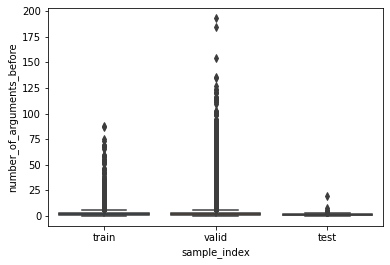

In [41]:
sns.boxplot(x='sample_index', y='number_of_arguments_before',
            data=source_code_data);

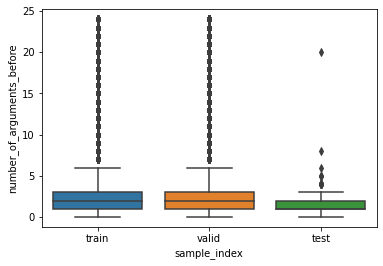

In [42]:
sns.boxplot(x='sample_index', y='number_of_arguments_before',
            data=source_code_data.loc[source_code_data['number_of_arguments_before'] < 25]);

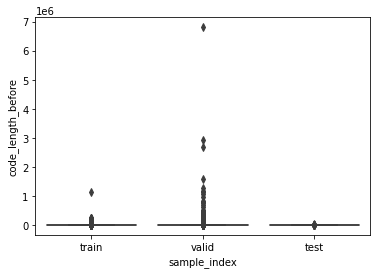

In [36]:
sns.boxplot(x='sample_index', y='code_length_before',
            data=source_code_data);

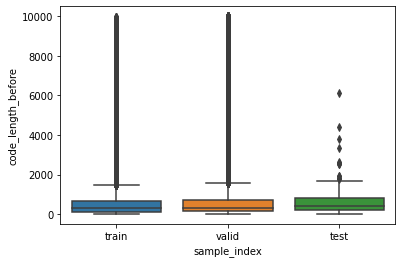

In [37]:
sns.boxplot(x='sample_index', y='code_length_before',
            data=source_code_data.loc[source_code_data['code_length_before'] < 10000]);

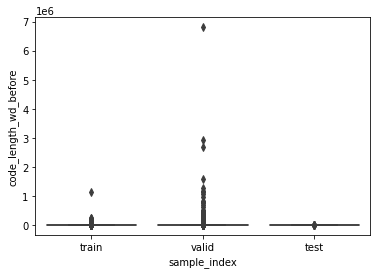

In [38]:
sns.boxplot(x='sample_index', y='code_length_wd_before',
            data=source_code_data);

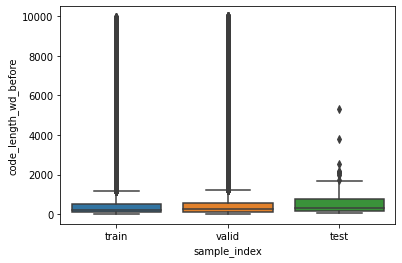

In [39]:
sns.boxplot(x='sample_index', y='code_length_wd_before',
            data=source_code_data.loc[source_code_data['code_length_wd_before'] < 10000]);

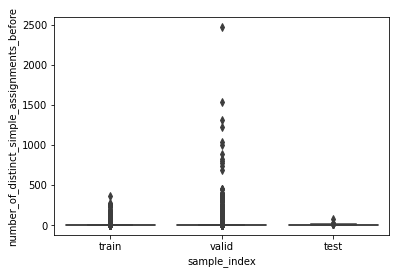

In [53]:
sns.boxplot(x='sample_index', y='number_of_distinct_simple_assignments_before',
            data=source_code_data);

Удалим выбросы:

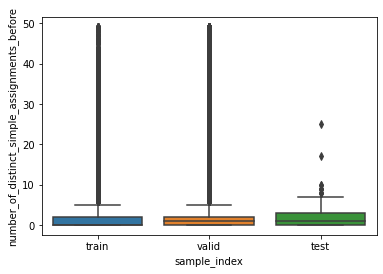

In [62]:
sns.boxplot(x='sample_index', y='number_of_distinct_simple_assignments_before',
            data=source_code_data.loc[source_code_data['number_of_distinct_simple_assignments_before'] < 50]);

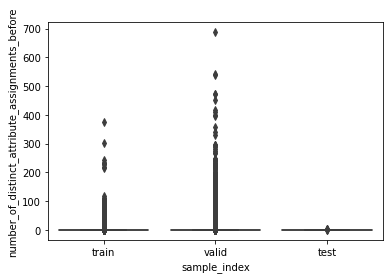

In [56]:
sns.boxplot(x='sample_index', y='number_of_distinct_attribute_assignments_before',
            data=source_code_data);

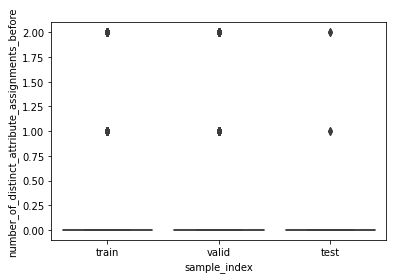

In [65]:
sns.boxplot(x='sample_index', y='number_of_distinct_attribute_assignments_before',
            data=source_code_data.loc[source_code_data['number_of_distinct_attribute_assignments_before'] < 3]);

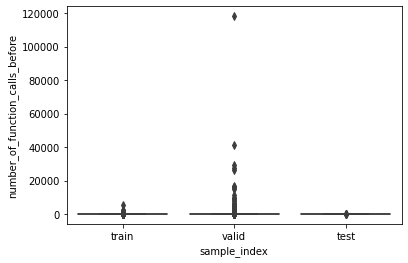

In [77]:
sns.boxplot(x='sample_index', y='number_of_function_calls_before',
            data=source_code_data);

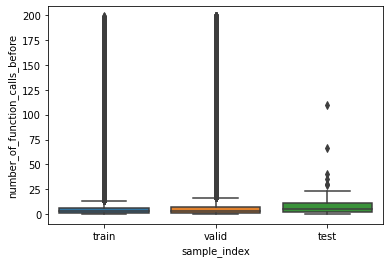

In [78]:
sns.boxplot(x='sample_index', y='number_of_function_calls_before',
            data=source_code_data.loc[source_code_data['number_of_function_calls_before'] < 200]);

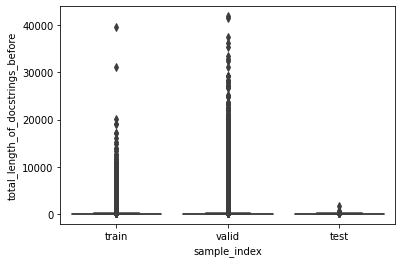

In [58]:
sns.boxplot(x='sample_index', y='total_length_of_docstrings_before',
            data=source_code_data);

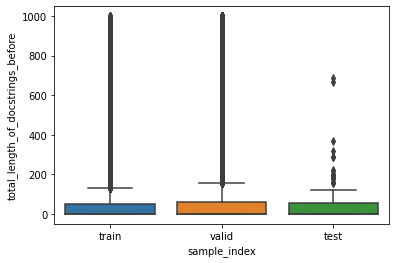

In [59]:
sns.boxplot(x='sample_index', y='total_length_of_docstrings_before',
            data=source_code_data.loc[source_code_data['total_length_of_docstrings_before'] < 1000]);

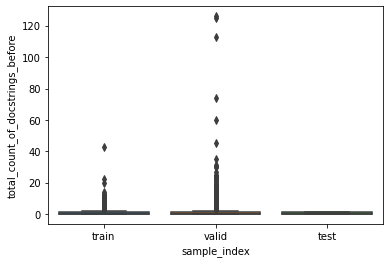

In [60]:
sns.boxplot(x='sample_index', y='total_count_of_docstrings_before',
            data=source_code_data);

Тестовый датасет отличается от обучающего и валидационного бОльшей длиной и количеством докстрингов. По остальным метрикам разница незначительная.

# Краткое сравнение датасетов по кругу репозиториев

Обучающий и тестовый датасет не пересекаются по репозиториям:

In [6]:
set(datasets['train']['repo_name']) & set(datasets['test']['repo_name'])

set()

Репозитории тестового датасета не содержатся среди репозиториев валидационного:

In [10]:
set(datasets['test']['repo_name']) & (set(datasets['valid']['repo_name']))

set()

Распределение сниппетов по репозиториям в обучающем датасете:

In [11]:
df = datasets['train']['repo_name'].value_counts()

for index, count in zip(df.index, df):
    print(index, count) 

cloudera/hue 13660
aliyun/aliyun-openapi-python-sdk 10261
Azure/azure-cli-extensions 9139
dimagi/commcare-hq 7532
XX-net/XX-Net 6384
AppScale/gts 5782
openhatch/oh-mainline 4976
cryoem/eman2 4948
morpheus65535/bazarr 4819
napalm-automation/napalm-yang 4662
Jenyay/outwiker 3444
spack/spack 3298
vivisect/vivisect 3175
openstack/neutron 2697
ms-iot/python 2607
pandas-dev/pandas 2588
tensorflow/models 2403
nikssardana/gdriveTorrent 2370
indico/indico 2316
learningequality/ka-lite 2294
Nuitka/Nuitka 2275
theotherp/nzbhydra 2180
dagster-io/dagster 2092
faucetsdn/ryu 1984
Arelle/Arelle 1942
nerdvegas/rez 1852
makerbot/ReplicatorG 1831
emesene/emesene 1796
superdesk/Live-Blog 1796
spesmilo/electrum 1758
Arx-Game/arxcode 1594
smarthomeNG/plugins 1548
Adapter-Hub/adapter-transformers 1546
sqlalchemy/sqlalchemy 1464
pyrocko/pyrocko 1445
keiffster/program-y 1412
enthought/pyface 1392
gentoo/portage 1379
gramps-project/addons-source 1376
oilshell/oil 1364
PaddlePaddle/models 1359
OpenNetworkingFoun

django-compressor/django-compressor 66
skorokithakis/catt 66
kronenthaler/mod-pbxproj 66
akademikbilisim/ab-kurs-kayit 66
anchore/anchore-cli 66
adobe/brackets-shell 66
chrippa/ds4drv 65
python273/vk_api 65
NVISO-BE/ee-outliers 65
OCA/connector-interfaces 65
FRED-2/Fred2 64
django-mptt/django-mptt 64
trakt/script.trakt 63
amanusk/s-tui 63
urduhack/urduhack 63
jeffreydwalter/arlo 63
jupyter/kernel_gateway 63
llazzaro/django-scheduler 63
xesscorp/KiCost 63
openatx/facebook-wda 63
zigpy/zha-device-handlers 63
UCBerkeleySETI/blimpy 63
DHI-GRAS/terracotta 62
planetfederal/gsconfig 62
joshspeagle/dynesty 62
pandolia/qqbot 62
openworm/owmeta 62
Makeblock-official/mDrawBot 62
agstrike/silverstrike 62
PaddlePaddle/DeepSpeech 62
danobot/entity-controller 61
HoloClean/holoclean 61
CCExtractor/vardbg 61
wooey/Wooey 61
mozilla/telemetry-airflow 61
marcospereirampj/python-keycloak 60
snorkel-team/snorkel-tutorials 60
FriendCode/gittle 60
amadeus4dev/amadeus-python 60
flapjax/FlapJack-Cogs 60
MLB-LED

blue-yonder/devpi-builder 8
jedelman8/pycsco 8
zsiciarz/django-envelope 8
abranhe/allalgorithms-python 8
lyda/misspell-check 8
bigbio/proteomics-metadata-standard 8
TwilioDevEd/automated-survey-django 8
SublimeText/ColdFusion 8
cosme12/SimpleCoin 8
derek-schaefer/django-json-field 7
benjaminp/httpswatch 7
stchris/untangle 7
amueller/scipy_2015_sklearn_tutorial 7
matplotlib/cmocean 7
sampsyo/hass-smartthinq 7
soumith/convnet-benchmarks 7
patrys/httmock 7
kigsmtua/chat 7
fuhrysteve/marshmallow-jsonschema 7
Asabeneh/30-Days-Of-Python 7
closeio/closeio-api 7
alanjds/drf-nested-routers 7
authlib/example-oauth2-server 7
codespell-project/codespell 7
ntoll/uflash 7
Flask-FlatPages/Flask-FlatPages 7
HumanCellAtlas/metadata-schema 7
rsinger86/django-lifecycle 7
guoguo12/billboard-charts 7
beelit94/python-terraform 7
sendgrid/smtpapi-python 7
securing/DumpsterDiver 7
zalando-incubator/docker-locust 7
danfairs/django-lazysignup 7
c4software/python-sitemap 7
wolever/pip2pi 7
xaralis/django-static-

В валидационном:

In [12]:
df = datasets['valid']['repo_name'].value_counts()

for index, count in zip(df.index, df):
    print(index, count) 

Azure/azure-sdk-for-python 88170
oracle/oci-python-sdk 42232
sagemath/sage 40024
tytusdb/tytus 35469
home-assistant/core 28861
cctbx/cctbx_project 26873
tencentyun/scf-demo-repo 25953
cloudera/hue 25299
sympy/sympy 25241
kovidgoyal/calibre 20383
docusign/docusign-python-client 19448
saltstack/salt 18958
aliyun/aliyun-openapi-python-sdk 18938
leo-editor/leo-editor 18735
tribe29/checkmk 18454
Azure/azure-cli-extensions 16774
Toontown-Open-Source-Initiative/Toontown-School-House 16696
anhstudios/swganh 15709
SteveDoyle2/pyNastran 15240
dnanexus/parliament2 14771
plotly/plotly.py 14043
wxWidgets/Phoenix 13965
dimagi/commcare-hq 13886
demisto/content 13746
SickChill/SickChill 13669
galaxyproject/galaxy 12703
gramps-project/gramps 11575
XX-net/XX-Net 11521
openstack/cinder 11201
AppScale/gts 10369
VOLTTRON/volttron 9972
ActiveState/code 9946
edx/edx-platform 9817
tomplus/kubernetes_asyncio 9434
nortikin/sverchok 9381
openhatch/oh-mainline 9116
morpheus65535/bazarr 9098
cryoem/eman2 8967
Awes

kozec/sc-controller 1720
dask/distributed 1717
tensorflow/tfx 1714
brython-dev/brython 1712
svenkreiss/pysparkling 1711
avocado-framework/avocado 1710
TrustyJAID/Trusty-cogs 1709
los-cocos/cocos 1709
sibirrer/lenstronomy 1707
clinton-hall/nzbToMedia 1703
Embroidermodder/Embroidermodder 1702
usnistgov/fipy 1699
brechtm/rinohtype 1697
jesopo/bitbot 1696
silx-kit/pyFAI 1695
SciTools/iris 1695
SFTtech/openage 1694
Instagram/LibCST 1693
zestedesavoir/zds-site 1690
fishtown-analytics/dbt 1687
onaio/onadata 1686
NeuralEnsemble/libNeuroML 1683
arizvisa/ida-minsc 1678
JoelBender/bacpypes 1675
pybamm-team/PyBaMM 1669
OpenKMIP/PyKMIP 1668
julesontheroad/NSC_BUILDER 1668
mnubo/kubernetes-py 1663
mailpile/Mailpile 1663
mitmproxy/mitmproxy 1661
GoogleCloudPlatform/professional-services 1660
qilingframework/qiling 1660
IBM-Security/ibmsecurity 1659
mozilla/zamboni 1655
antismash/antismash 1653
influxdata/influxdb-client-python 1652
F5Networks/f5-common-python 1652
certbot/certbot 1650
ARM-software/wo

edx/edx-enterprise 1075
comic/grand-challenge.org 1074
CastXML/pygccxml 1074
Netflix/security_monkey 1073
XKNX/xknx 1072
Yelp/Tron 1071
lithops-cloud/lithops 1069
evilhero/mylar 1069
CloudBoltSoftware/cloudbolt-forge 1068
tensorflow/estimator 1067
UCL-INGI/INGInious 1067
blaze/blaze 1066
thu-coai/tatk 1066
leapcode/soledad 1066
e2nIEE/pandapower 1065
openstack/rally 1061
davidmalcolm/gcc-python-plugin 1060
CPqD/RouteFlow 1060
benoitc/gaffer 1060
rosedu/wouso 1059
Weasyl/weasyl 1059
DMOJ/online-judge 1058
nmigen/nmigen 1058
TresysTechnology/setools 1058
trezor/trezor-core 1057
Netflix/lemur 1057
google/starthinker 1056
karmab/kcli 1056
Pylons/pyramid 1056
crossbario/crossbar 1054
tanghaibao/goatools 1054
arskom/spyne 1053
jchanvfx/NodeGraphQt 1053
tobspr/RenderPipeline 1052
alan-turing-institute/sktime 1052
nlplab/brat 1052
typemytype/drawbot 1051
Azure/azure-iot-cli-extension 1051
pubnub/python 1049
microsoft/NimbusML 1049
ucloud/uai-sdk 1048
quantopian/zipline 1048
QUVA-Lab/artemis 10

criteo/biggraphite 722
carpentries/amy 721
pywinauto/pywinauto 721
vmware/vsphere-automation-sdk-python 720
mozilla/relman-auto-nag 720
inferno-pytorch/inferno 720
kieranjol/IFIscripts 719
menpo/menpofit 719
IBM/lale 719
python-trio/trio 719
benadida/helios-server 718
OmegaK2/PyPoE 718
postlund/pyatv 718
bugy/script-server 717
Parsl/parsl 717
quantumblacklabs/kedro 717
kubernetes-client/python 716
tensorflow/graphics 715
Pinafore/qb 715
faucetsdn/faucet 715
linkchecker/linkchecker 715
DARK-COBRA/DARKCOBRA 715
pgq/skytools-legacy 715
facebookresearch/pytorch3d 714
maas/python-libmaas 714
stanfordnlp/stanza 714
robotools/defcon 713
curtacircuitos/pcb-tools 712
odoomrp/odoomrp-wip 712
CartoDB/cartoframes 711
greatscottgadgets/luna 711
mozilla/MozDef 710
insarlab/MintPy 710
OCA/l10n-brazil 710
open-power/op-test 709
bashtage/linearmodels 707
ruqqus/ruqqus 707
OpenZWave/python-openzwave 705
ansible-collections/cisco.nxos 704
HenriWahl/Nagstamon 703
OmniaGit/odooplm 703
LonamiWebs/Telethon 7

Blueqat/Blueqat 478
archlinux/archweb 477
usgs/geomag-algorithms 477
mozilla-services/autopush 476
deepgram/kur 476
Yelp/kafka-utils 476
kontron/python-ipmi 475
IdentityPython/pyFF 475
cocotb/cocotb 474
slackapi/bolt-python 474
MarshalX/yandex-music-api 474
pytroll/pyresample 473
jodal/pyspotify 473
pytorch/elastic 473
openwsn-berkeley/openwsn-sw 473
datacenter/cobra 472
subuser-security/subuser 472
aio-libs/aiokafka 472
napalm-automation/napalm 472
openai/gym 472
opps/opps 472
zeek/zeekctl 471
Floobits/floobits-sublime 471
vibora-io/vibora 471
nuxeo/FunkLoad 470
picoCTF/picoCTF 470
chriskiehl/Gooey 470
lovit/soynlp 470
csparpa/pyowm 470
jackfrued/Python-100-Days 470
OpenDroneMap/ODM 470
renatahodovan/fuzzinator 469
losonczylab/sima 469
tensorflow/privacy 469
johntruckenbrodt/pyroSAR 468
alpacahq/pylivetrader 468
python-gino/gino 468
genicam/harvesters 468
chainside/btcpy 467
opsmop/opsmop 467
poljar/weechat-matrix 467
PeteAndersen/swarfarm 467
asreview/asreview 466
ceph/ceph-iscsi 466

hartwork/image-bootstrap 383
pearu/pylibtiff 383
mangaki/mangaki 383
ansible-community/molecule 383
nedbat/coveragepy-bbmirror 382
hashdist/hashdist 382
KeplerGO/lightkurve 382
jodal/comics 381
elParaguayo/RPi-InfoScreen-Kivy 381
okfn-brasil/serenata-de-amor 381
aichallenge/aichallenge 381
myaooo/RNNVis 381
pynamodb/PynamoDB 380
ibm-watson-iot/iot-python 380
coala/coala-bears 380
getsentry/sentry-python 380
bd-j/prospector 379
gocd-contrib/gomatic 379
Azure/azure-uamqp-python 379
nextgenusfs/funannotate 379
mozilla/build-tools 379
pavelliavonau/cmakeconverter 379
sdispater/cleo 379
pixelated/pixelated-user-agent 379
vita-epfl/openpifpaf 378
mar10/wsgidav 378
geopython/pywps 378
eriklindernoren/ML-From-Scratch 378
TileStache/TileStache 378
lmfit/lmfit-py 378
simonw/datasette 378
loli/medpy 378
encode/starlette 378
Teichlab/cellphonedb 377
django-fluent/django-fluent-contents 377
ioos/compliance-checker 377
Azure/sonic-mgmt 377
adityaarakeri/Interview-solved 377
masmu/pulseaudio-dlna 376

aboSamoor/polyglot 307
lanpa/tensorboardX 307
edibledinos/pwnypack 307
ospalh/anki-addons 307
zopefoundation/zope.interface 307
infobloxopen/infoblox-client 307
mosra/m.css 307
tweecode/twine 307
laspy/laspy 307
awslabs/aws-data-wrangler 306
uber/causalml 306
HydraChain/hydrachain 306
open2c/cooler 306
maxpumperla/betago 306
mrf345/FQM 306
deeptools/HiCExplorer 306
NYUCCL/psiTurk 306
fedora-infra/fas 305
sooftware/KoSpeech 305
capitalone/giraffez 305
healthsites/healthsites 305
catkin/catkin_tools 305
micahflee/onionshare 305
iotaledger/iota.py 304
clearlinux/autospec 304
avanzosc/odoo-addons 304
deis/controller 304
jdb78/pytorch-forecasting 304
codelucas/newspaper 303
opencobra/optlang 303
pyinvoke/invoke 303
MoveAngel/One4uBot 303
devstructure/blueprint 303
acl-org/acl-anthology 302
adap/flower 302
kartograph/kartograph.py 302
RhinoSecurityLabs/pacu 302
QTodoTxt/QTodoTxt 302
Zulko/moviepy 302
andymccurdy/redis-py 302
wangzheng0822/algo 302
google-research/torchsde 301
hansec/fortran-

vortex-exoplanet/VIP 235
tensorflow/text 235
linux-system-roles/network 235
internetarchive/warcprox 235
python-amazon-mws/python-amazon-mws 234
pydata/patsy 234
stripe/stripe-python 234
Azure/azure-data-lake-store-python 234
fedora-infra/fedmsg 234
google/cloud-forensics-utils 234
snorkel-team/snorkel 234
DigitalSlideArchive/HistomicsTK 233
amet/script.xbmc.subtitles 233
OpenAgricultureFoundation/openag_brain 233
SpiderClub/weibospider 233
sde1000/python-dali 233
eucalyptus/euca2ools 233
tableau/TabPy 233
titoBouzout/SideBarEnhancements 233
safe-graph/DGFraud 233
fooof-tools/fooof 232
WordOps/WordOps 232
alexgolec/tda-api 232
aws/aws-parallelcluster-node 232
hamcrest/PyHamcrest 232
novoid/Memacs 232
AB-CE/abce 232
Cloud-CV/Fabrik 232
mysociety/sayit 232
mokemokechicken/reversi-alpha-zero 232
roddhjav/pass-import 232
GoogleCloudPlatform/marketplace-k8s-app-tools 232
LPgenerator/django-db-mailer 232
ebroecker/canmatrix 232
haotianteng/Chiron 232
danilop/yas3fs 232
kymatio/kymatio 232
jf

ProtonVPN/linux-gui 177
ankitdobhal/Awesome-Python-Scripts 177
robshakir/pyangbind 177
lanmaster53/recon-ng-marketplace 177
jmathai/elodie 177
nestorsalceda/mamba 177
joshiemoore/snakeware 177
RasaHQ/rasa-sdk 177
athphane/userbot 177
redhat-cip/hardware 177
ghtmtt/DataPlotly 177
rwl/PYPOWER 177
MapStory/mapstory 177
MolSSI/QCEngine 177
PayloadSecurity/VxAPI 177
nasa-jpl/osr-rover-code 177
tomasbedrich/pycaching 177
Doist/todoist-python 176
trbs/bucky 176
angr/rex 176
cfpb/collab 176
executablebooks/MyST-Parser 176
Graey/pythoncharmers 176
JohnMaguire/Cardinal 176
mpastell/Pweave 176
bastibe/SoundCard 176
encode/uvicorn 176
isaacg1/pyth 176
aestrivex/bctpy 176
quick2wire/quick2wire-python-api 176
django-import-export/django-import-export 175
akalongman/sublimetext-codeformatter 175
chubin/wttr.in 175
equinor/webviz-config 175
cadCAD-org/cadCAD 175
gprMax/gprMax 175
django-json-api/django-rest-framework-json-api 175
r4fek/django-cassandra-engine 175
honeycombio/beeline-python 175
kakwa/l

jeffreydwalter/arlo 140
PaloAltoNetworks/ansible-pan 140
anchore/anchore-cli 139
bluppfisk/coinprice-indicator 139
Shopify/pyactiveresource 139
openwsn-berkeley/coap 139
hydro-project/cloudburst 139
nsqio/pynsq 139
Drakkar-Software/OctoBot 139
sanger-pathogens/circlator 139
sparklingpandas/sparklingpandas 139
dsuch/pymqi 139
dnouri/nolearn 139
deepjyoti30/ytmdl 139
Tianxiaomo/pytorch-YOLOv4 139
solrcloudpy/solrcloudpy 139
eriklindernoren/Keras-GAN 139
CleanCut/green 139
twitterdev/twitter-python-ads-sdk 139
bear/python-twitter 139
summanlp/textrank 139
zigpy/zha-device-handlers 138
tildaslash/RatticWeb 138
holoviz/hvplot 138
dome9/cloud-bots 138
pinterest/pymemcache 138
quarnster/SublimeGDB 138
fritzlabs/fritz-models 138
plivo/plivoframework 138
maxme/bitcoin-arbitrage 138
intuit/fawkes 138
davidhalter/parso 138
bazelbuild/continuous-integration 138
Azure/azureml-examples 138
divio/aldryn-newsblog 138
grassmunk/Chicago95 138
OpenELEC/unofficial-addons 137
aaronjanse/asciidots 137
robwe

jazzband/django-axes 104
djangonauts/django-hstore 104
tmux-python/libtmux 104
Grokzen/redis-py-cluster 104
uber/rides-python-sdk 104
kelproject/pykube 104
LeeKamentsky/python-javabridge 104
pyudev/pyudev 104
rapidsai/ucx-py 104
Jahaja/psdash 104
jiaweihli/manga_downloader 104
heynemann/pyvows 104
newsdev/elex 104
ckan/ckanext-scheming 104
hyperledger-archives/indy-agent 103
RyanBalfanz/django-sendgrid 103
zqfang/GSEApy 103
denyhosts/denyhosts 103
owncloud/pyocclient 103
ivelum/djangoql 103
devopshq/tfs 103
free5gmano/free5gmano 103
tilezen/vector-datasource 103
bronto/javasphinx 103
mcedit/pymclevel 103
lowerquality/gentle 103
im85288/service.upnext 103
bstrdsmkr/1Channel 103
scikit-signal/tftb 103
mtth/hdfs 103
aceisace/Inkycal 103
TheHive-Project/TheHive4py 103
xMistt/fortnitepy-bot 103
DataDog/datadog-serverless-functions 103
rubenvereecken/pokemongo-api 103
itpp-labs/misc-addons 102
guilhermechapiewski/simple-db-migrate 102
ezhov-evgeny/webdav-client-python-3 102
bnajafi/Scientifi

aeroo/aeroo_reports 84
evildmp/BrachioGraph 84
C-Otto/rebalance-lnd 84
callowayproject/django-categories 84
glm-tools/pyglmnet 84
allenai/scispacy 84
phageParser/phageParser 84
PyCQA/pylint-django 84
danielfrg/s3contents 84
dolphin-emu/www 84
jschrewe/django-mongodbforms 83
knownsec/Pocsuite 83
matrix-org/sygnal 83
bmcfee/muda 83
jupyterhub/kubespawner 83
guokr/swagger-py-codegen 83
qca/boardfarm 83
django-mptt/django-mptt 83
ztgrace/changeme 83
laincloud/lain 83
nats-io/nats.py2 83
kblin/ncbi-genome-download 83
Parallels/artifactory 83
niwinz/django-jinja 83
gvalkov/python-evdev 83
danobot/entity-controller 83
Yelp/beans 83
Devoxin/Lavalink.py 83
damnever/pigar 83
python-metar/python-metar 83
hulu/restfulgit 83
yunojuno/elasticsearch-django 83
WhyNotHugo/python-barcode 83
alexanderjulo/wiki 83
Kenza-AI/sagify 83
encode/apistar 83
wuub/rxv 83
recursecenter/blaggregator 83
SmileyChris/easy-thumbnails 82
c-w/gutenberg 82
opentok/Opentok-Python-SDK 82
ingadhoc/product 82
bitextor/bitextor

PX4/pyulog 65
tfgm/sbedecoder 65
openwisp/django-freeradius 65
LordAmit/Brightness 65
qubvel/segmentation_models 65
rhblind/drf-haystack 65
eepMoody/open5e-api 65
Yelp/venv-update 65
graphite-project/ceres 65
richardpenman/whois 65
plaid/plaid-python 65
caffeinehit/django-oauth2-provider 65
dbcli/pgspecial 65
dbrgn/RPLCD 65
rackerlabs/python-clouddns 65
pypa/pypi-legacy 65
timgrossmann/instagram-profilecrawl 65
aspiers/git-deps 65
yhenon/pytorch-retinanet 65
cloudnull/turbolift 65
bmuller/kademlia 65
django-cache-machine/django-cache-machine 65
nashory/pggan-pytorch 65
blockchain-certificates/cert-tools 65
sumerc/yappi 65
attardi/wikiextractor 65
awslabs/aws-security-benchmark 65
Supervisor/superlance 65
UNFmontreal/Dcm2Bids 65
marshmallow-code/marshmallow-sqlalchemy 64
model-bakers/model_bakery 64
scanapi/scanapi 64
xoanmi/ansible-module-infoblox 64
ColtonProvias/sqlalchemy-jsonapi 64
tonysimpson/nanomsg-python 64
django-statsd/django-statsd 64
pingcap/tidb-ansible 64
bulik/ldsc 64
sc

d2l-ai/d2l-tvm 47
Tivix/django-cron 47
jupyter/jupyter-sphinx 47
Mimino666/langdetect 47
omab/django-social-auth 47
translate/amagama 47
asciimoo/drawille 47
python/bedevere 47
PyCQA/pycodestyle 47
ghantoos/lshell 47
soynatan/django-easy-audit 47
simonpercivall/astunparse 47
scrapy/w3lib 47
AngellusMortis/django_microsoft_auth 47
jamesturk/validictory 47
theskumar/python-dotenv 47
mfenniak/pg8000 47
OCA/vertical-association 47
famavott/osint-scraper 47
WoLpH/python-statsd 47
goldsmith/Wikipedia 47
castorini/BuboQA 47
phillipberndt/autorandr 47
zeekay/flask-uwsgi-websocket 47
Pylons/pyramid_jinja2 47
arokem/python-matlab-bridge 47
karpathy/arxiv-sanity-preserver 47
beetbox/audioread 47
heroku/salesforce-bulk 47
sibson/redbeat 47
algorithmic-music-exploration/amen 47
voronind/vk 46
gee-community/qgis-earthengine-plugin 46
swcarpentry/hpc-novice 46
inveniosoftware/dictdiffer 46
jupyterhub/batchspawner 46
corpetty/py-etherscan-api 46
ros/xacro 46
IBM/MAX-Image-Caption-Generator 46
FreeCAD/

EaW-Team/equestria_dev 36
jazzband/jsonmodels 36
devopsloft/devopsloft 36
snobear/ezmomi 36
andialbrecht/sqlparse 36
swapagarwal/JARVIS-on-Messenger 36
pexpect/ptyprocess 36
autotest/virt-test 36
perrygeo/python-rasterstats 36
git-big-picture/git-big-picture 36
OCA/odoo-module-migrator 36
antonagestam/collectfast 36
OrkoHunter/keep 36
hynek/argon2-cffi 36
makinacorpus/django-safedelete 36
vishr/local-history 36
andrix/python-snappy 36
django-recurrence/django-recurrence 36
ethereum/ethereum-buildbot 36
ryancox/motionless 36
philippnormann/nvidia-sniper 36
stephenmcd/django-forms-builder 36
bebraw/pypandoc 36
bastianraschke/pyfingerprint 36
mixpanel/mixpanel-python 36
miracle2k/django-assets 36
GeospatialPython/pyshp 36
solarwinds/orionsdk-python 36
LuminosoInsight/wordfreq 36
Yelp/swagger_spec_validator 36
msiemens/PyGitUp 36
JustGlowing/minisom 36
Neo23x0/Loki 36
msikma/pokesprite 36
spry-group/python-vultr 36
redhat-cop/openshift-toolkit 36
kivy/pyobjus 36
mirumee/django-prices 36
ck

MUSoC/Visualization-of-popular-algorithms-in-Python 26
psychrometrics/psychrolib 26
balenalabs/balena-sense 26
t0xic0der/sanctuary-zero 26
db-art/mysql-statsd 26
xmunoz/sodapy 26
robmarkcole/Hue-sensors-HASS 26
ddavid/fsoco 26
elegant-scipy/elegant-scipy 26
wbond/asn1crypto 26
malthe/pq 26
dhatim/python-license-check 26
sontek/pyramid_webassets 26
jsocol/pystatsd 26
vvangelovski/django-audit-log 26
theforeman/foreman_ansible_inventory 26
GrahamDumpleton/wrapt 26
sphinx-contrib/spelling 26
Kennedy-Lab-UW/Duplex-Sequencing 26
mnielsen/neural-networks-and-deep-learning 26
ua-parser/uap-python 26
nephila/djangocms-installer 26
JazzCore/python-pdfkit 26
jadijadi/sms_serial_verification 26
gmusicproxy/gmusicproxy 26
datamade/census 26
MatMaul/pynetgear 26
jwkanggist/EveryBodyTensorFlow 25
bruth/django-tracking2 25
icloud-photos-downloader/icloud_photos_downloader 25
robotpy/robotpy-wpilib 25
dcramer/mock-django 25
ulif/diceware 25
mirumee/google-i18n-address 25
eracle/linkedin 25
iheanyi/ban

Xonshiz/comic-dl 15
platformsh/platformsh-docs 15
aio-libs/create-aio-app 15
Fueled/django-init 15
davedash/django-fixture-magic 15
sendgrid/smtpapi-python 15
quandyfactory/dicttoxml 15
awslabs/aws-config-engine-for-compliance-as-code 15
yann2192/pyelliptic 15
zasdfgbnm/TorchSnooper 15
n0bel/PiClock 15
mewwts/addict 15
wolever/pip2pi 15
bhattsameer/Bombers 15
ezyang/git-ftp 15
mobeigi/fb2cal 15
controlm/automation-api-quickstart 15
freeCodeCamp/python-coding-challenges 15
jpulgarin/django-tokenapi 15
toml-lang/toml 15
I-am-Erk/CDDA-Tilesets 15
Kapeli/Dash-User-Contributions 15
hellysmile/fake-useragent 15
OpenSimulationInterface/open-simulation-interface 15
prymitive/bootstrap-breadcrumbs 15
hacktoon/1001 15
jegesh/python-sqs-listener 15
ansibleplaybookbundle/ansible-playbook-bundle 15
jedelman8/pycsco 15
huwwp/cryptop 15
sontek/pyramid_celery 15
conan-community/conan-opencv 15
tensorflow/fairness-indicators 15
django-cms/djangocms-googlemap 15
RealmTeam/django-rest-framework-social-oa

iearn-finance/yearn-vaults 3
HackerCollective/resources 3
flareteam/flare-game 3
oVirt/ovirt-ansible-vm-infra 3
swcarpentry/sql-novice-survey 3
me-shaon/bangla-programming-resources 3
wce-codepals/hacktoberfest-projecteuler 3
ansible-lockdown/RHEL7-CIS 3
ethereum/eth2.0-pm 3
citation-style-language/schema 3
amitt001/delegator.py 3
django-compressor/django-appconf 3
jnk22/kodinerds-iptv 3
kristovatlas/osx-config-check 3
Unidata/cftime 3
pyladies/pyladies-kit 3
openwisp/openwisp2-docs 3
MolSSI/QCSchema 3
OpenGenus/vidsum 3
SublimeLinter/SublimeLinter-flake8 3
villasv/aws-airflow-stack 3
appcelerator-archive/ti.flurry 3
aws-quickstart/quickstart-git2s3 3
bieniu/ha-shellies-discovery 3
danimtb/dasshio 3
WCRP-CMIP/CMIP6_CVs 3
googlegenomics/pipelines-api-examples 3
LegacyXperia/local_manifests 3
Vonng/ddia 3
noahc3/Homebrew-Guide 3
chenjiandongx/weekly-email-subscribe 3
jacobian/djangobook.com 2
jsocol/jingo-minify 2
100DaysOfCloud/100DaysOfCloudIdeas 2
OpenNebula/docs 2
fabiocaccamo/django

В тестовом:

In [13]:
df = datasets['test']['repo_name'].value_counts()

for index, count in zip(df.index, df):
    print(index, count) 

graalvm/mx 12
andikleen/pmu-tools 9
googlefonts/noto-emoji 6
alexbers/mtprotoproxy 6
emscripten-core/emsdk 5
hugsy/gef 5
Bob123a1/CDNSP-GUI 4
ClangBuiltLinux/tc-build 4
animate1978/MB-Lab 4
hhatto/autopep8 3
GlacierProtocol/GlacierProtocol 3
Charcoal-SE/SmokeDetector 3
21isenough/LightningATM 3
belguawhale/Discord-Werewolf 3
DestructHub/ProjectEuler 3
autocracy/python-ipy 2
IgnoredAmbience/yahoo-group-archiver 2
darkoperator/dnsrecon 2
GoogleChrome/chromium-dashboard 2
edwardgeorge/virtualenv-clone 2
georgewhewell/undervolt 2
DataDog/dd-agent 2
ekalinin/nodeenv 2
aio-libs/aioftp 2
gregzaal/Auto-Voice-Channels 2
facebookarchive/python-instagram 2
frej/fast-export 2
containers/podman-compose 2
google-research/bert 2
ArduPilot/pymavlink 2
Felienne/hedy 2
elyra-ai/elyra 2
aziz/PlainTasks 2
cfpb/regulations-parser 1
grow/grow 1
condemil/Gist 1
AmazingAmpharos/OoT-Randomizer 1
bchew/dynamodump 1
Bitmessage/PyBitmessage 1
0x5e/wechat-deleted-friends 1
erpalma/throttled 1
graphite-project/whis